In [456]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [356]:
%matplotlib inline

In [360]:
import pandas as pd
import numpy as np
import os
import googlemaps
from datetime import datetime
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
import pickle
import matplotlib.pyplot as plt
GOOGLE_API_KEY=os.environ['GOOGLE_API_KEY']
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from scipy.stats import kurtosis 
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples, silhouette_score
np.random.seed(1234)

In [210]:
PATH = '/Users/michaelfutch/gtu/ml/project1/'
FILE = PATH + 'data/data.csv'
rebuild = False # set to True if rebuilding dataset (cost $ to geocode)
# data at: https://www.kaggle.com/datasets/harlfoxem/housesalesprediction

if rebuild:
    # read data
    dat = pd.read_csv(FILE)
    
    # cleaning steps
    dat['address'] = dat[['street','city','statezip']].agg(' '.join, axis=1) 
    dat['date'] = pd.to_datetime(dat['date'])
    dat['day'] = ((dat['date'] - dat['date'].min()) / np.timedelta64(1,'D')).astype(int)

    # get lat/lon from google maps api
    gmaps = googlemaps.Client(key=GOOGLE_API_KEY)
    addresses = list(dat['address'])
    lat_lon = np.empty((len(addresses),2))
    neighborhood = []
    ct = 0
    for address in addresses:
        geocode_result = gmaps.geocode(address)
        lat_lon[ct] = np.array([[geocode_result[0]['geometry']['location']['lat'],geocode_result[0]['geometry']['location']['lng']]])
        ct += 1
        
        
    X_full = dat[['day', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
           'floors', 'waterfront', 'view', 'condition', 'sqft_above',
           'sqft_basement', 'yr_built', 'yr_renovated']].to_numpy()
    X_full = np.append(X_full, lat_lon, axis=1)
    y_full = np.array(dat.price)

    

    # split data
    X, X_val, y, y_val = train_test_split(X_full, y_full, test_size = 0.33, random_state = 2072020)
    
    # save data to avoid re-geocoding
    with open(PATH + 'data/pickled', 'wb') as f:
        pickle.dump((X, X_val, y, y_val, dat, lat_lon), file=f)

else:
    # load saved data if not rebuilding
    with open(PATH + 'data/pickled', 'rb') as f:
        X, X_val, y, y_val, dat, lat_lon = pickle.load(f)
        
        
        ## Trim extreme tails
        pct2, pct98 = np.percentile(y,[2,98])
        X = X[(y >= pct2) & (y <= pct98)]
        y = y[(y >= pct2) & (y <= pct98)]
        X_val = X_val[(y_val >= pct2) & (y_val <= pct98)]
        y_val = y_val[(y_val >= pct2) & (y_val <= pct98)]

In [211]:
# Save regression problem as var 1
X1, X1_val, y1, y1_val = X.copy(), X_val.copy(), y.copy(), y_val.copy()

In [212]:
# read in classification problem
PATH = '/Users/michaelfutch/gtu/ml/project1/'
FILE = PATH + 'data/healthcare-dataset-stroke-data.csv'

dat = pd.read_csv(FILE)

# convert categorical to dummies
cats = ['gender','ever_married','work_type','Residence_type','smoking_status']
for v in cats:
    dat = pd.concat([dat,pd.get_dummies(dat[v], prefix=v)], axis = 1)

x_cols = [
 'age',
 'hypertension',
 'heart_disease',
 'avg_glucose_level',
 'bmi',
 'gender_Female',
 'gender_Other',
 'ever_married_Yes',
 'work_type_Govt_job',
 'work_type_Private',
 'work_type_Self-employed',
 'work_type_children',
 'Residence_type_Urban',
 'smoking_status_formerly smoked',
 'smoking_status_never smoked',
 'smoking_status_smokes']

X_full = dat[x_cols].to_numpy()
y_full = np.array(dat.stroke)

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

### Holdout validation data
X2, X2_val, y2, y2_val = train_test_split(X_full, y_full, test_size = 0.33, random_state = 2072020)

## Impute missing values 
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(X2)
IterativeImputer(random_state=0)
X2 = imp.transform(X2)
X2_val = imp.transform(X2_val)



# # Recombine train/test into single batch
X1, y1 = np.concatenate([X1, X1_val]), np.concatenate([y1, y1_val])
X2, y2 = np.concatenate([X2, X2_val]), np.concatenate([y2, y2_val])

scaler1 = StandardScaler() 
scaler1.fit(X1)
X1_scal = scaler1.transform(X1)

scaler2 = StandardScaler() 
scaler2.fit(X2)
X2_scal = scaler2.transform(X2)



In [213]:
x1_cols = ['day', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
           'floors', 'waterfront', 'view', 'condition', 'sqft_above',
           'sqft_basement', 'yr_built', 'yr_renovated','lat','lon']

In [214]:
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.mixture import GaussianMixture as GM

array([[ 1.31158307, -0.42936969, -0.17992061, ...,  1.22551988,
         0.30017596,  0.0983678 ],
       [ 1.56536677,  0.69877813,  0.50008702, ...,  1.18771585,
         1.42266193, -1.01127058],
       [-1.27701064,  1.82692595, -0.51992442, ...,  1.22347642,
        -0.42728831, -0.79071549],
       ...,
       [-0.9724702 , -0.42936969, -0.17992061, ..., -0.8230496 ,
         0.85926551, -0.64784888],
       [ 0.09342133, -0.42936969, -0.51992442, ...,  1.22449815,
         0.19790716,  0.42253461],
       [-1.27701064, -0.42936969, -1.53993587, ...,  1.20202008,
        -2.1895796 , -0.39900053]])

In [893]:
def silplot(X, algo, dataset=None, exp="0"):
    '''Adapated from https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#'''
    
    if algo == 'kmeans':
        ALGO = KMeans
    elif algo == 'gmm':
        ALGO = GM
    
    range_n_clusters = list(range(2,15))
    
    top_cluster = -1
    best_sil = -2
    scores = []
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1) = plt.subplots(1, 1)
        fig.set_size_inches(10, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 0.5])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = ALGO(n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("Using", algo, "on dataset", dataset,
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )
        if silhouette_avg > best_sil:
            top_cluster = n_clusters
            best_sil = silhouette_avg

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
#         ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])



        # Labeling the clusters
        if algo == 'kmeans':
            centers = clusterer.cluster_centers_
        elif algo == 'gmm':
            centers = clusterer.means_

        plt.suptitle(
            "Silhouette analysis for " + algo + " clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )

        plt.savefig("./paper/figures/silplot_" + dataset.replace(" ", "").lower() + algo + "_" + str(n_clusters) +
                    "_exp_" + str(exp) + ".png", format = 'png', transparent=True)
    
        scores.append(silhouette_avg)
    plt.show()
    return scores, top_cluster
    


Using kmeans on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.19498076743814072
Using kmeans on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.18161472910378904
Using kmeans on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.18301716011297048
Using kmeans on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.14779741399215876
Using kmeans on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.14738308777691106
Using kmeans on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.15121880136685273
Using kmeans on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.14677787819298718
Using kmeans on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.14475432469790173
Using kmeans on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.1420191946188657
Using kmea

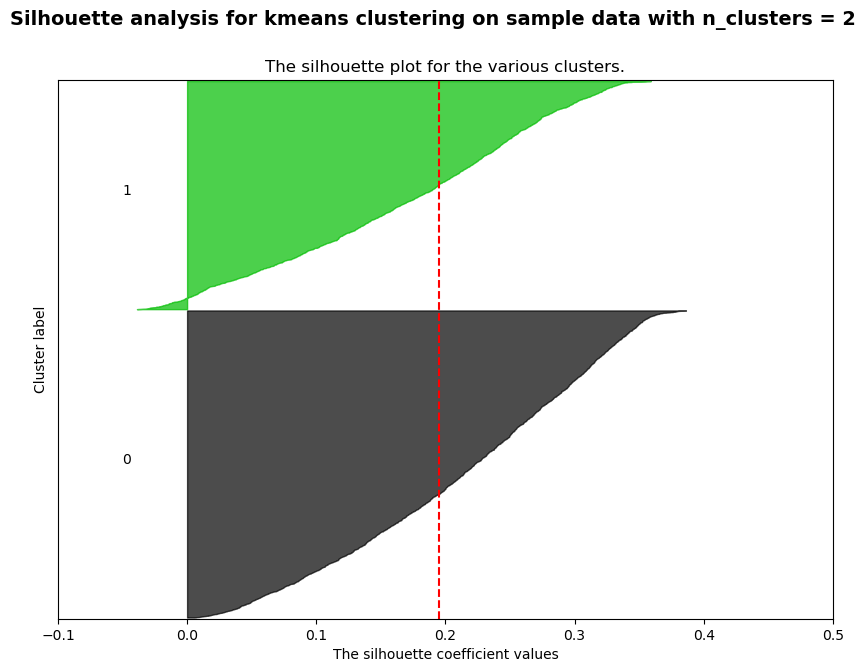

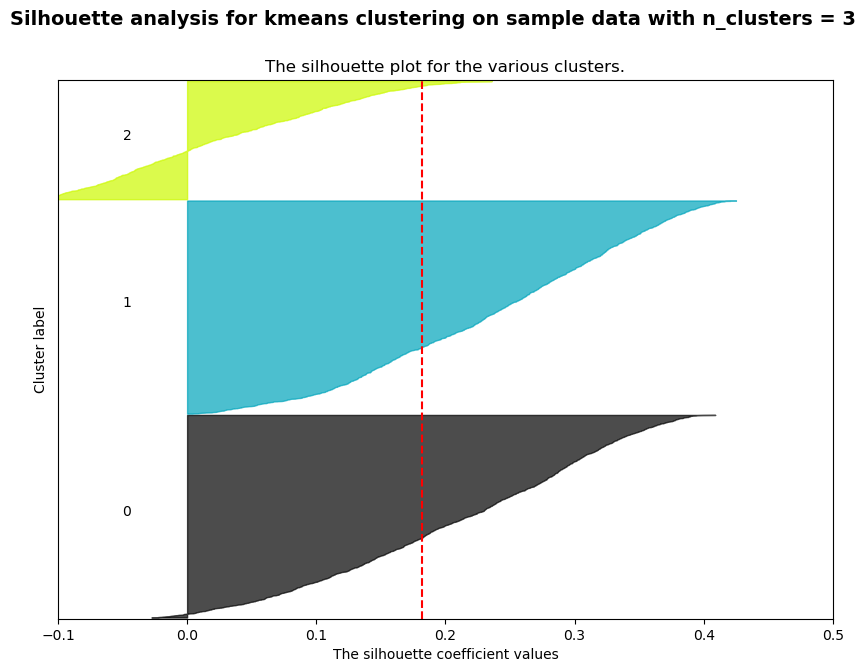

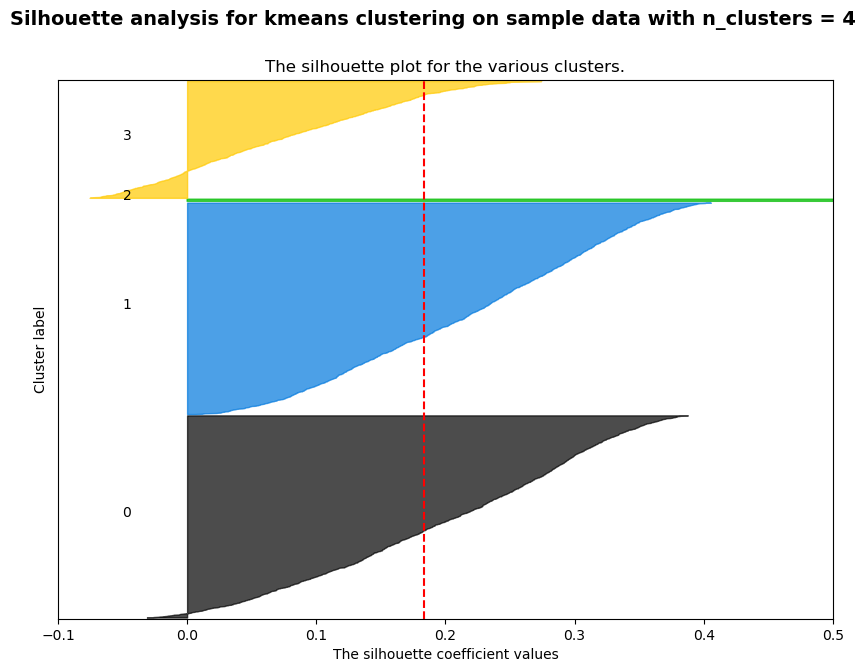

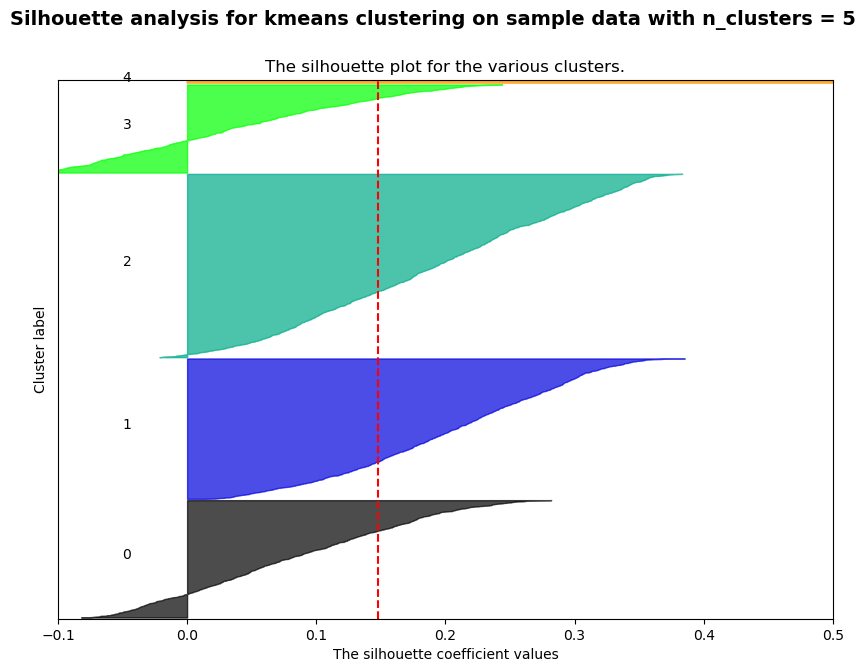

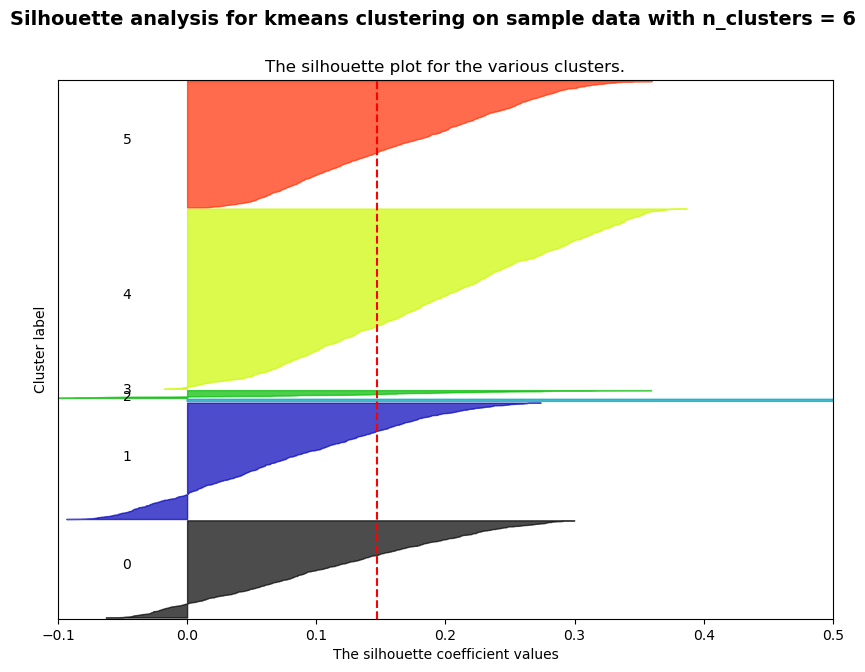

...

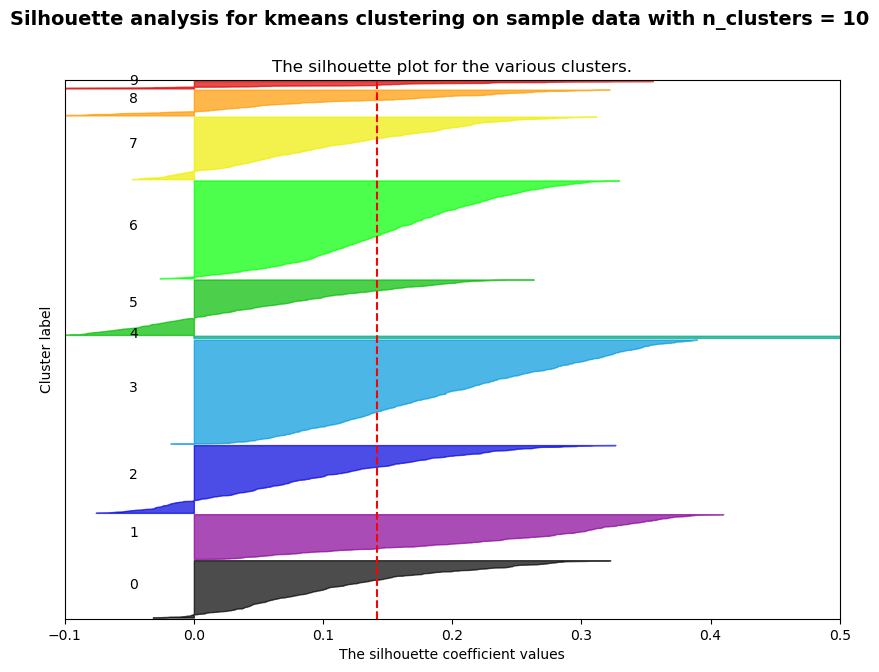

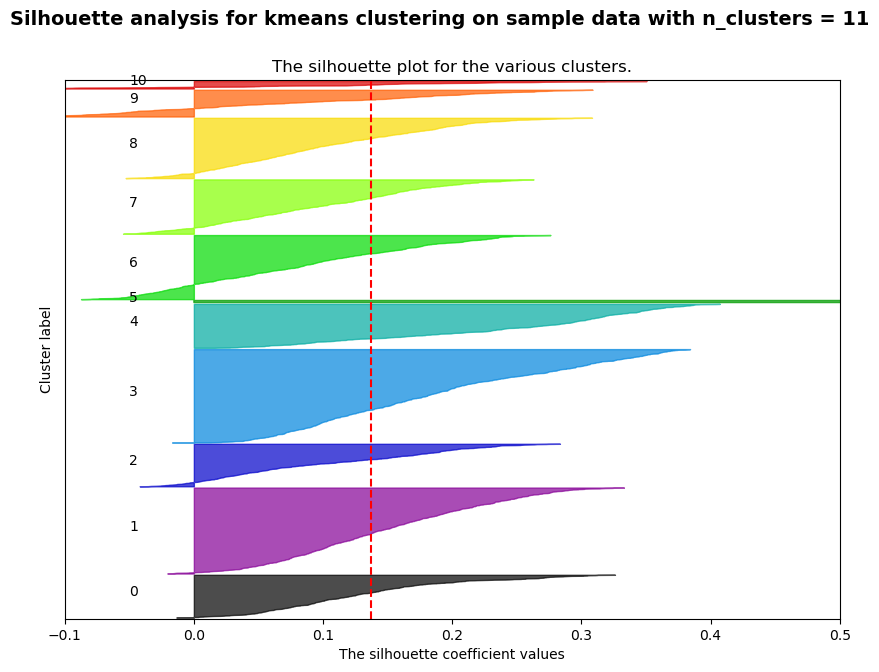

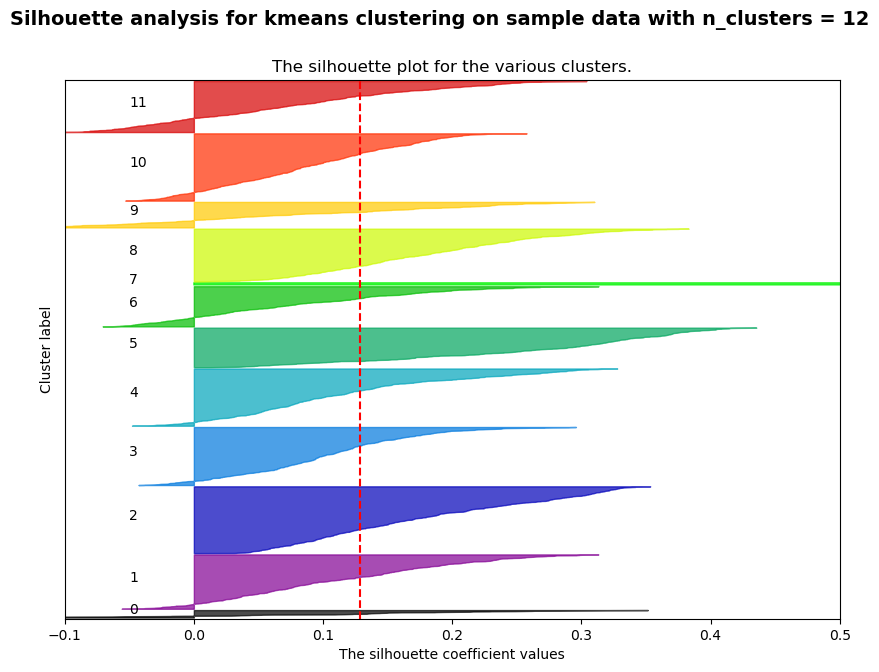

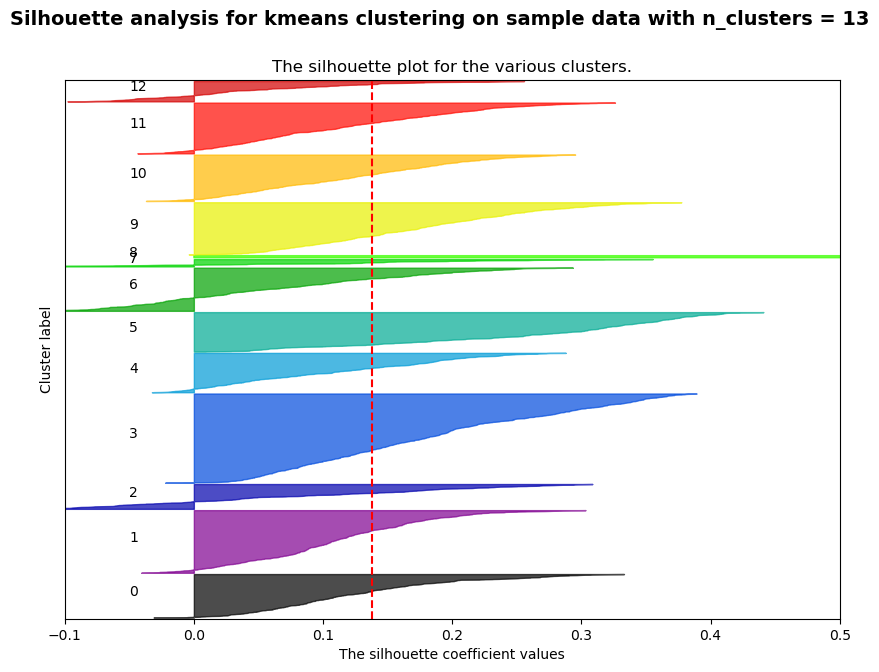

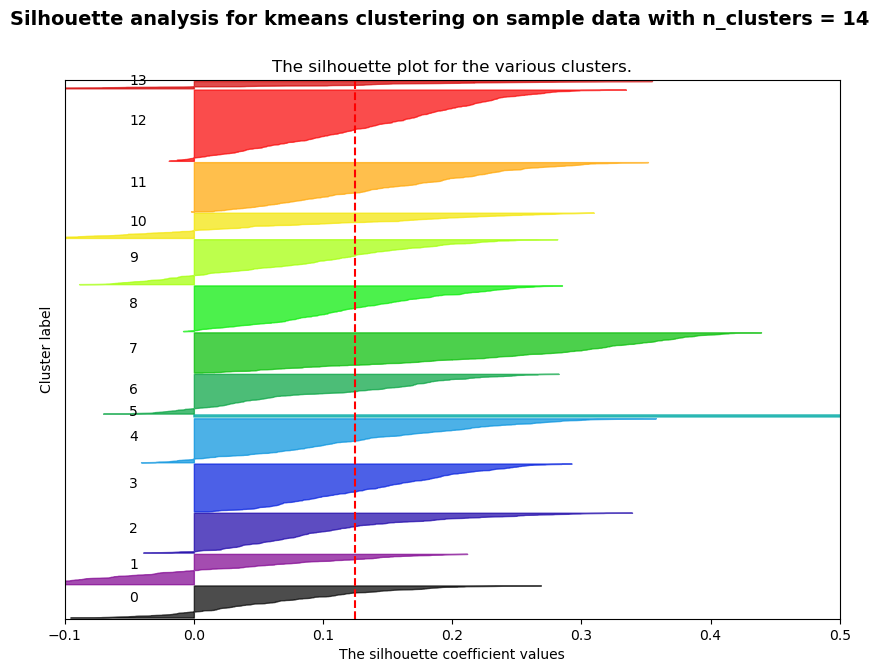

Using kmeans on dataset Stroke Incidence For n_clusters = 2 The average silhouette_score is : 0.20044031317085217
Using kmeans on dataset Stroke Incidence For n_clusters = 3 The average silhouette_score is : 0.21045049654271097
Using kmeans on dataset Stroke Incidence For n_clusters = 4 The average silhouette_score is : 0.252335569966051
Using kmeans on dataset Stroke Incidence For n_clusters = 5 The average silhouette_score is : 0.20918148497294572
Using kmeans on dataset Stroke Incidence For n_clusters = 6 The average silhouette_score is : 0.22183506206078807
Using kmeans on dataset Stroke Incidence For n_clusters = 7 The average silhouette_score is : 0.2590236854295492
Using kmeans on dataset Stroke Incidence For n_clusters = 8 The average silhouette_score is : 0.2127735070203822
Using kmeans on dataset Stroke Incidence For n_clusters = 9 The average silhouette_score is : 0.2298397808881965
Using kmeans on dataset Stroke Incidence For n_clusters = 10 The average silhouette_score is 

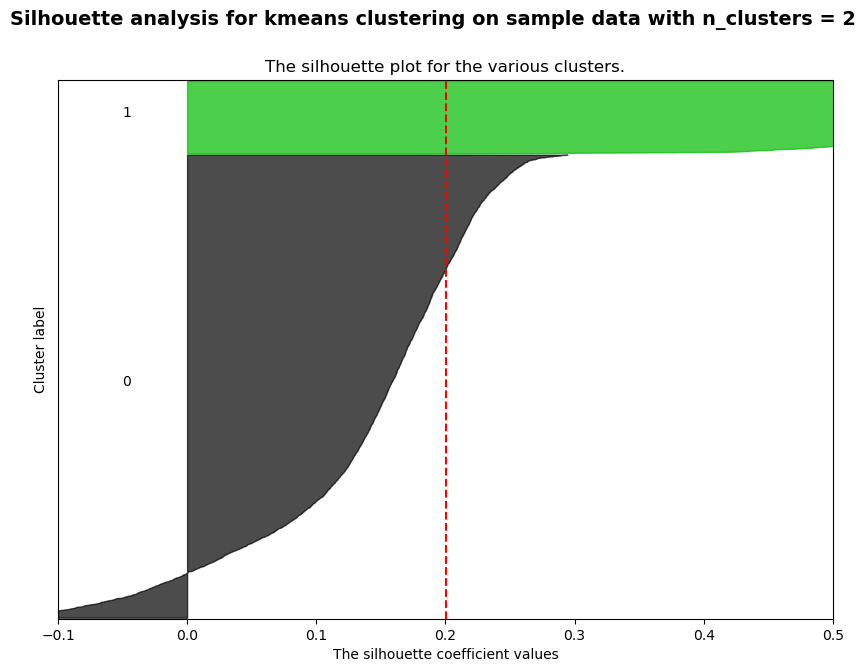

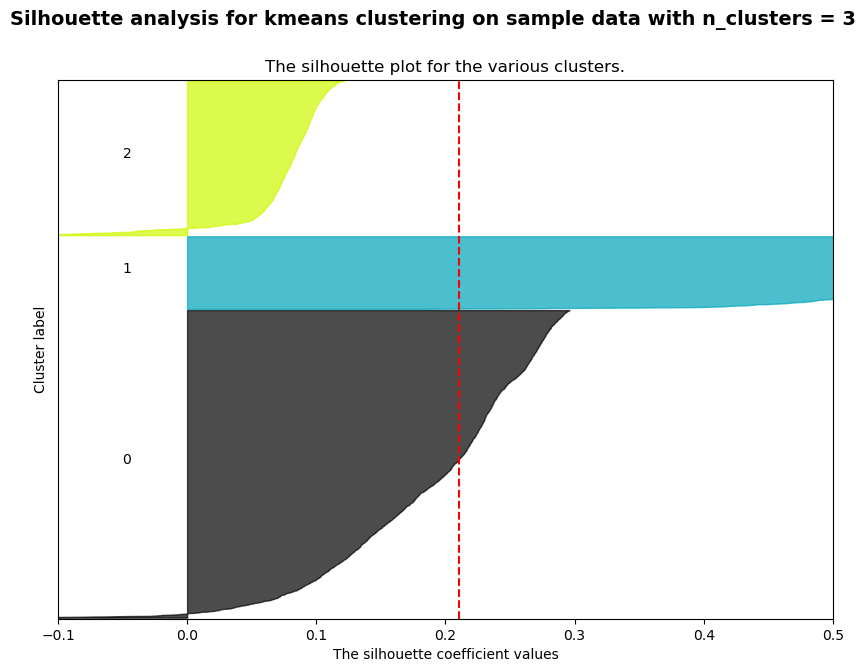

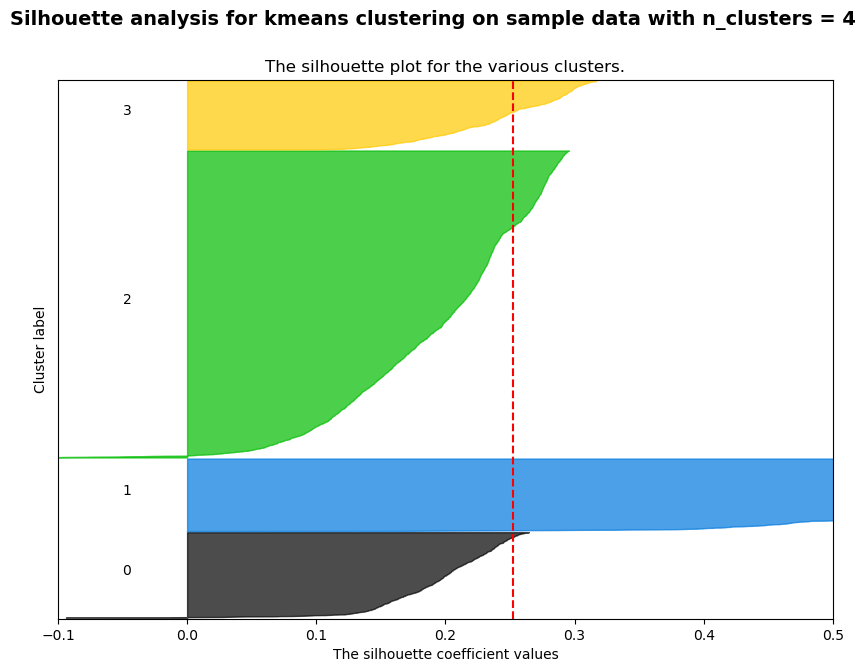

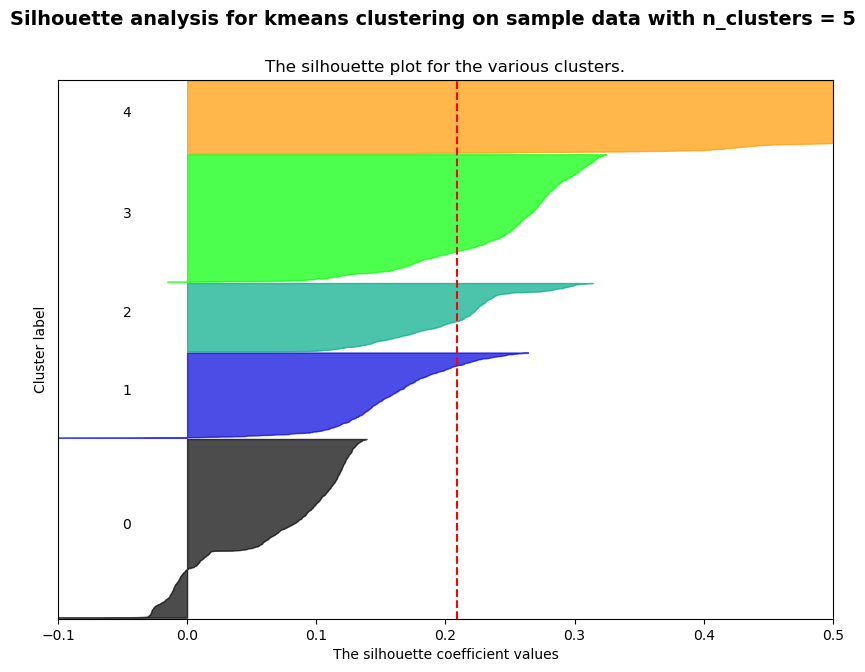

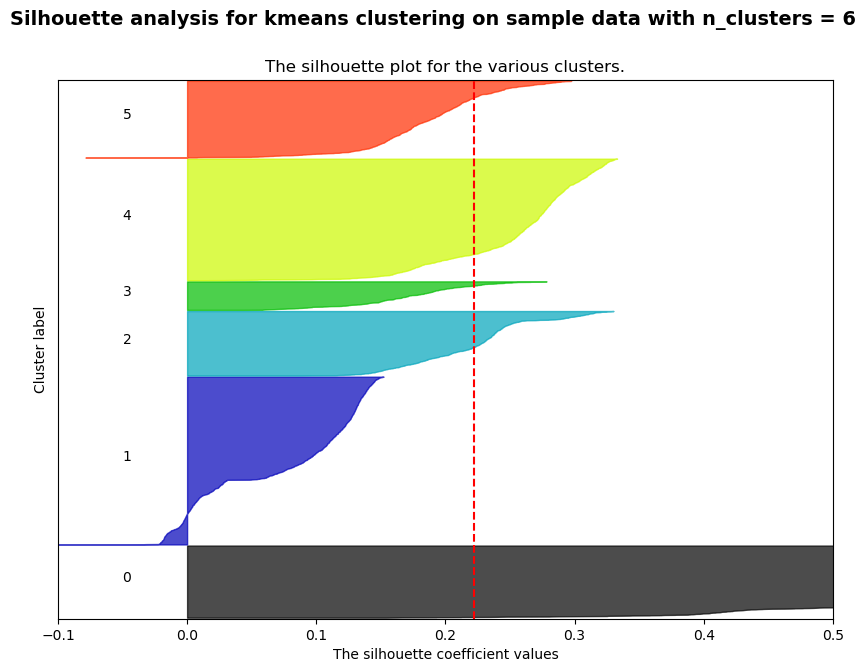

...

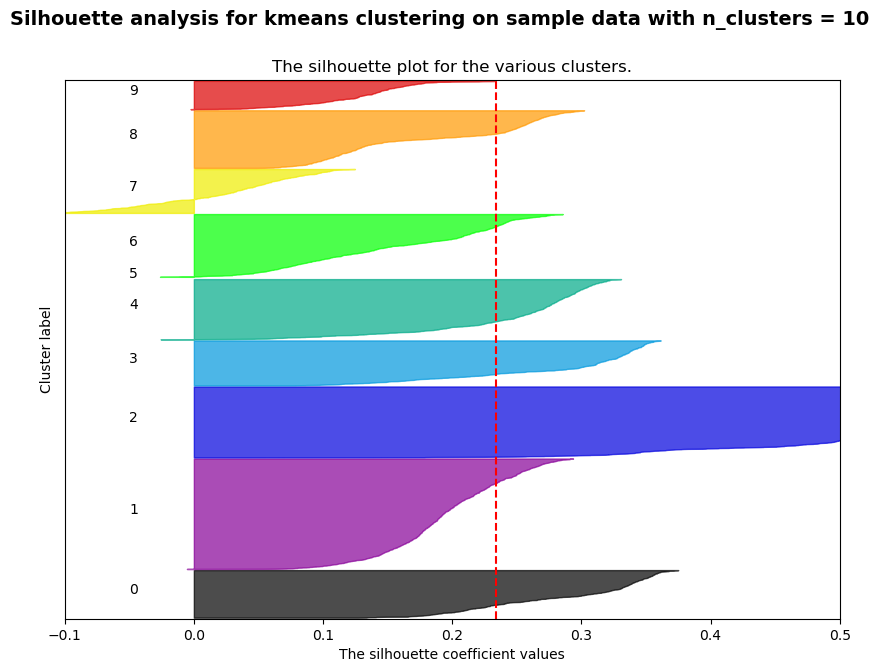

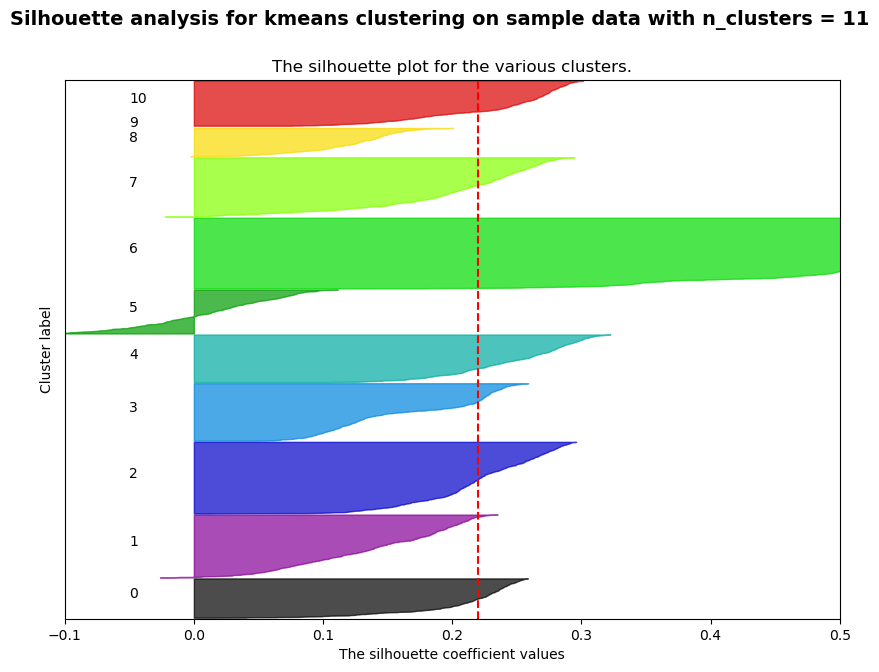

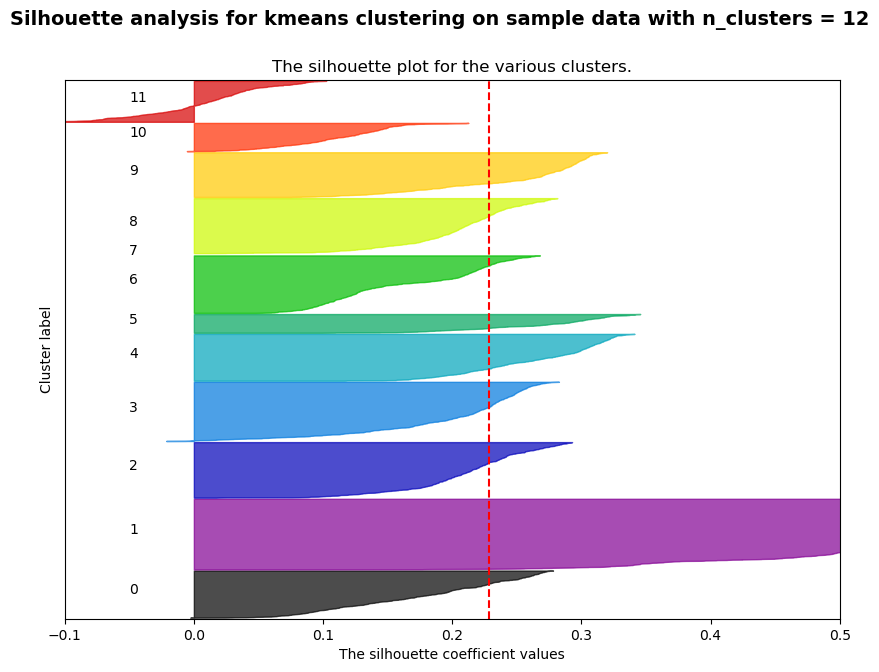

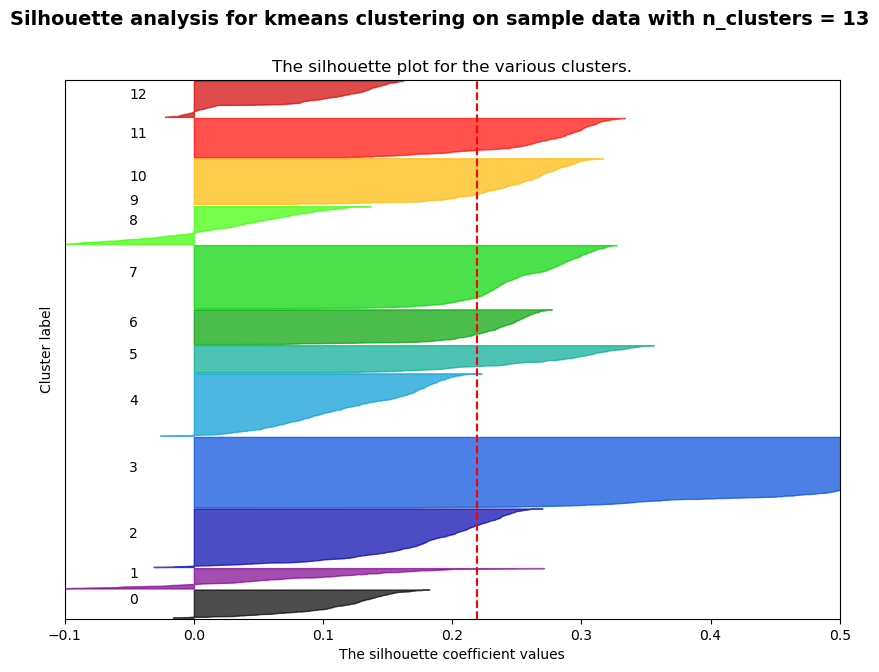

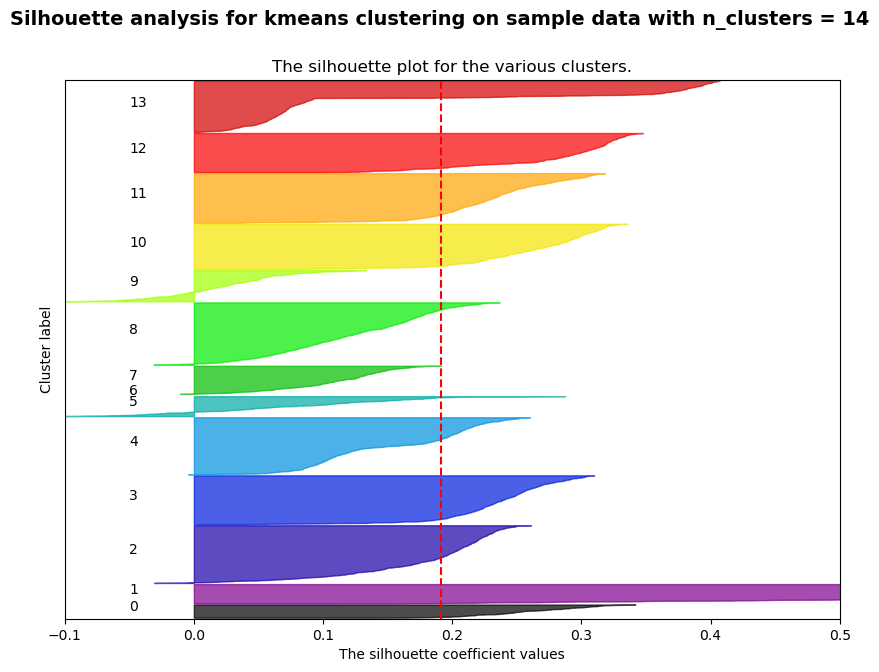

Using gmm on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.6038712335938935
Using gmm on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.1835115972223701
Using gmm on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.09924293139198932
Using gmm on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.06387512775232237
Using gmm on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.06758634940648772
Using gmm on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.06605992744514234
Using gmm on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.05308918590326752
Using gmm on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.026325215947481245
Using gmm on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.08476709370475446
Using gmm on dataset House Prices For

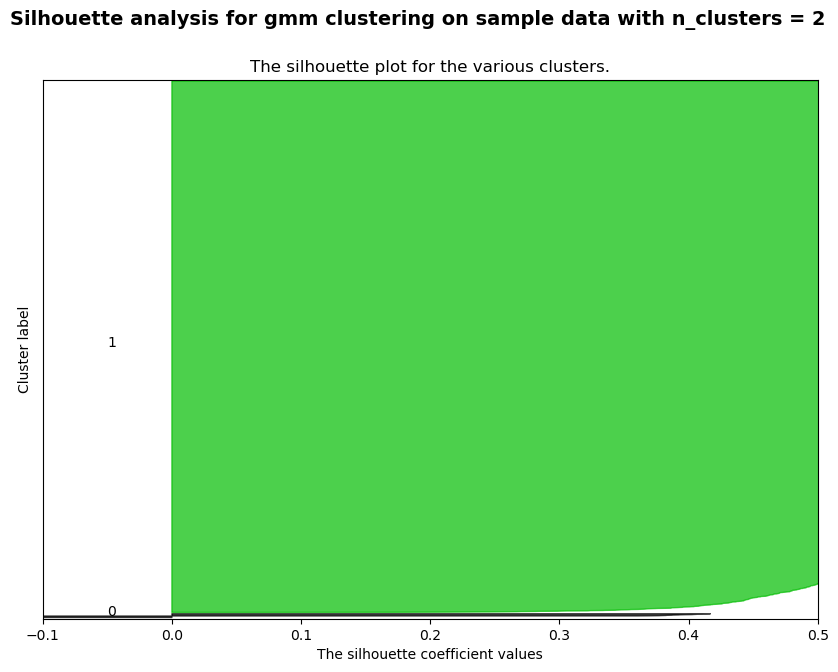

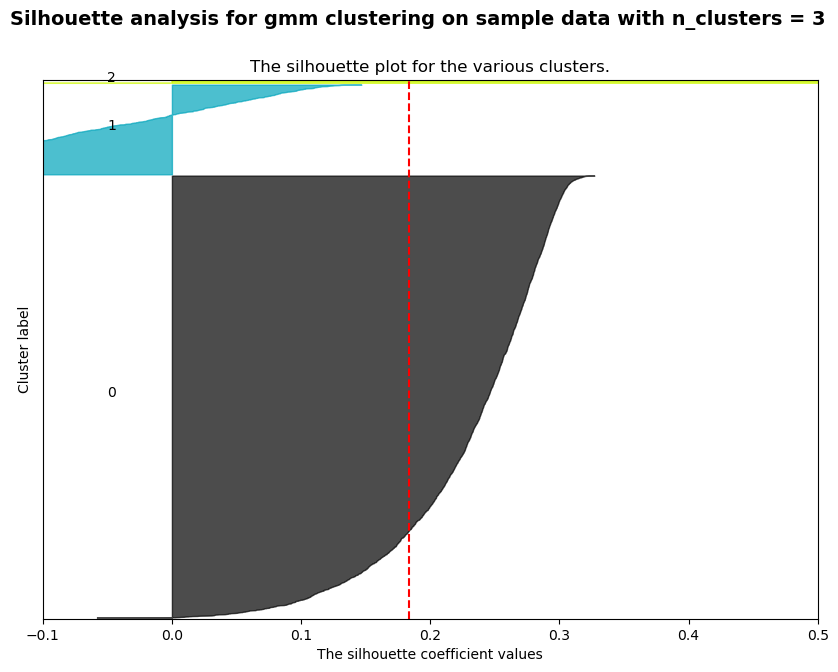

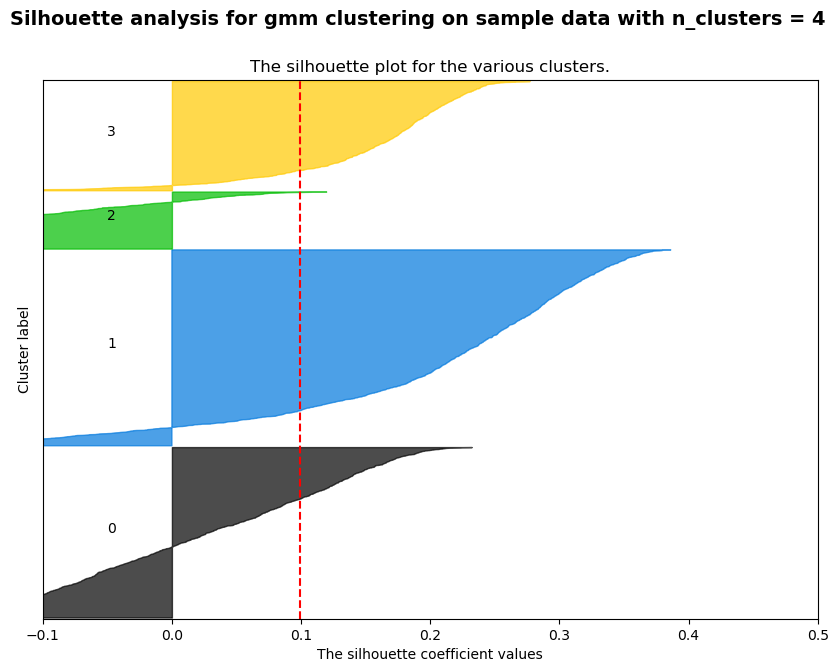

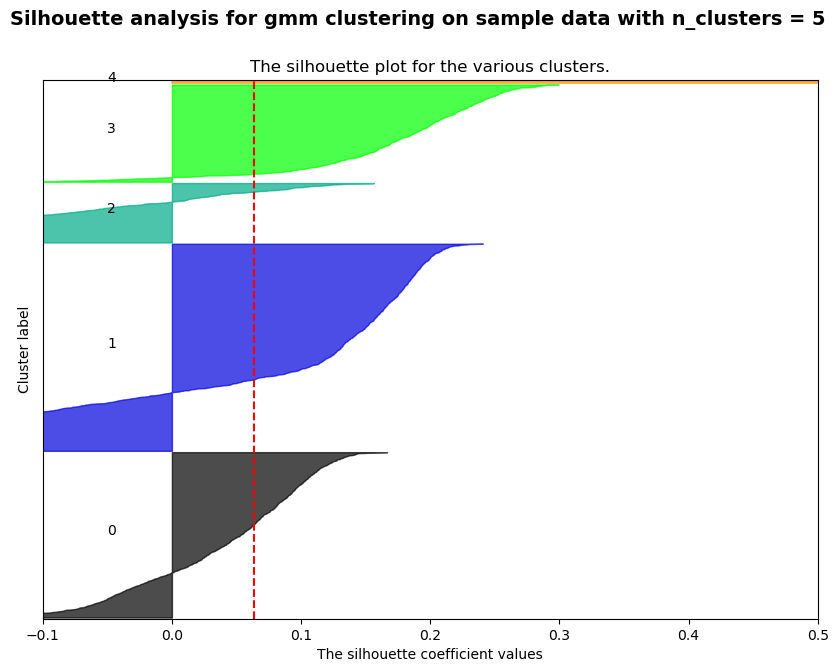

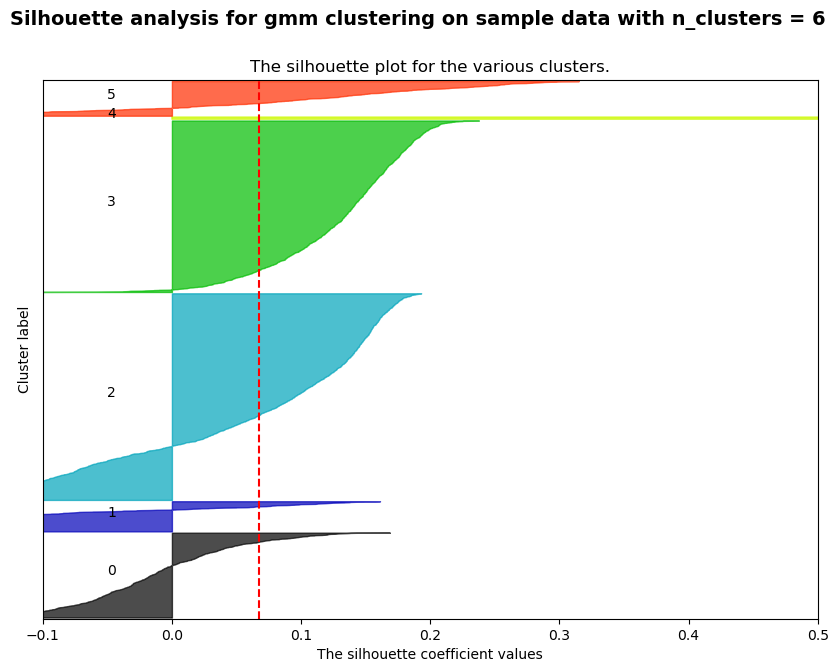

...

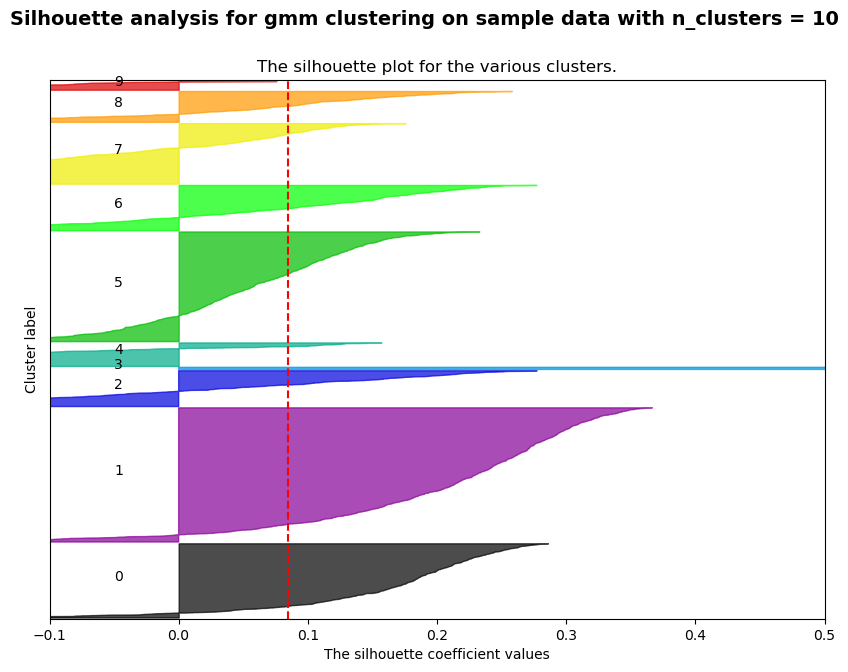

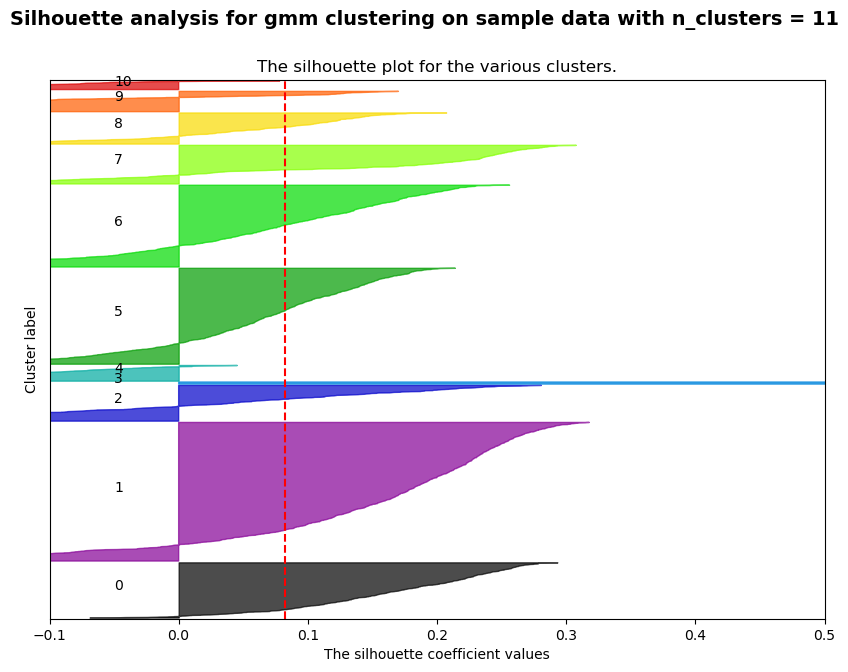

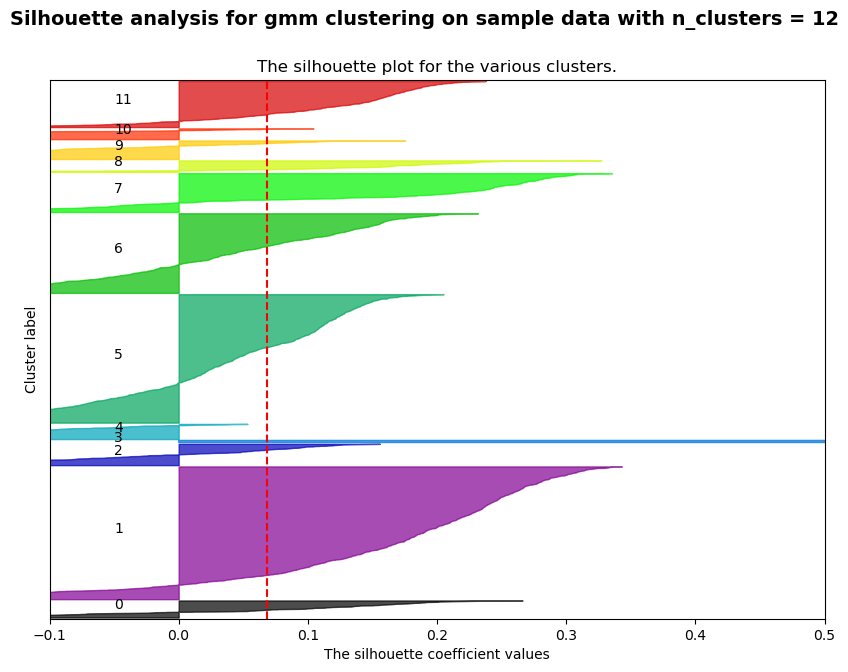

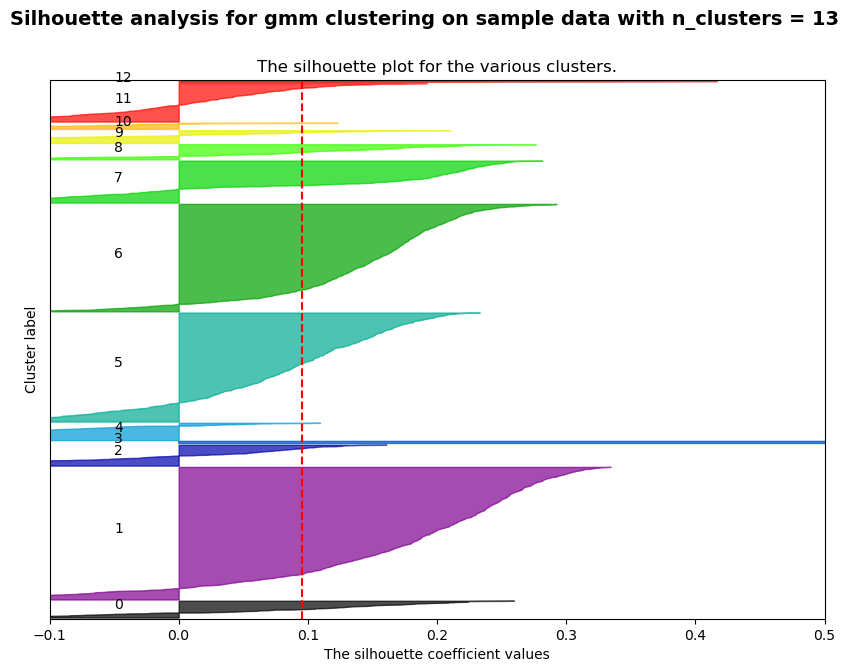

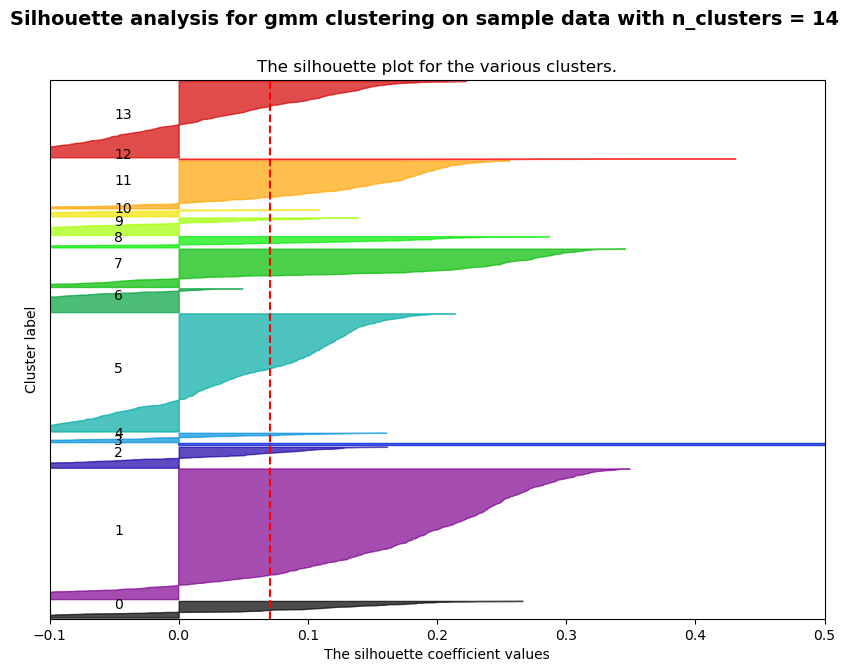

Using gmm on dataset Stroke Incidence For n_clusters = 2 The average silhouette_score is : 0.14204353526011088
Using gmm on dataset Stroke Incidence For n_clusters = 3 The average silhouette_score is : 0.14805106362646622
Using gmm on dataset Stroke Incidence For n_clusters = 4 The average silhouette_score is : 0.18832418651168947
Using gmm on dataset Stroke Incidence For n_clusters = 5 The average silhouette_score is : 0.22559282089938215
Using gmm on dataset Stroke Incidence For n_clusters = 6 The average silhouette_score is : 0.1933162371798774
Using gmm on dataset Stroke Incidence For n_clusters = 7 The average silhouette_score is : 0.18593093335618607
Using gmm on dataset Stroke Incidence For n_clusters = 8 The average silhouette_score is : 0.23041219983327693
Using gmm on dataset Stroke Incidence For n_clusters = 9 The average silhouette_score is : 0.23119723605905335
Using gmm on dataset Stroke Incidence For n_clusters = 10 The average silhouette_score is : 0.21685872342715215
U

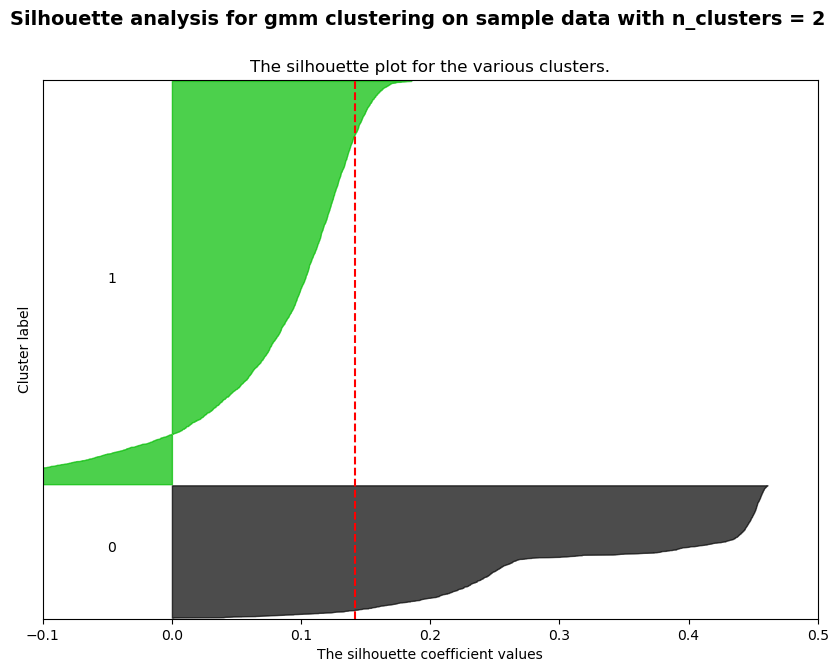

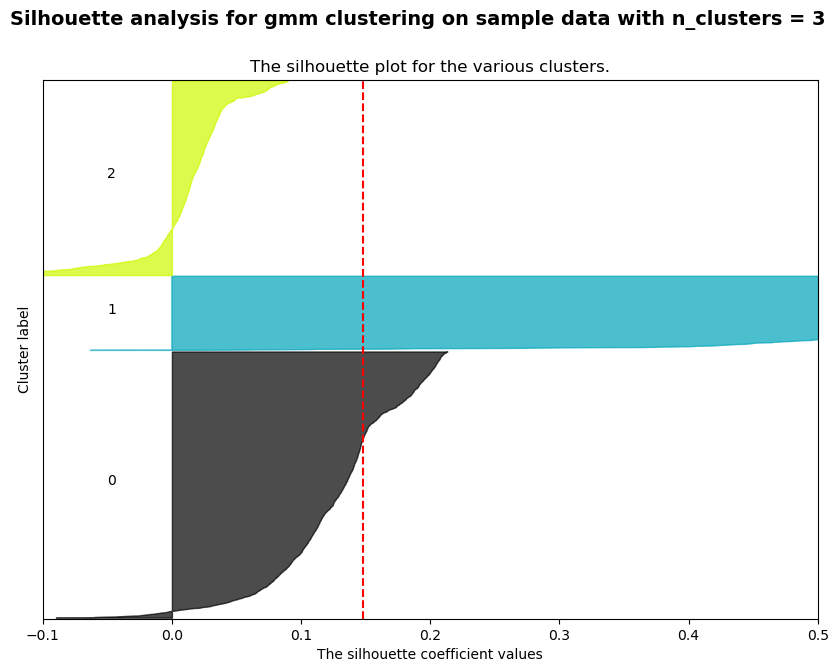

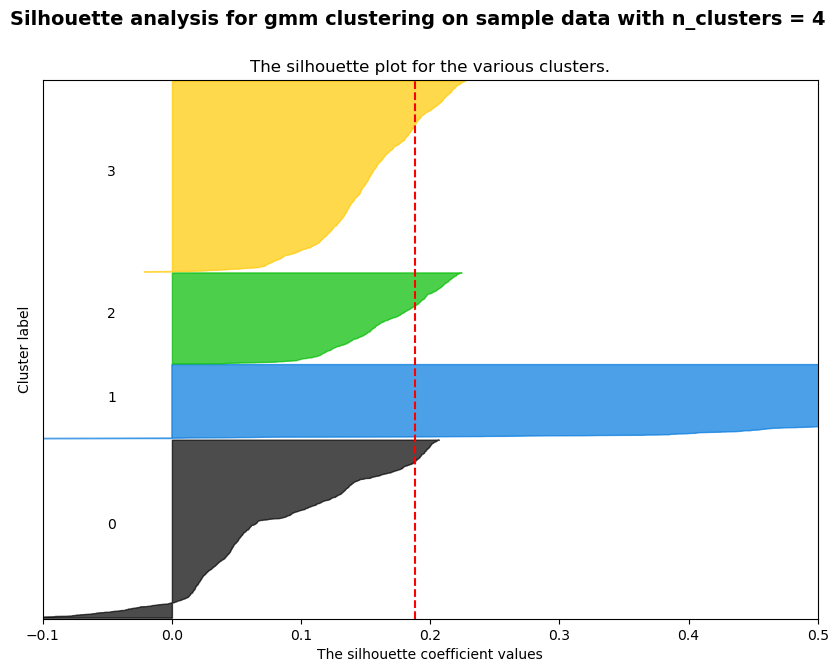

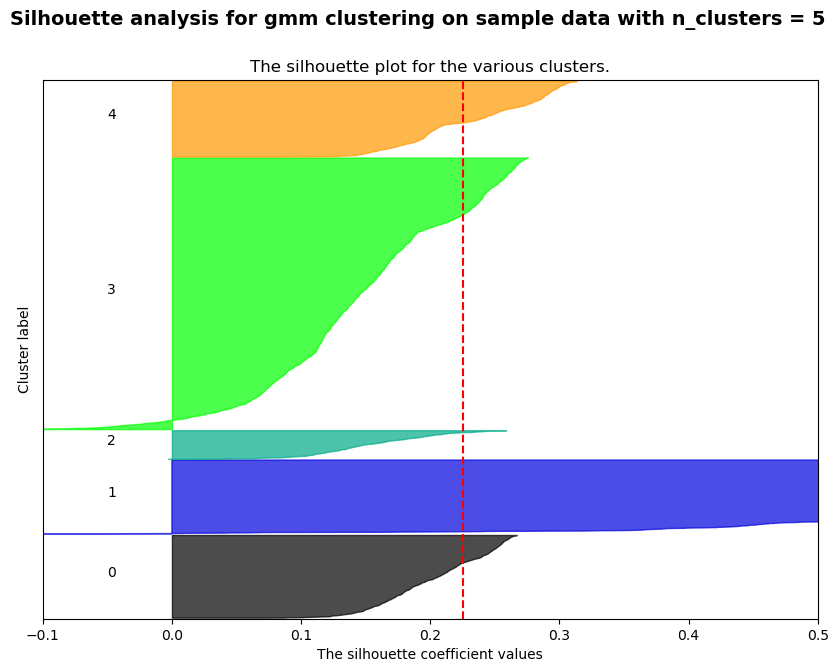

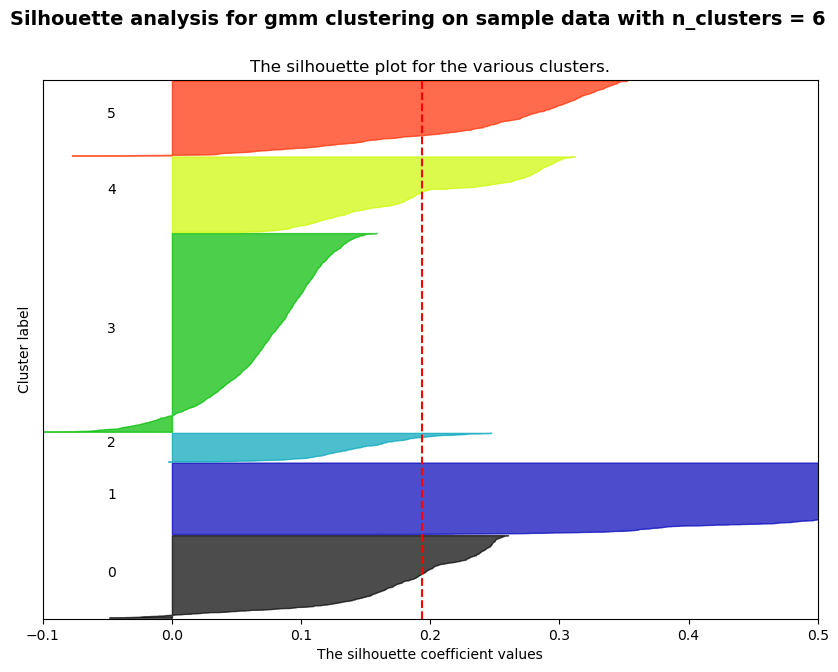

...

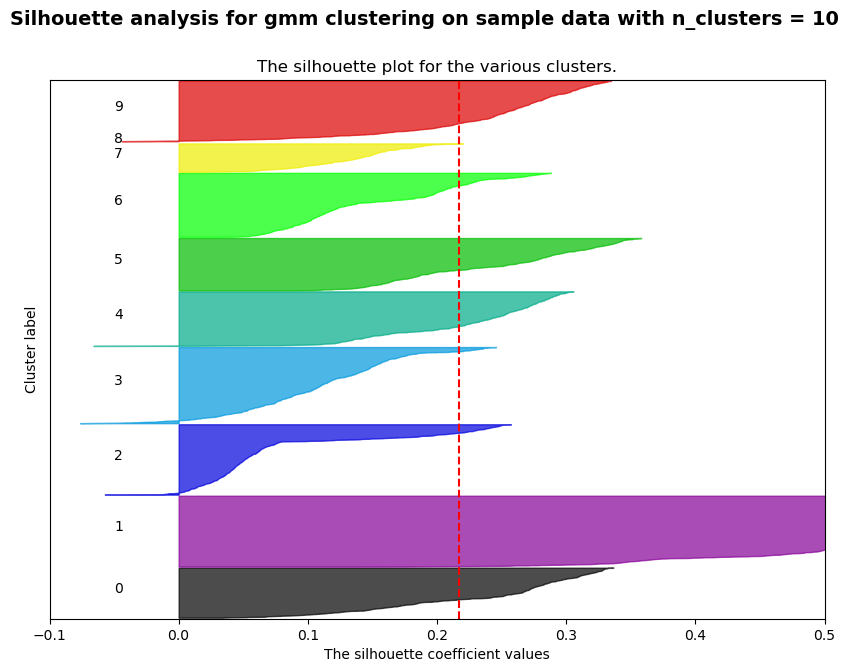

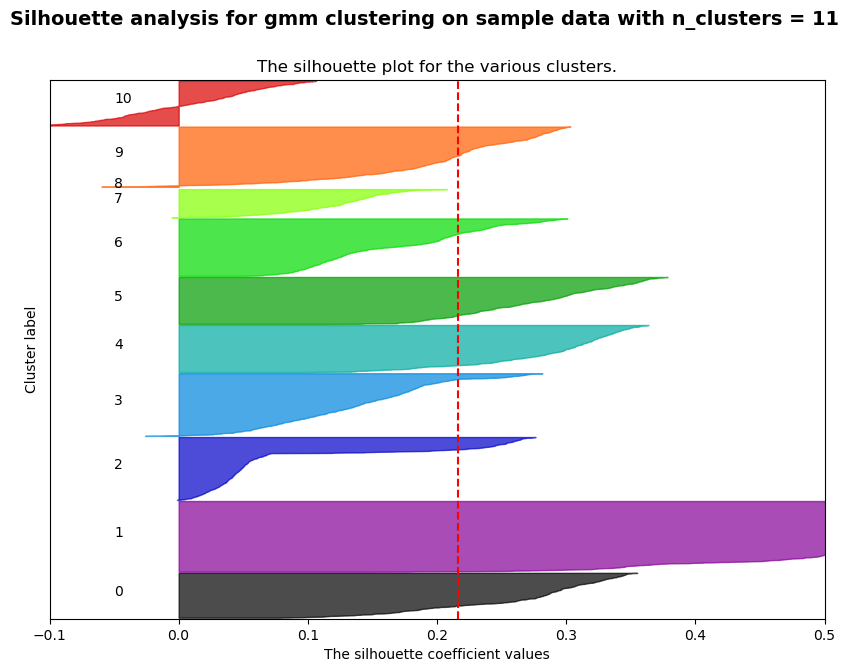

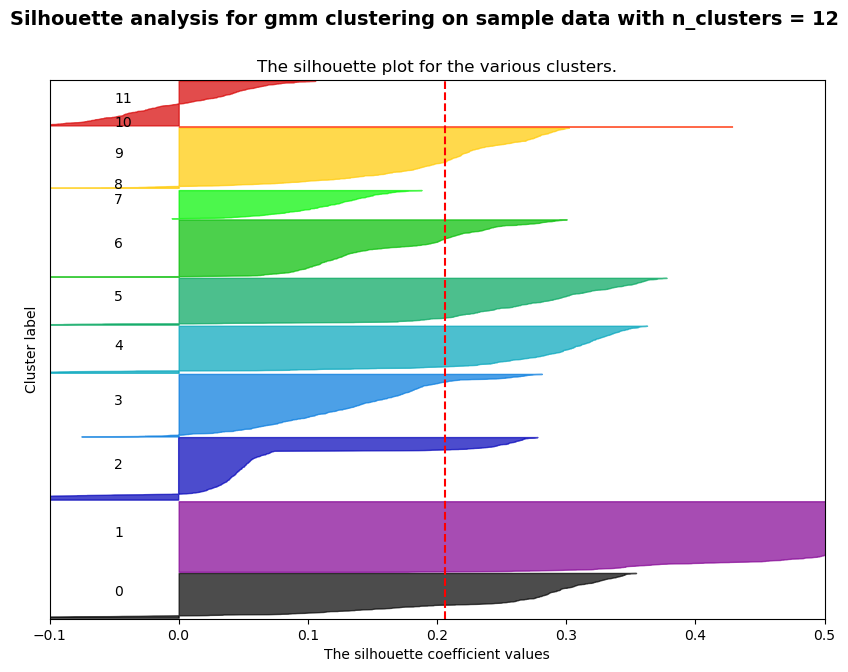

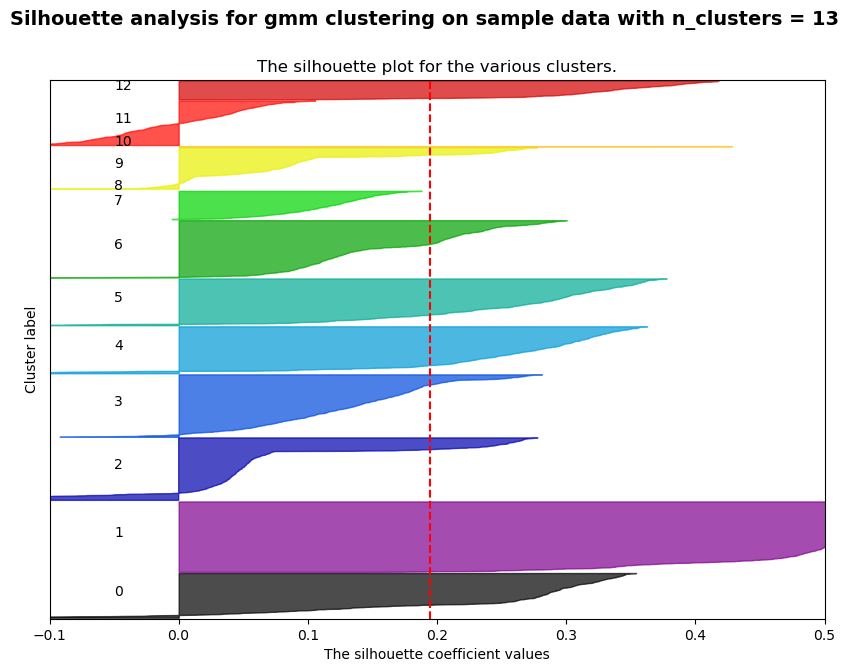

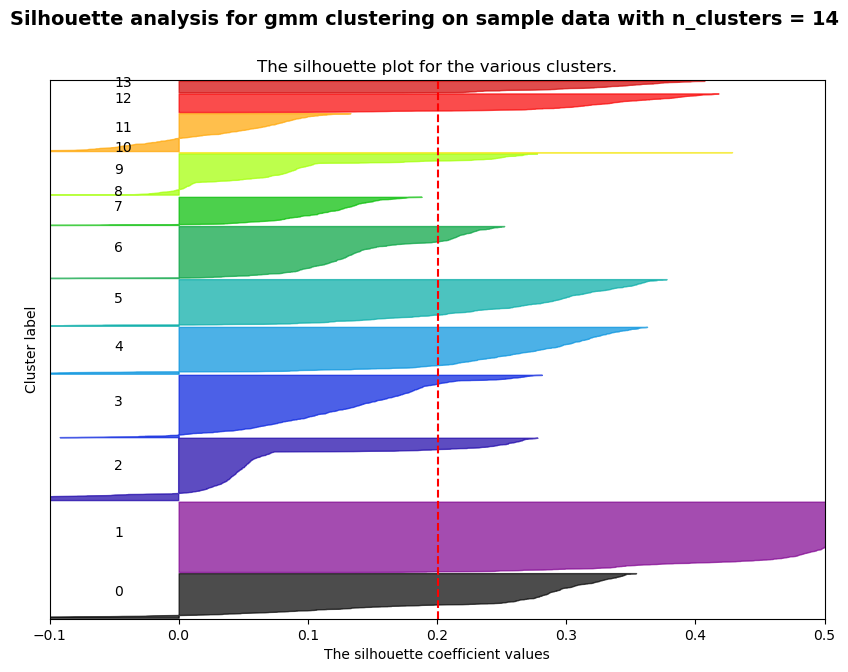

In [894]:
knn_scores1, knn_comp1 = silplot(X1_scal, 'kmeans', 'House Prices')
knn_scores2, knn_comp2 = silplot(X2_scal, 'kmeans', 'Stroke Incidence')
gmm_scores1, gmm_comp1 = silplot(X1_scal, 'gmm', 'House Prices')
gmm_scores2, gmm_comp2 = silplot(X2_scal, 'gmm', 'Stroke Incidence')

In [896]:
knn_scores1

[0.19498076743814072,
 0.18161472910378904,
 0.18301716011297048,
 0.14779741399215876,
 0.14738308777691106,
 0.15121880136685273,
 0.14677787819298718,
 0.14475432469790173,
 0.1420191946188657,
 0.13708052466196471,
 0.12882712915889544,
 0.13820031700622878,
 0.1251279000994459]

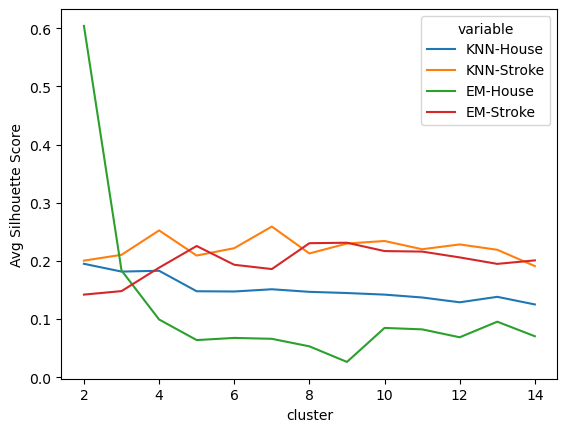

In [874]:
sil_scores = pd.melt(pd.DataFrame({
    'cluster': range(2,15), 
    'KNN-House': knn_scores1,
    'KNN-Stroke': knn_scores2,
    'EM-House': gmm_scores1,
    'EM-Stroke': gmm_scores2}), ['cluster'])

g = sns.lineplot(sil_scores, x='cluster', y='value', hue='variable')
g.set_ylabel('Avg Silhouette Score')
plt.savefig('./paper/figures/sil_scores.png', format = 'png', transparent = True)

In [508]:
# Run Kmeans on set 1,2
kmeans_params = {'n_clusters':4,
                'init':'random',
                'n_init':10,
                'max_iter':100,
                'verbose':0,
                'random_state':0,
                'copy_x':True,
                'algorithm':'lloyd'}
kmeans1 = KMeans(**kmeans_params)
kmeans1.fit(X1_scal)

kmeans_params = {'n_clusters':knn_comp2,
                'init':'random',
                'n_init':10,
                'max_iter':100,
                'verbose':0,
                'random_state':0,
                'copy_x':True,
                'algorithm':'lloyd'}
kmeans2 = KMeans(**kmeans_params)
kmeans2.fit(X2_scal)


KMeans(init='random', max_iter=100, n_clusters=7, random_state=0)

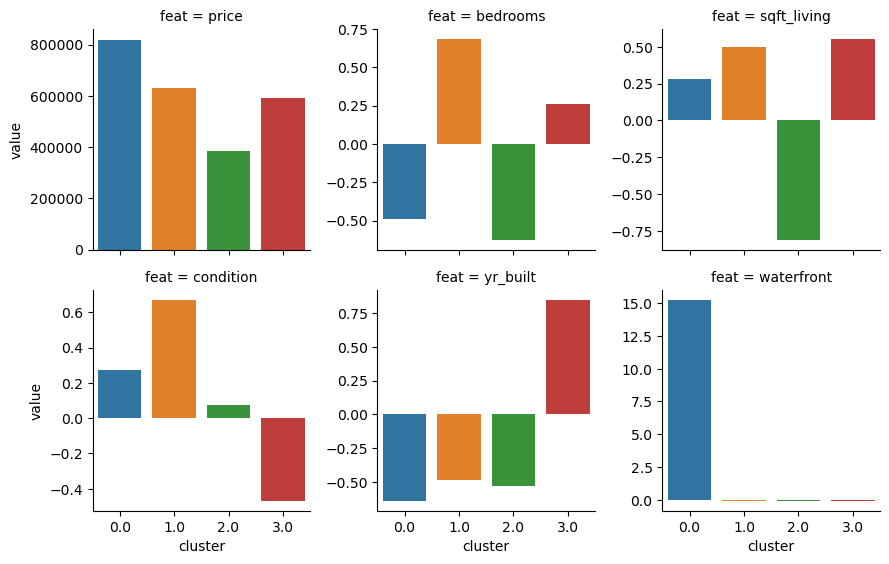

In [509]:
clusters = pd.DataFrame(np.array([kmeans1.labels_, y1,]).transpose(), columns = ['cluster','price'])
cols = list(clusters.columns) + x1_cols
clusters = pd.concat([clusters, pd.DataFrame(X1_scal)], axis=1, ignore_index=True)
clusters.columns = cols
summary = clusters.groupby('cluster').mean()

reshaped = pd.DataFrame()
for i in ['price','bedrooms','sqft_living','condition','yr_built','waterfront']:
    df = pd.DataFrame(summary[i])
    df['feat'] = i
    df.columns = ['value','feat']
    reshaped = pd.concat([reshaped, df])
reshaped['cluster'] = reshaped.index

g = sns.FacetGrid(reshaped, col="feat", col_wrap=3, height=3, sharey=False)
g.map(sns.barplot, "cluster", "value", color=".3", errorbar=None, palette=sns.color_palette("tab10"))
g.fig.subplots_adjust(top=0.9)
plt.savefig('./paper/figures/kmeans_price.png', format='png', transparent=True)

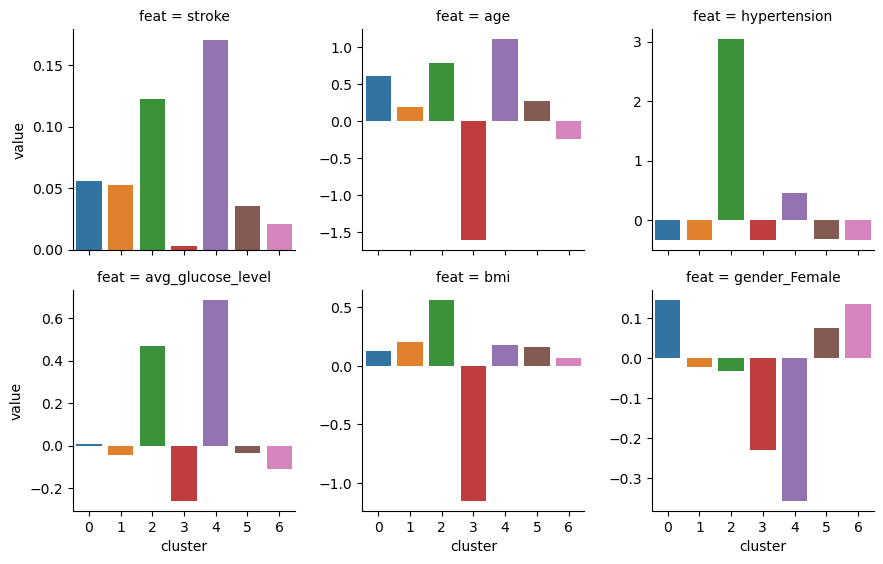

In [510]:
clusters = pd.DataFrame(np.array([kmeans2.labels_, y2,]).transpose(), columns = ['cluster','stroke'])
cols = list(clusters.columns) + x_cols
clusters = pd.concat([clusters, pd.DataFrame(X2_scal)], axis=1, ignore_index=True)
clusters.columns = cols
summary = clusters.groupby('cluster').mean()

reshaped = pd.DataFrame()
for i in ['stroke', 'age', 'hypertension', 'avg_glucose_level', 'bmi','gender_Female'] :
    df = pd.DataFrame(summary[i])
    df['feat'] = i
    df.columns = ['value','feat']
    reshaped = pd.concat([reshaped, df])
reshaped['cluster'] = reshaped.index

g = sns.FacetGrid(reshaped, col="feat", col_wrap=3, height=3, sharey=False)
g.map(sns.barplot, "cluster", "value", color=".3", errorbar=None, palette=sns.color_palette("tab10"))
g.fig.subplots_adjust(top=0.9)
plt.savefig('./paper/figures/kmeans_stroke.png', format='png', transparent=True)

In [877]:
## apply EM


gm_params = {'n_components':4,
            'init_params':'kmeans'}

gmm1 = GM(**gm_params)
gmm1.fit(X1_scal)
gmm1_labels = gmm1.fit_predict(X1_scal)

scaler2 = StandardScaler() 
scaler2.fit(X2)
X2_scal = scaler2.transform(X2)

gm_params = {'n_components':gmm_comp2,
            'init_params':'kmeans'}

gmm2 = GM(**gm_params)
gmm2.fit(X2_scal)
gmm2_labels = gmm2.fit_predict(X2_scal)



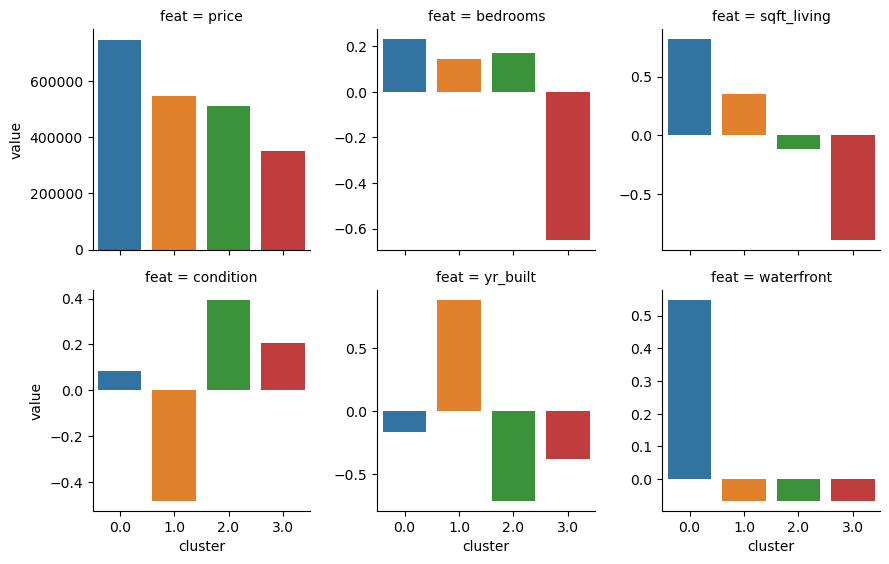

In [878]:
clusters = pd.DataFrame(np.array([gmm1_labels, y1,]).transpose(), columns = ['cluster','price'])
cols = list(clusters.columns) + x1_cols
clusters = pd.concat([clusters, pd.DataFrame(X1_scal)], axis=1, ignore_index=True)
clusters.columns = cols
summary = clusters.groupby('cluster').mean()

reshaped = pd.DataFrame()
for i in ['price','bedrooms','sqft_living','condition','yr_built','waterfront']:
    df = pd.DataFrame(summary[i])
    df['feat'] = i
    df.columns = ['value','feat']
    reshaped = pd.concat([reshaped, df])
reshaped['cluster'] = reshaped.index

g = sns.FacetGrid(reshaped, col="feat", col_wrap=3, height=3, sharey=False)
g.map(sns.barplot, "cluster", "value", color=".3", errorbar=None, palette=sns.color_palette("tab10"))
g.fig.subplots_adjust(top=0.9)
plt.savefig('./paper/figures/gmm_price.png', format='png', transparent=True)

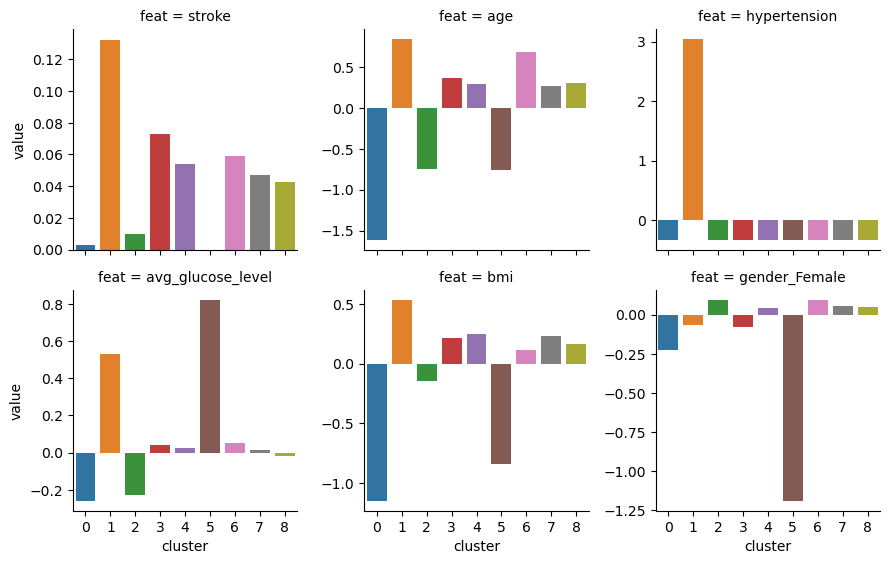

In [513]:
clusters = pd.DataFrame(np.array([gmm2_labels, y2,]).transpose(), columns = ['cluster','stroke'])
cols = list(clusters.columns) + x_cols
clusters = pd.concat([clusters, pd.DataFrame(X2_scal)], axis=1, ignore_index=True)
clusters.columns = cols
summary = clusters.groupby('cluster').mean()

reshaped = pd.DataFrame()
for i in ['stroke', 'age', 'hypertension', 'avg_glucose_level', 'bmi','gender_Female'] :
    df = pd.DataFrame(summary[i])
    df['feat'] = i
    df.columns = ['value','feat']
    reshaped = pd.concat([reshaped, df])
reshaped['cluster'] = reshaped.index

g = sns.FacetGrid(reshaped, col="feat", col_wrap=3, height=3, sharey=False)
g.map(sns.barplot, "cluster", "value", color=".3", errorbar=None, palette=sns.color_palette("tab10"))
g.fig.subplots_adjust(top=0.9)
plt.savefig('./paper/figures/gmm_stroke.png', format='png', transparent=True)

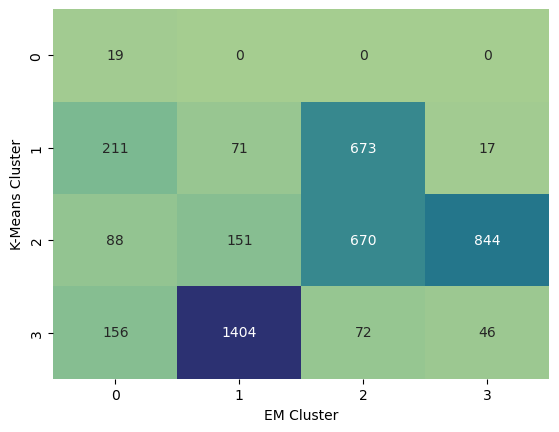

In [883]:

fig, ax = plt.subplots()
sns.heatmap(pd.crosstab(kmeans1.labels_,gmm1_labels), cmap="crest", annot=True, 
            fmt=".0f", cbar=False)
ax.set(ylabel='K-Means Cluster', xlabel='EM Cluster')
plt.savefig('./paper/figures/price_xtab.png', format='png', transparent=True)

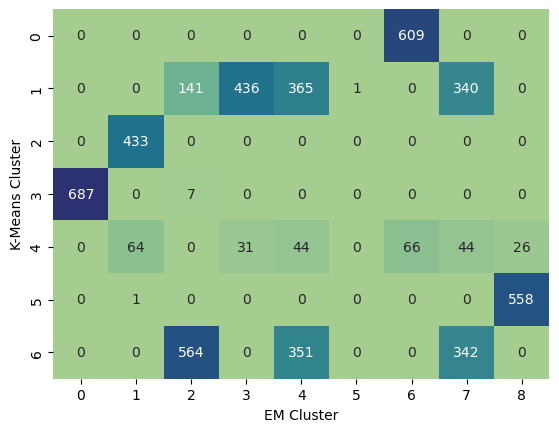

In [515]:
fig, ax = plt.subplots()
sns.heatmap(pd.crosstab(kmeans2.labels_,gmm2_labels), cmap="crest", annot=True, 
            fmt=".0f", cbar=False)
ax.set(ylabel='K-Means Cluster', xlabel='EM Cluster')
plt.savefig('./paper/figures/stroke_xtab.png', format='png', transparent=True)

## Dimensionality Reduction

In [237]:
from sklearn.decomposition import PCA, FastICA
def reconstruction_error(A, B, ax=None):
    return ((A - B)**2).mean(axis=ax)


In [677]:
pca_params = {}
pca1 = PCA()
pca1.fit(X1_scal)
X1_tr_pca = pca1.fit_transform(X1_scal)

pca_params = {}
pca2 = PCA(**pca_params)
pca2.fit(X2_scal)
X2_tr_pca = pca2.fit_transform(X2_scal)


array([0.25754284, 0.39273723, 0.47721913, 0.56020052, 0.63674229,
       0.70372221, 0.76565804, 0.81720436, 0.86496831, 0.90673572,
       0.93608591, 0.96311561, 0.98409824, 1.        , 1.        ])

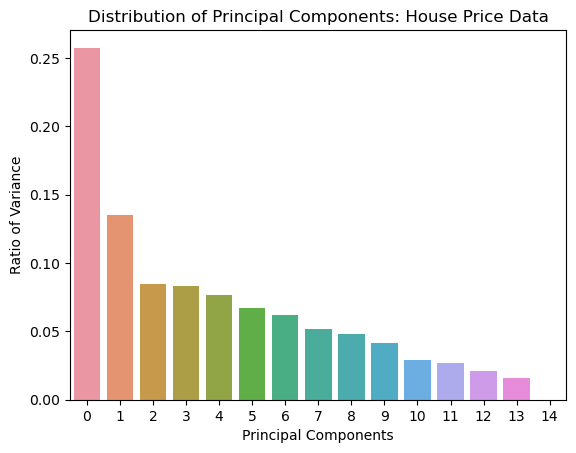

In [678]:
evr1 = pca1.explained_variance_ratio_
g = sns.barplot(x=list(range(len(evr1))), y=list(evr1))
g.set_xlabel("Principal Components")
g.set_ylabel("Ratio of Variance")
g.set_title("Distribution of Principal Components: House Price Data")
plt.savefig('./paper/figures/pca_house_dist.png', format = 'png', transparent = True)
np.cumsum(evr1)

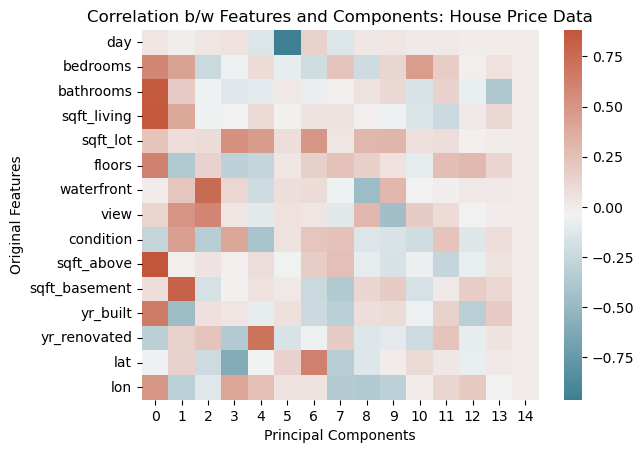

In [681]:
def correl_plot(X, X_tr, cols, title, xlab):
    correl_mat = np.empty((X.shape[1], X_tr.shape[1]))
    for i in range(X.shape[1]):
        for j in range(X_tr.shape[1]):
            correl_mat[i][j] = np.corrcoef(X[:,i], X_tr[:,j])[0,1]
    g = sns.heatmap(correl_mat, cmap=sns.diverging_palette(220, 20, as_cmap=True))
    g.set_xlabel(xlab)
    g.set_ylabel("Original Features")
    g.set_title("Correlation b/w Features and Components: " + title)
    g.set_yticks(np.arange(len(cols))+0.5, labels=cols)
    plt.yticks(rotation = 0, va="center")

correl_plot(X1_scal, X1_tr_pca, x1_cols, "House Price Data", "Principal Components")
plt.savefig('./paper/figures/correl_hp_pca.png',format = 'png', transparent = True)

array([0.18892927, 0.296088  , 0.38590854, 0.46329389, 0.5360602 ,
       0.60639926, 0.66923309, 0.73065418, 0.78860524, 0.84422808,
       0.89512082, 0.93771167, 0.96735076, 0.98498135, 0.99956706,
       1.        ])

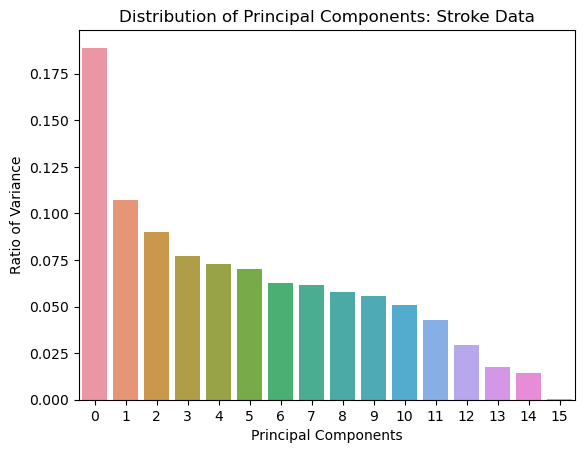

In [682]:
evr2 = pca2.explained_variance_ratio_
g = sns.barplot(x=list(range(len(evr2))), y=list(evr2))
g.set_xlabel("Principal Components")
g.set_ylabel("Ratio of Variance")
g.set_title("Distribution of Principal Components: Stroke Data")
plt.savefig('./paper/figures/pca_stroke_dist.png', format = 'png', transparent = True)
np.cumsum(evr2)

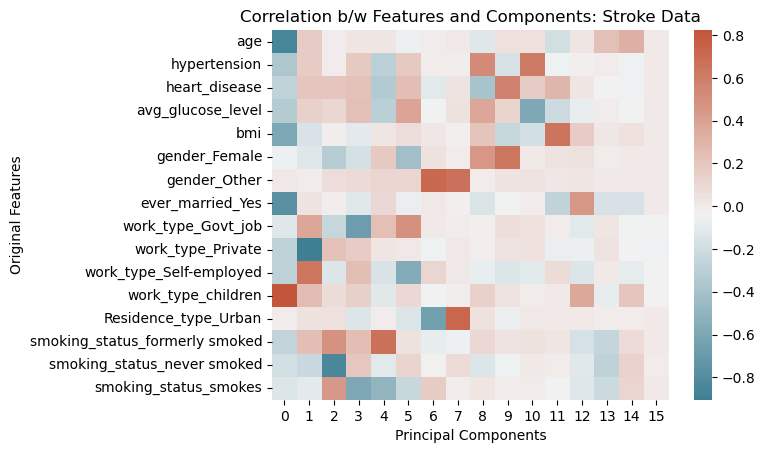

In [684]:
correl_plot(X2_scal, X2_tr_pca, x_cols, "Stroke Data", "Principal Components")
plt.savefig('./paper/figures/correl_stroke_pca.png',format = 'png', transparent = True)

In [650]:
def dim_reduc(algo, X, n = None):
    if n:
        r = [n]
    else:
        r = range(1, X.shape[1])

    for i in r:
        params = {'n_components':i}
        dra = algo(**params)
        X_tr = dra.fit_transform(X)
        X_pr = dra.inverse_transform(X_tr)
        if not n:
            print("clust, kurtosis, mse:", i, kurtosis(X_tr, axis=None), reconstruction_error(X, X_pr))
    
    if n:
        return dra, X_tr, X_pr

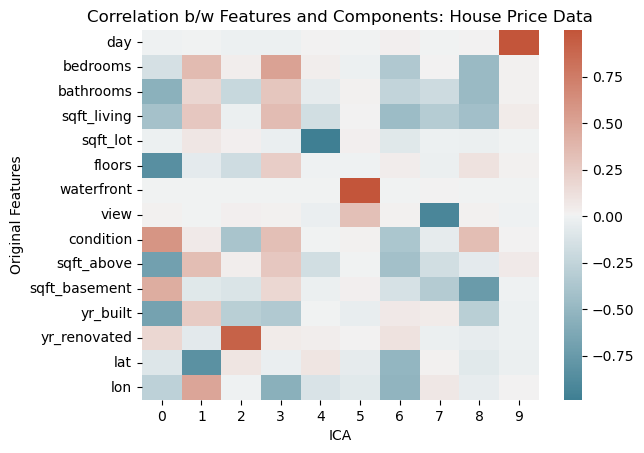

In [685]:
ica, X1_tr_ica, X_pr = dim_reduc(FastICA, X1_scal, n=10)
correl_plot(X1_scal, X1_tr_ica, x1_cols, "House Price Data", "ICA")
plt.savefig('./paper/figures/correl_hp_ica.png',format = 'png', transparent = True)

In [734]:
dim_reduc(FastICA, X1_scal)

clust, kurtosis, mse: 1 -0.035162763284443344 0.7424571638340588
clust, kurtosis, mse: 2 0.3687486185857338 0.6072627732232854
clust, kurtosis, mse: 3 27.382604527991194 0.5227808738065083
clust, kurtosis, mse: 4 23.930988807447676 0.43979947729770047
clust, kurtosis, mse: 5 27.1802672165333 0.3632577078102716
clust, kurtosis, mse: 6 22.848067323749614 0.29627779296753237
clust, kurtosis, mse: 7 28.260032007186012 0.23434196111474292
clust, kurtosis, mse: 8 25.044972512236132 0.18279563908247776
clust, kurtosis, mse: 9 37.08355256292139 0.13503168654774678
clust, kurtosis, mse: 10 47.076961640564654 0.09326427997705539
clust, kurtosis, mse: 11 43.459768118712276 0.06391408628501105
clust, kurtosis, mse: 12 41.858045183997206 0.036884385918033835
clust, kurtosis, mse: 13 39.07726642924985 0.01590176115401924
clust, kurtosis, mse: 14 36.55543479272113 1.0459895379901503e-30


In [643]:

dim_reduc(FastICA, X2_scal)

clust, kurtosis, mse: 1 0.16436990855726075 0.8110707309606977
clust, kurtosis, mse: 2 -1.0671296685860128 0.7039120047821803
clust, kurtosis, mse: 3 -1.1704448287527853 0.6140914599754514
clust, kurtosis, mse: 4 -0.6076004913929407 0.5367061081941791
clust, kurtosis, mse: 5 -0.011185374234091494 0.4639398034477323
clust, kurtosis, mse: 6 1.3348987332282185 0.39360074467522693
clust, kurtosis, mse: 7 226.01792732880617 0.3307669089695761
clust, kurtosis, mse: 8 633.4179612307194 0.26934581859107615
clust, kurtosis, mse: 9 563.2666162365974 0.2113947567683375
clust, kurtosis, mse: 10 508.9875968660956 0.15577191855033207
clust, kurtosis, mse: 11 464.17546565628163 0.1048791827307546
clust, kurtosis, mse: 12 426.27242729609475 0.06228832660803901
clust, kurtosis, mse: 13 394.59893630828503 0.03264923599014464
clust, kurtosis, mse: 14 366.2913398165642 0.015018651456175498
clust, kurtosis, mse: 15 341.6687511797686 0.0004329384918143707


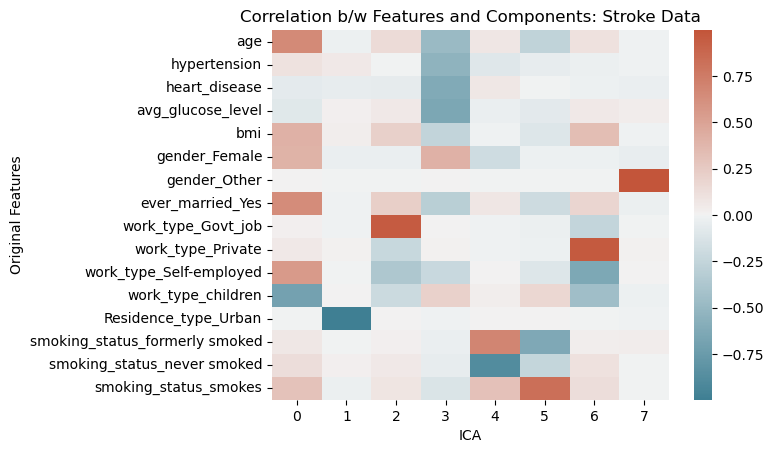

In [686]:
ica, X2_tr_ica, X_pr = dim_reduc(FastICA, X2_scal, n=8)
correl_plot(X2_scal, X2_tr_ica, x_cols, "Stroke Data", "ICA")
plt.savefig('./paper/figures/correl_stroke_ica.png',format = 'png', transparent = True)

In [653]:
dra, X_tr, X_pr = dim_reduc(GRP, X1_scal, 1)

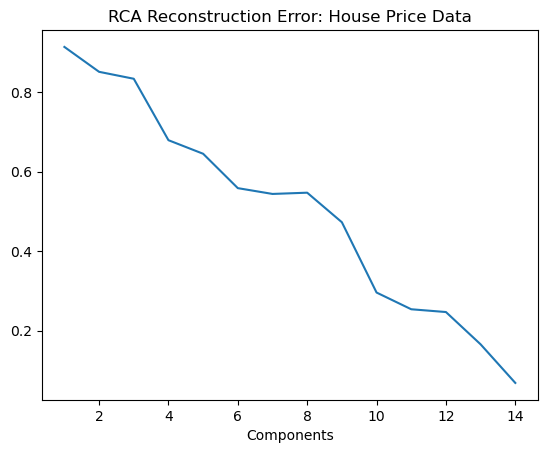

In [687]:
errors = []
for i in range(1,X1_scal.shape[1]):
    dra, X_tr, X_pr = dim_reduc(GRP, X1_scal, i)
    errors.append(reconstruction_error(X1_scal, X_pr))
errors

g = sns.lineplot(x=np.arange(1,X1_scal.shape[1]),y=errors)
g.set_title("RCA Reconstruction Error: House Price Data")
g.set_xlabel("Components")
plt.savefig('./paper/figures/rca_error_house.png', format = 'png', transparent = True)



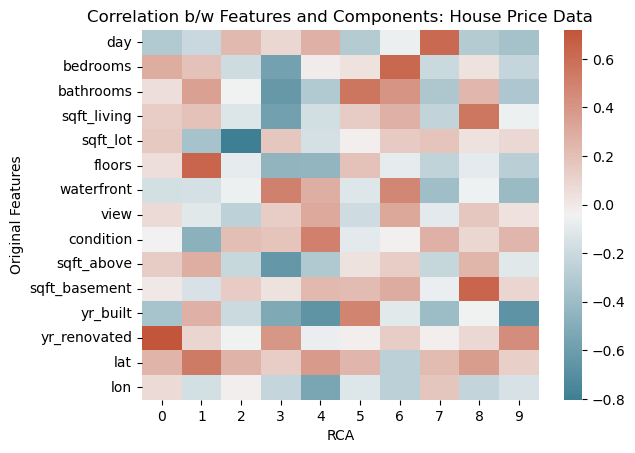

In [691]:
rca, X1_tr_rca, X_pr = dim_reduc(GRP, X1_scal, 10)
correl_plot(X1_scal, X1_tr_rca, x1_cols, "House Price Data", "RCA")
plt.savefig('./paper/figures/correl_house_rca.png',format = 'png', transparent = True)

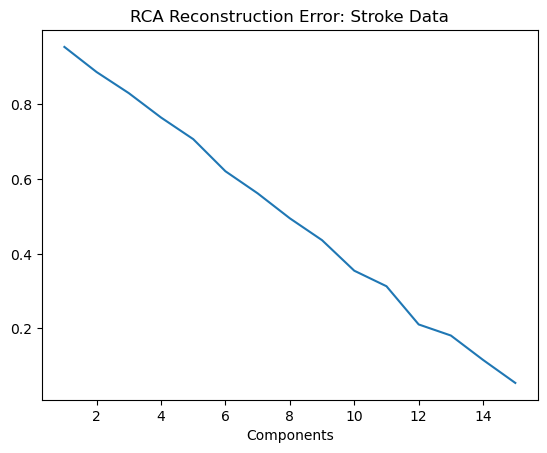

In [671]:
errors = []
for i in range(1,X2_scal.shape[1]):
    dra, X_tr, X_pr = dim_reduc(GRP, X2_scal, i)
    errors.append(reconstruction_error(X2_scal, X_pr))
errors

g = sns.lineplot(x=np.arange(1,X2_scal.shape[1]),y=errors)
g.set_title("RCA Reconstruction Error: Stroke Data")
g.set_xlabel("Components")
plt.savefig('./paper/figures/rca_error_stroke.png', format = 'png', transparent = True)



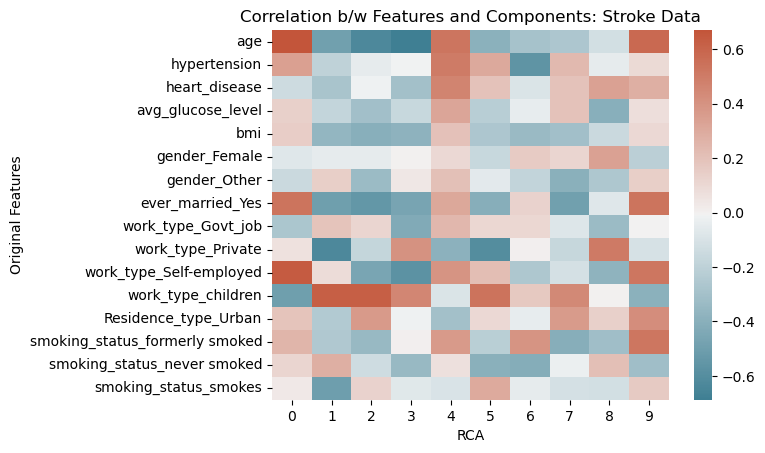

In [779]:
rca, X2_tr_rca, X_pr = dim_reduc(GRP, X2_scal, 10)
correl_plot(X2_scal, X_tr, x_cols, "Stroke Data", "RCA")
plt.savefig('./paper/figures/correl_stroke_rca.png',format = 'png', transparent = True)

In [558]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

In [711]:
kbest1 = SelectKBest(f_regression, k=10).fit(X1_scal, y1)
kbest2 = SelectKBest(f_regression, k=10).fit(X2_scal, y2)


In [725]:
feats1 = kbest1.get_feature_names_out()
feats1 = [int(i[1:]) for i in feats1]
print("Best features house price data:", list(np.array(x1_cols)[feats1]))
feats2 = kbest2.get_feature_names_out()
feats2 = [int(i[1:]) for i in feats2]
print("Best features house price data:", list(np.array(x_cols)[feats2]))

Best features house price data: ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'sqft_above', 'sqft_basement', 'lat']
Best features house price data: ['age', 'hypertension', 'heart_disease', 'avg_glucose_level', 'bmi', 'ever_married_Yes', 'work_type_Self-employed', 'work_type_children', 'Residence_type_Urban', 'smoking_status_formerly smoked']


In [745]:
pca_1 = 10
ica_1 = 10
rca_1 = 10
pca_2 = 12
ica_2 = 8
rca_2 = 10


In [806]:
X1_tr_exp1 = KMeans(6).fit_predict(X1_tr_pca[:,0:pca_1])
X1_tr_exp1

array([1, 1, 1, ..., 4, 1, 1], dtype=int32)

In [ ]:
0.2035266018980102, 0.1624425006951555,0.15302829930552564, 0.2686266339532113

Using kmeans on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.21586929791109957
Using kmeans on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.2032193825621909
Using kmeans on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.2002321515438106
Using kmeans on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.16437655753277033
Using kmeans on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.2035266018980102
Using kmeans on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.16253890862102566
Using kmeans on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.16963870793436758
Using kmeans on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.16631692577531765
Using kmeans on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.1605590248929671
Using kmeans 

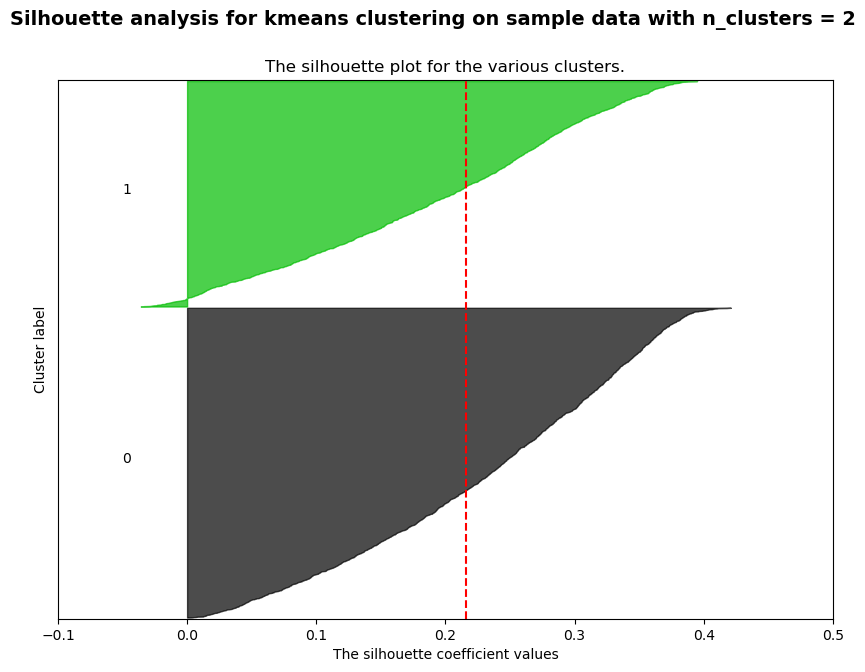

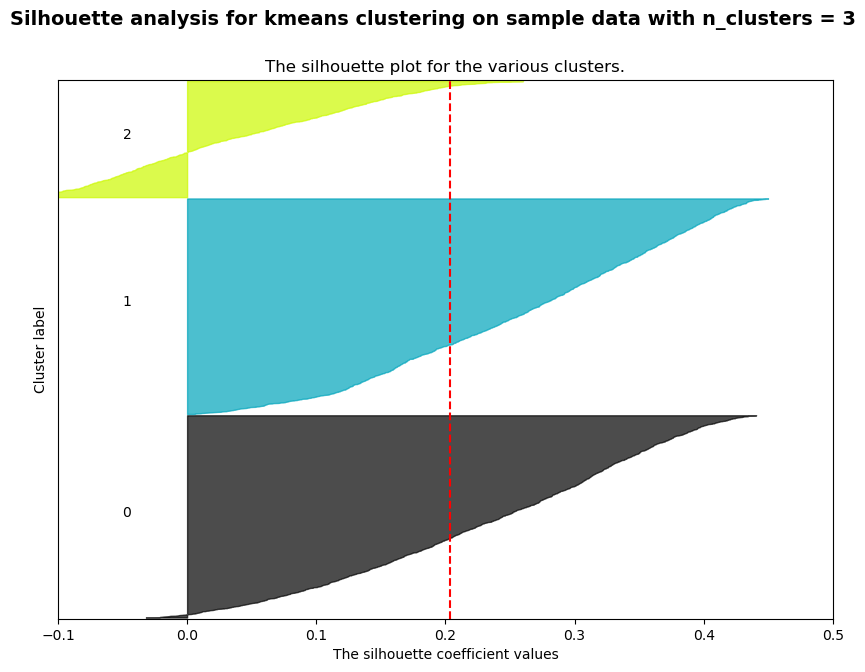

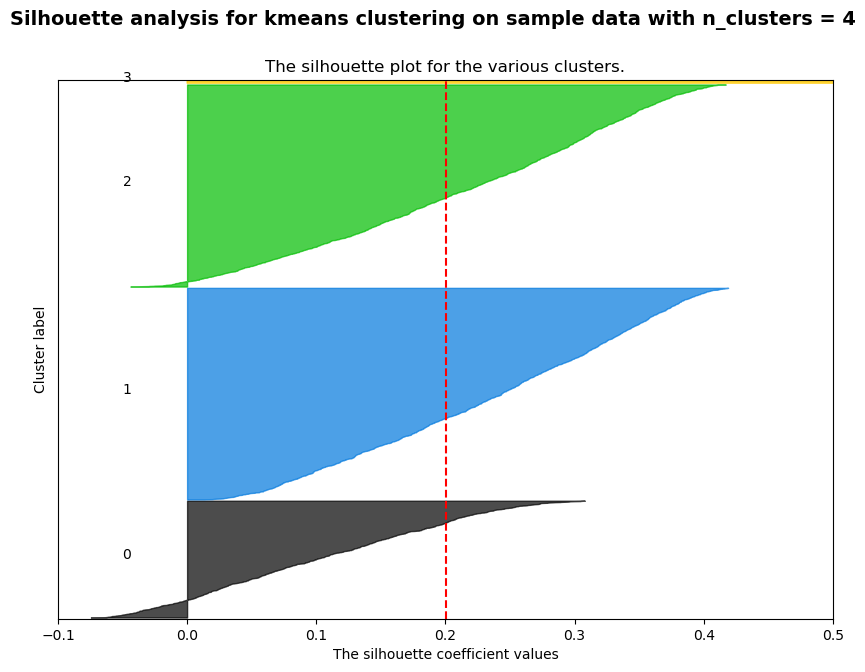

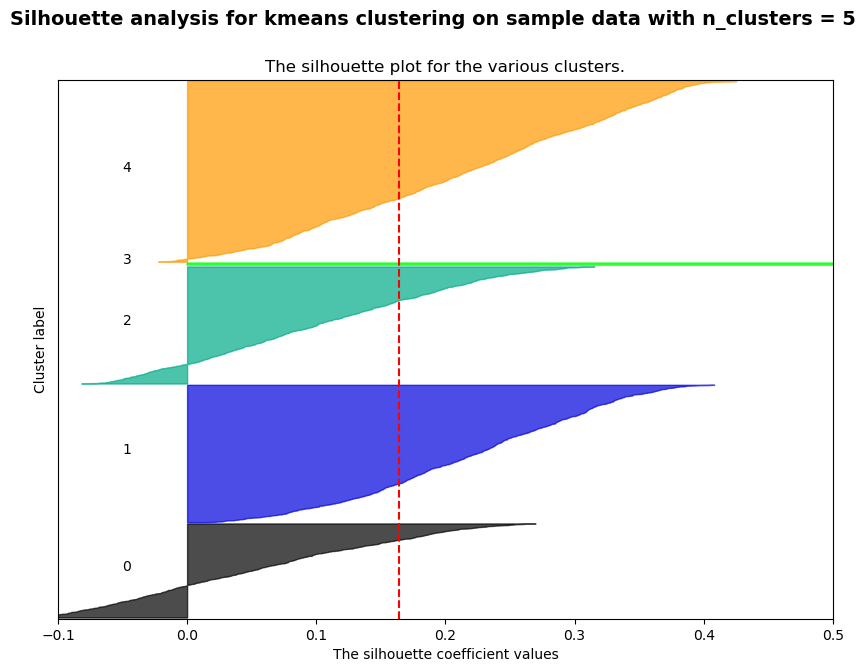

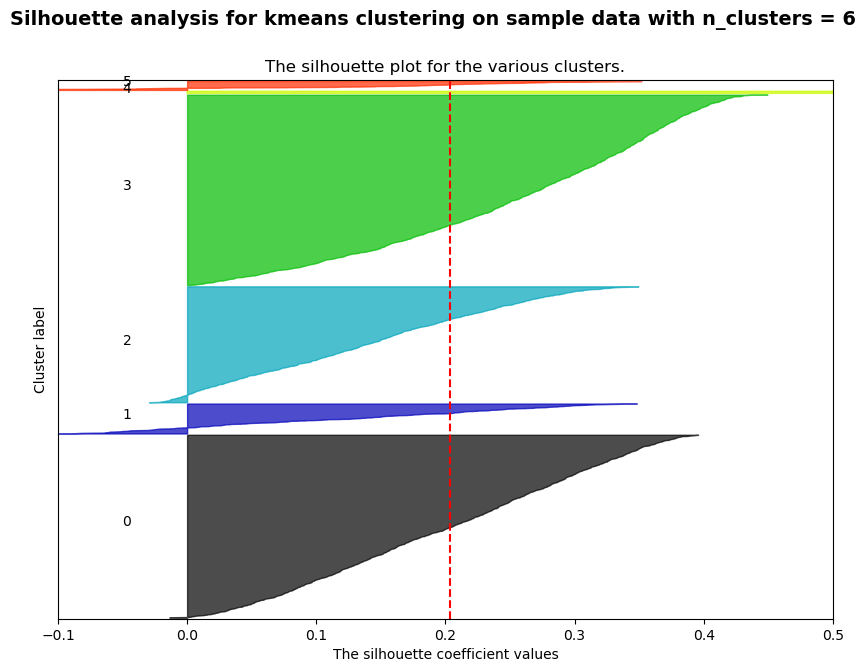

...

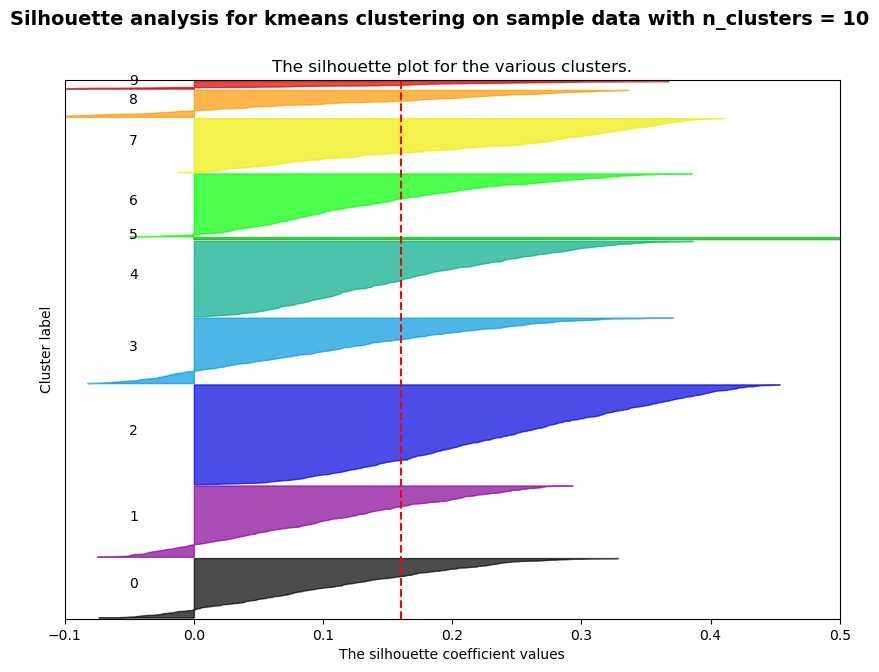

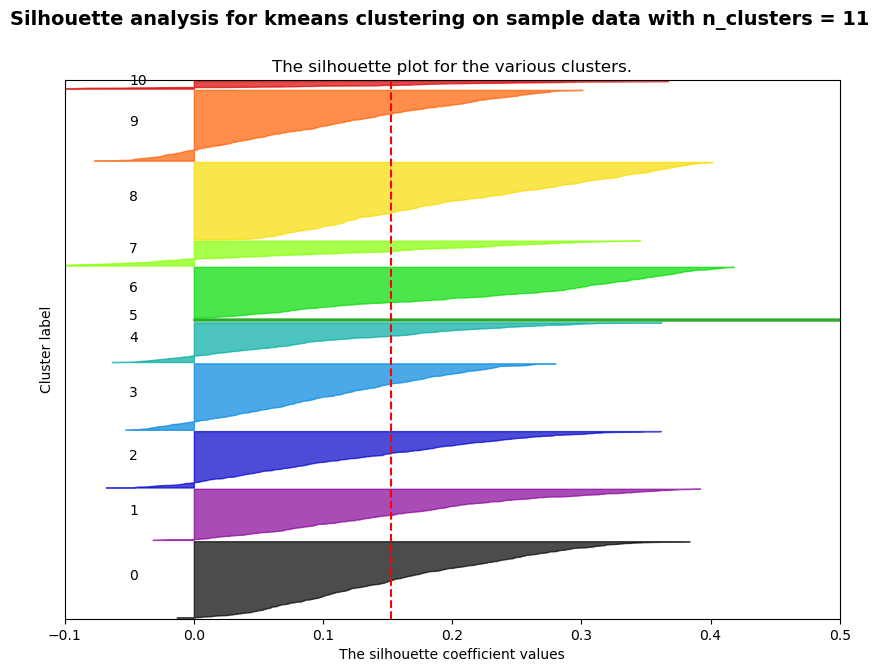

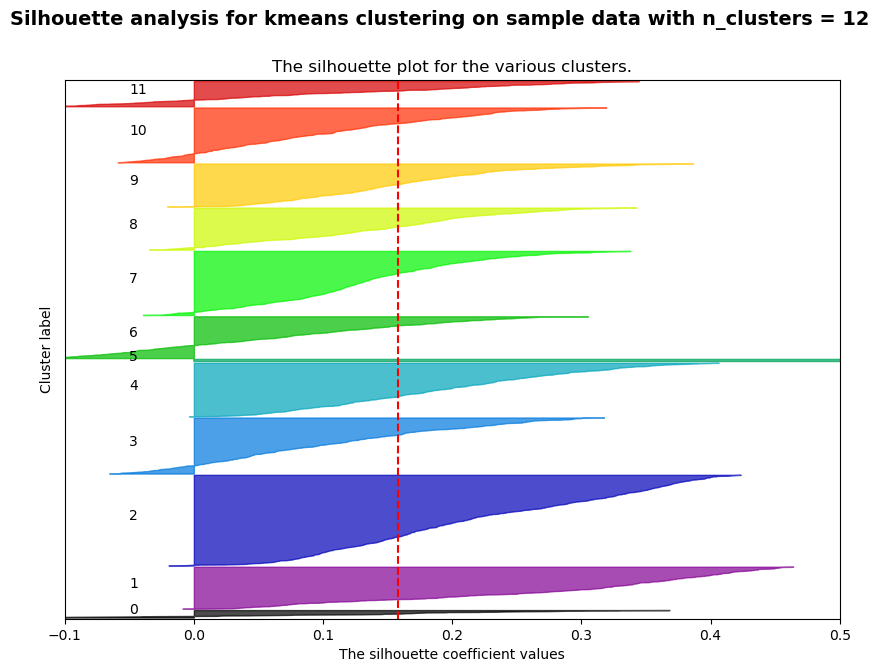

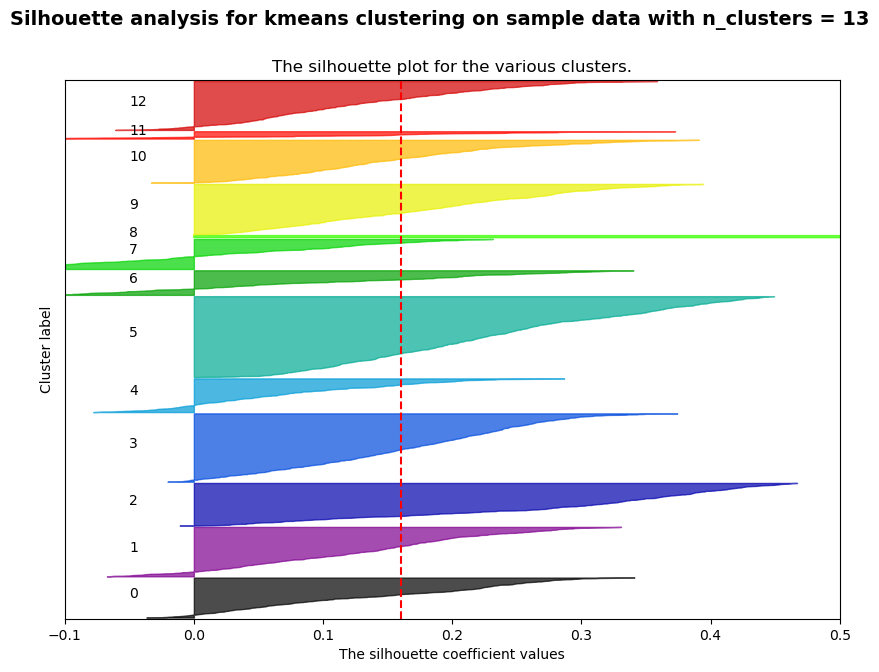

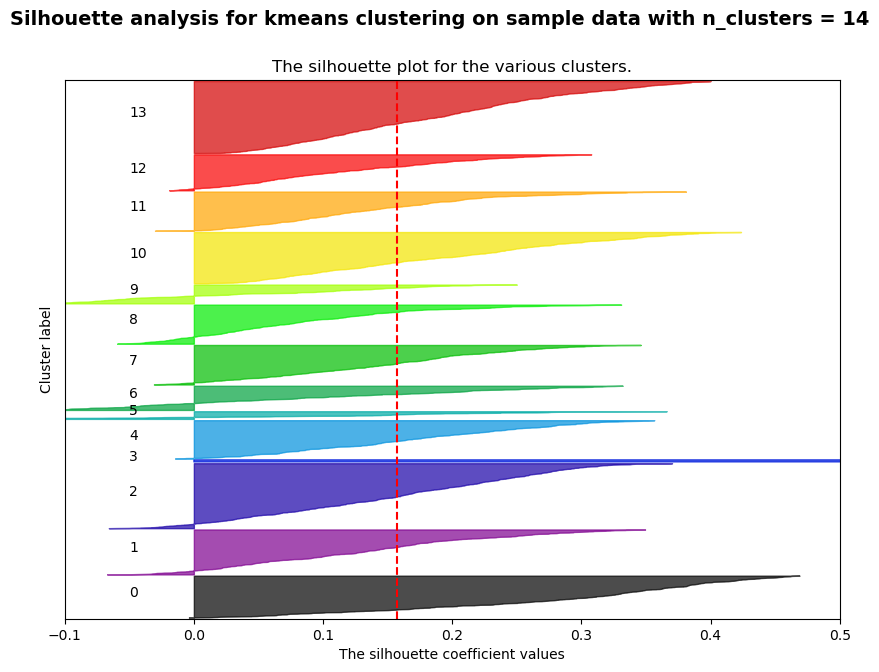

In [897]:
# Experiment 1 Kmeans - PCA - House data\
silplot(X1_tr_pca[:,0:pca_1], 'kmeans', 'House Prices', exp="1")
X1_tr_exp1 = KMeans(6, random_state=0).fit_predict(X1_tr_pca[:,0:pca_1])

Using kmeans on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.11655634972712313
Using kmeans on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.12058891460327127
Using kmeans on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.1146342120515637
Using kmeans on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.13149671982242256
Using kmeans on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.15121271100550754
Using kmeans on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.15430541157315908
Using kmeans on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.16131107648099857
Using kmeans on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.1624425006951555
Using kmeans on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.1615680933718914
Using kmeans

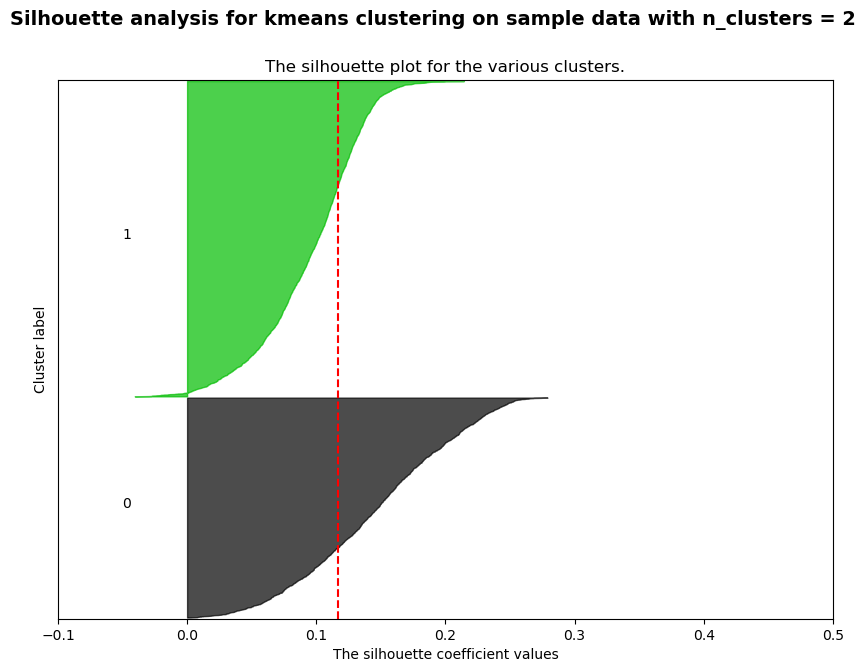

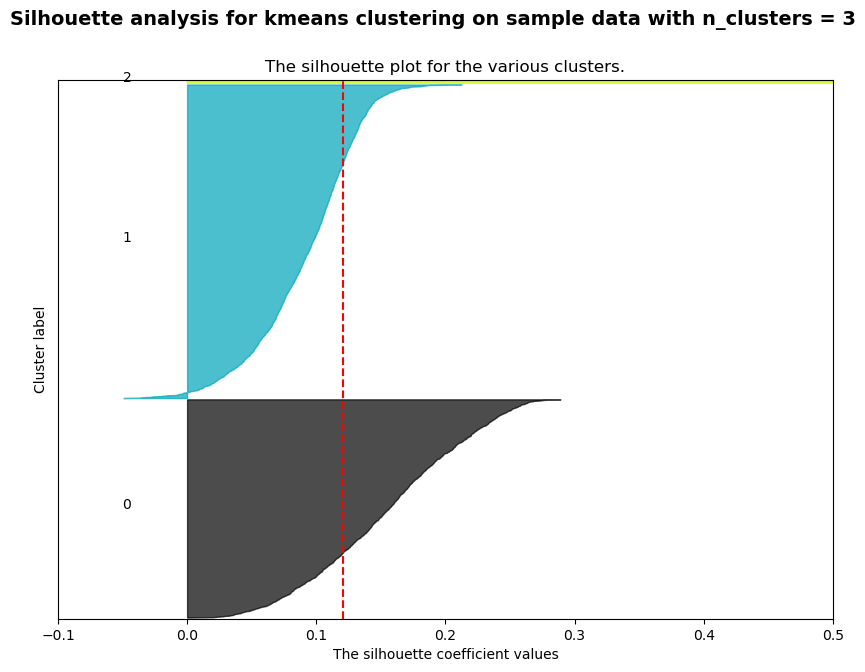

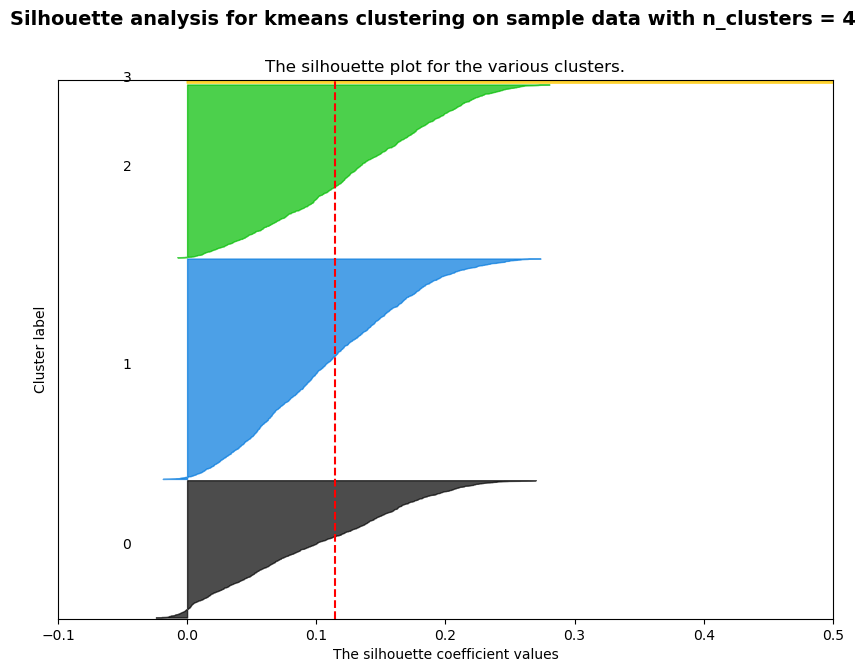

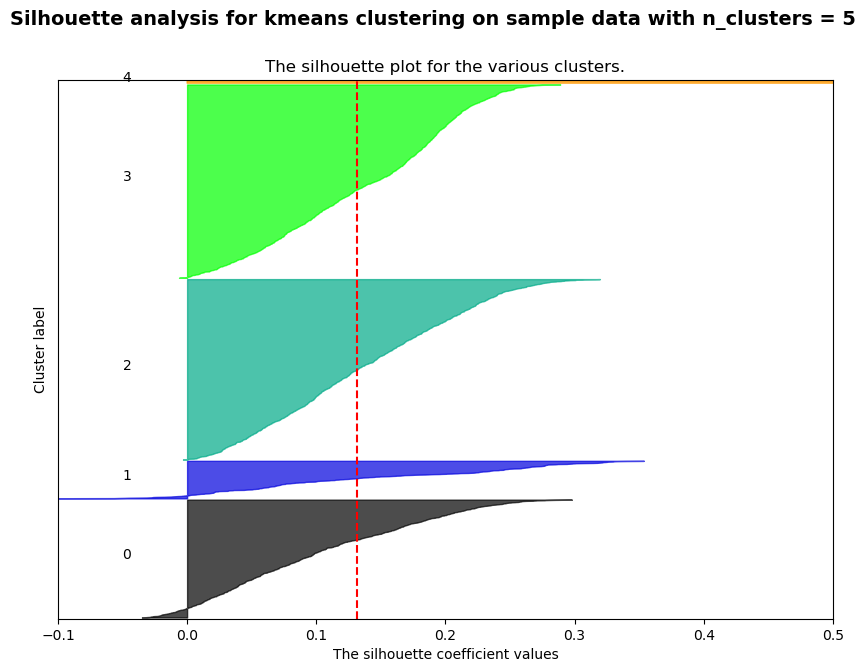

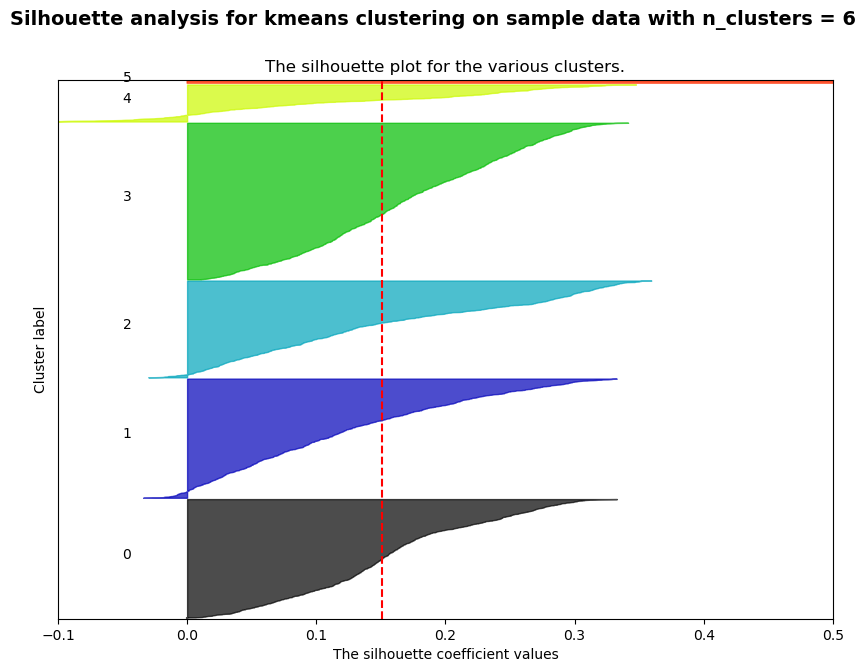

...

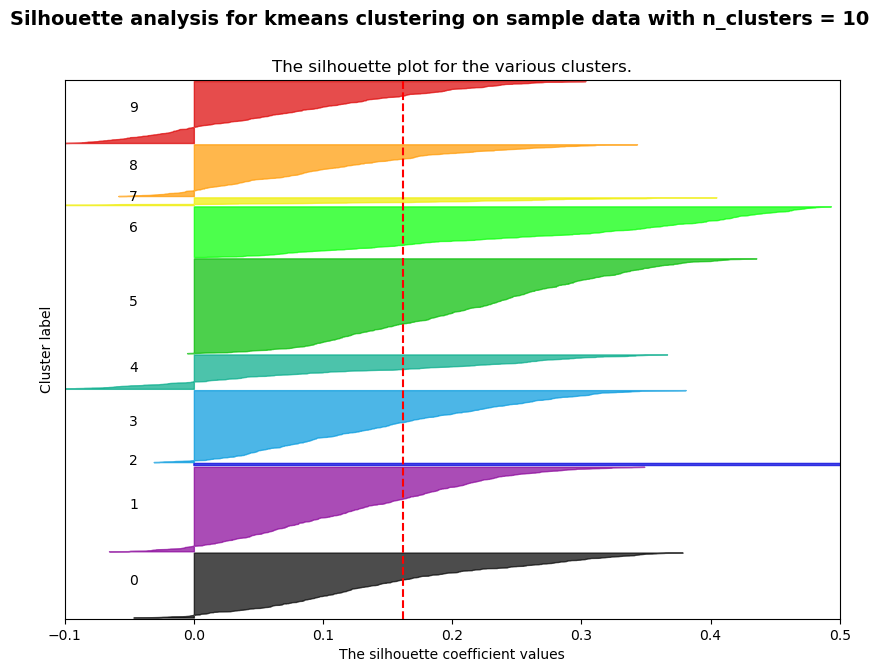

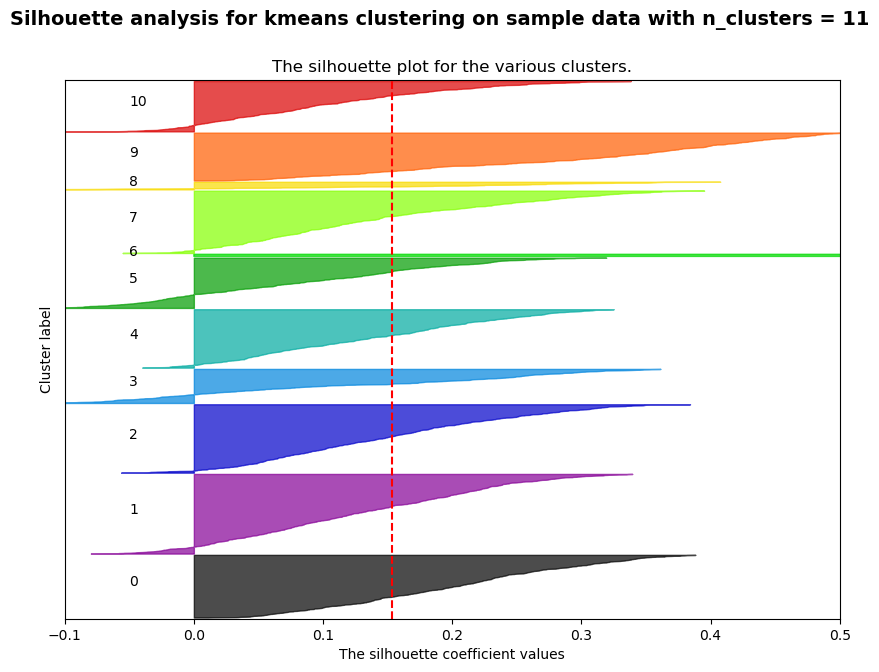

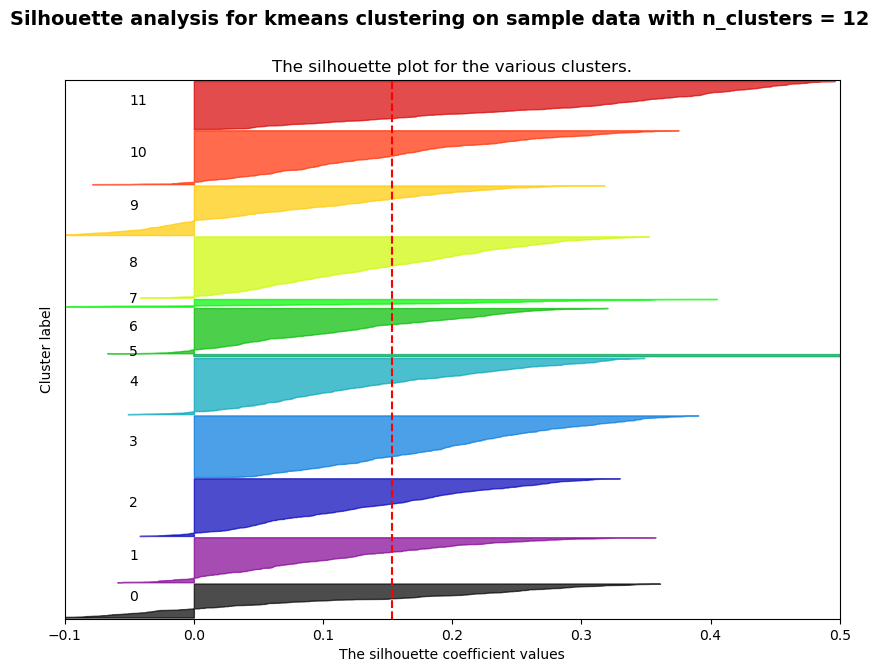

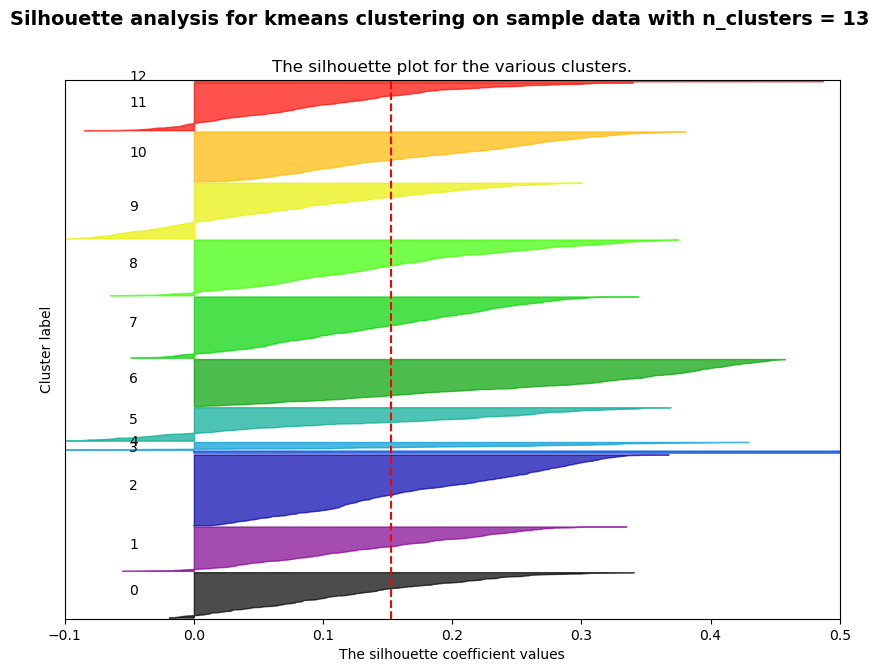

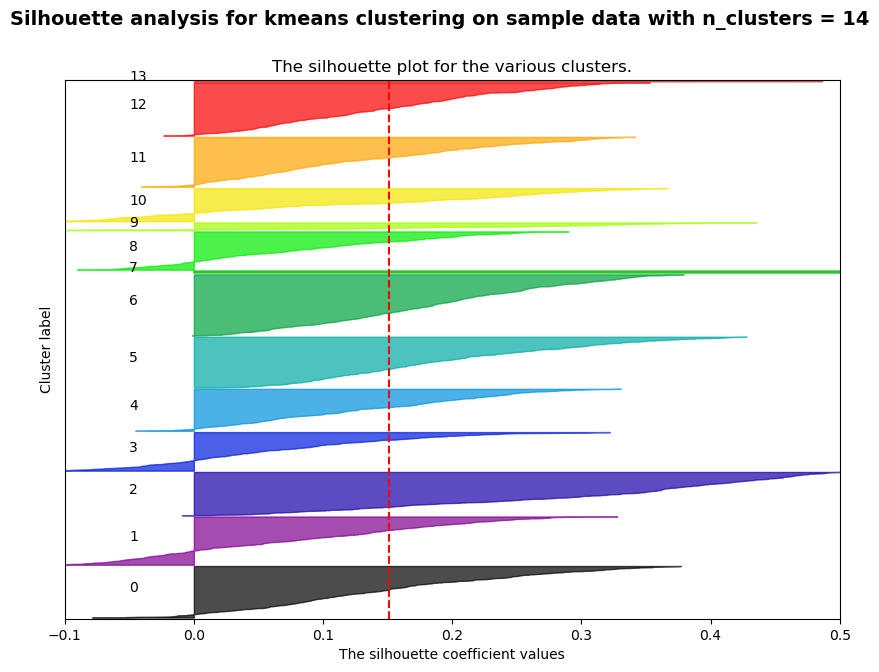

In [898]:
# Experiment 2 Kmeans - ICA - House data
silplot(X1_tr_ica[:,0:ica_1], 'kmeans', 'House Prices', exp="2")
X1_tr_exp2 = KMeans(8, random_state=0).fit_predict(X1_tr_ica[:,0:ica_1])


Using kmeans on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.22582785176495934
Using kmeans on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.23291851770654817
Using kmeans on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.1991224906170381
Using kmeans on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.1701945001248522
Using kmeans on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.15373418660096014
Using kmeans on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.154117712620579
Using kmeans on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.15302829930552564
Using kmeans on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.14600414242422302
Using kmeans on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.1524094654842972
Using kmeans o

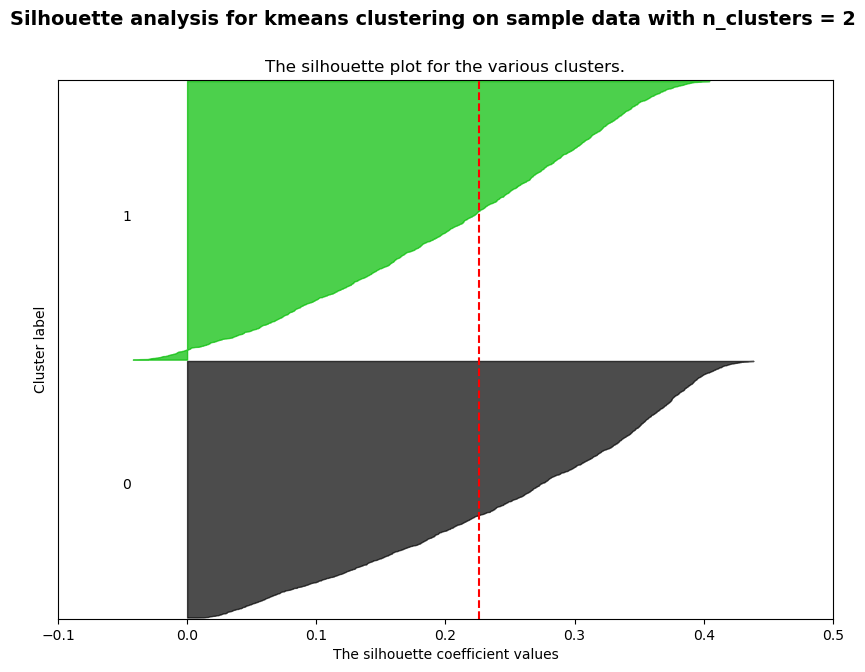

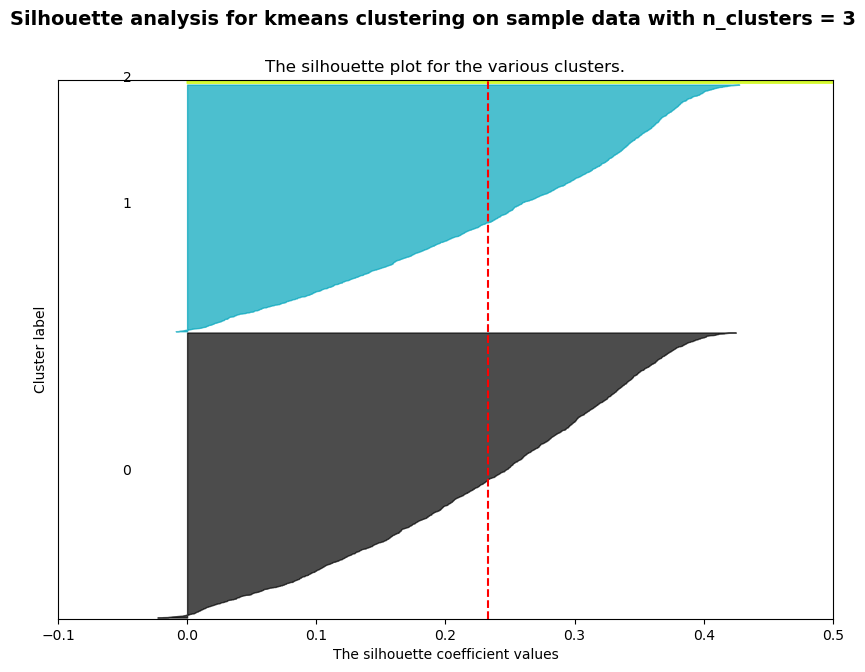

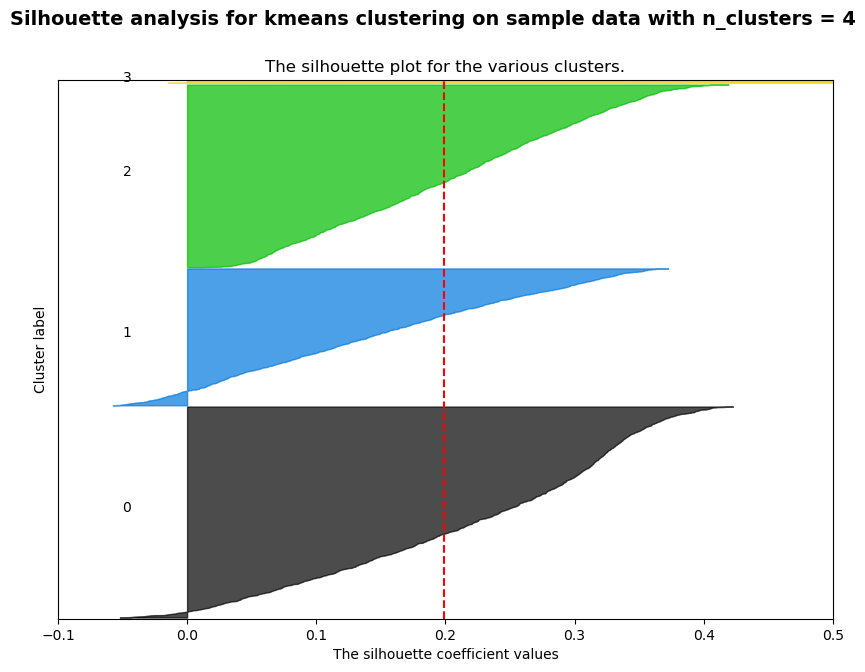

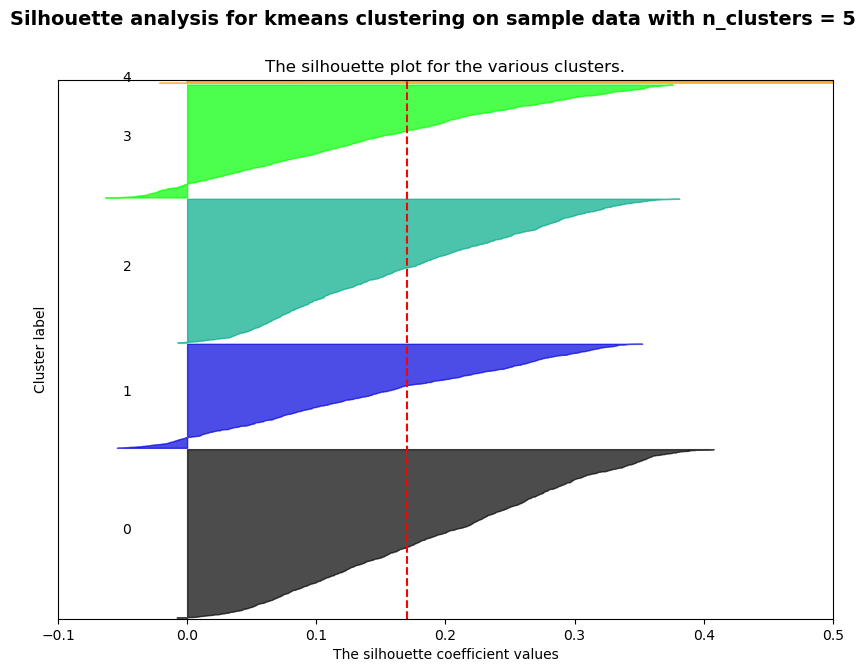

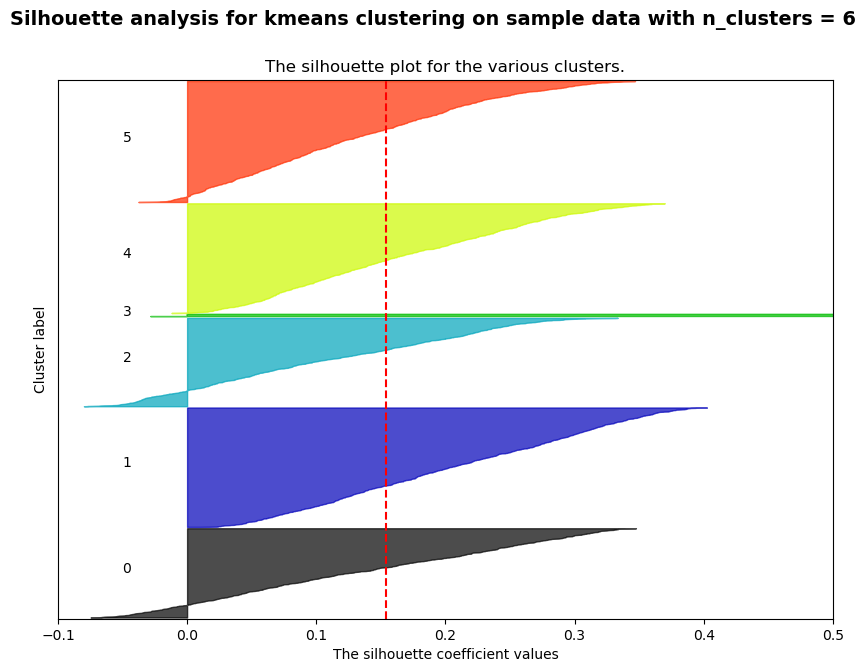

...

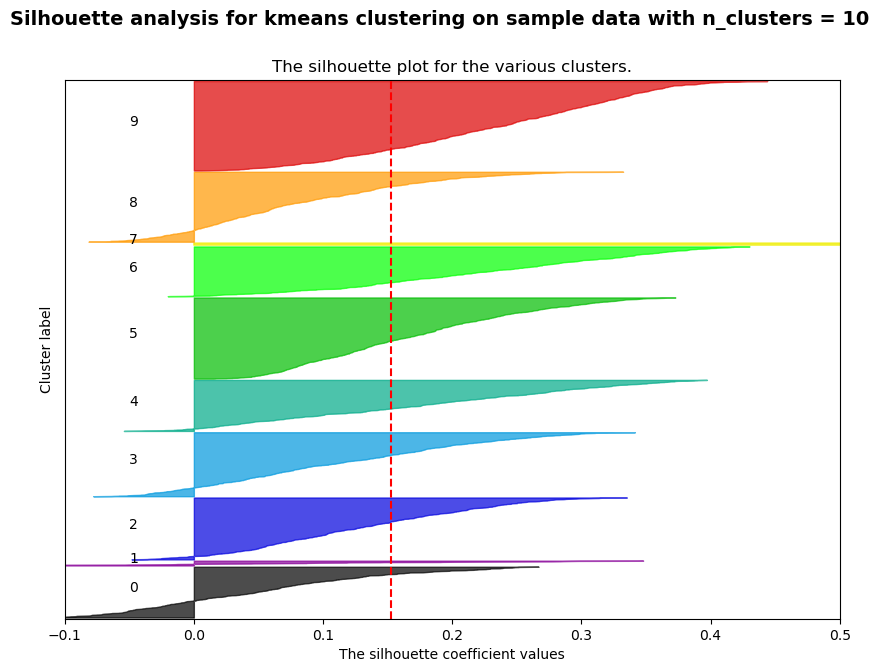

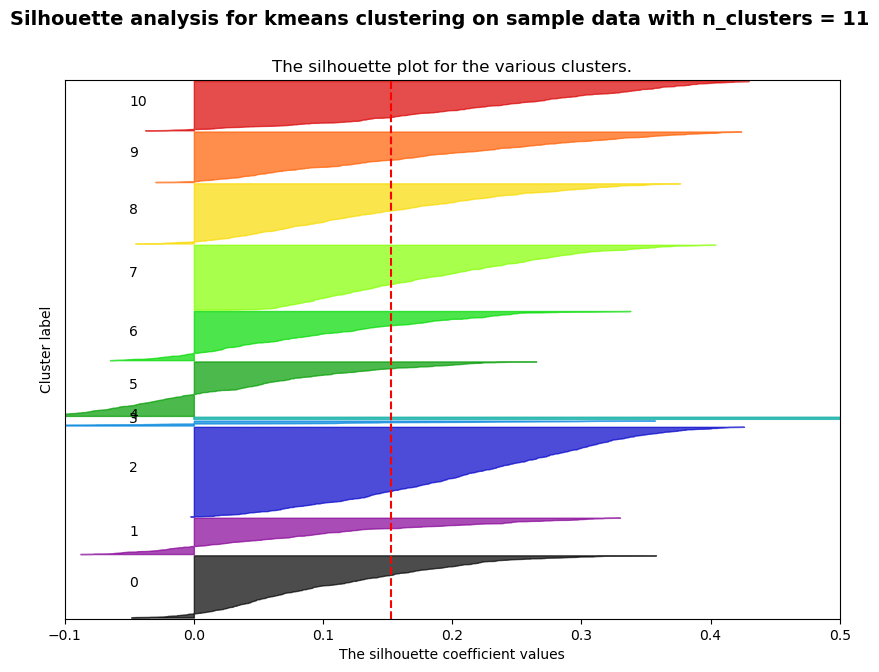

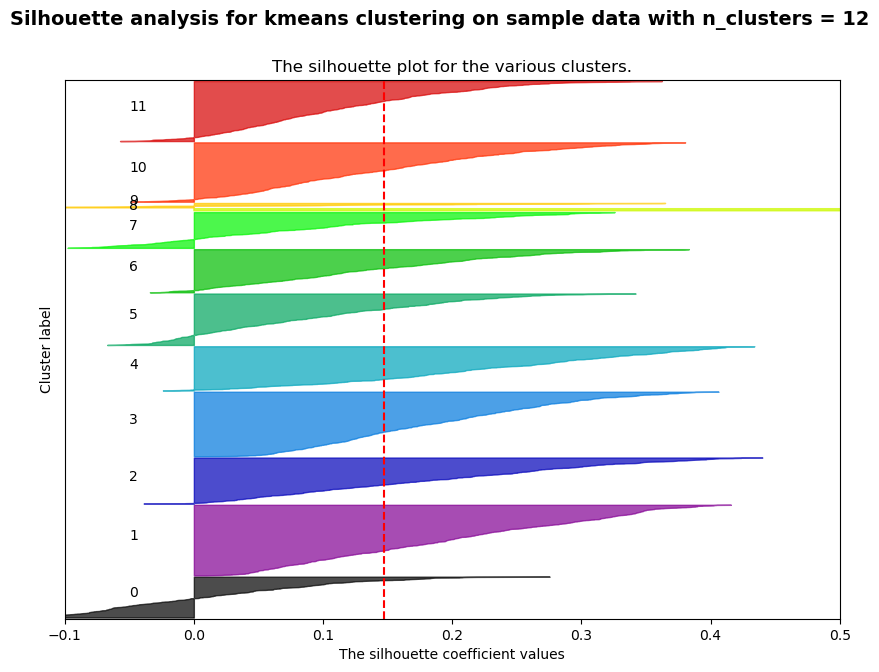

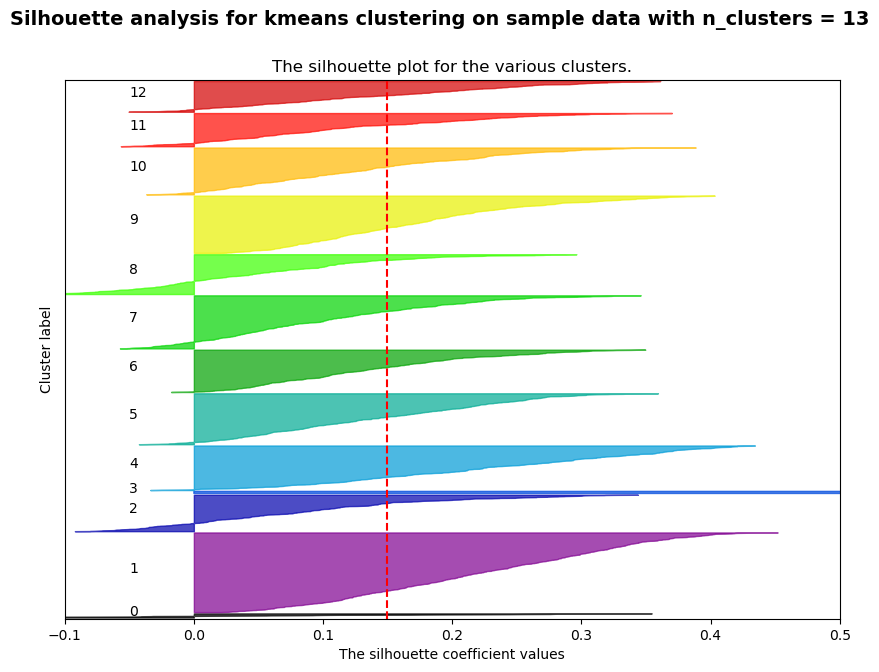

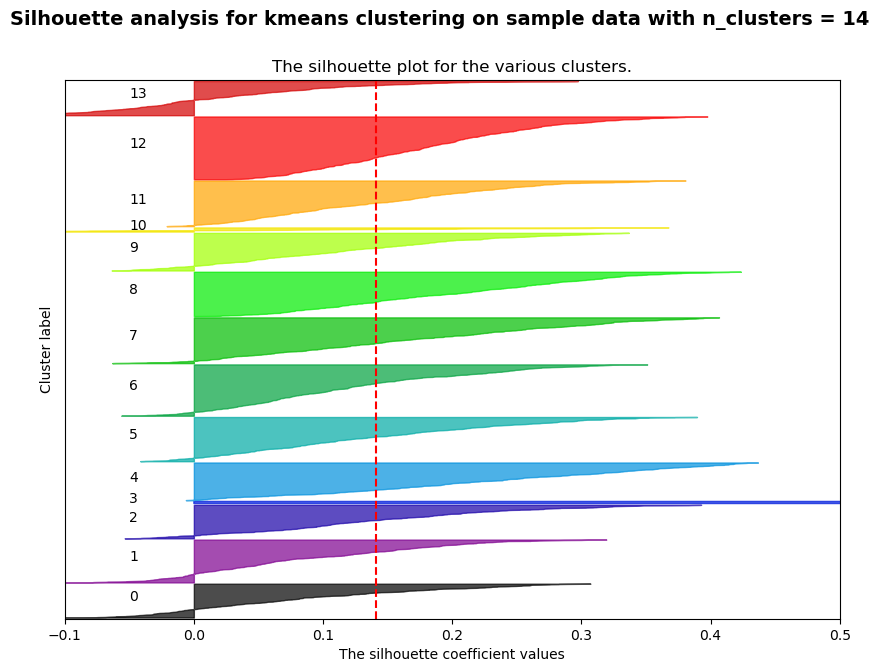

In [899]:
# Experiment 3 Kmeans - RCA - House data
silplot(X1_tr_rca[:,0:rca_1], 'kmeans', 'House Prices', exp="3")
X1_tr_exp3 = KMeans(3, random_state=0).fit_predict(X1_tr_rca[:,0:rca_1],)


Using kmeans on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.250204744973958
Using kmeans on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.25724492191982007
Using kmeans on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.26146115610370696
Using kmeans on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.2686266339532113
Using kmeans on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.26266480845028833
Using kmeans on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.24011655514452543
Using kmeans on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.22235116858797382
Using kmeans on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.21949682788168529
Using kmeans on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.22174531823738677
Using kmeans

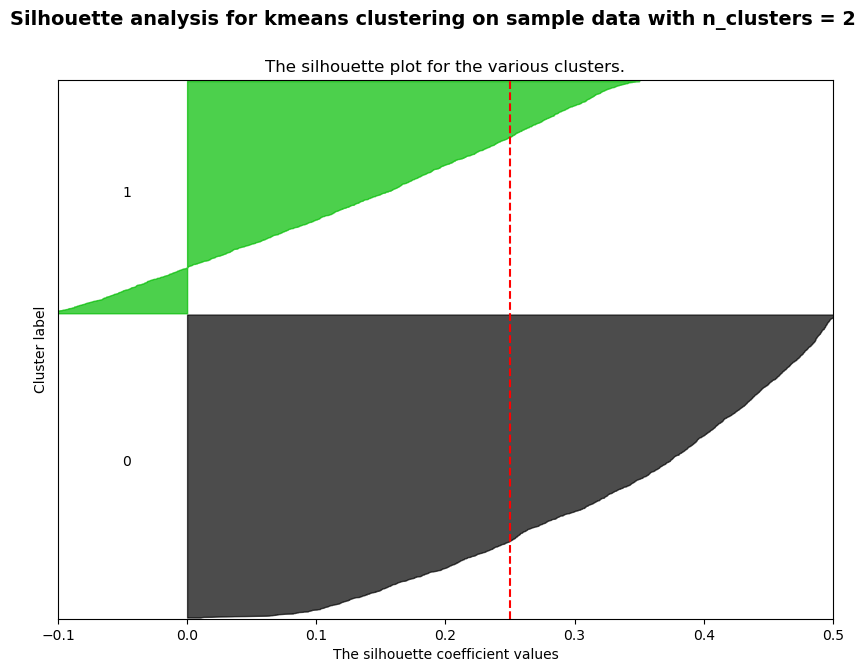

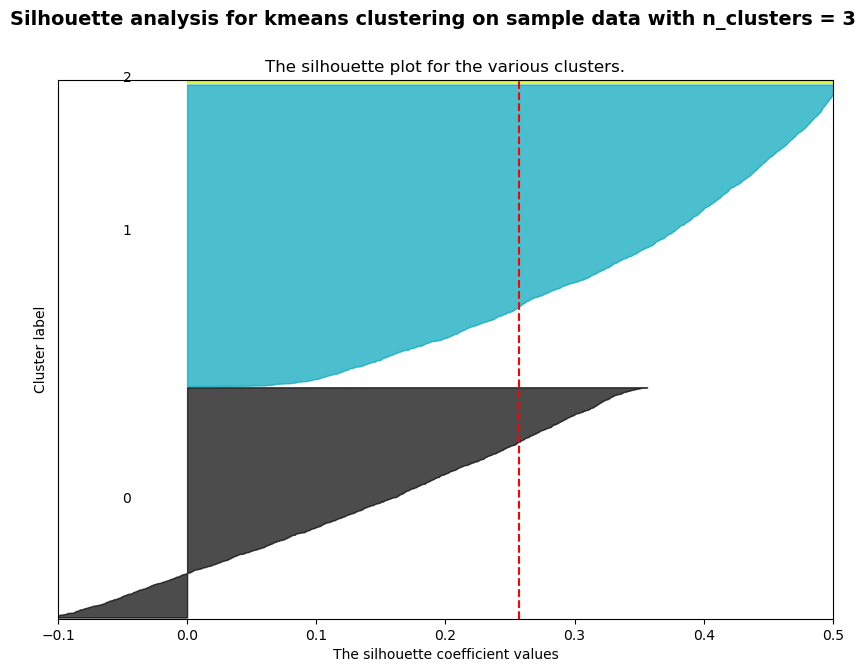

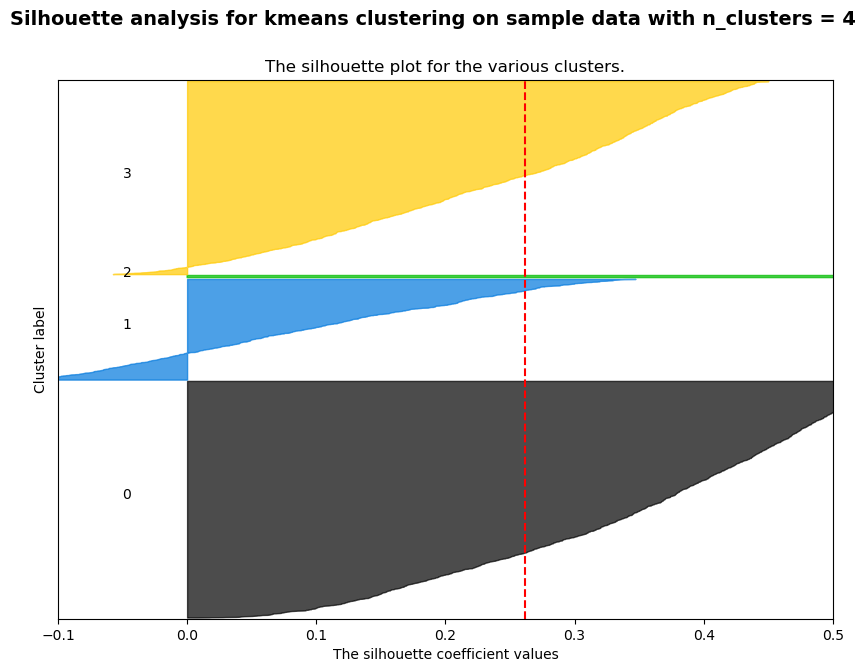

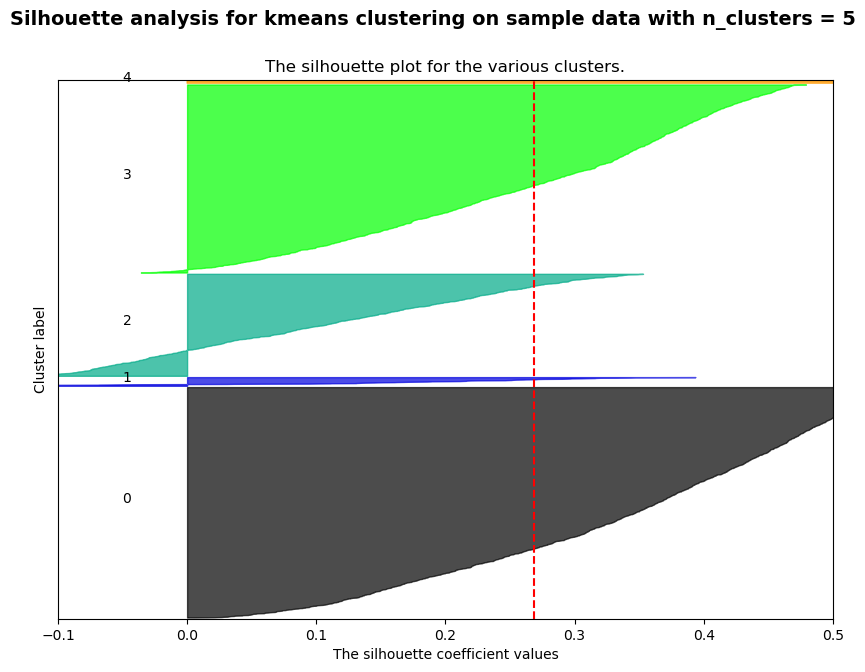

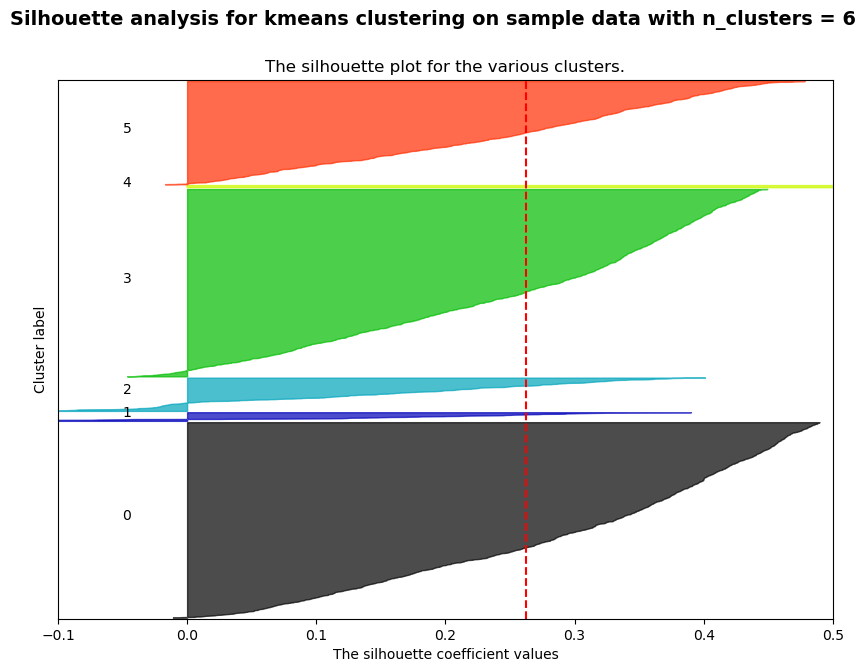

...

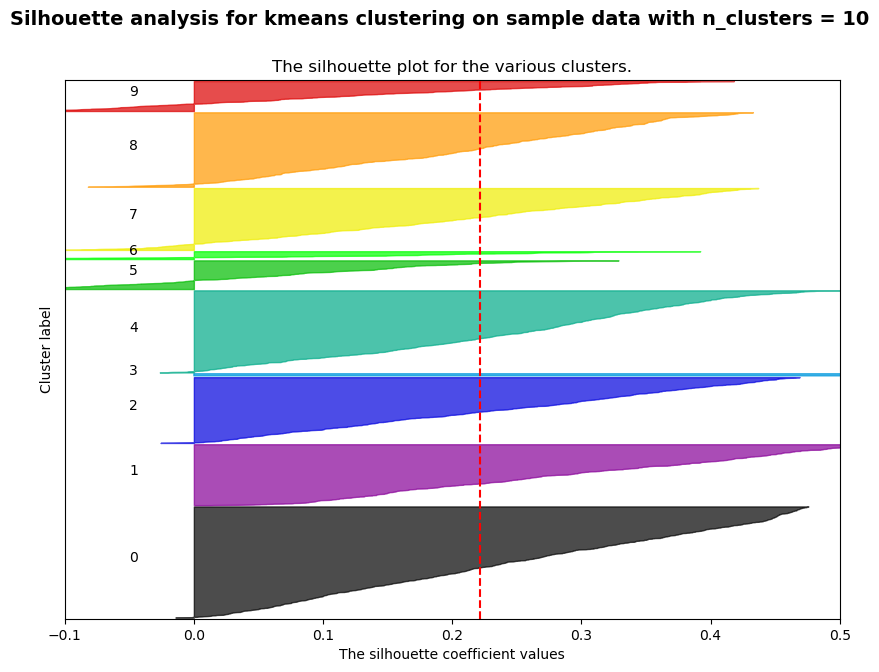

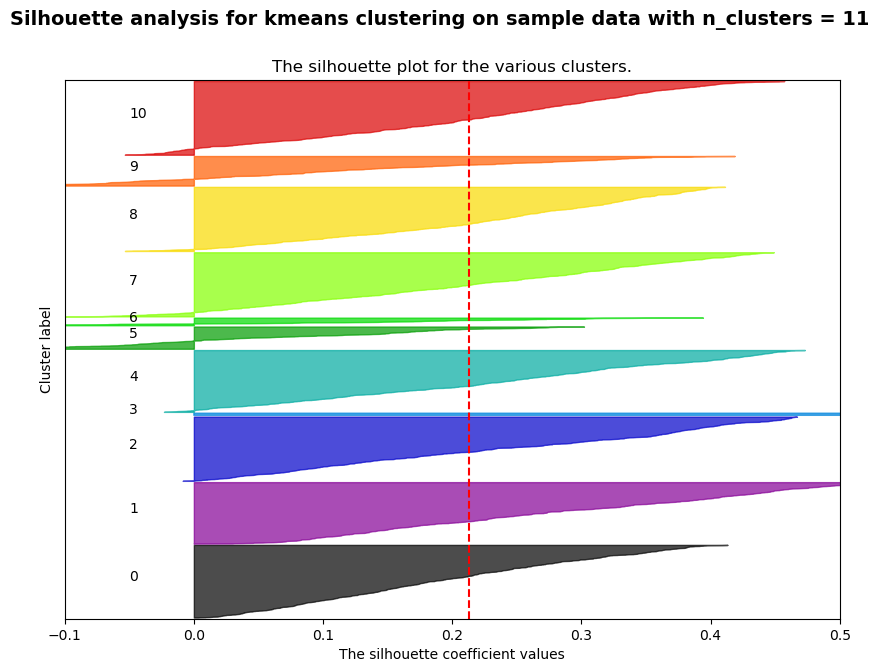

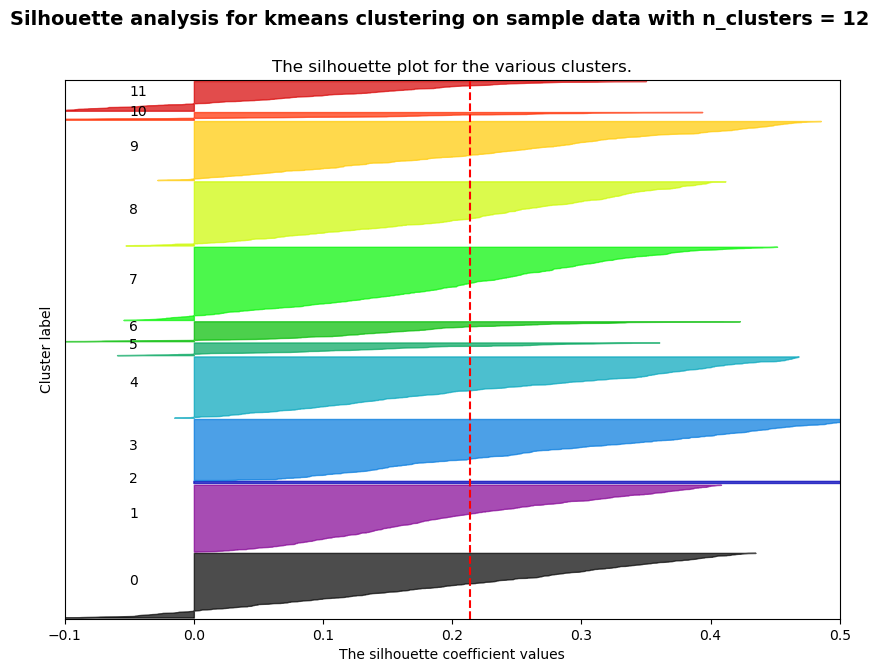

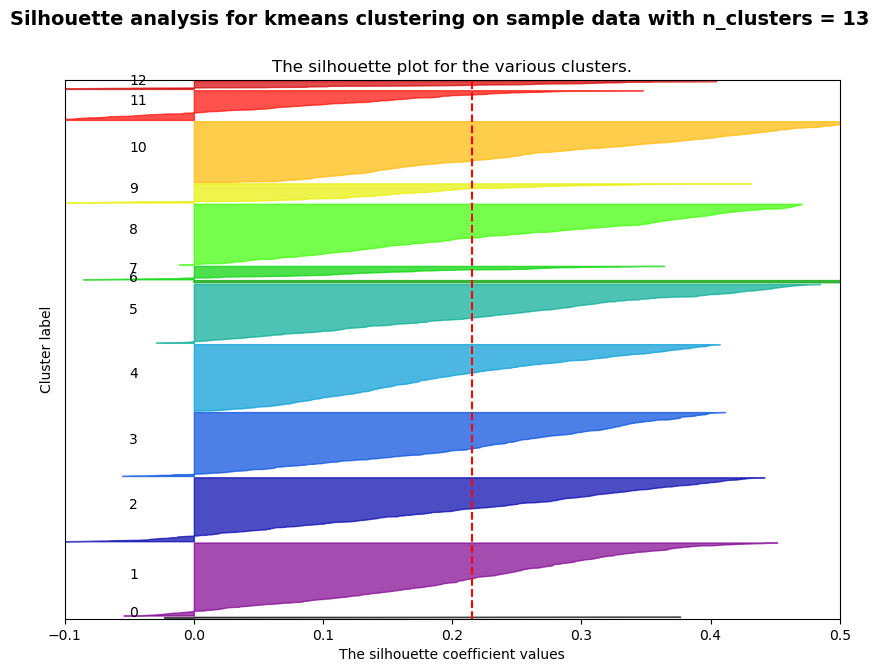

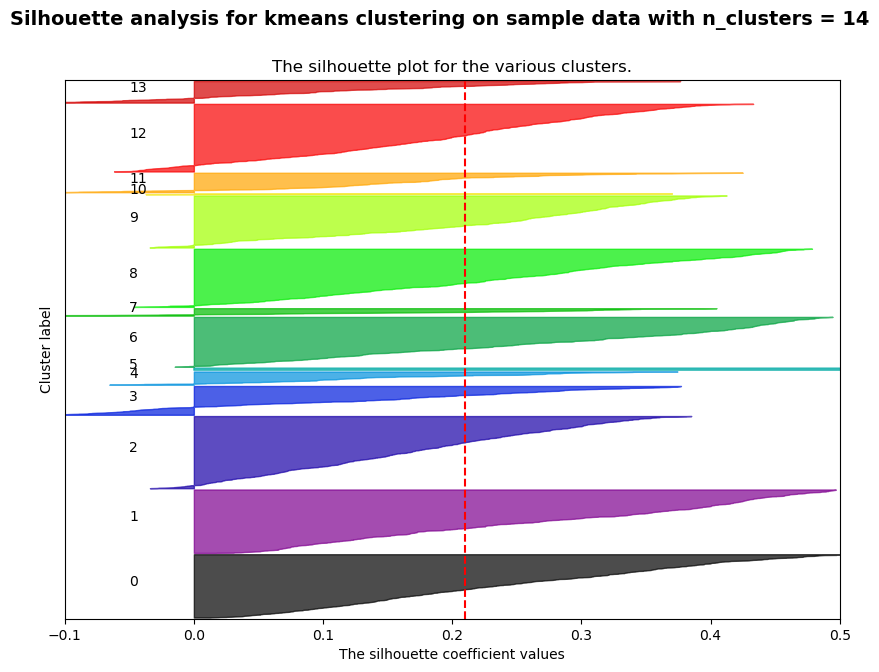

In [900]:
# Experiment 4 Kmeans - k-best - House data
silplot(X1_scal[:,feats1], 'kmeans', 'House Prices', exp="4")
X1_tr_exp4 = KMeans(5, random_state=0).fit_predict(X1_scal[:,feats1],)


Using gmm on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.1468504395708812
Using gmm on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.1486344953235432
Using gmm on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.07762995126521544
Using gmm on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.06222977872073221
Using gmm on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.058415486764093943
Using gmm on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.05553605216483223
Using gmm on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.10547461681937088
Using gmm on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.08213402895086433
Using gmm on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.06364247917699134
Using gmm on dataset House Prices For

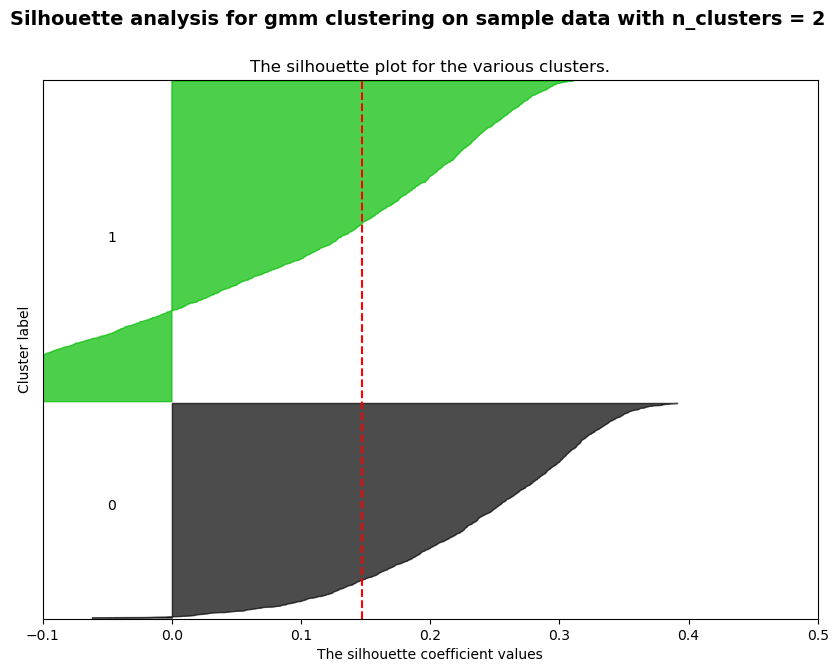

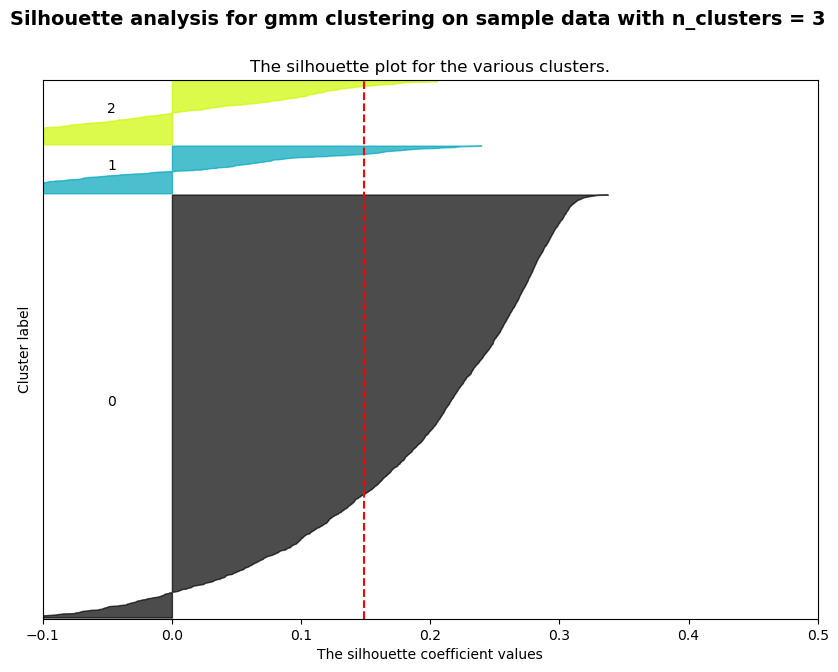

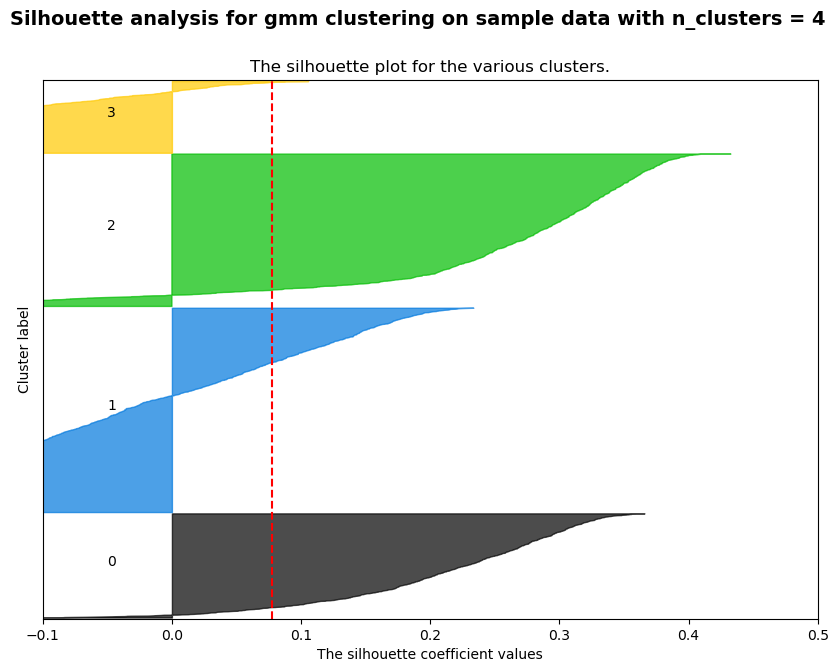

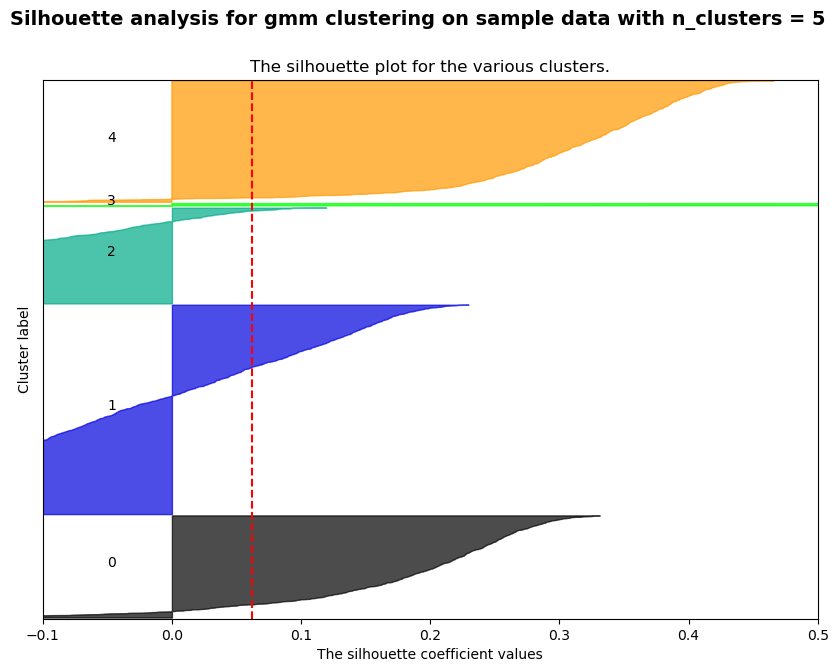

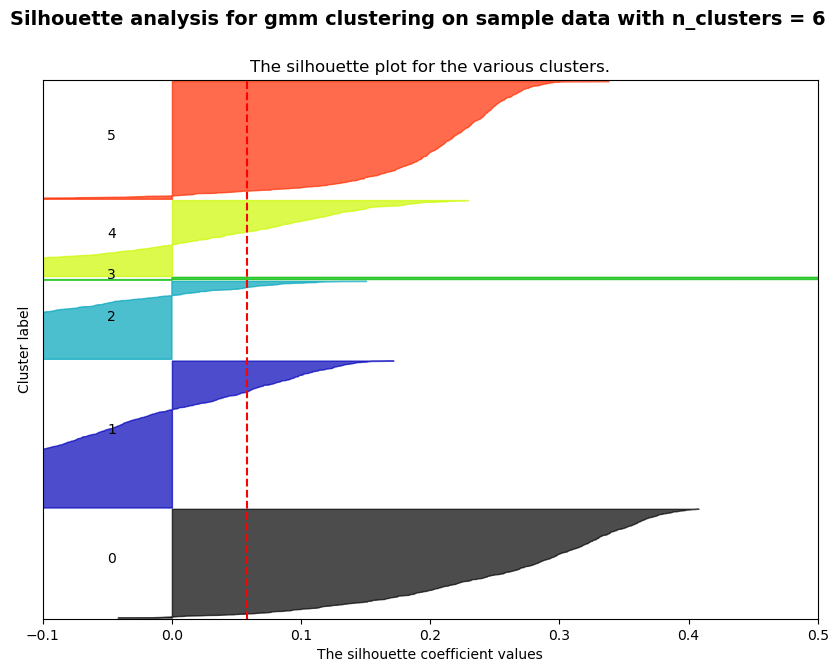

...

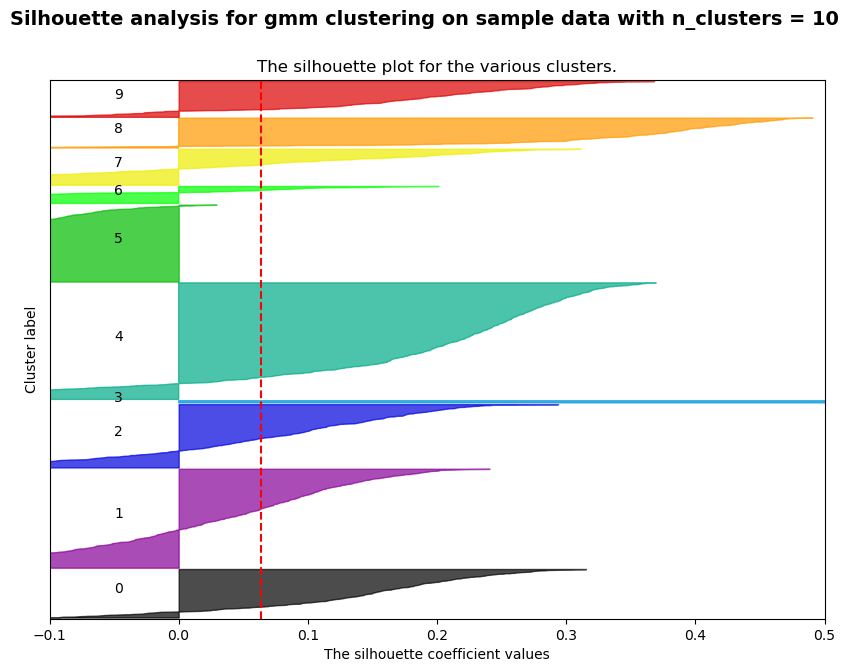

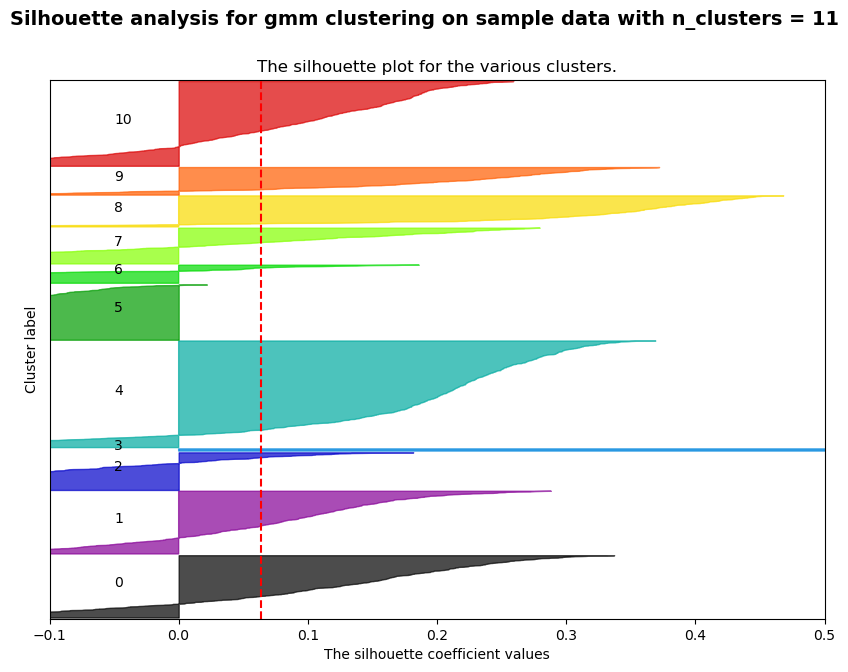

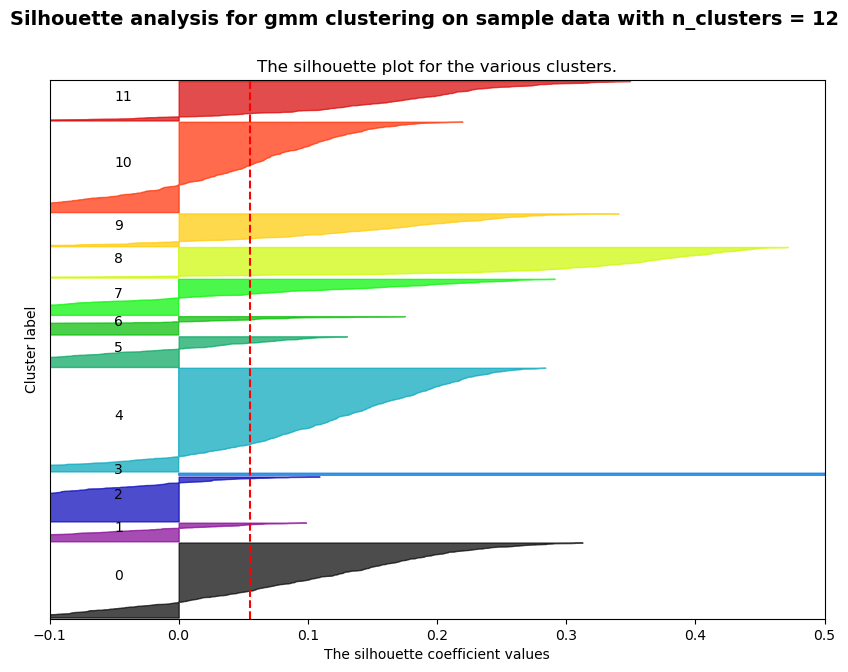

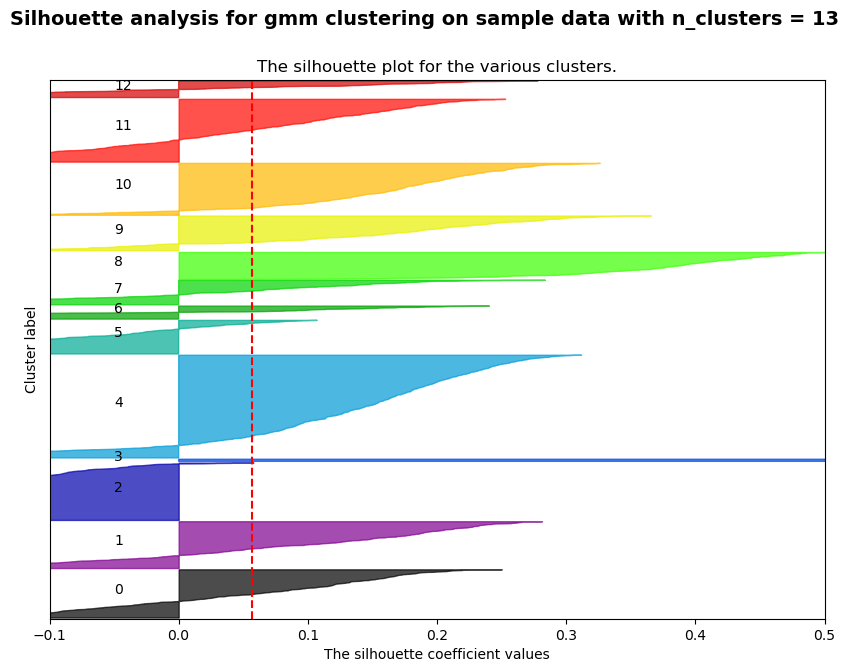

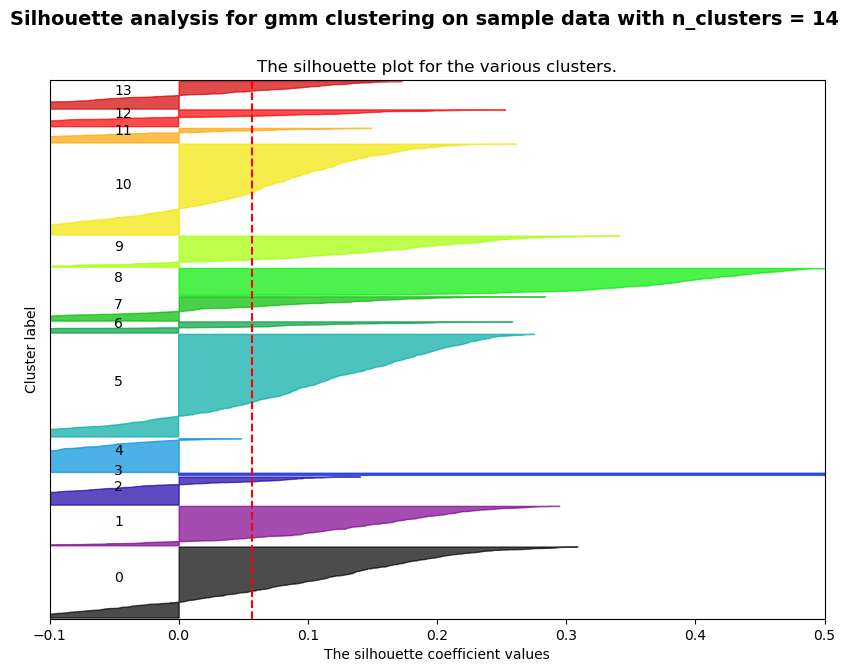

In [901]:
# Experiment 5 gmm - PCA - House data\
silplot(X1_tr_pca[:,0:pca_1], 'gmm', 'House Prices', exp="5")
X1_tr_exp5 = GM(6, random_state=0).fit_predict(X1_tr_pca[:,0:pca_1],)


Using gmm on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.2798603041272103
Using gmm on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.05603128814985756
Using gmm on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.08935481063327018
Using gmm on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.09828627940494213
Using gmm on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.08573590678496137
Using gmm on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.09958063473554465
Using gmm on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.08985493839068101
Using gmm on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.08226899680352105
Using gmm on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.0779435326338097
Using gmm on dataset House Prices For 

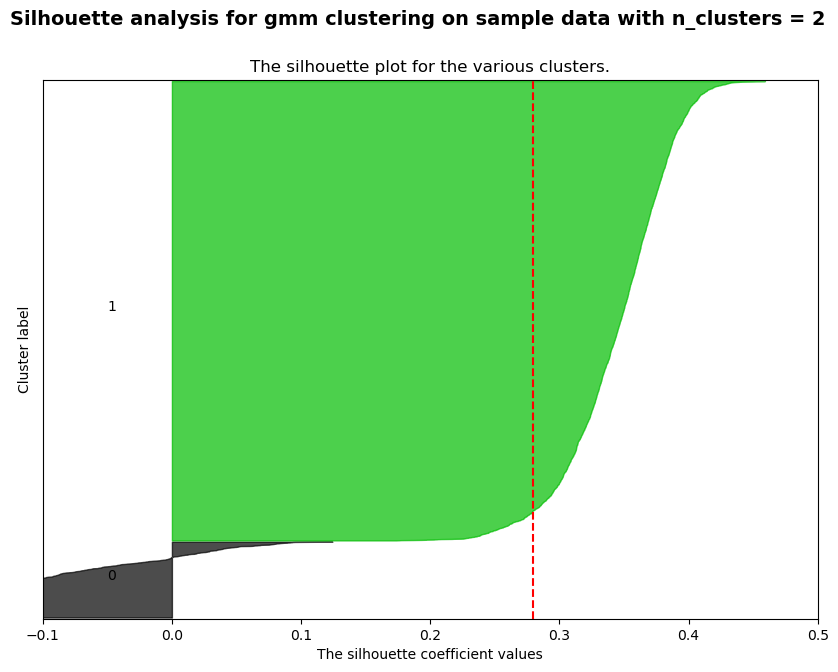

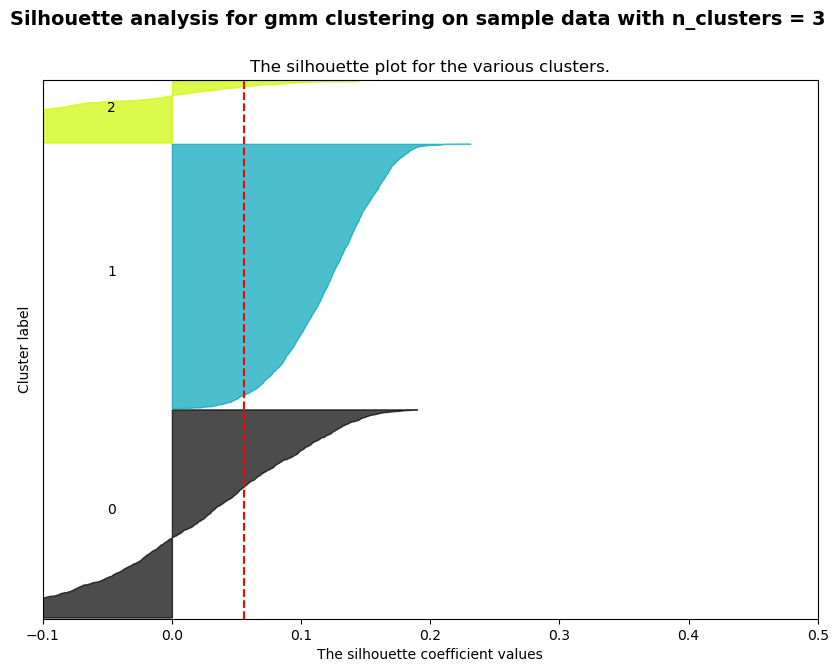

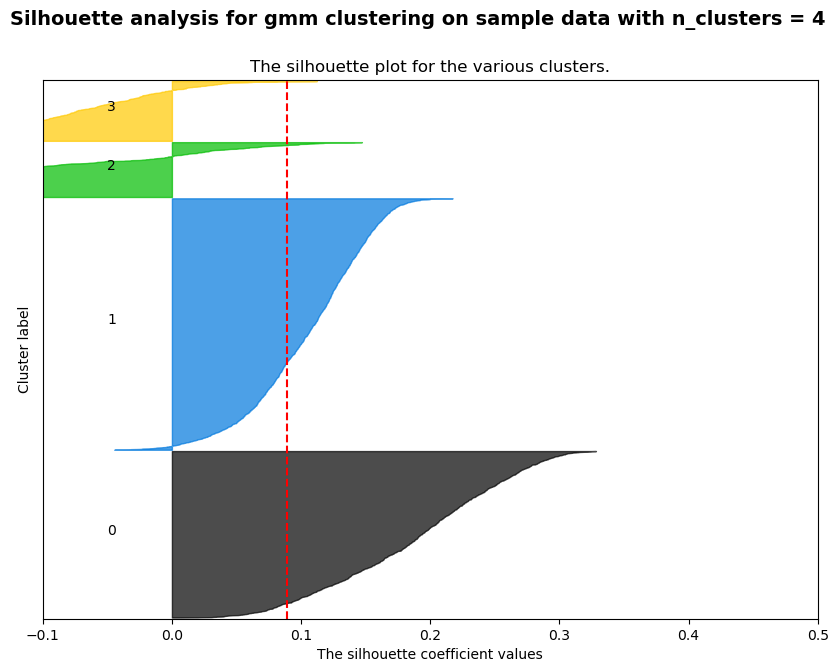

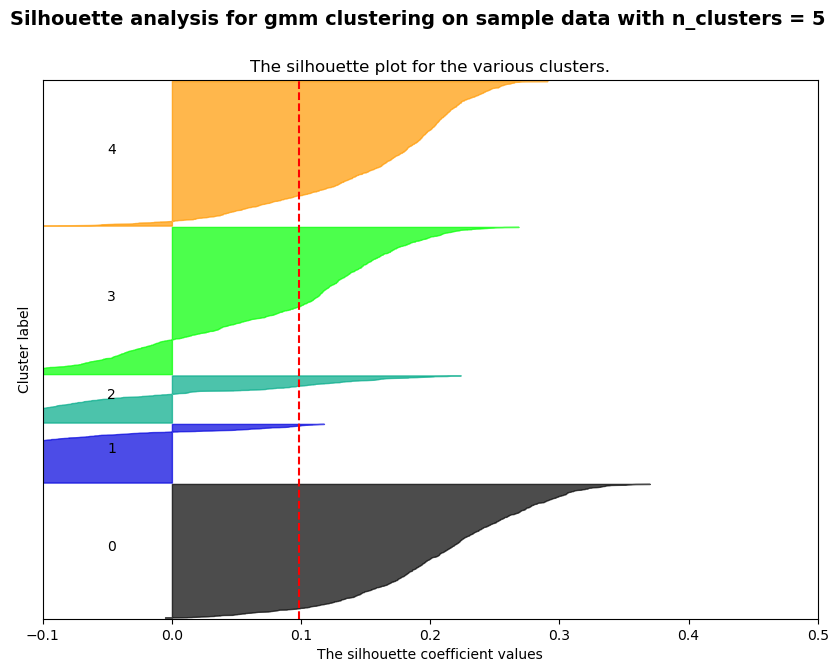

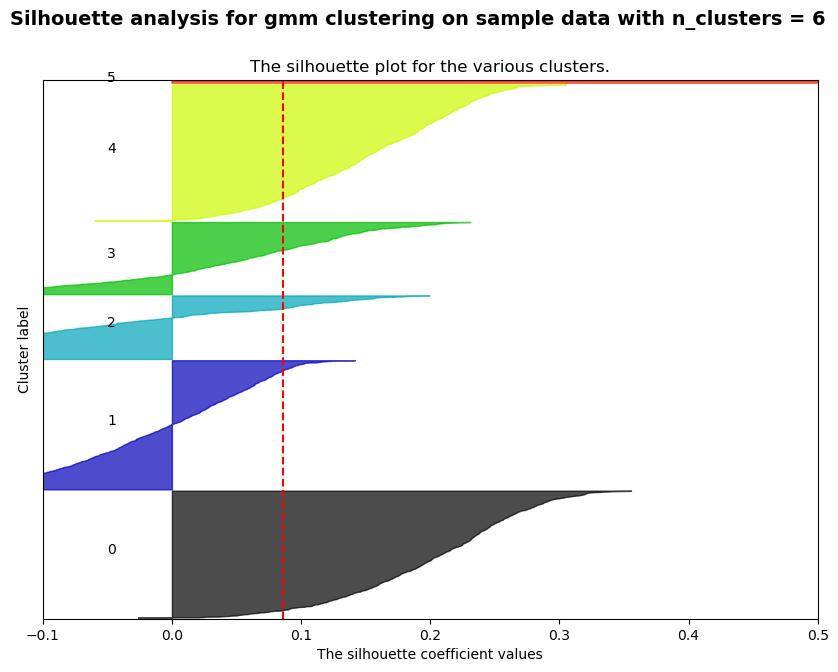

...

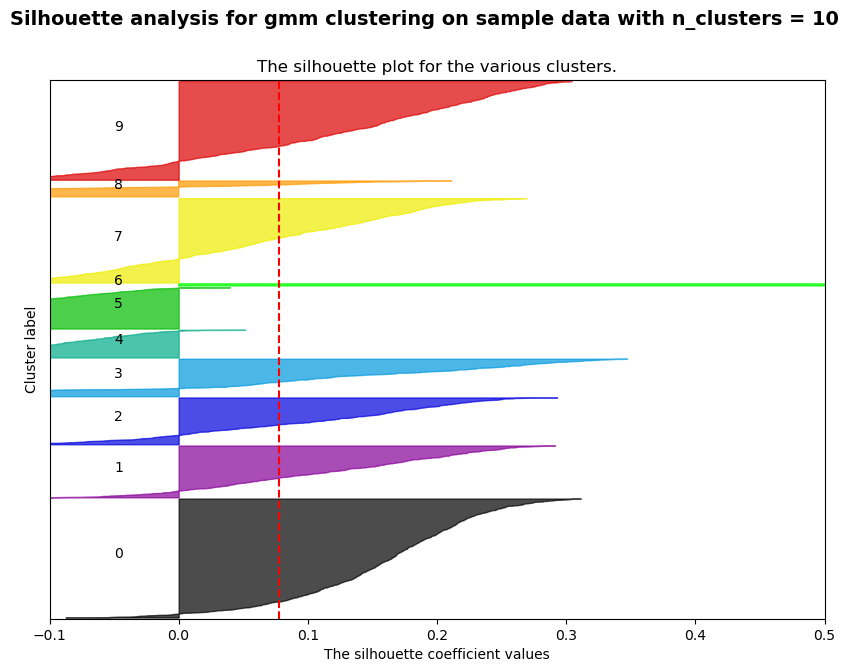

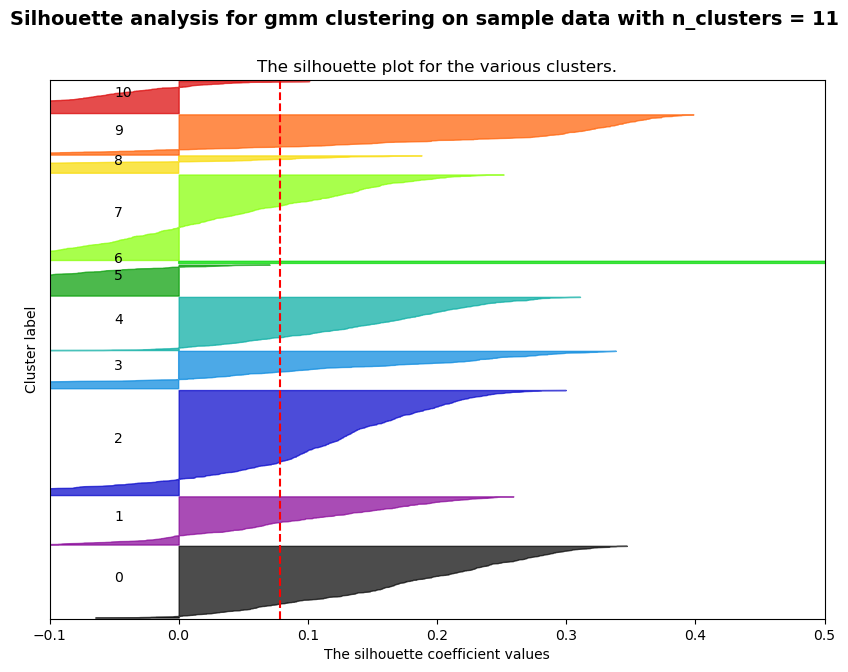

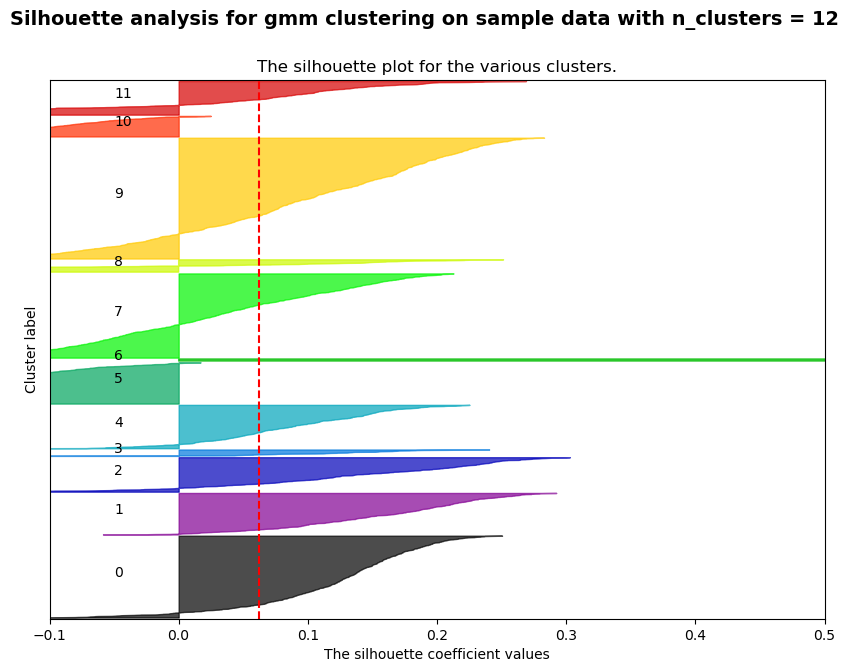

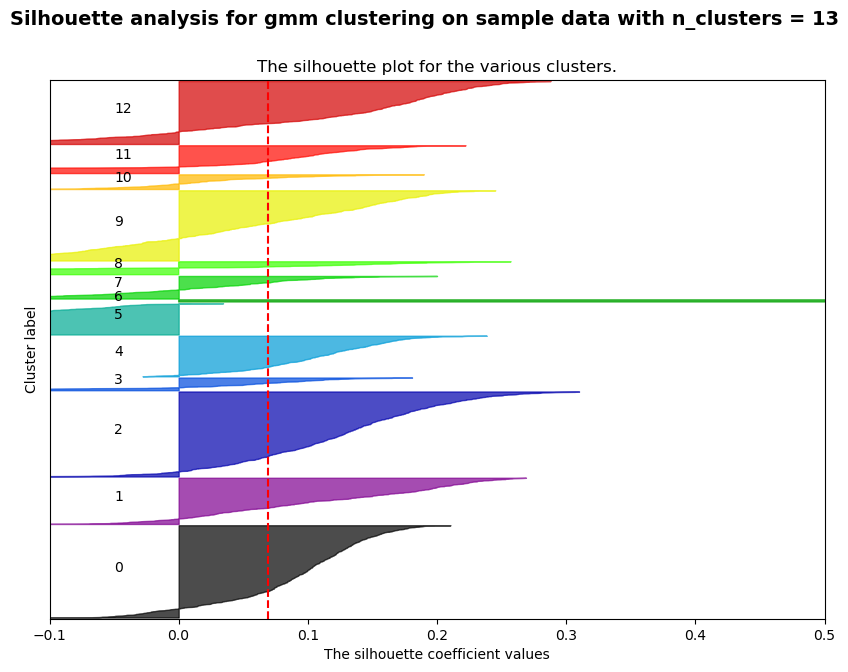

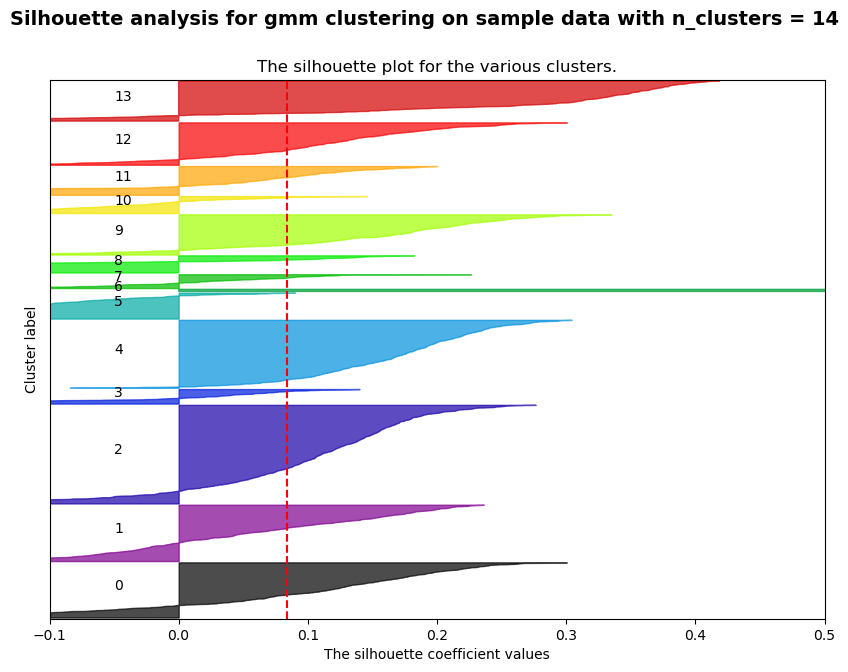

In [902]:
# Experiment 6 gmm - ICA - House data
dt = X1_tr_ica[:,0:ica_1]
silplot(dt, 'gmm', 'House Prices', exp="6")
X1_tr_exp6 = GM(8, random_state=0).fit_predict(dt)


Using gmm on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.22081880890277486
Using gmm on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.16242615229197477
Using gmm on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.08175978161826573
Using gmm on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.05412287047542576
Using gmm on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.06458051829061574
Using gmm on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.05154520406714868
Using gmm on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.03956114284809651
Using gmm on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.03036912323469539
Using gmm on dataset House Prices For n_clusters = 10 The average silhouette_score is : -0.007385558567837175
Using gmm on dataset House Prices 

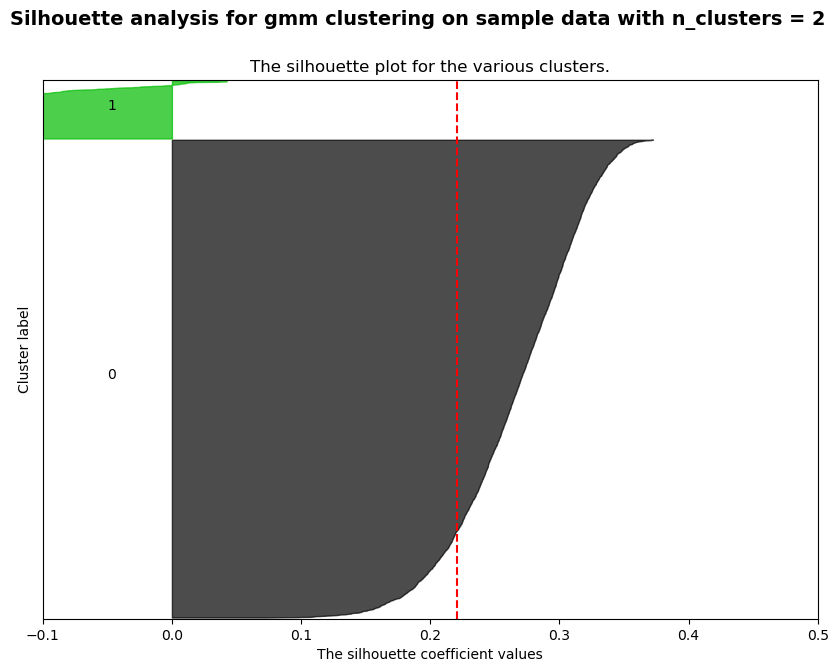

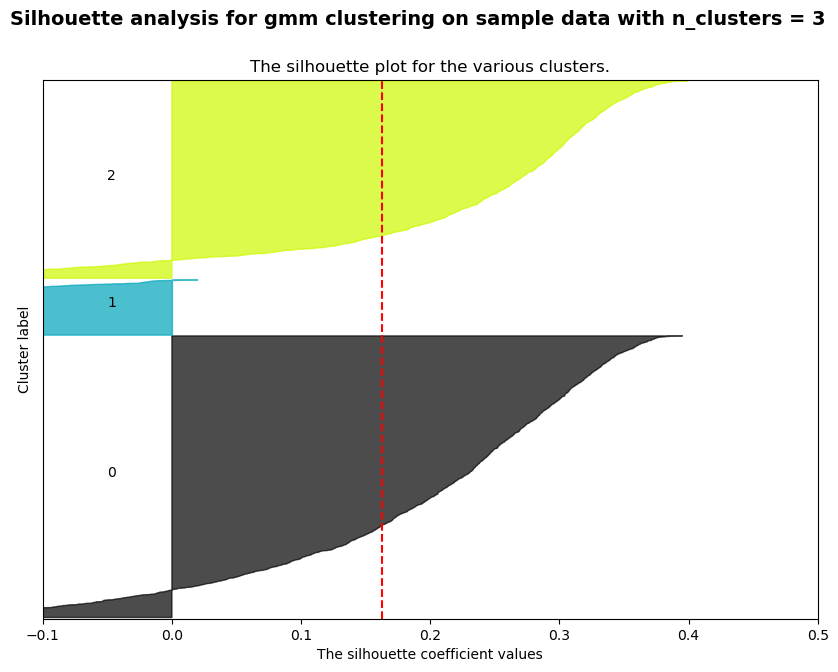

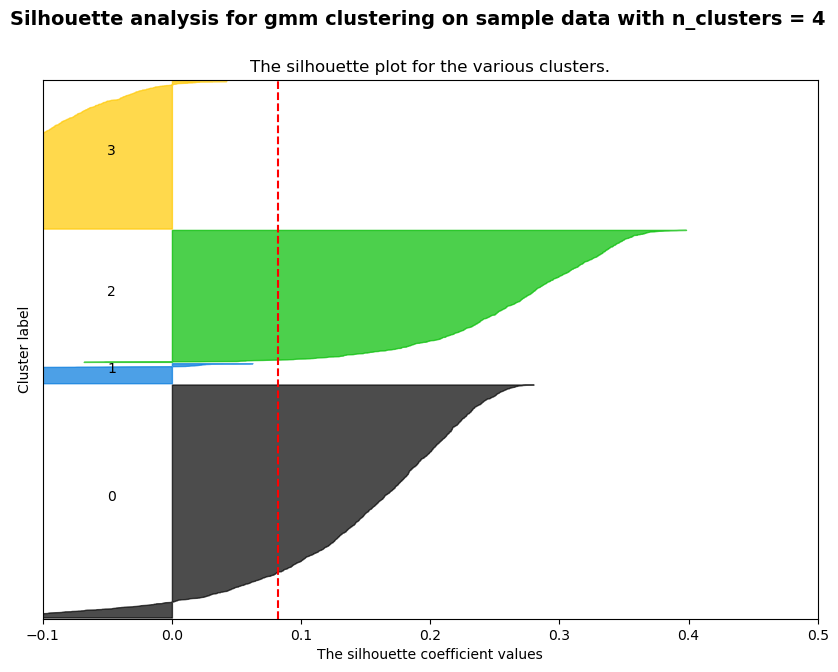

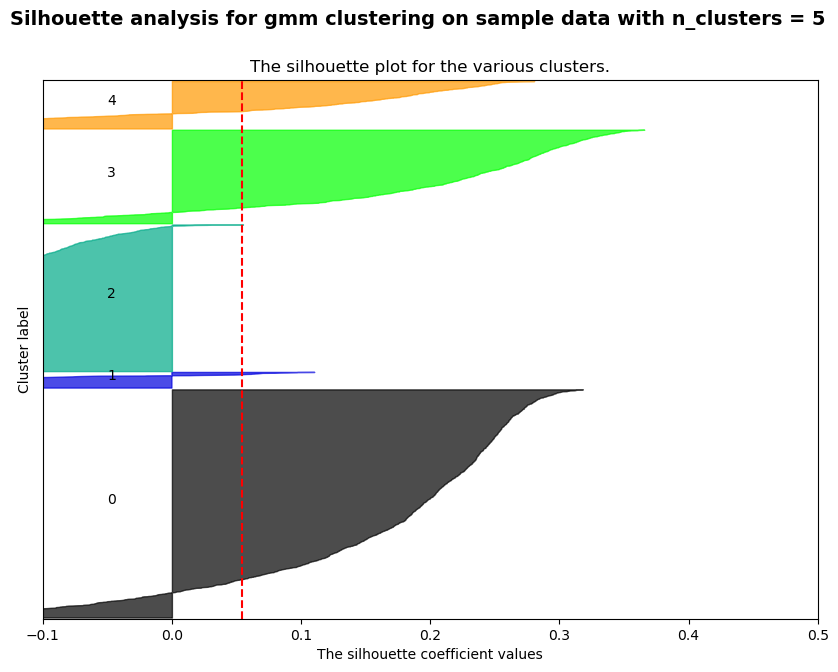

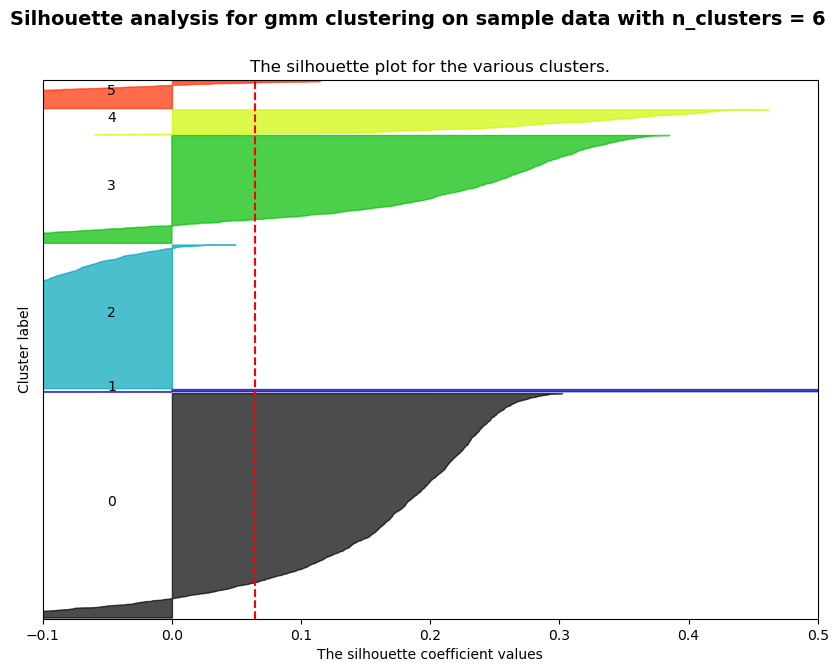

...

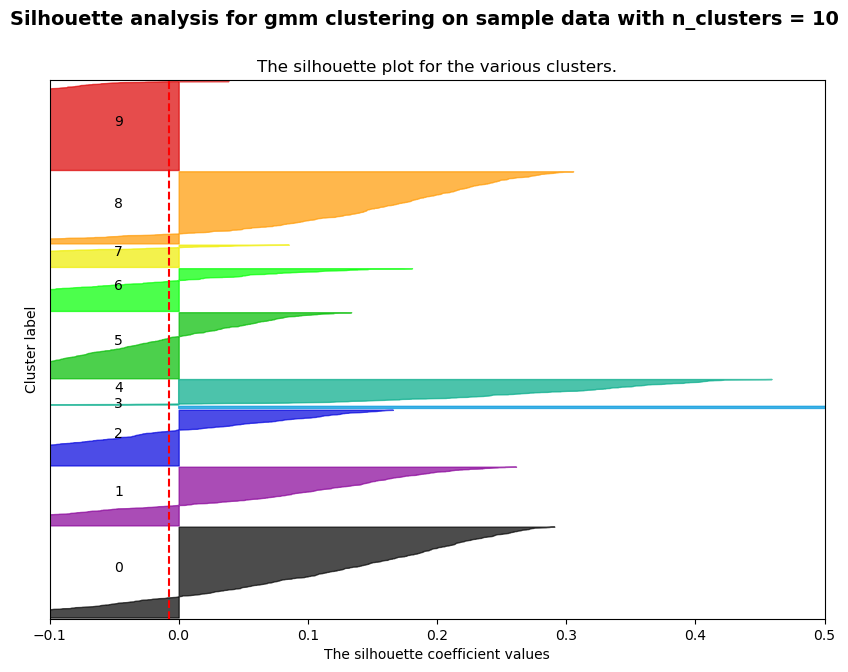

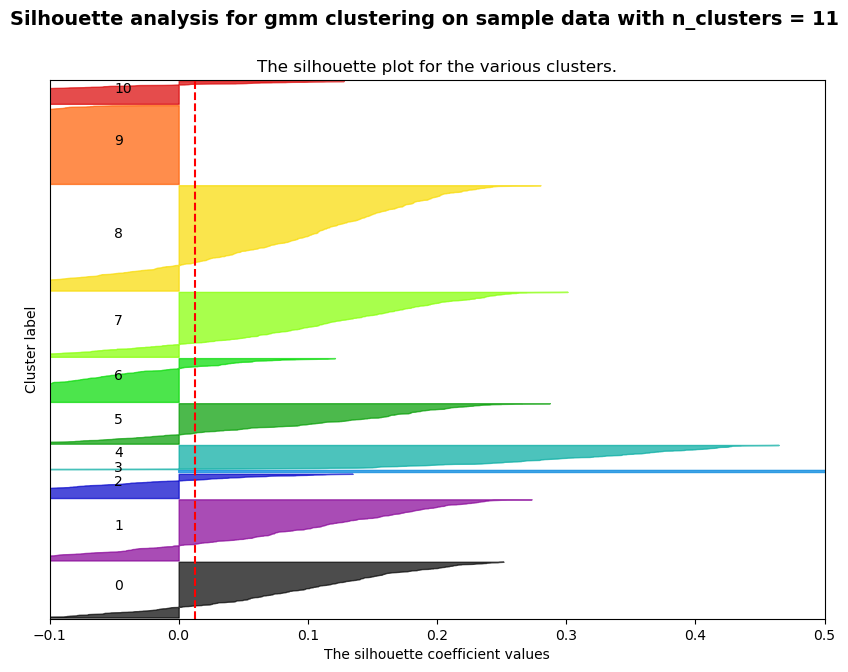

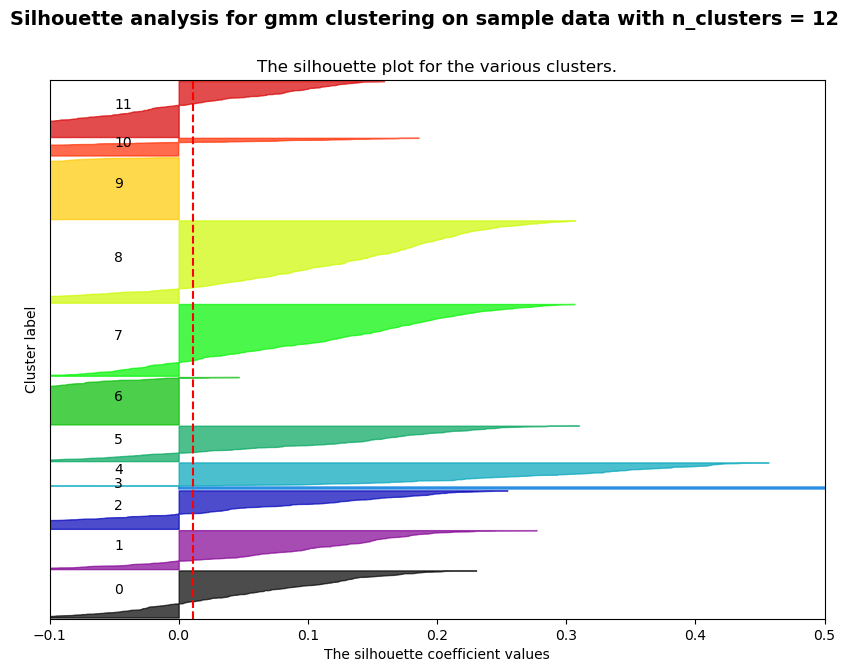

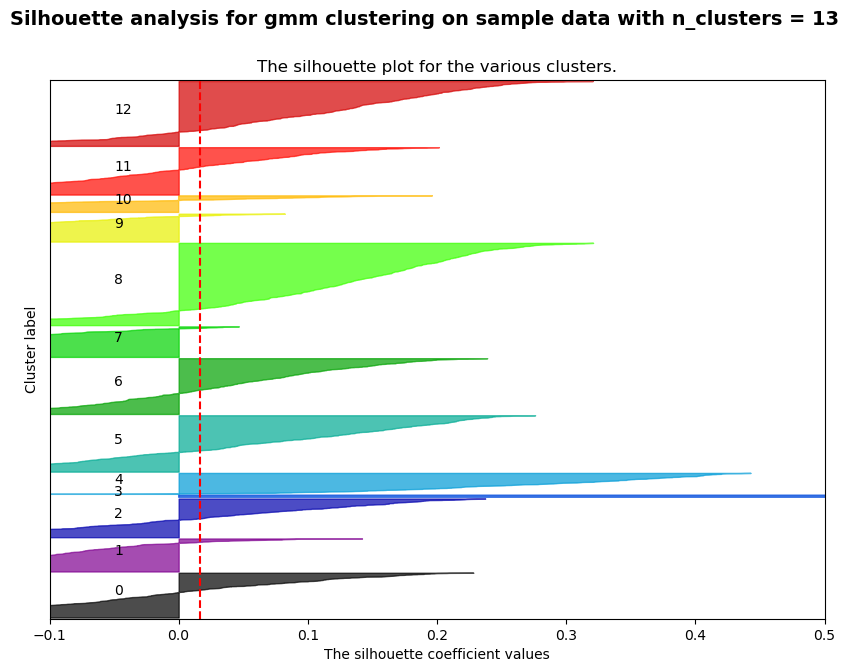

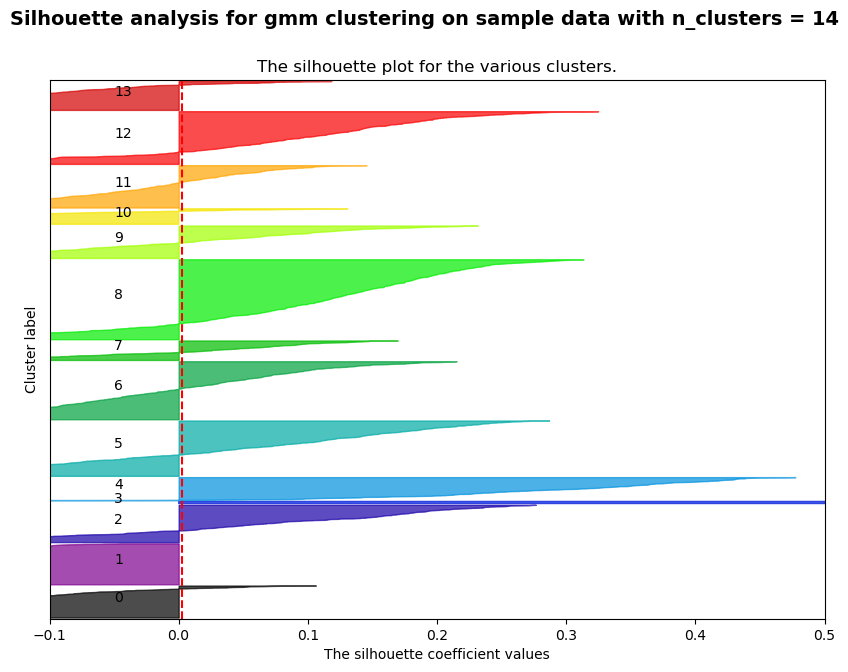

In [903]:
# Experiment 7 gmm - RCA - House data
dt = X1_tr_rca[:,0:rca_1]
silplot(dt, 'gmm', 'House Prices', exp="7")
X1_tr_exp7 = GM(3, random_state=0).fit_predict(dt)


Using gmm on dataset House Prices For n_clusters = 2 The average silhouette_score is : 0.3769021602346216
Using gmm on dataset House Prices For n_clusters = 3 The average silhouette_score is : 0.1769160518758082
Using gmm on dataset House Prices For n_clusters = 4 The average silhouette_score is : 0.18644031492394372
Using gmm on dataset House Prices For n_clusters = 5 The average silhouette_score is : 0.12710178889874926
Using gmm on dataset House Prices For n_clusters = 6 The average silhouette_score is : 0.134979229804695
Using gmm on dataset House Prices For n_clusters = 7 The average silhouette_score is : 0.12232516334283837
Using gmm on dataset House Prices For n_clusters = 8 The average silhouette_score is : 0.12782743519949755
Using gmm on dataset House Prices For n_clusters = 9 The average silhouette_score is : 0.11994938934718871
Using gmm on dataset House Prices For n_clusters = 10 The average silhouette_score is : 0.07840395926025658
Using gmm on dataset House Prices For n_

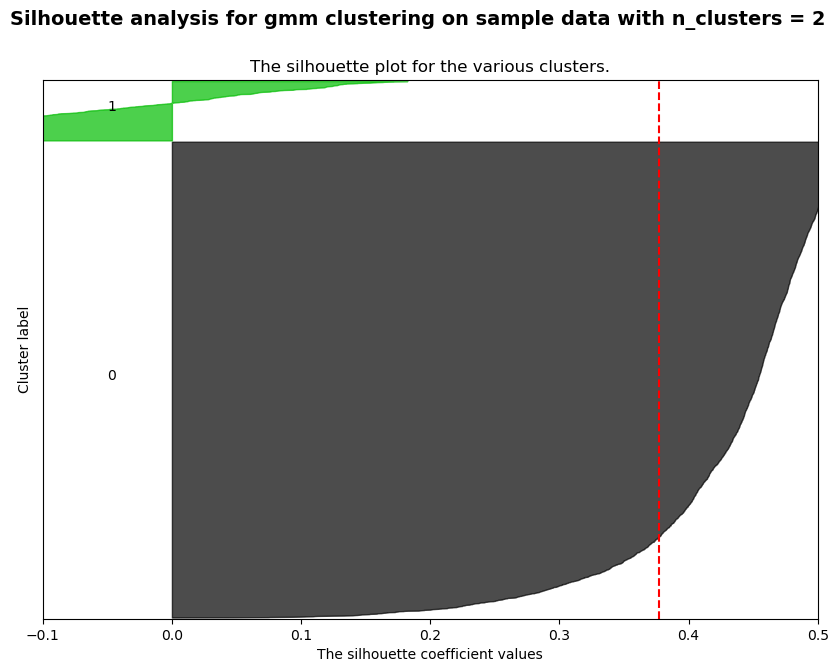

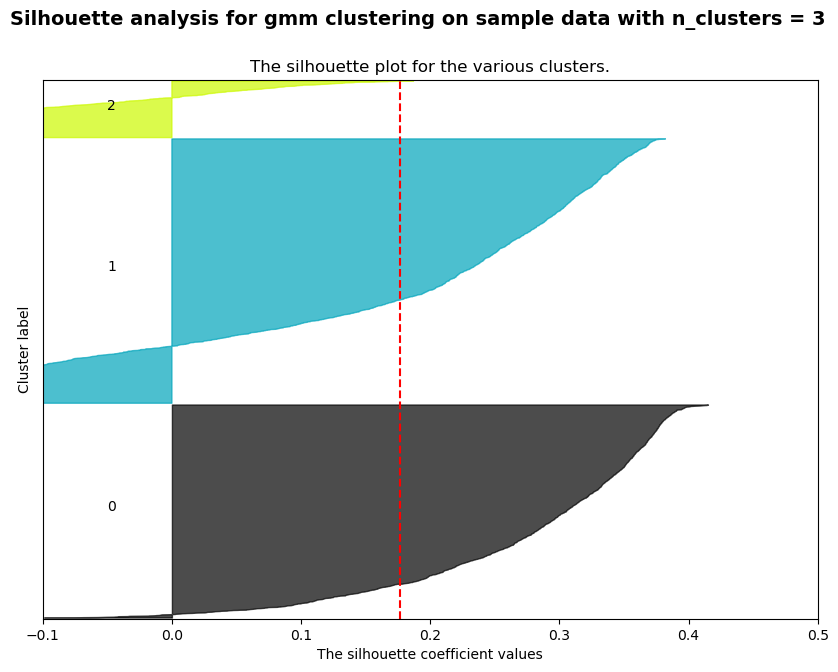

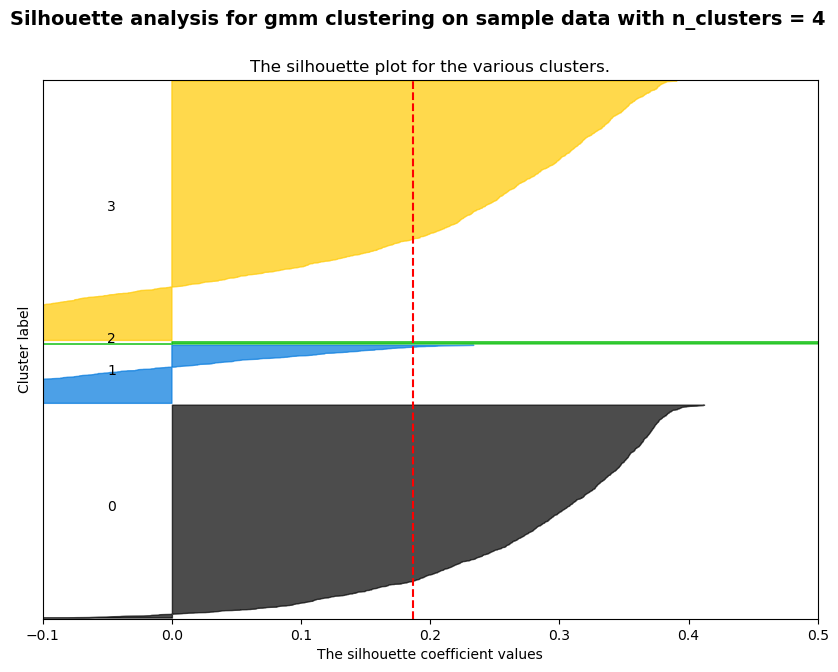

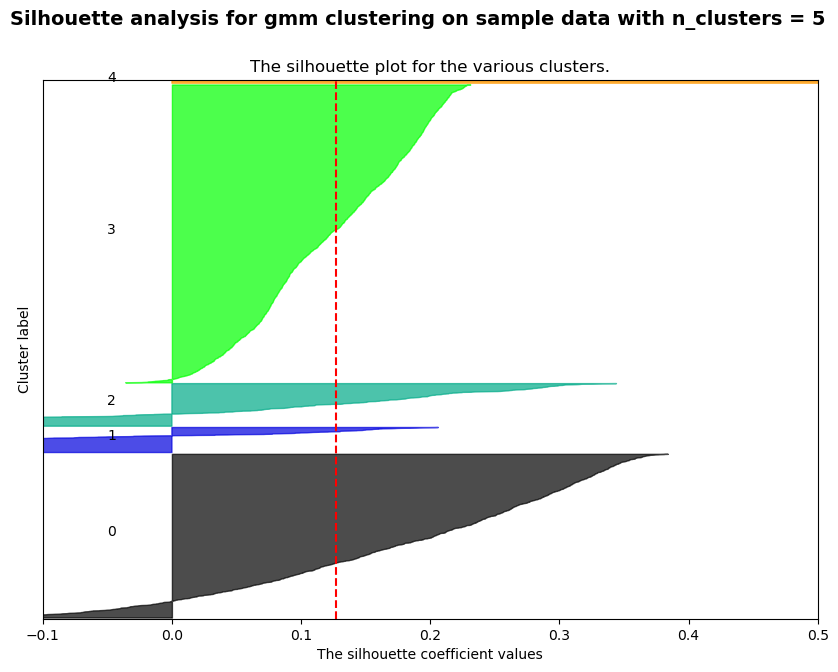

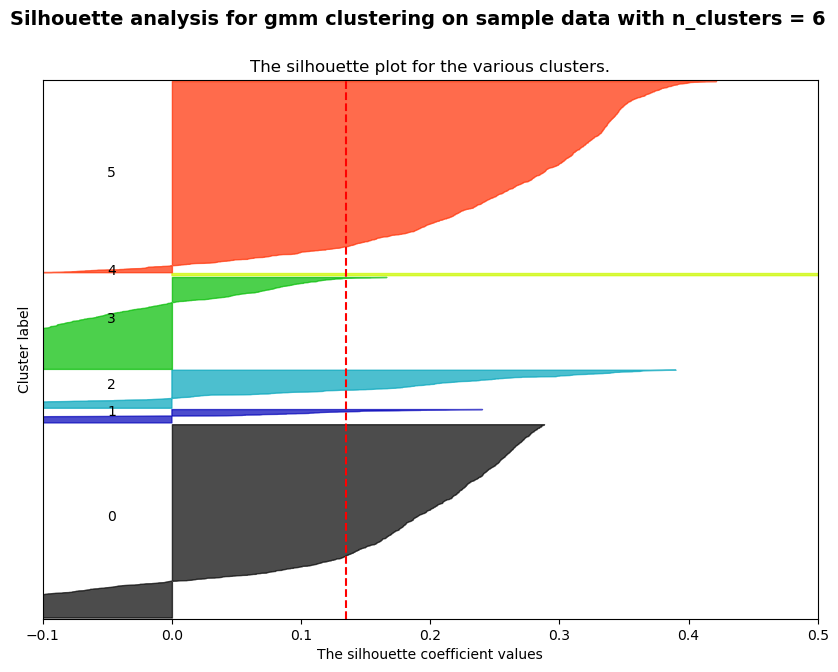

...

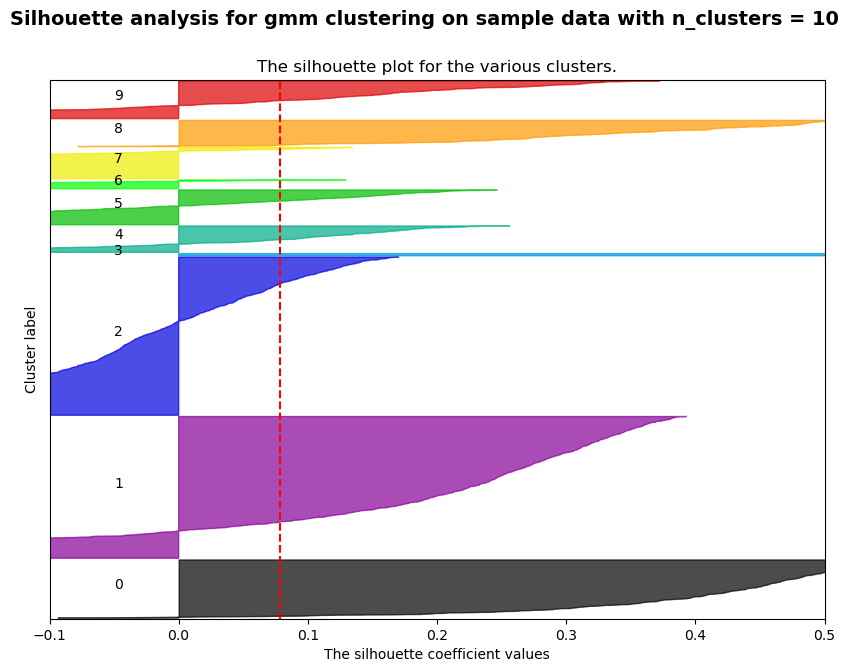

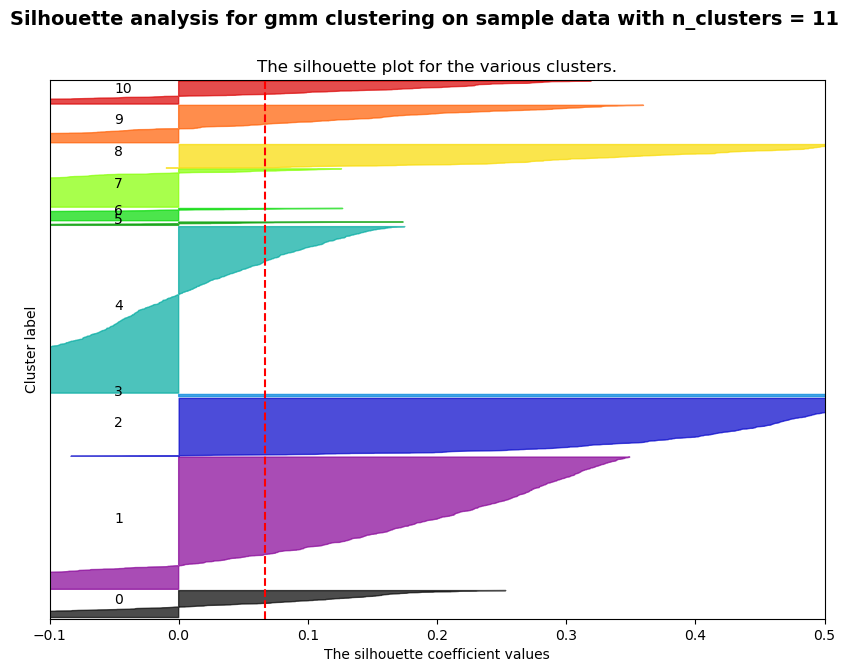

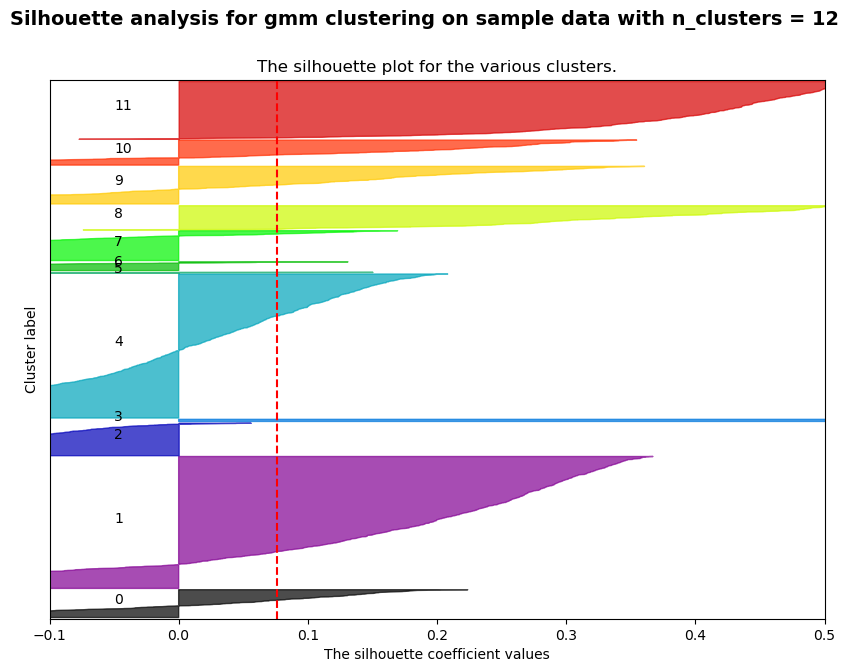

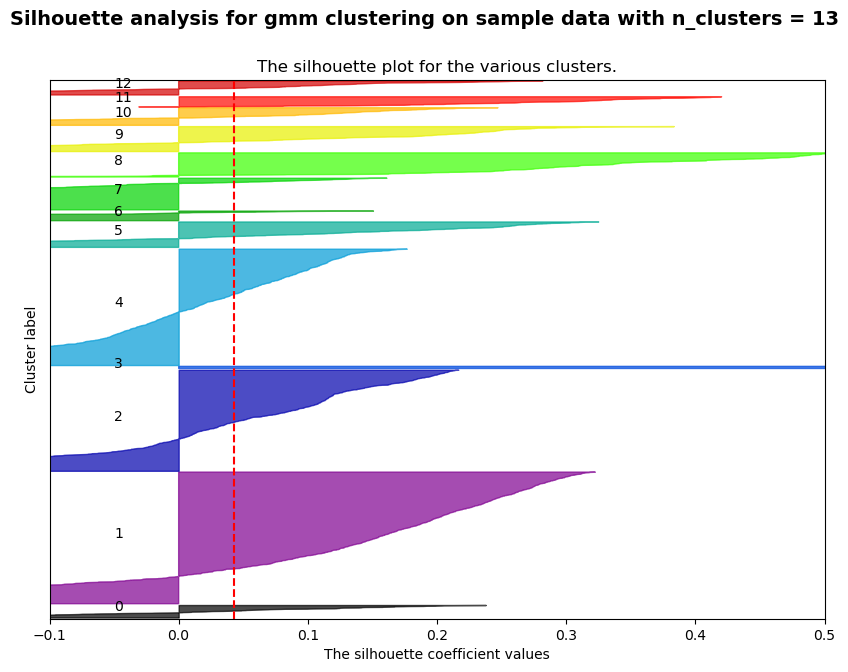

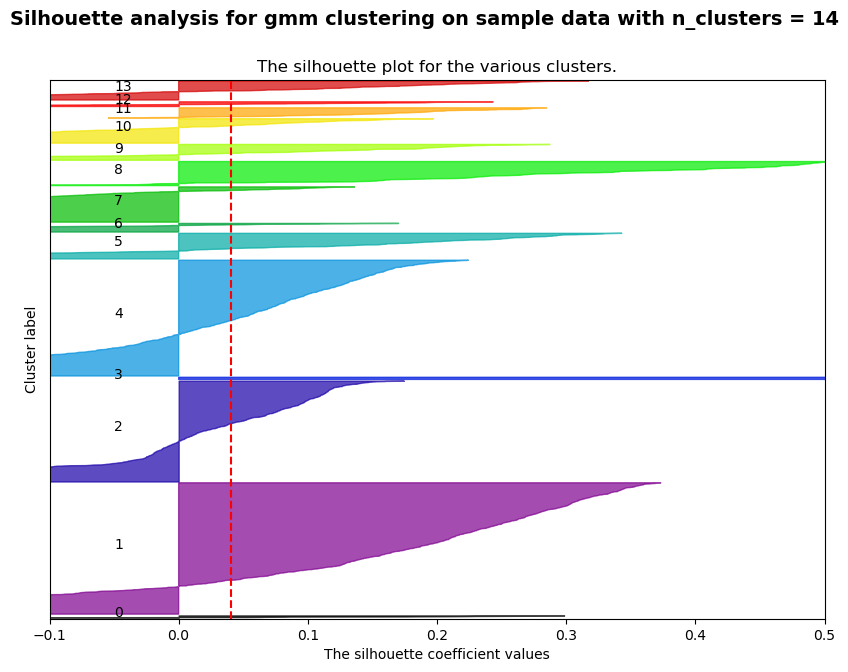

In [904]:
# Experiment 8 gmm - k-best - House data
dt = X1_scal[:,feats1]
silplot(dt, 'gmm', 'House Prices', exp="8")
X1_tr_exp8 = GM(5, random_state=0).fit_predict(dt)


Using kmeans on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.2049808209984635
Using kmeans on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.21773266556254414
Using kmeans on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.22062911143262137
Using kmeans on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.2770985094325097
Using kmeans on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.2583127501699387
Using kmeans on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.25939700136754046
Using kmeans on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.2707336681028743
Using kmeans on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.2732842409810039
Using kmeans on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.24501454165014713
Using kmeans on dataset

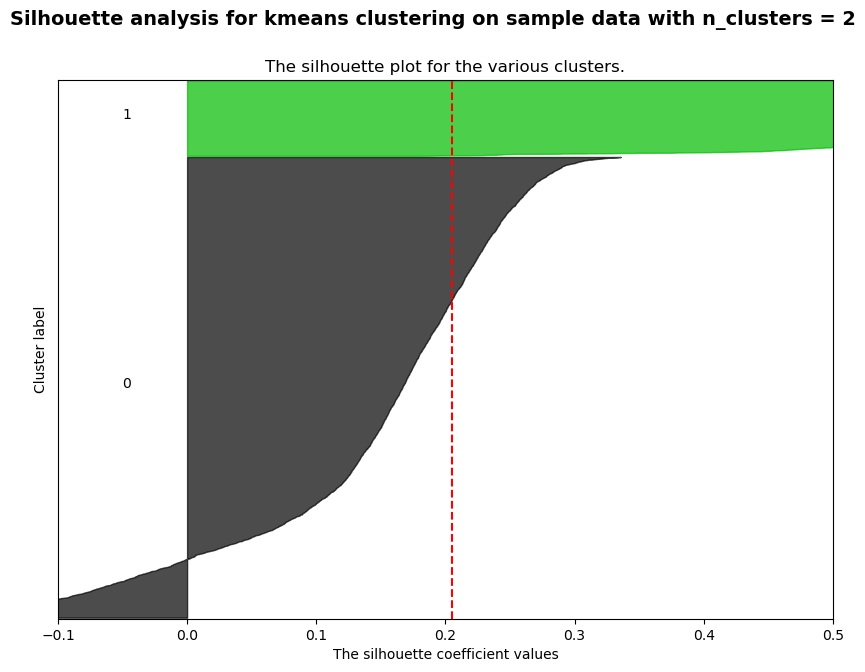

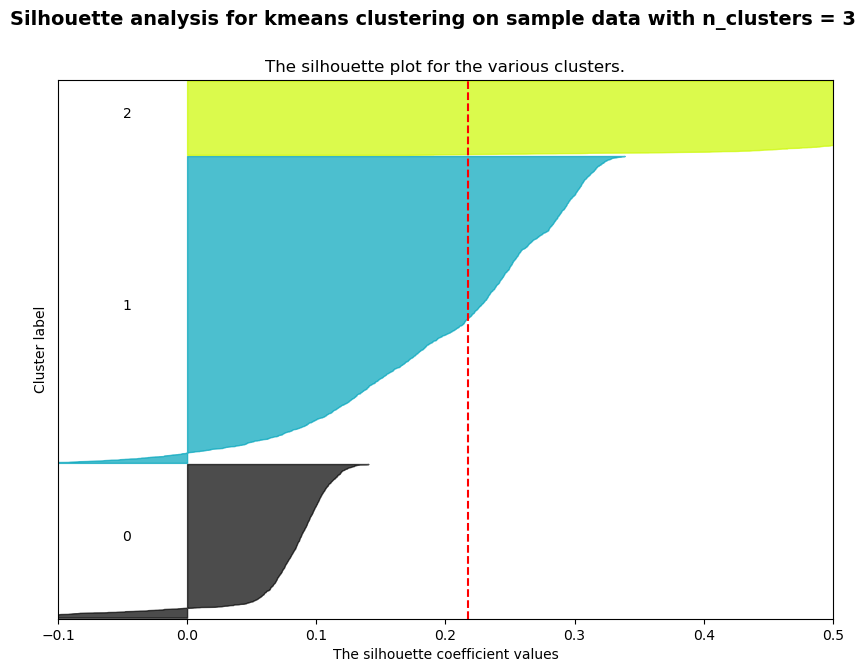

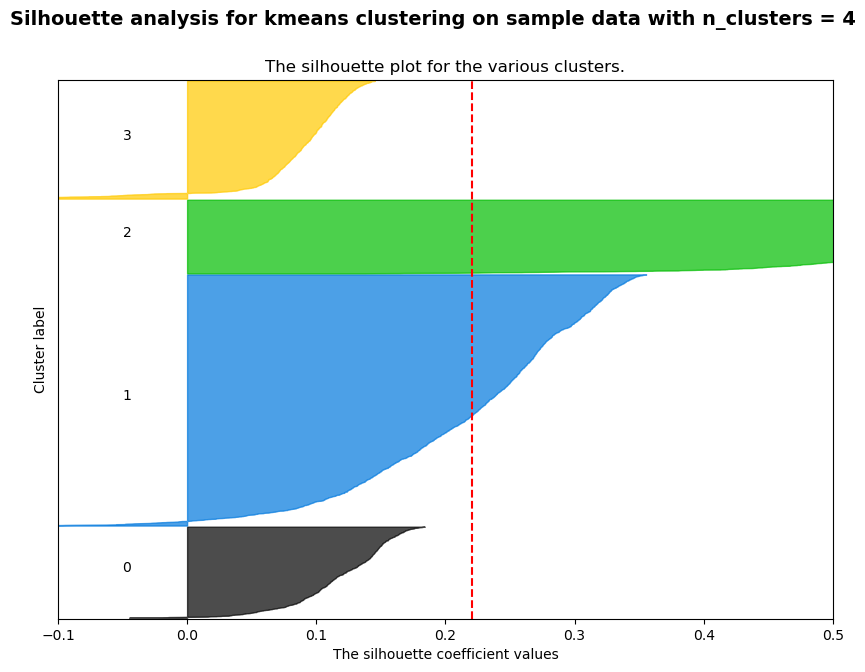

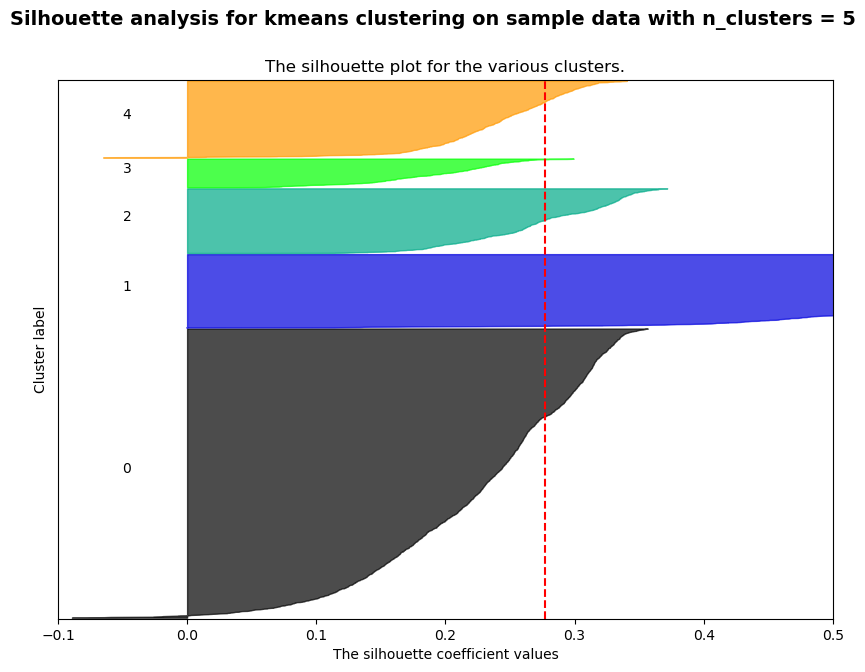

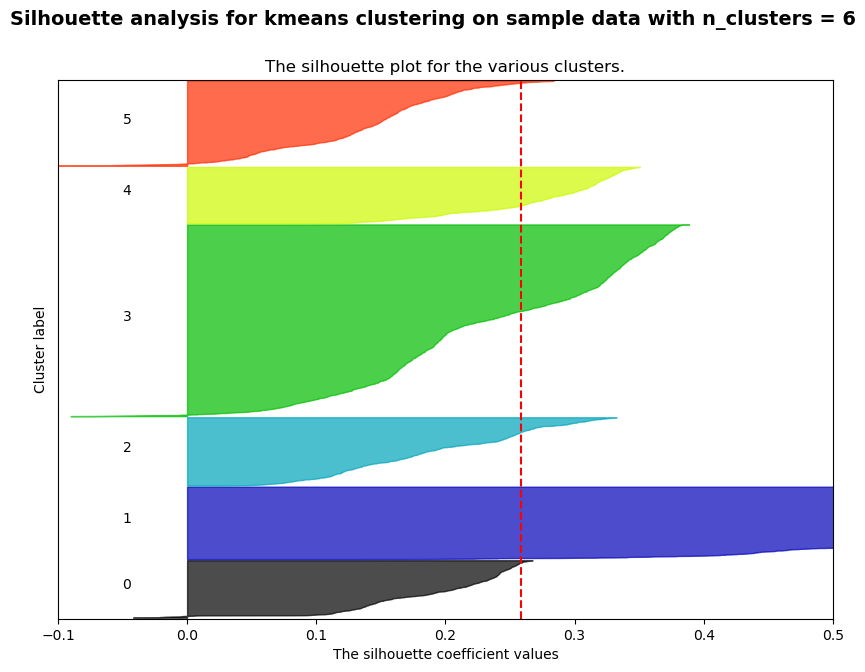

...

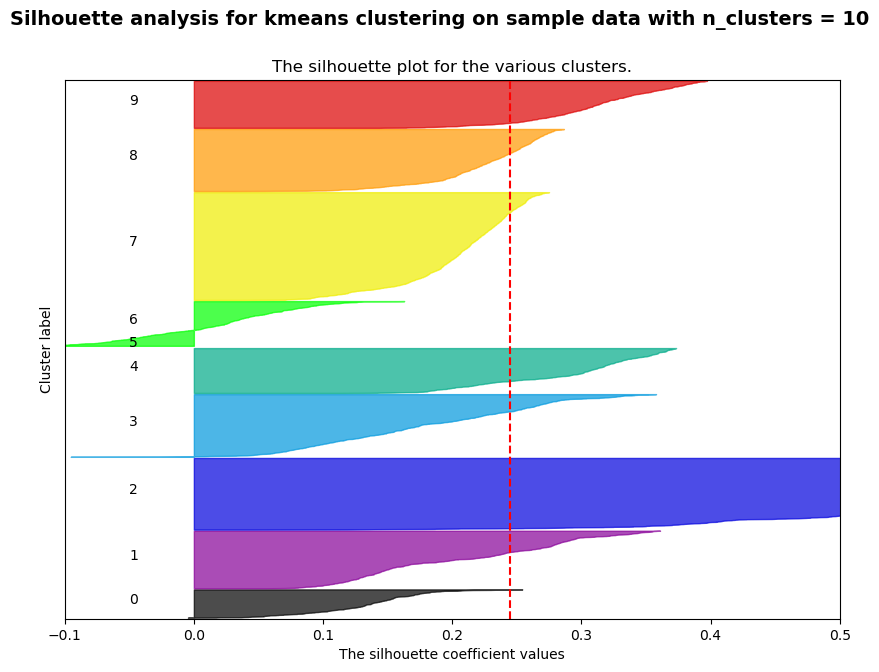

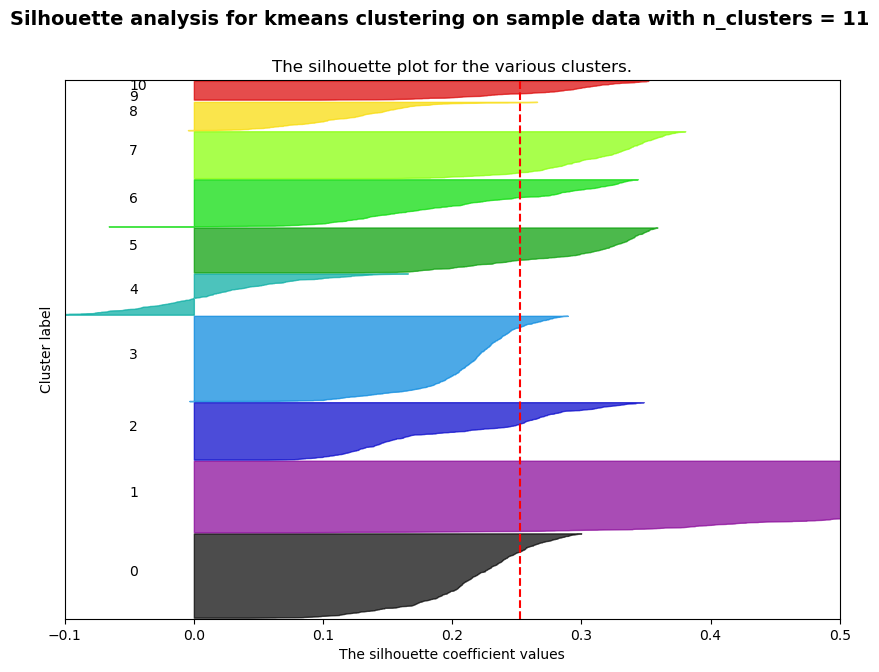

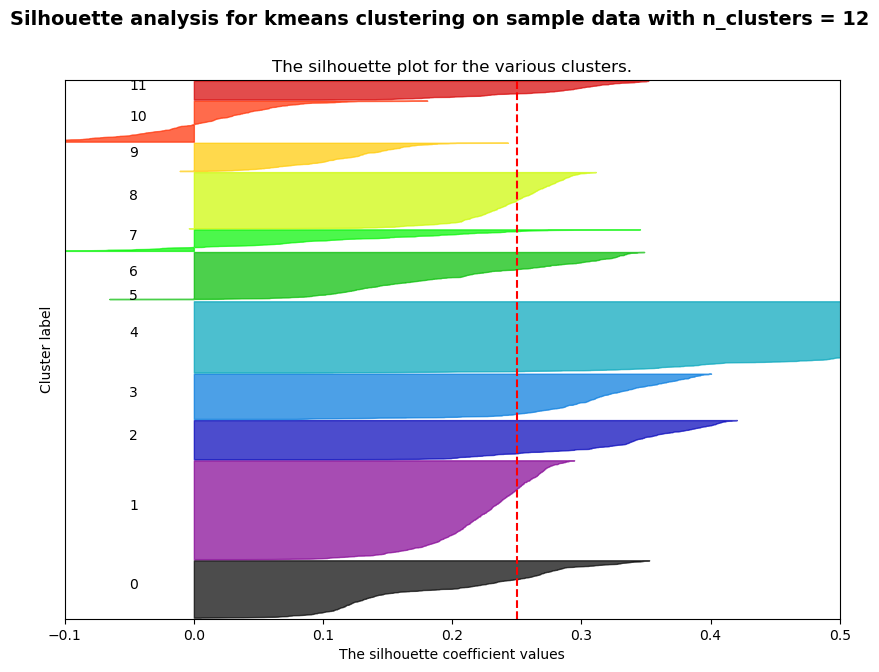

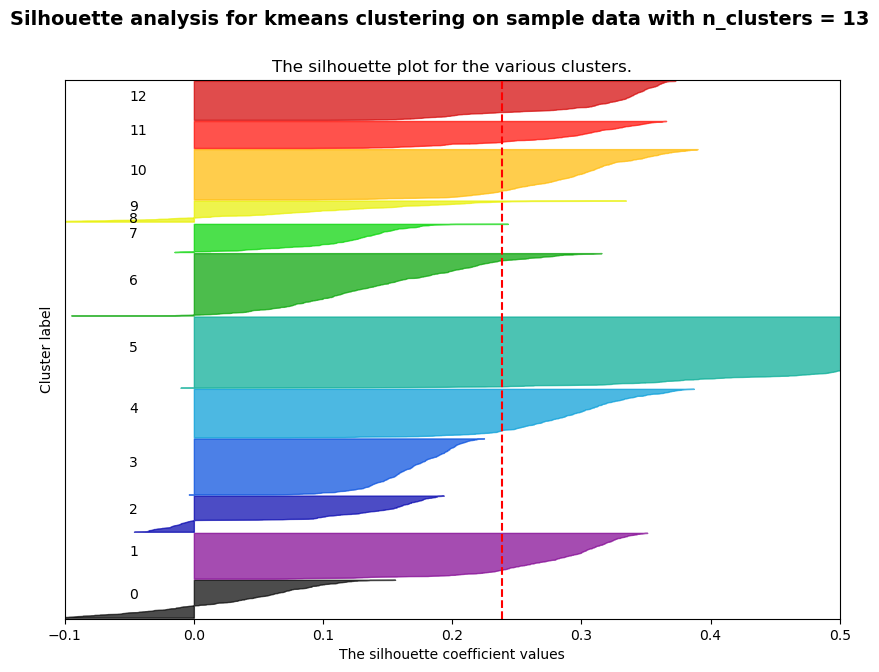

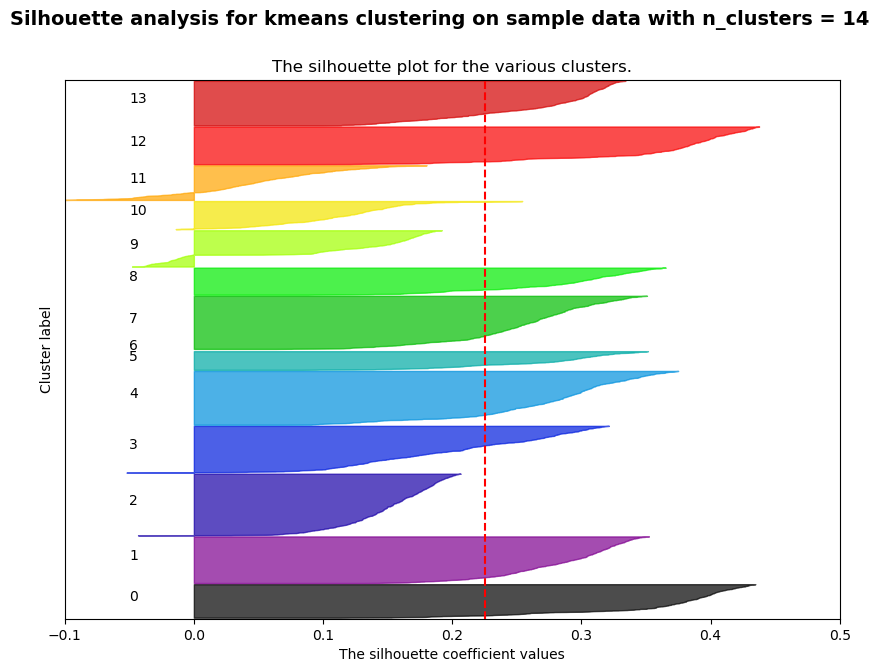

In [905]:
# Experiment 9 Kmeans - PCA - Stroke Data\
dt = X2_tr_pca[:,0:pca_2]
silplot(dt, 'kmeans', 'Stroke Data', exp="9")
X2_tr_exp9 = KMeans(9, random_state=0).fit_predict(dt)


Using kmeans on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.16404371101148257
Using kmeans on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.20712275600185404
Using kmeans on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.24119665813181157
Using kmeans on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.2511945675046902
Using kmeans on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.29962382705640067
Using kmeans on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.3100631552376942
Using kmeans on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.3257128117890941
Using kmeans on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.3335390227767107
Using kmeans on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.34600945909161546
Using kmeans on datase

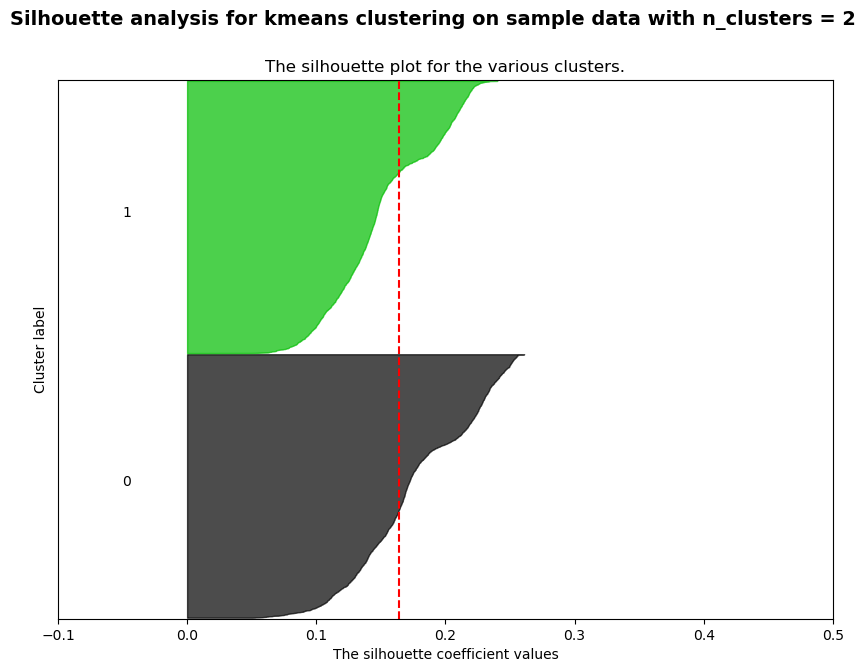

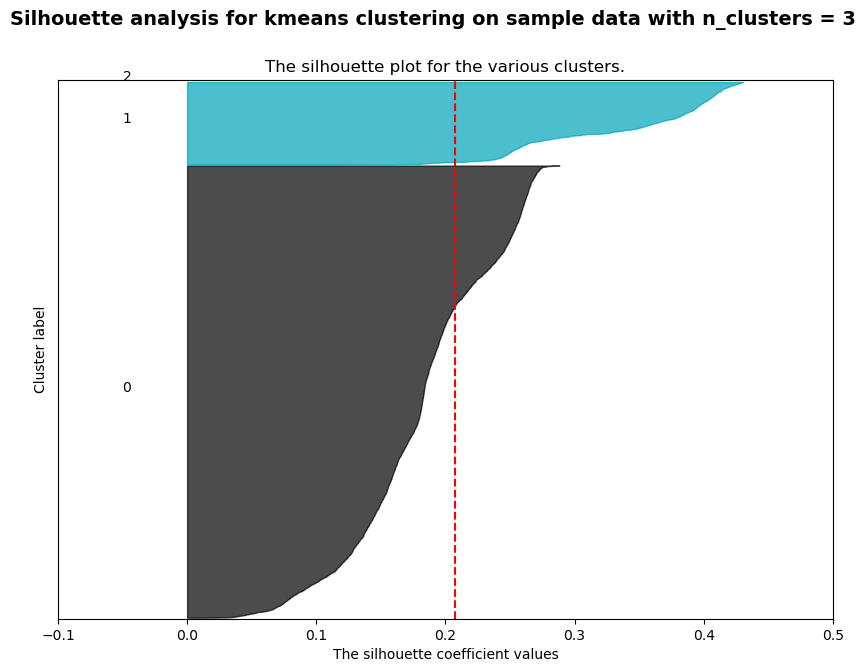

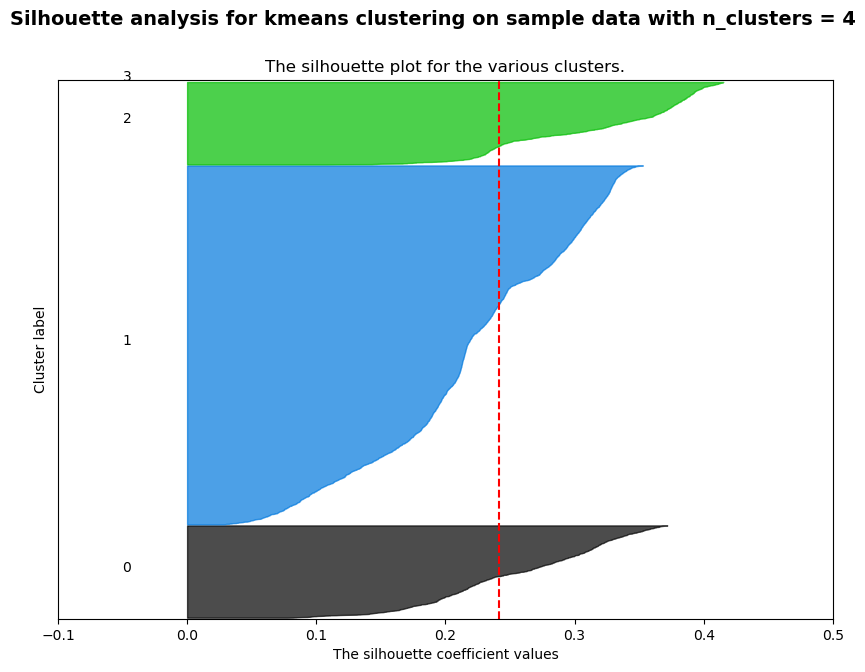

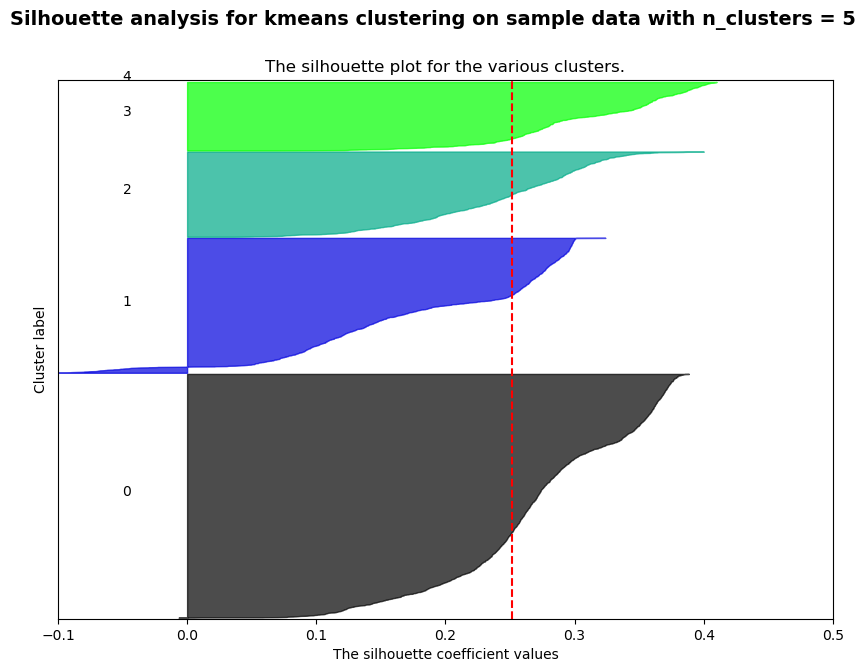

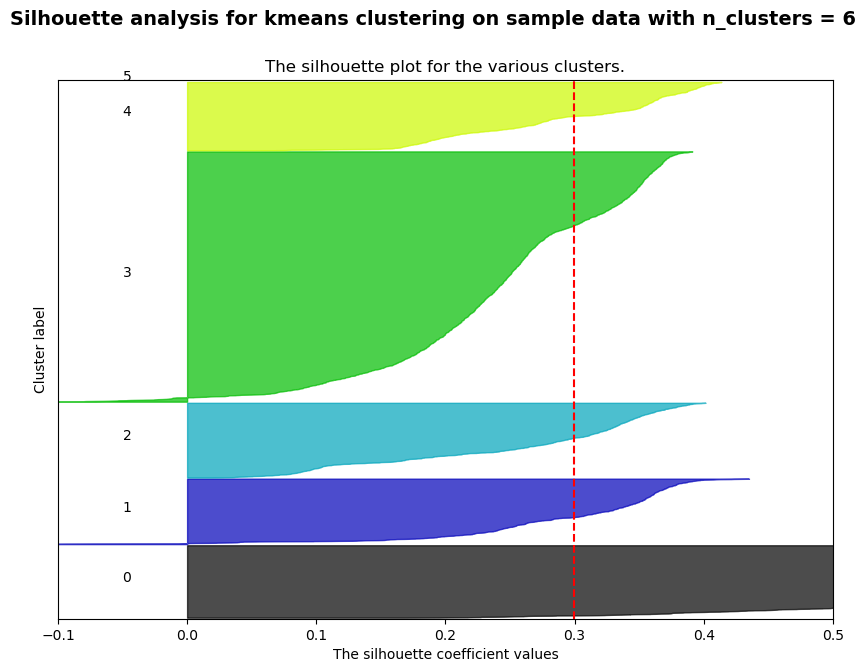

...

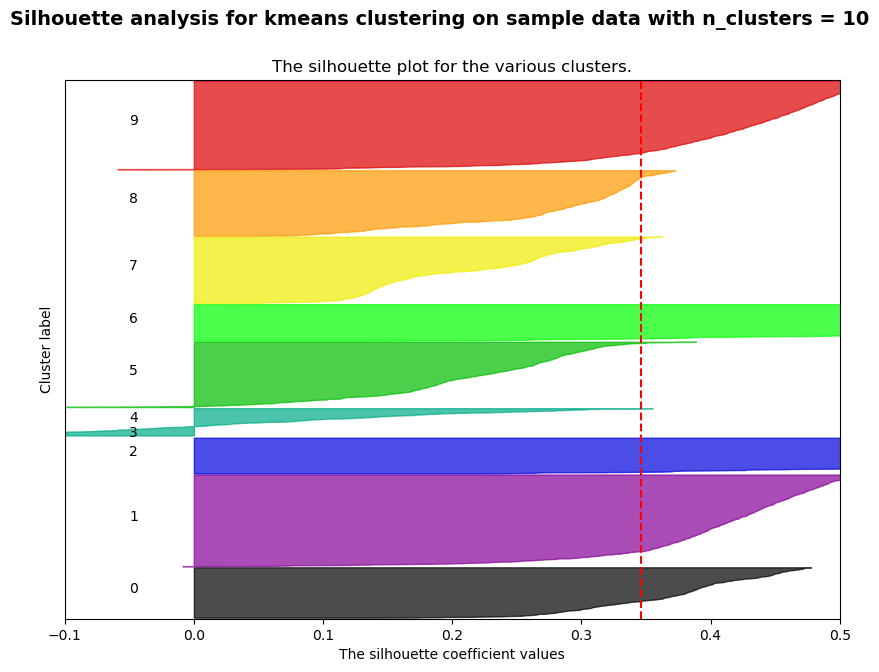

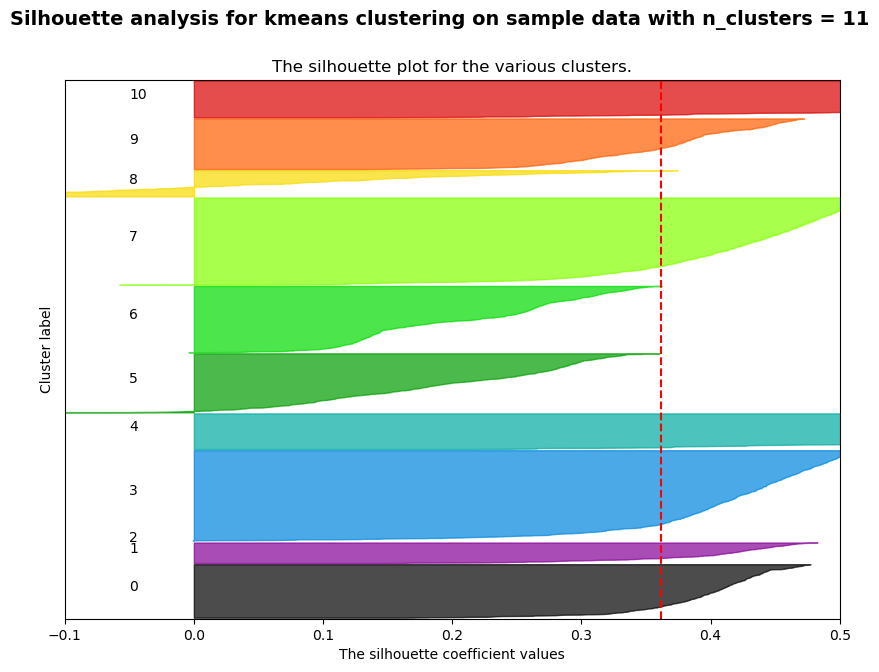

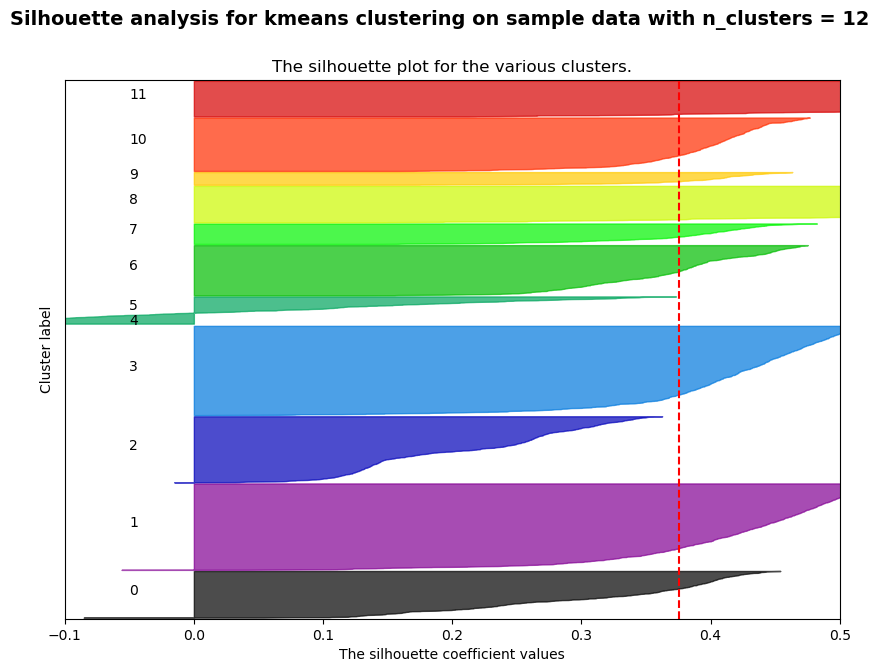

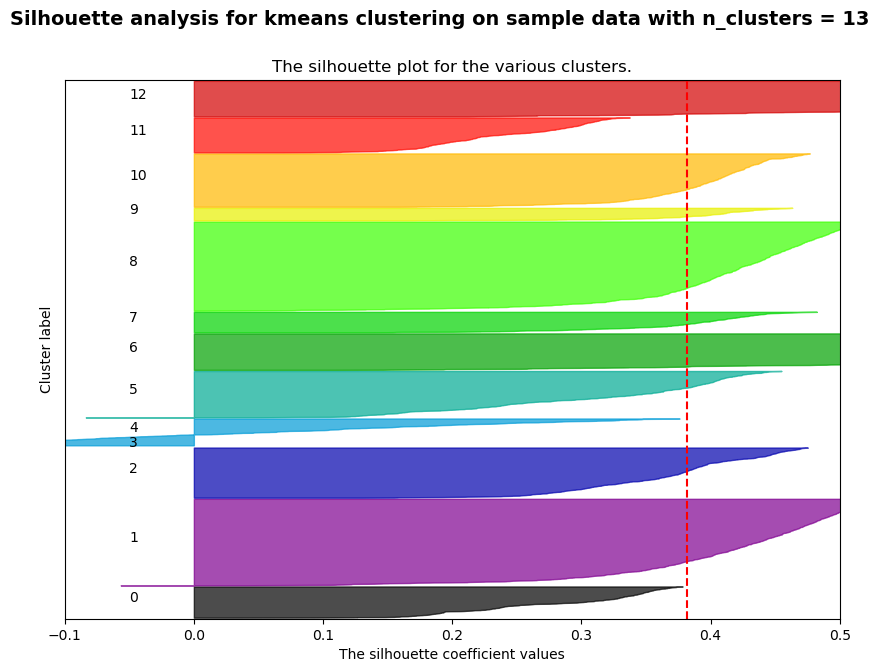

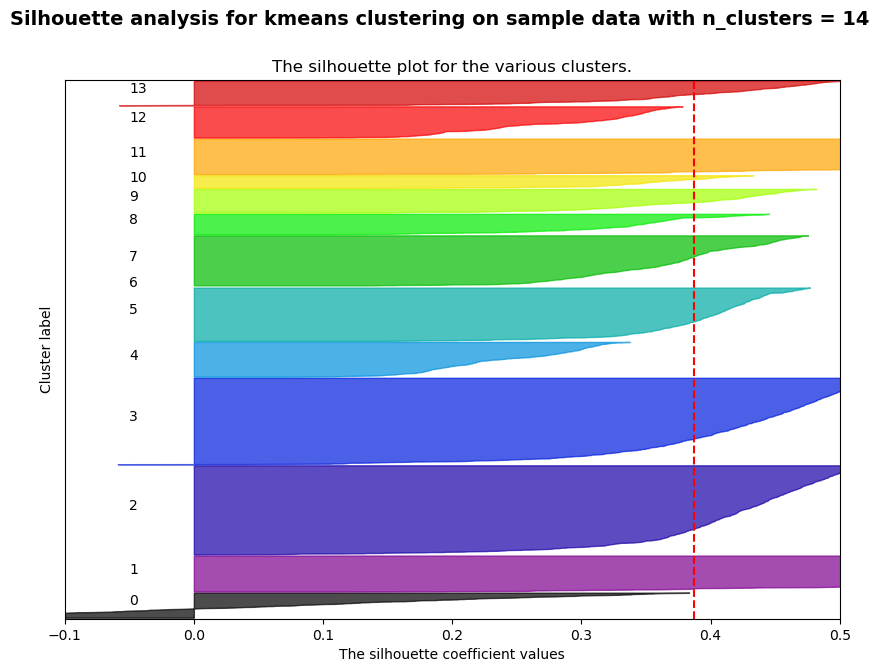

In [906]:
# Experiment 10 Kmeans - ICA - stroke data
dt = X2_tr_ica[:,0:ica_2]
silplot(dt, 'kmeans', 'Stroke Data', exp="10")
X2_tr_exp10 = KMeans(8, random_state=0).fit_predict(dt)

Using kmeans on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.23995443663832963
Using kmeans on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.22173525899048593
Using kmeans on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.24295245356670955
Using kmeans on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.23472676308655716
Using kmeans on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.23805780823629133
Using kmeans on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.23962699822961792
Using kmeans on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.24727932643734973
Using kmeans on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.23381183663508112
Using kmeans on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.23025251722231485
Using kmeans on da

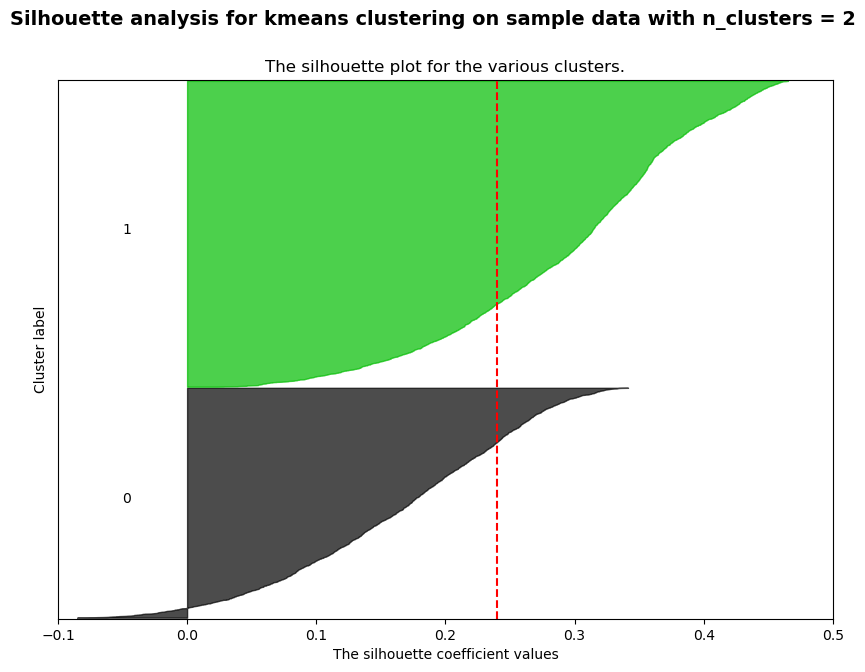

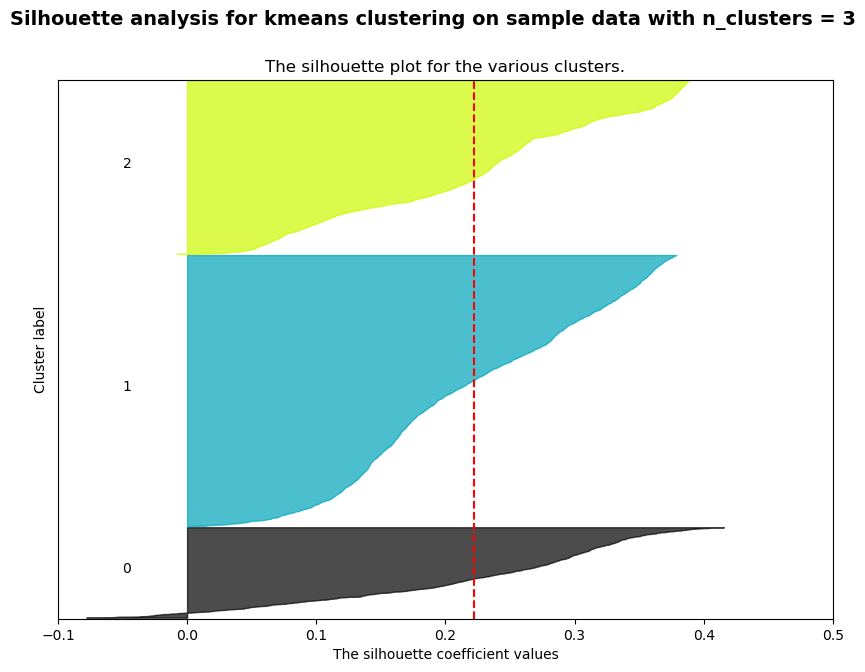

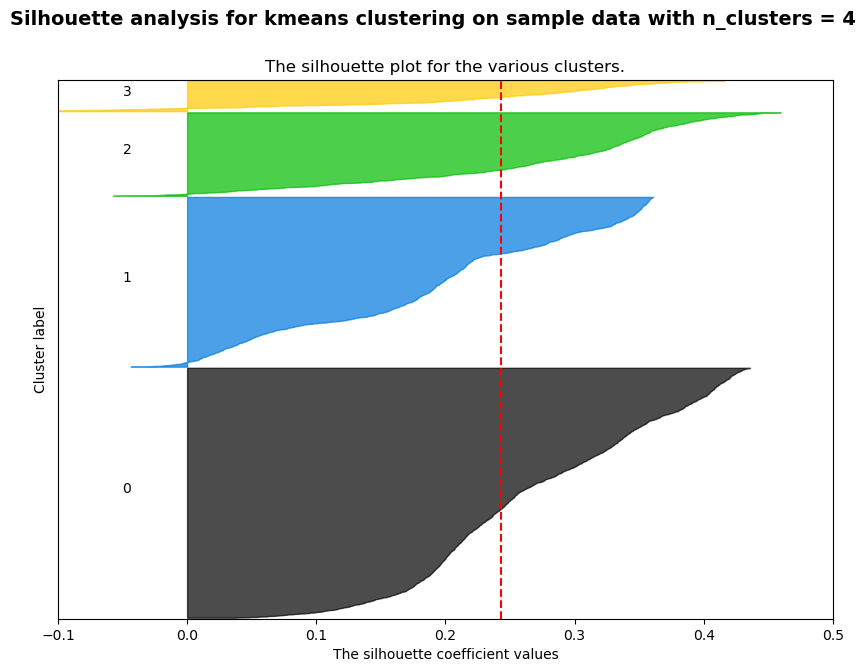

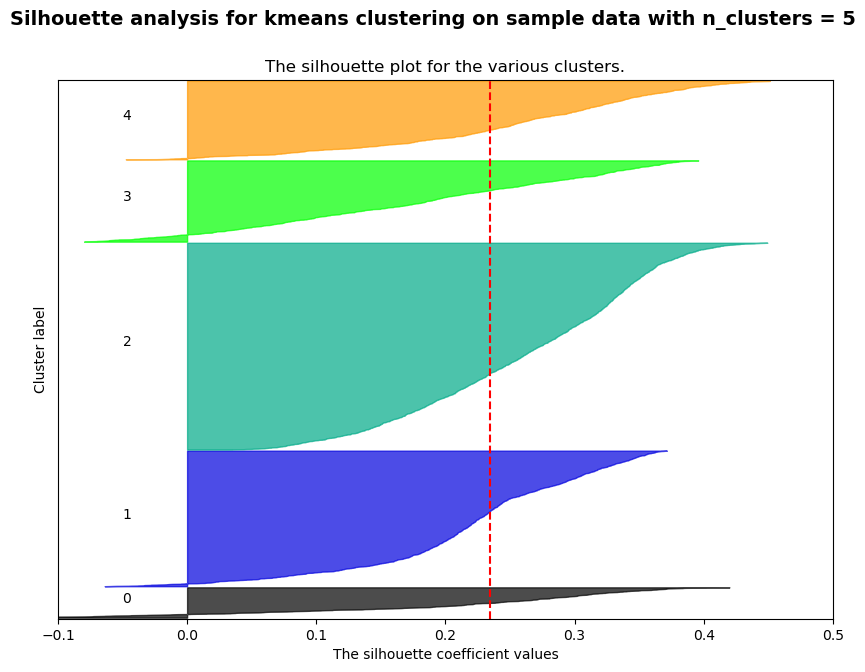

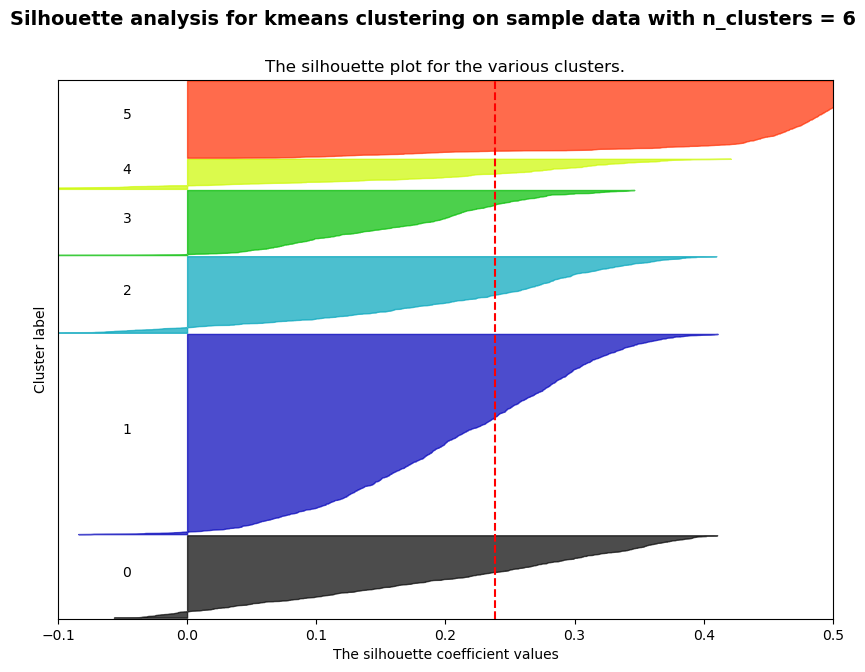

...

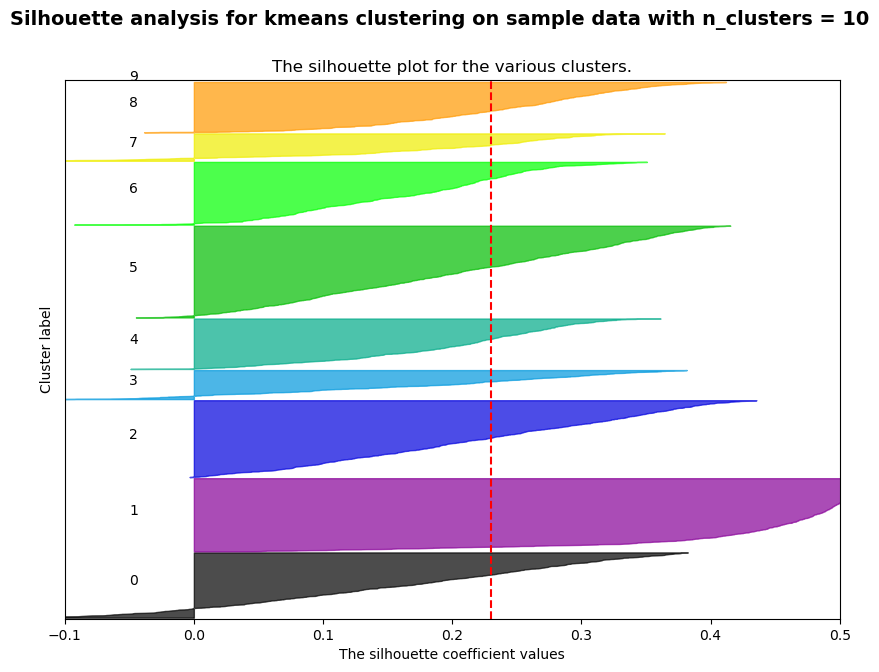

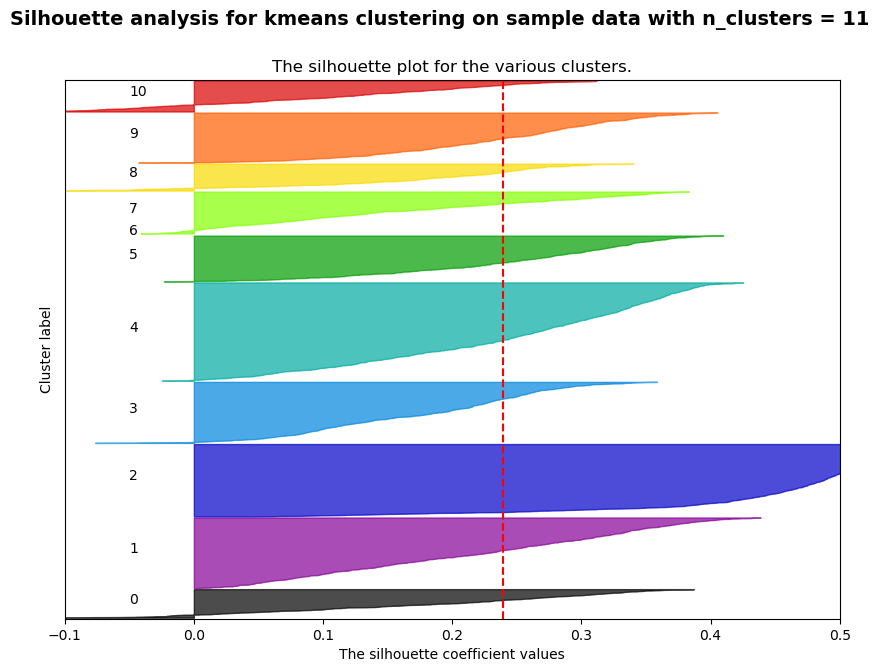

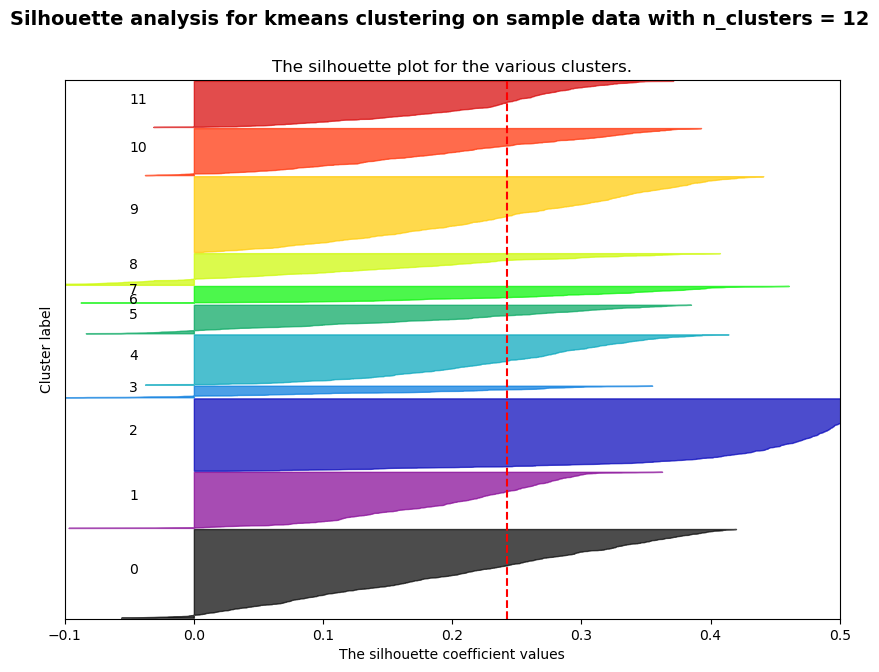

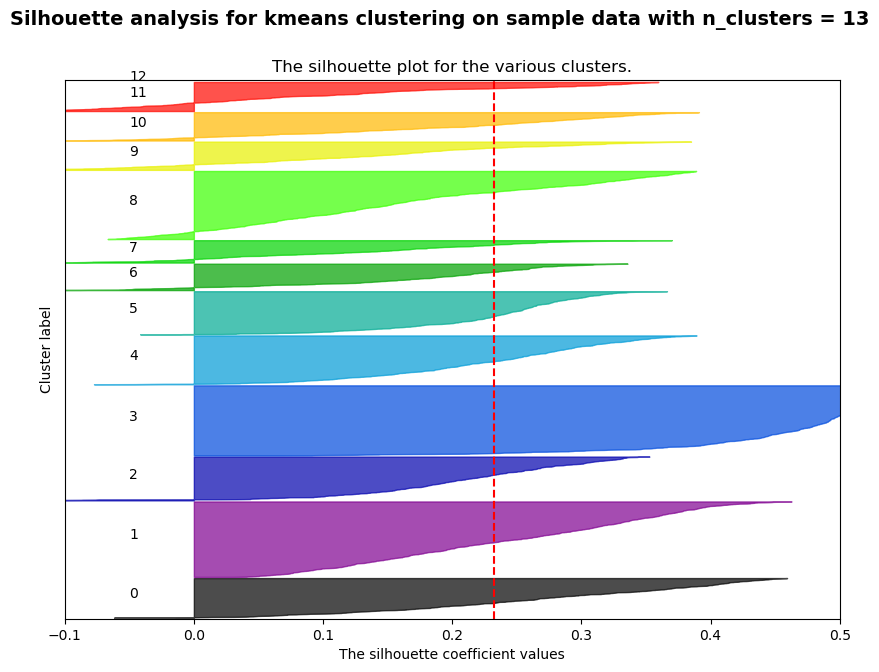

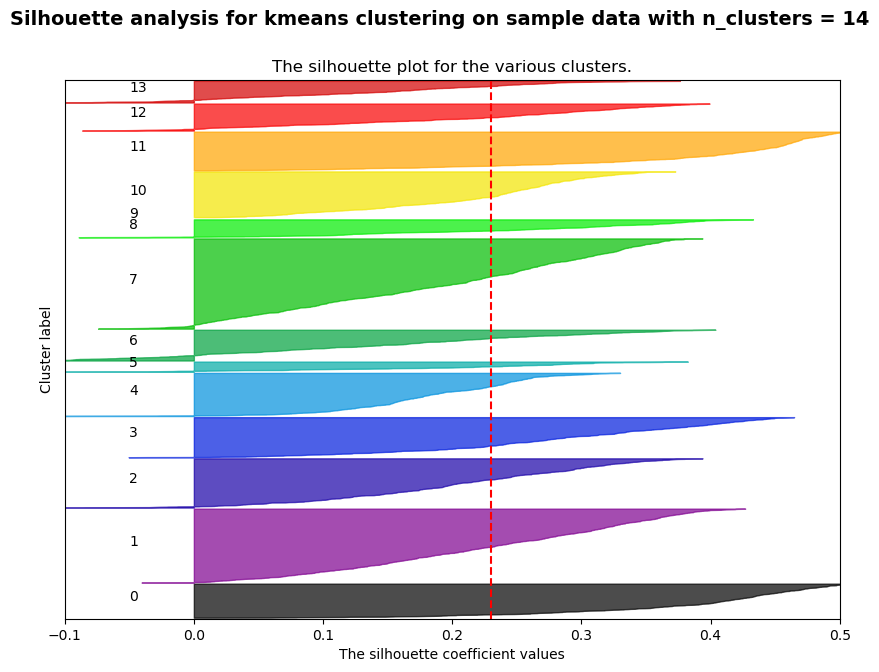

In [907]:
# Experiment 11 Kmeans - RCA - Stroke data
dt = X2_tr_rca[:,0:rca_2]
silplot(dt, 'kmeans', 'Stroke Data', exp="11")
X2_tr_exp11 = KMeans(3, random_state=0).fit_predict(dt)

Using kmeans on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.22227762037781298
Using kmeans on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.24950975833372932
Using kmeans on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.2752447048240685
Using kmeans on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.25663008394612746
Using kmeans on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.28990443253869763
Using kmeans on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.29507292429708587
Using kmeans on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.3067011042897401
Using kmeans on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.31594347137276607
Using kmeans on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.32807188366146456
Using kmeans on data

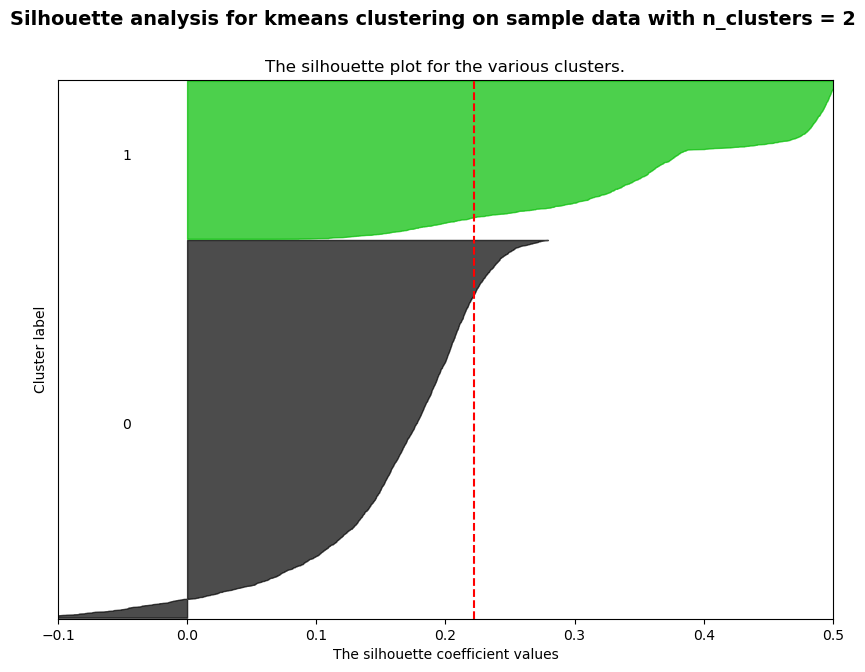

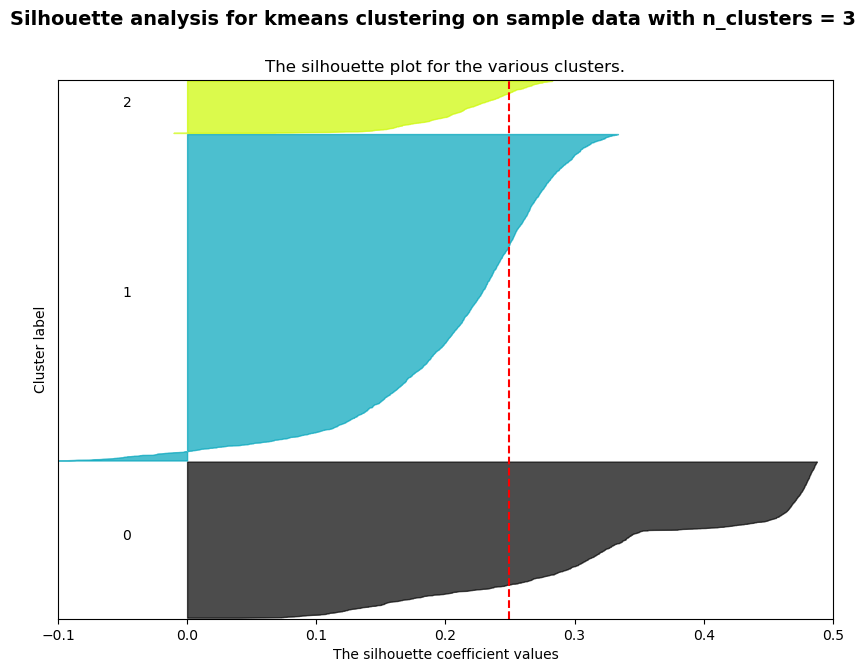

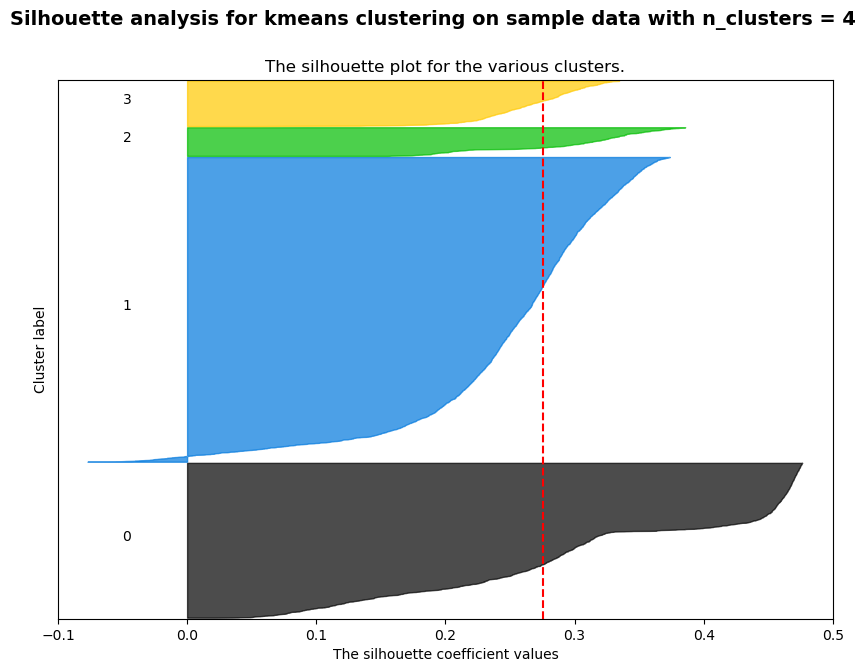

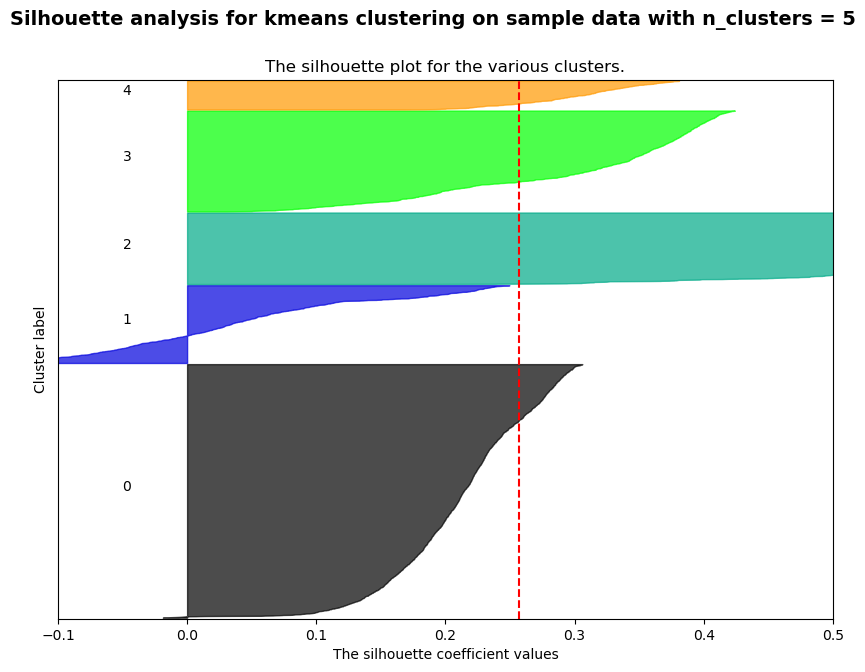

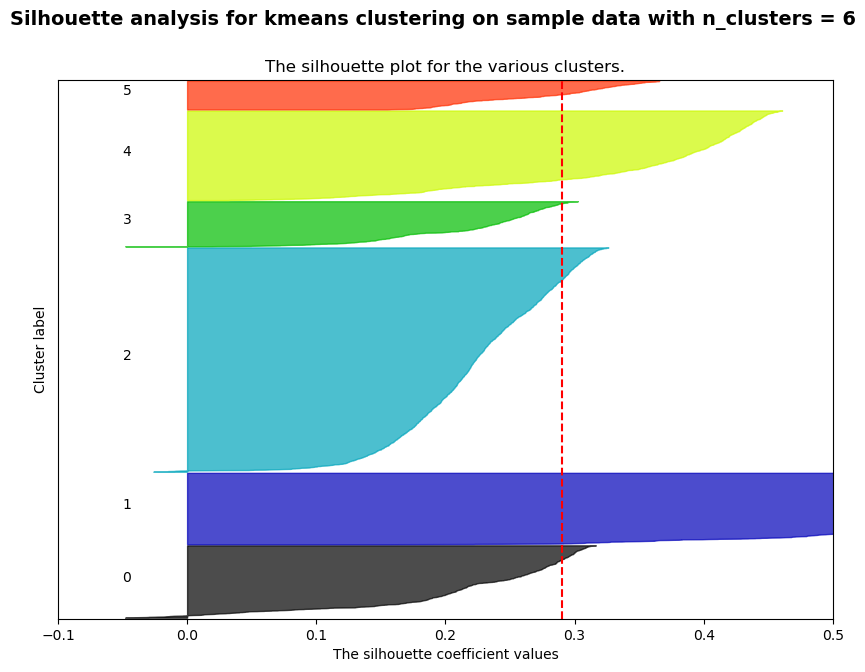

...

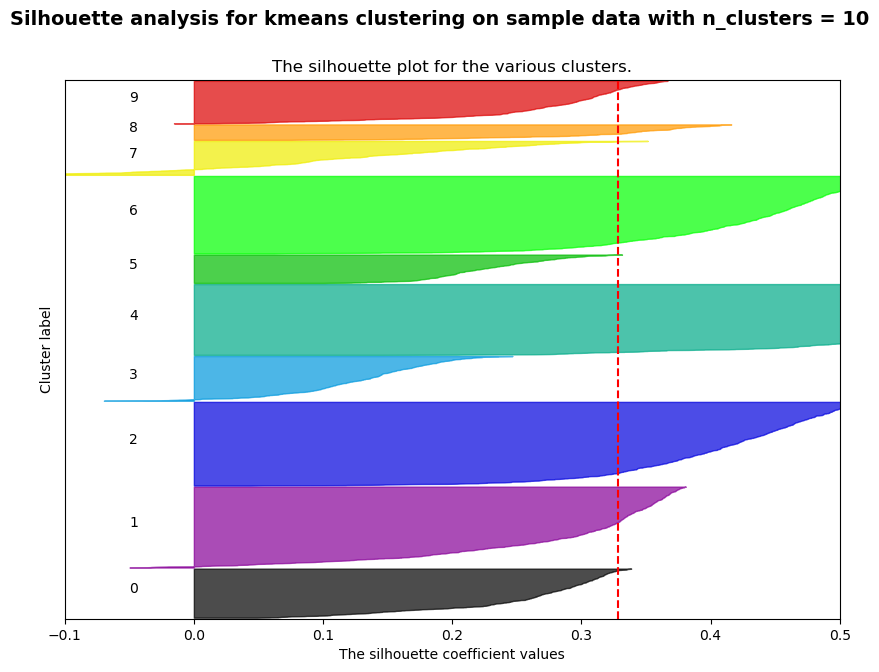

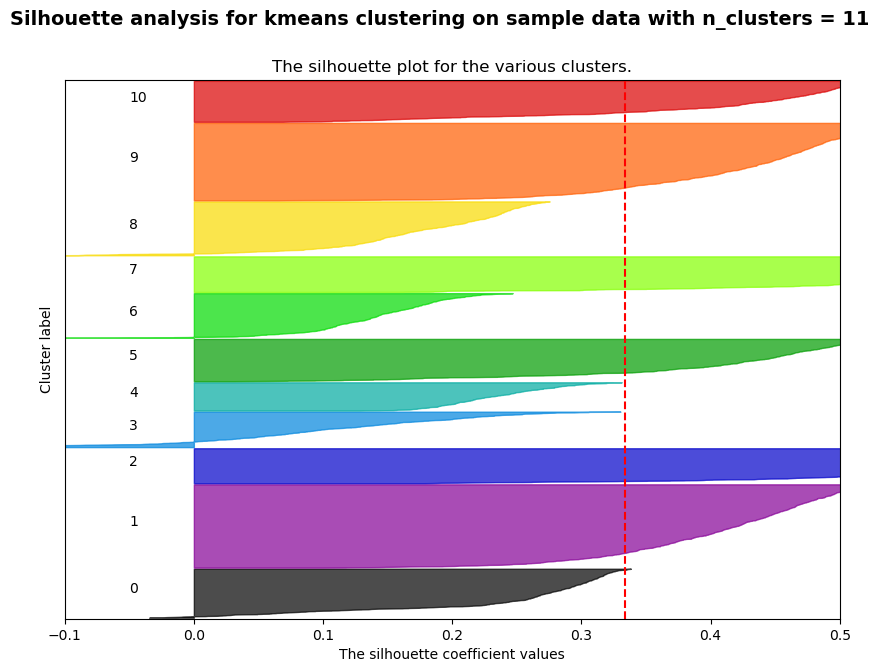

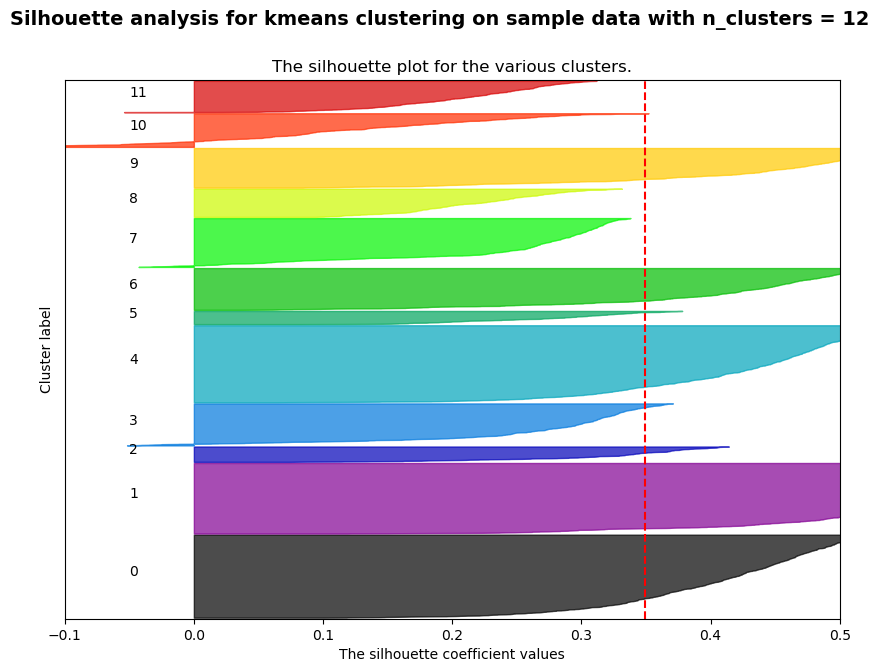

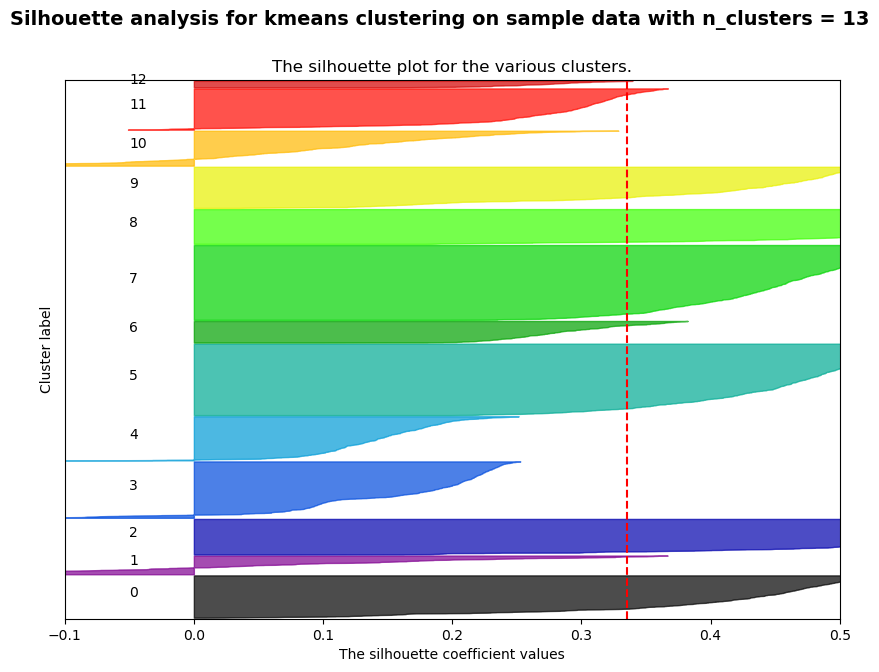

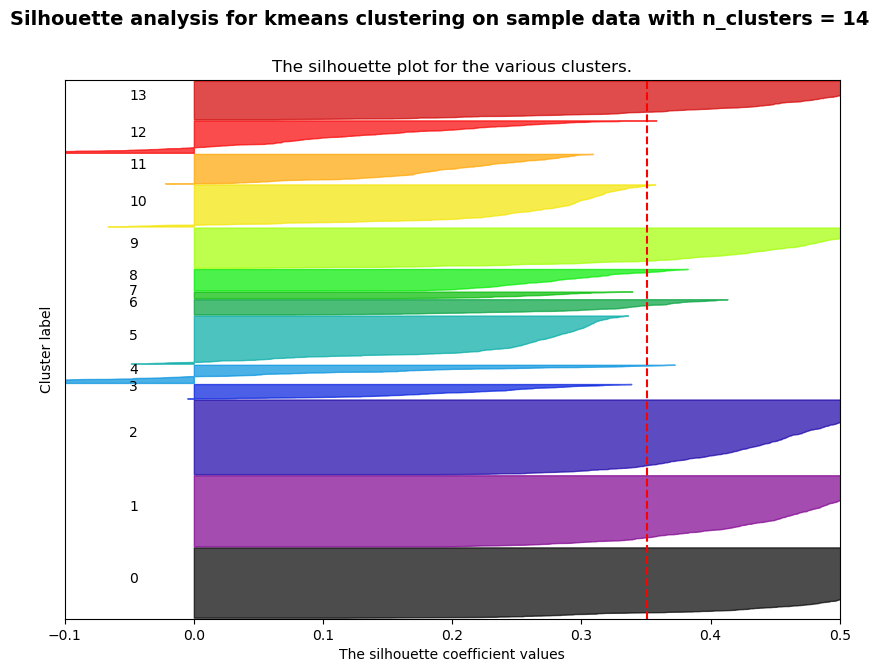

In [908]:
# Experiment 12 Kmeans - k-best - Stroke data
dt = X2_scal[:,feats2]
silplot(dt, 'kmeans', 'Stroke Data', exp="12")
X2_tr_exp12 = KMeans(10, random_state=0).fit_predict(dt)

Using gmm on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.1422244603589759
Using gmm on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.2167360878528166
Using gmm on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.2196384034449378
Using gmm on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.22817536395162719
Using gmm on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.2296347724295524
Using gmm on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.26004007433941184
Using gmm on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.21262201913148124
Using gmm on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.2132899647405235
Using gmm on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.20085996989687543
Using gmm on dataset Stroke Data For n_clusters = 

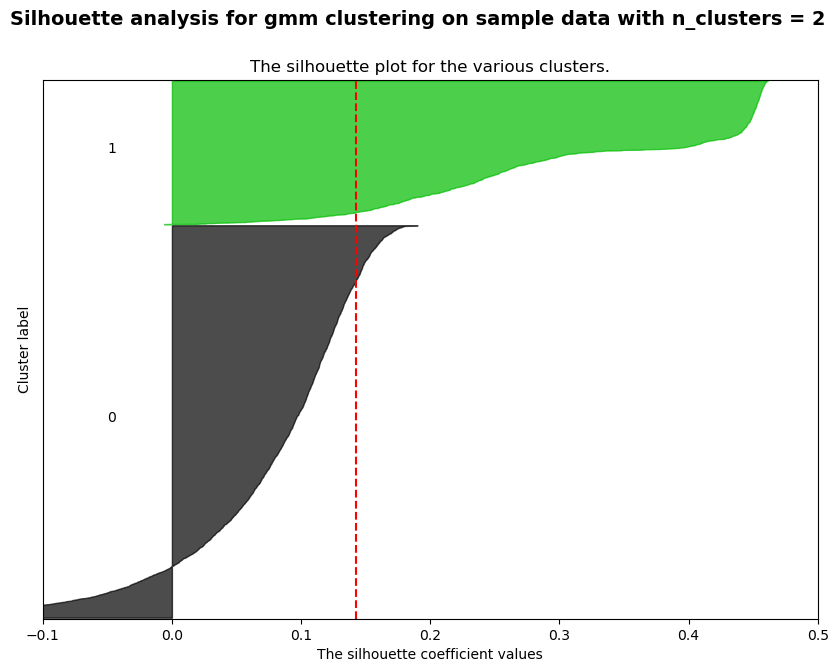

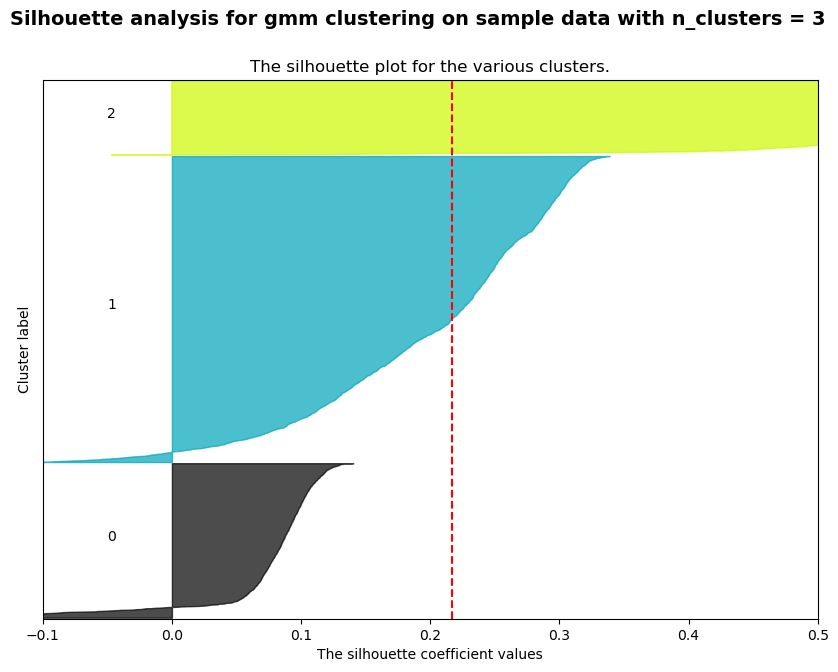

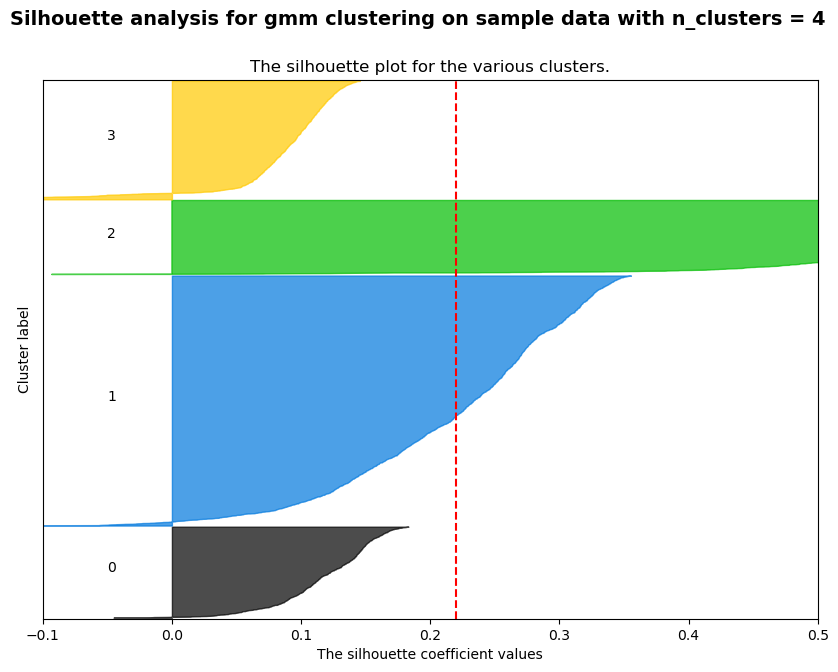

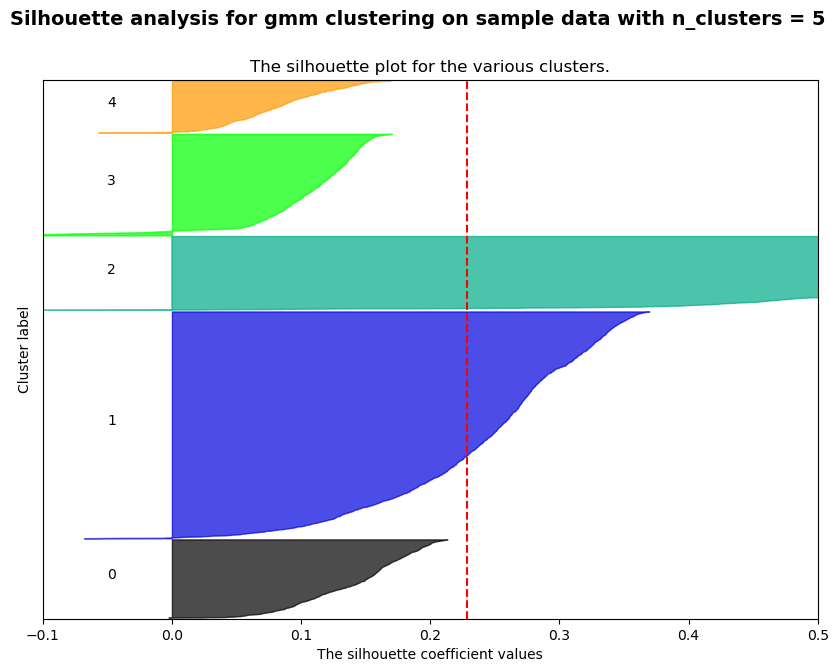

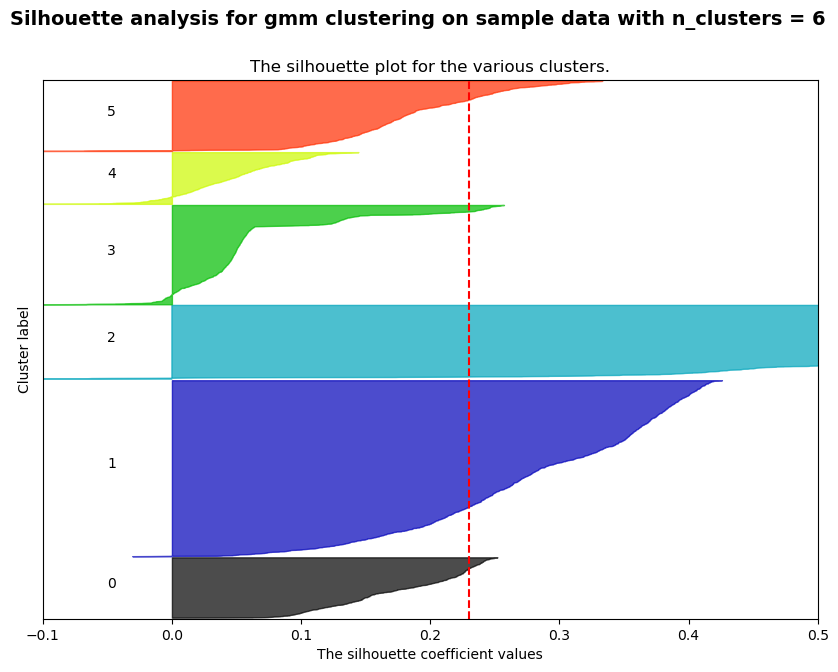

...

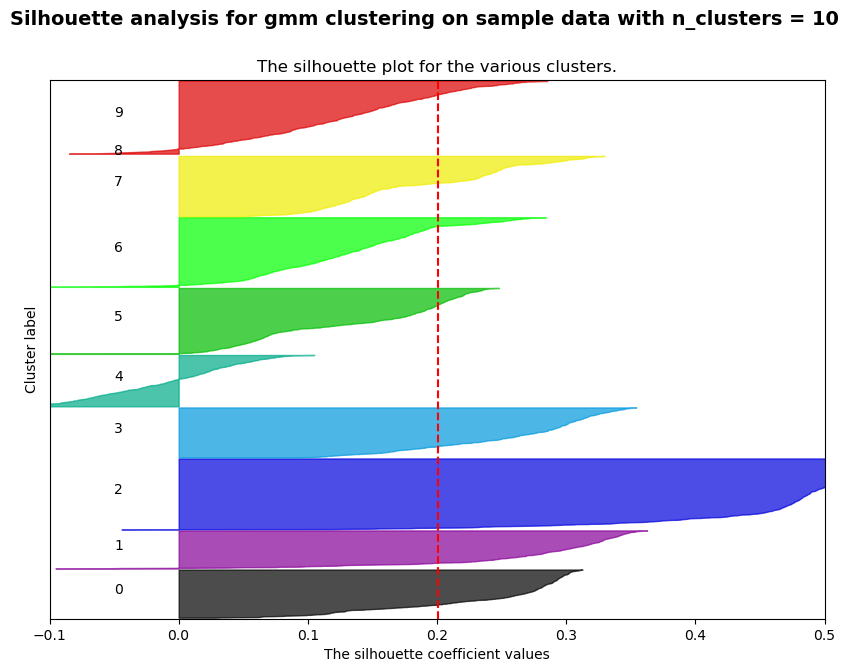

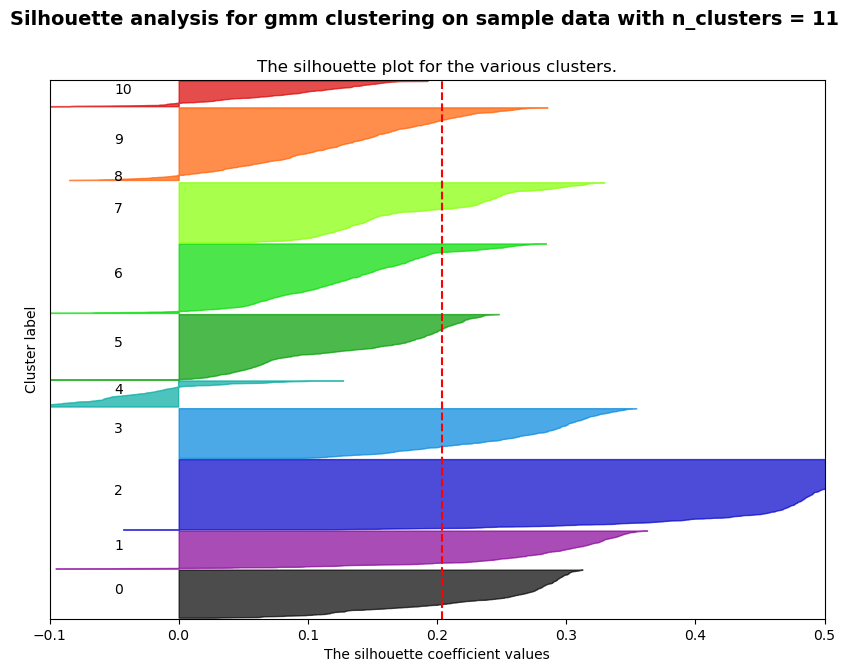

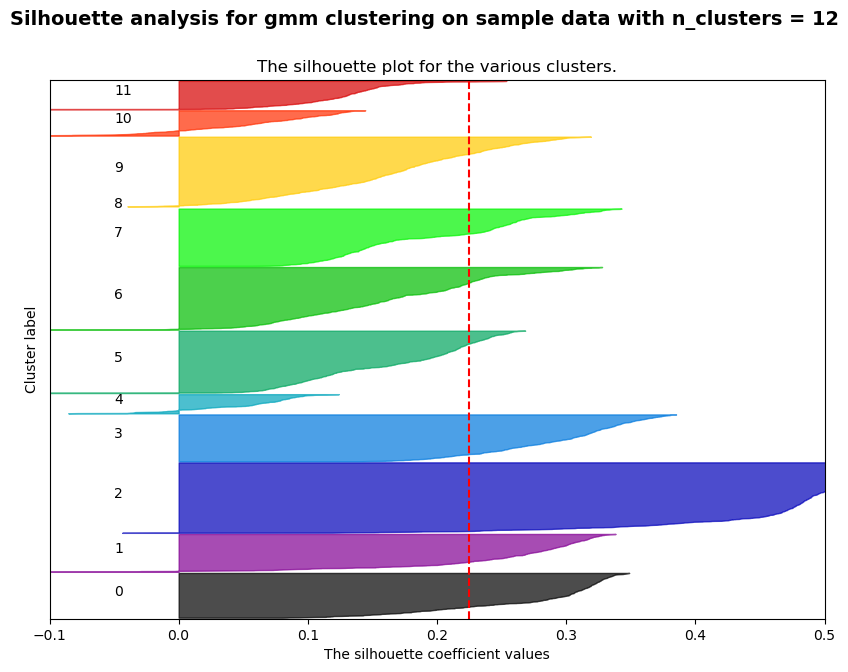

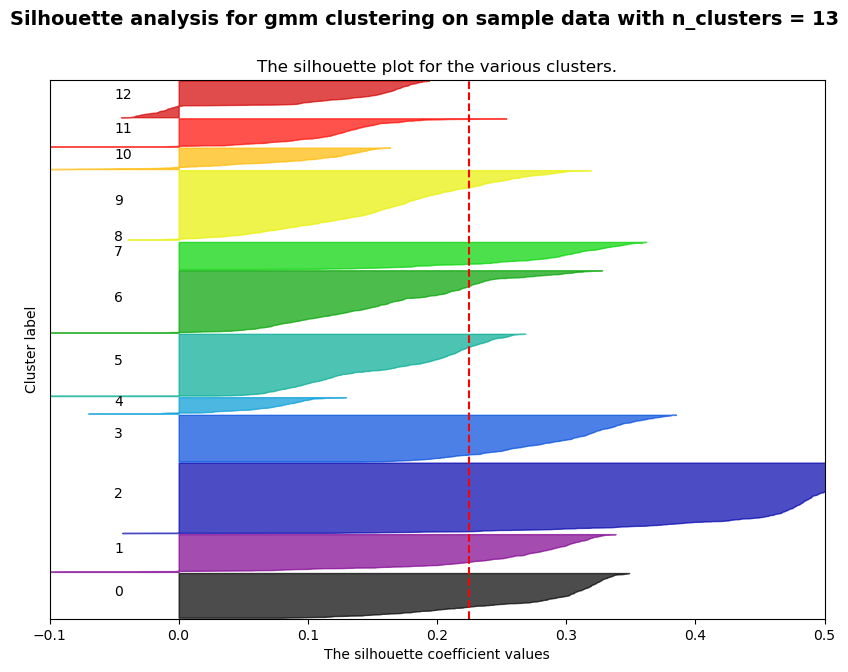

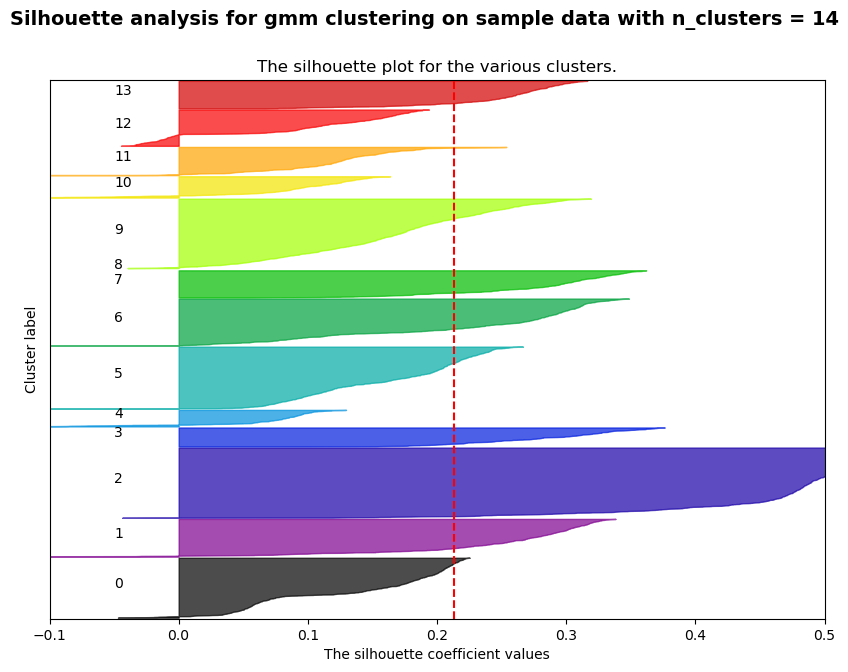

In [909]:
# Experiment 13 gmm - PCA - stroke data\
dt = X2_tr_pca[:,0:pca_2]
silplot(dt, 'gmm', 'Stroke Data', exp="13")
X2_tr_exp13 = GM(7, random_state=0).fit_predict(dt)

In [910]:
X2_tr_exp13.shape 

(5110,)

Using gmm on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.1939882940928709
Using gmm on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.23893921454729833
Using gmm on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.22161717149434582
Using gmm on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.22165262848253012
Using gmm on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.23993067932884407
Using gmm on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.27302722661165524
Using gmm on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.264438097761582
Using gmm on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.3201355335270454
Using gmm on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.33075392874527354
Using gmm on dataset Stroke Data For n_clusters =

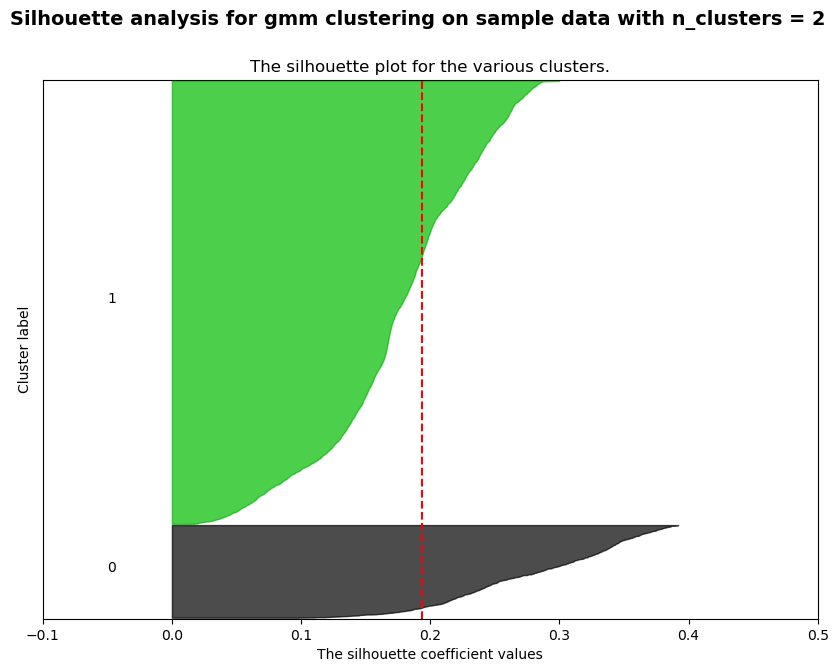

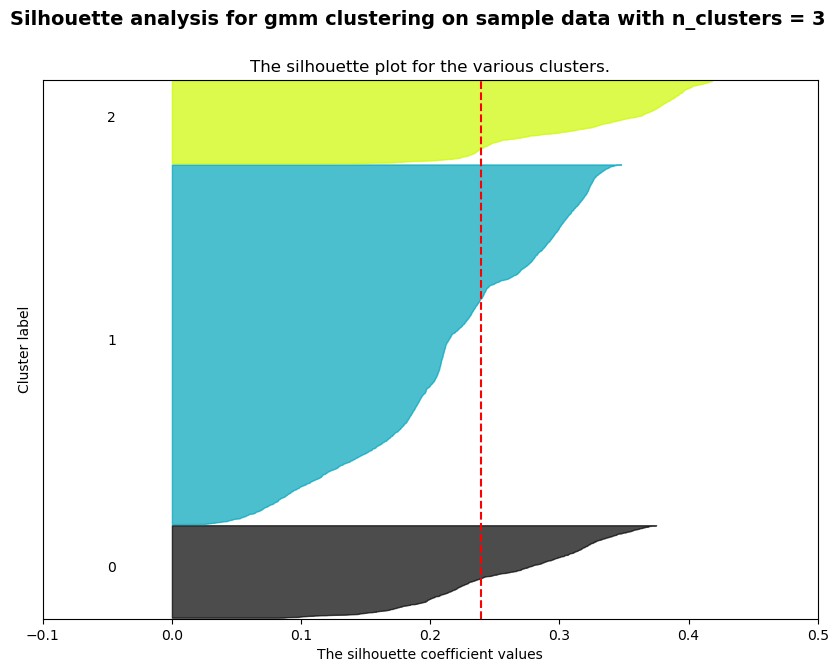

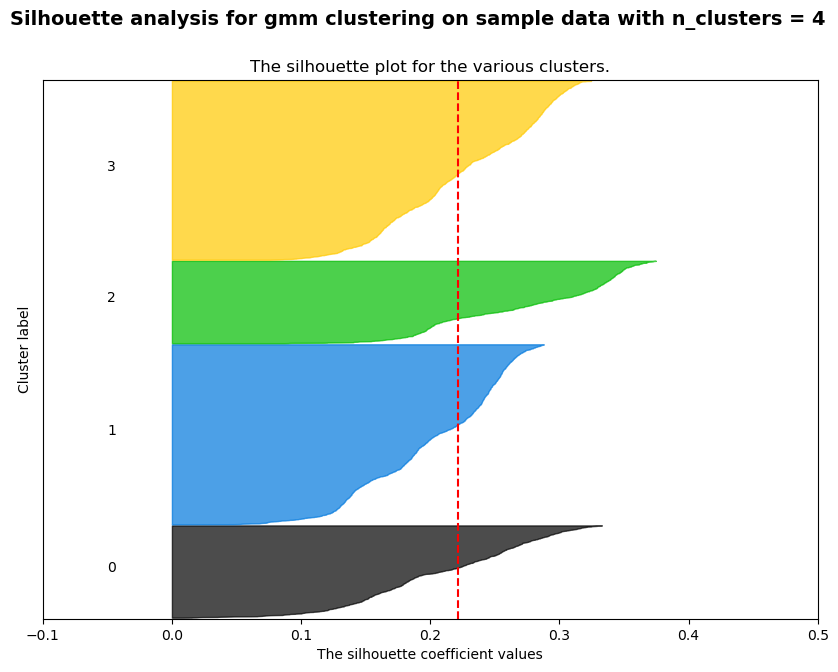

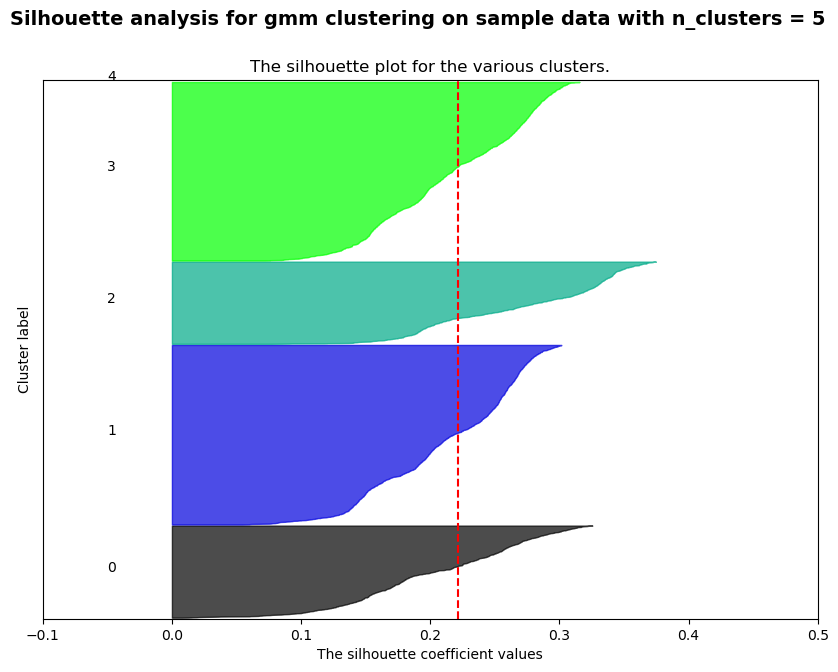

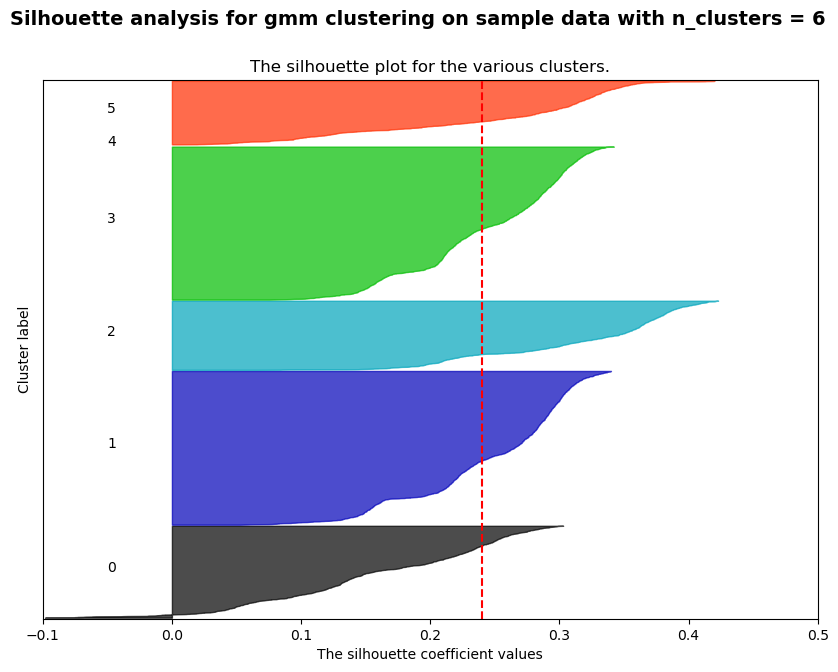

...

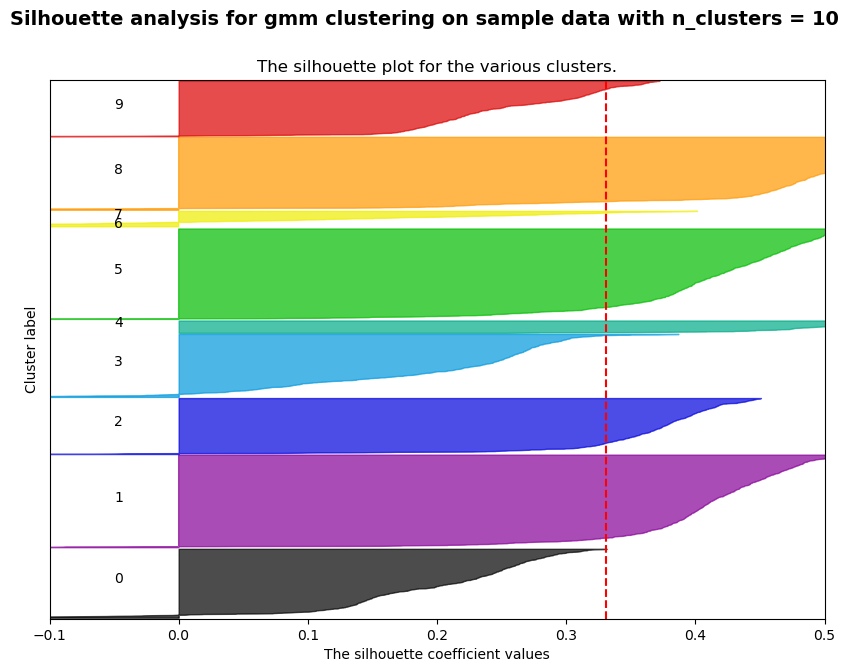

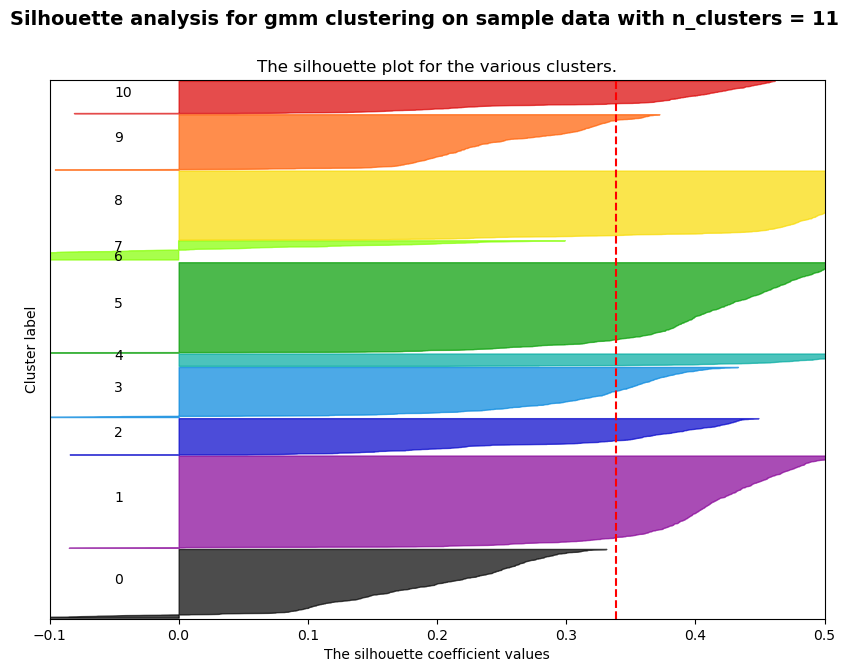

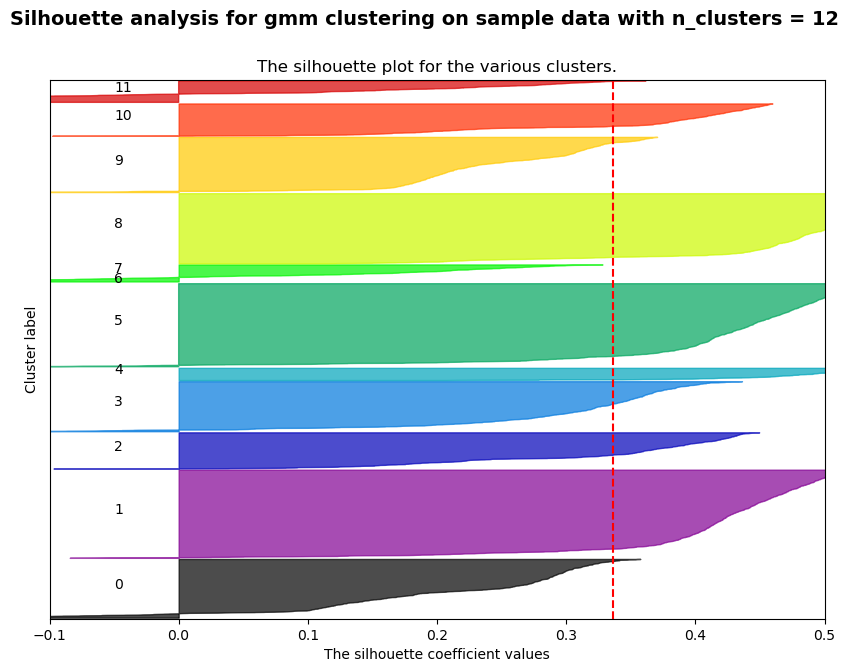

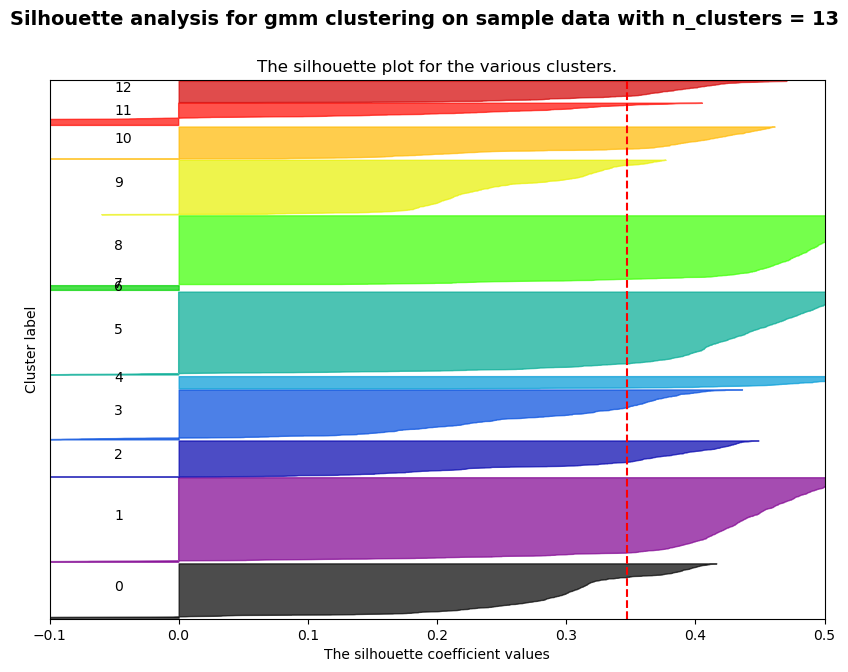

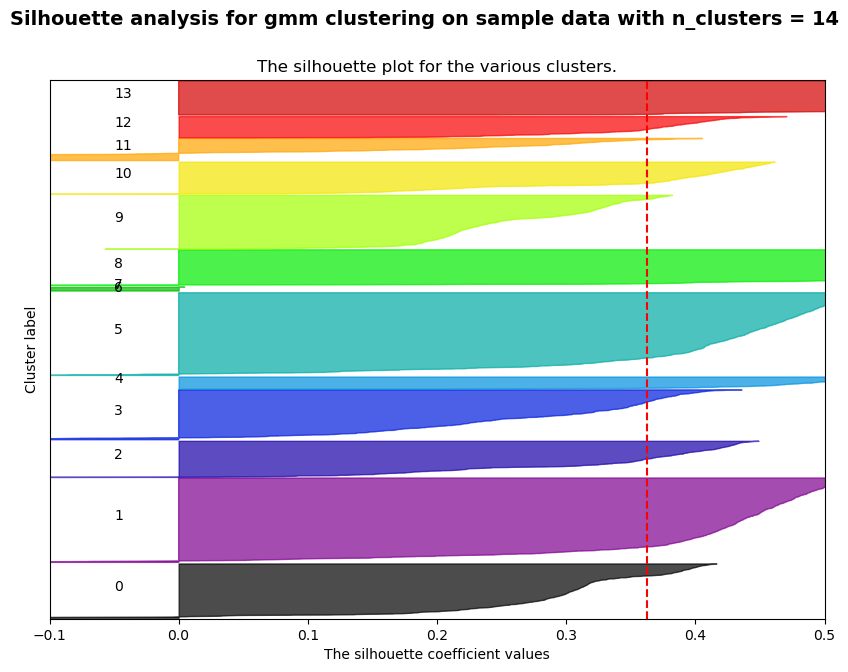

In [911]:
# Experiment 14 gmm - ICA - stroke data
dt = X2_tr_ica[:,0:ica_2]
silplot(dt, 'gmm', 'Stroke Data', exp="14")
X2_tr_exp14 = GM(7, random_state=0).fit_predict(dt)

Using gmm on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.2390021838506611
Using gmm on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.16244193937351137
Using gmm on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.25133174527411284
Using gmm on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.22121331473695527
Using gmm on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.18758394692154937
Using gmm on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.17833312004798868
Using gmm on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.1781941218761904
Using gmm on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.2221108684997509
Using gmm on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.21679677706510647
Using gmm on dataset Stroke Data For n_clusters 

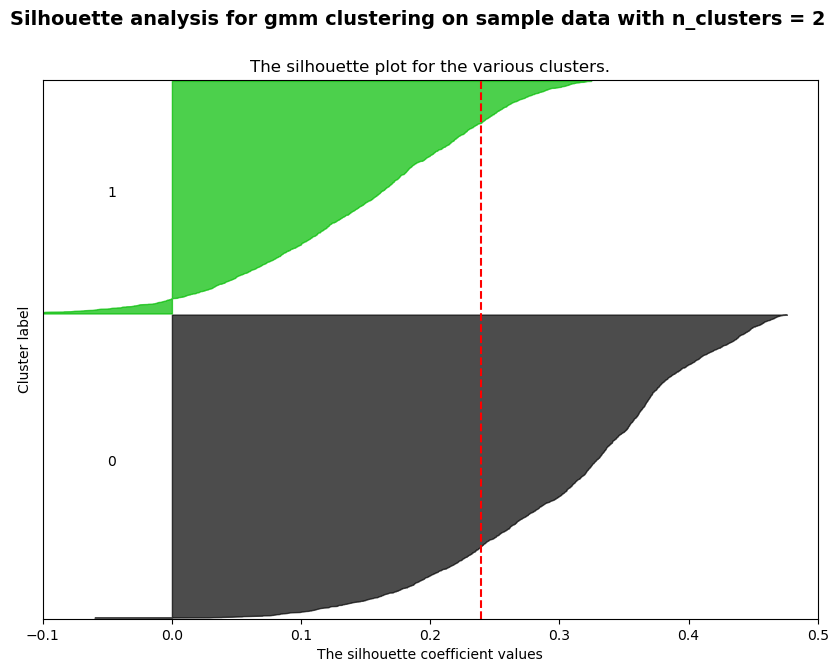

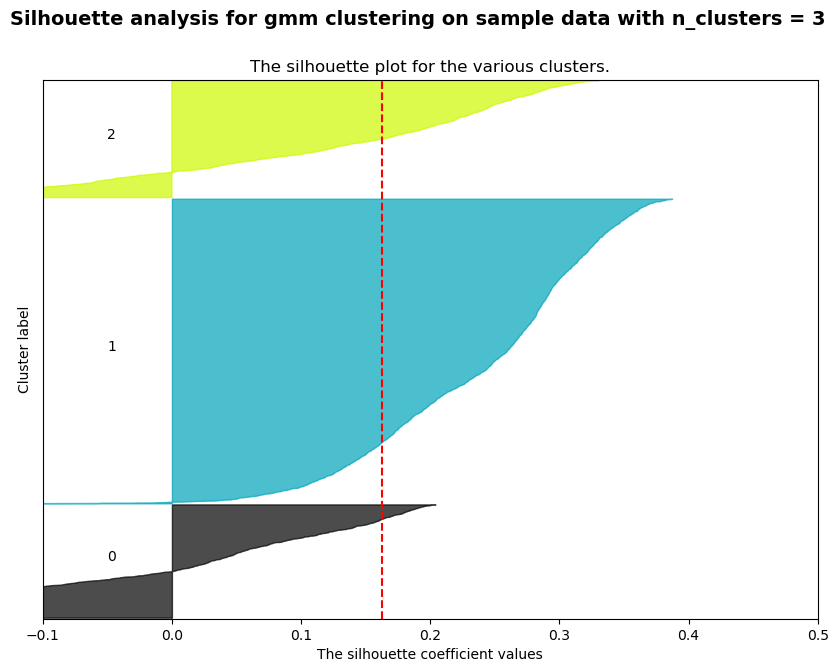

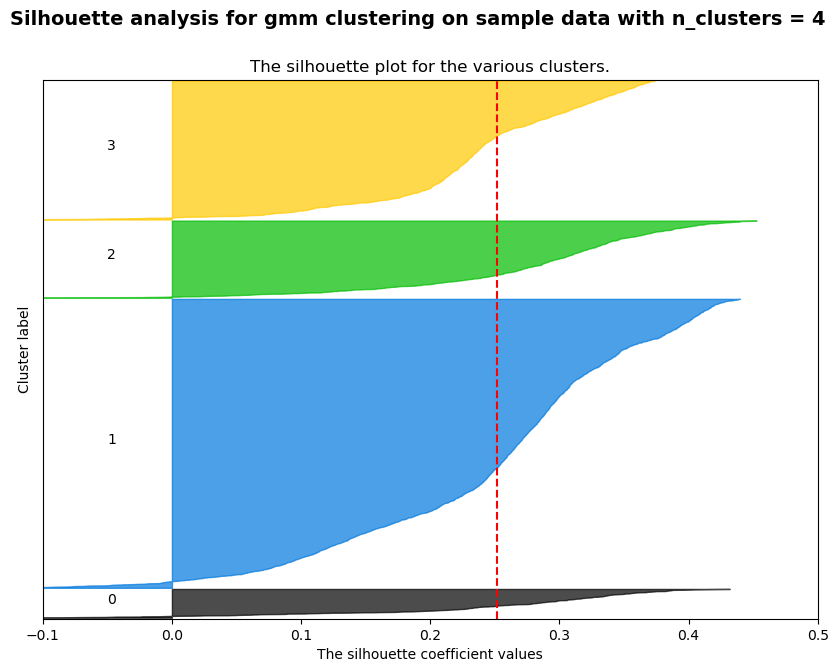

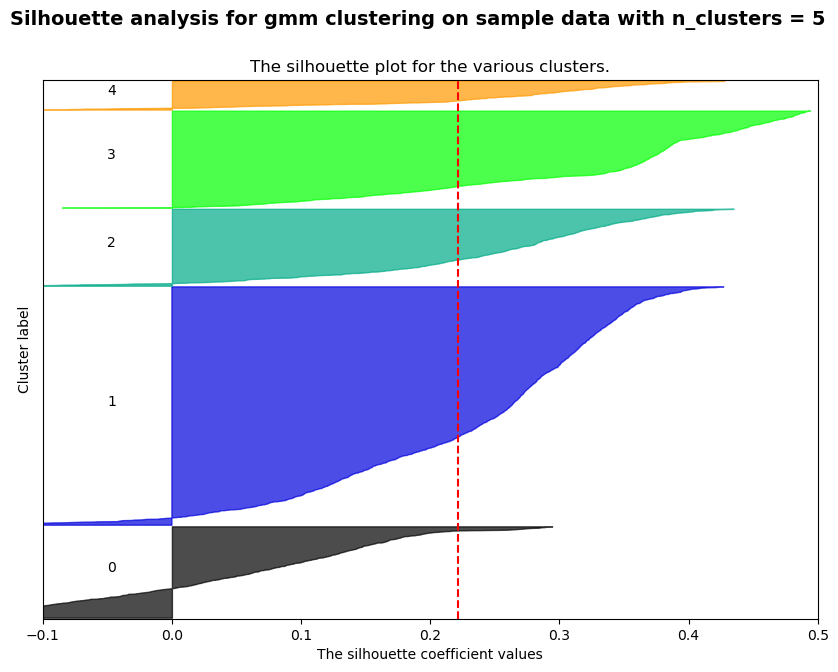

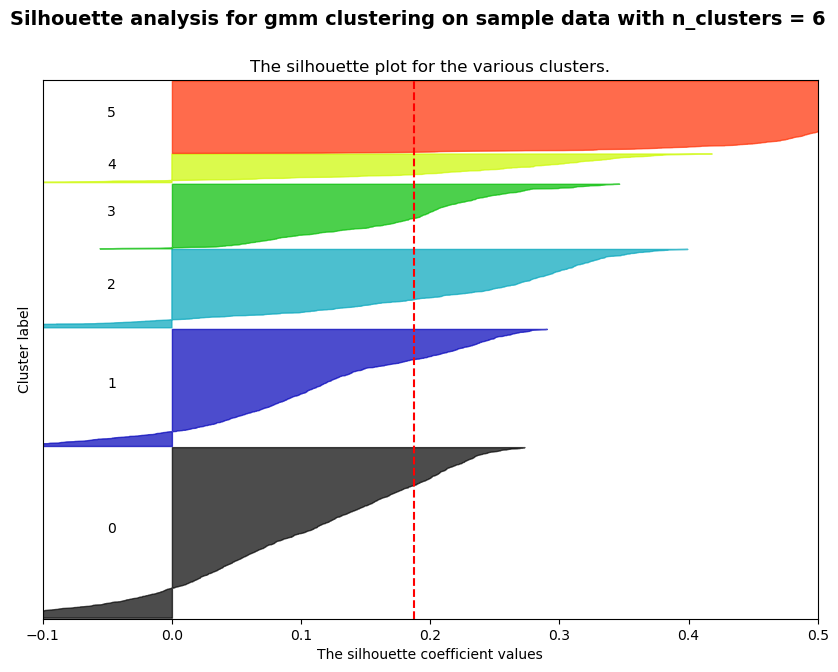

...

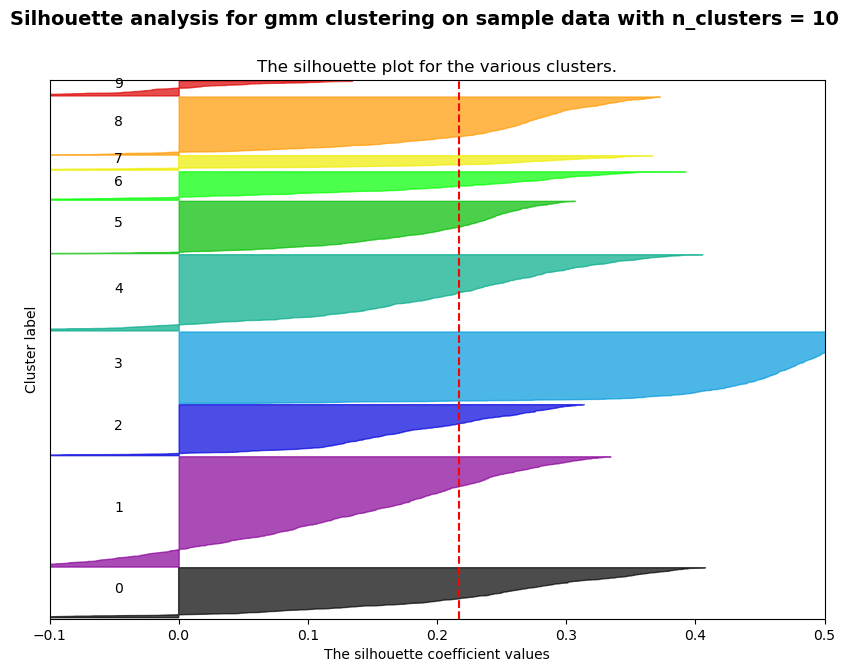

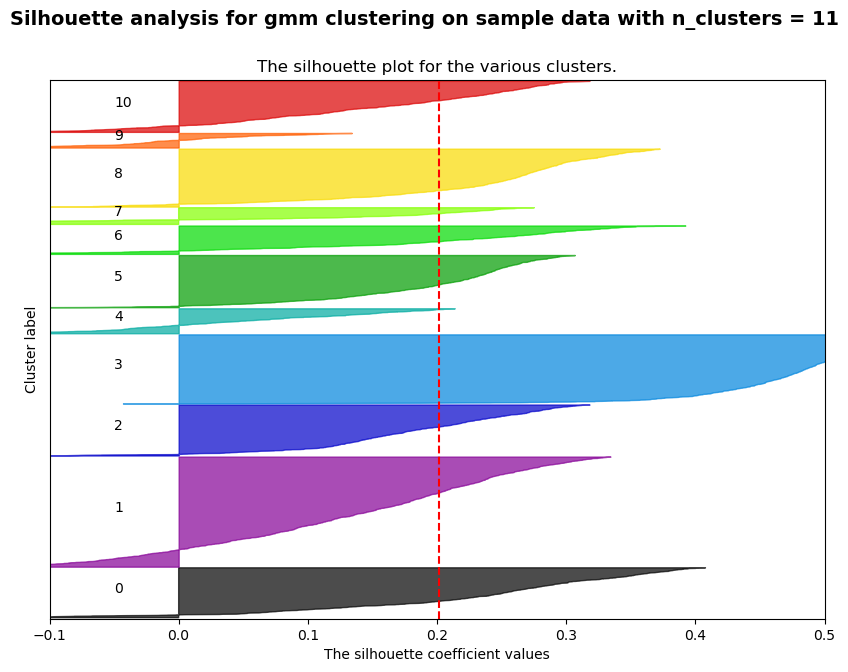

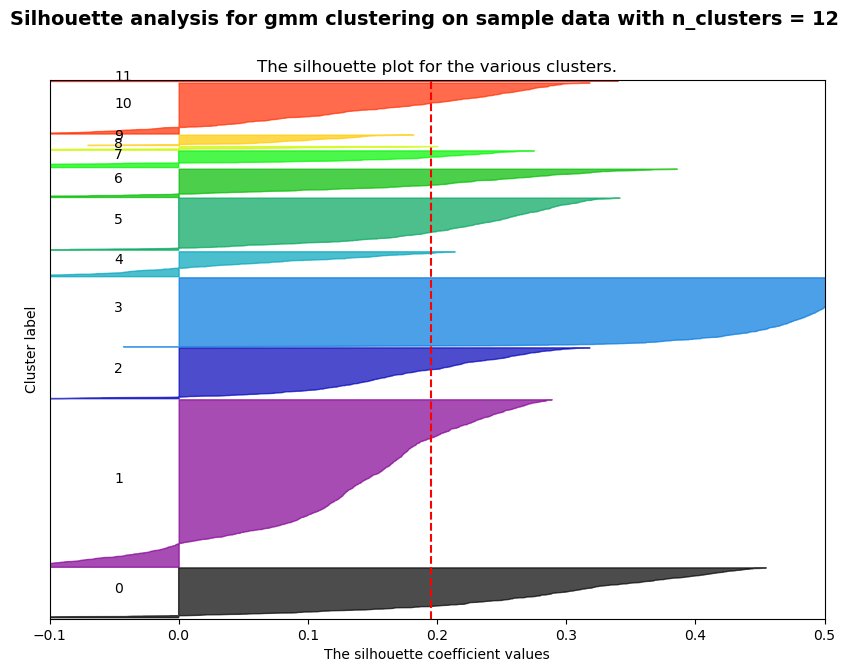

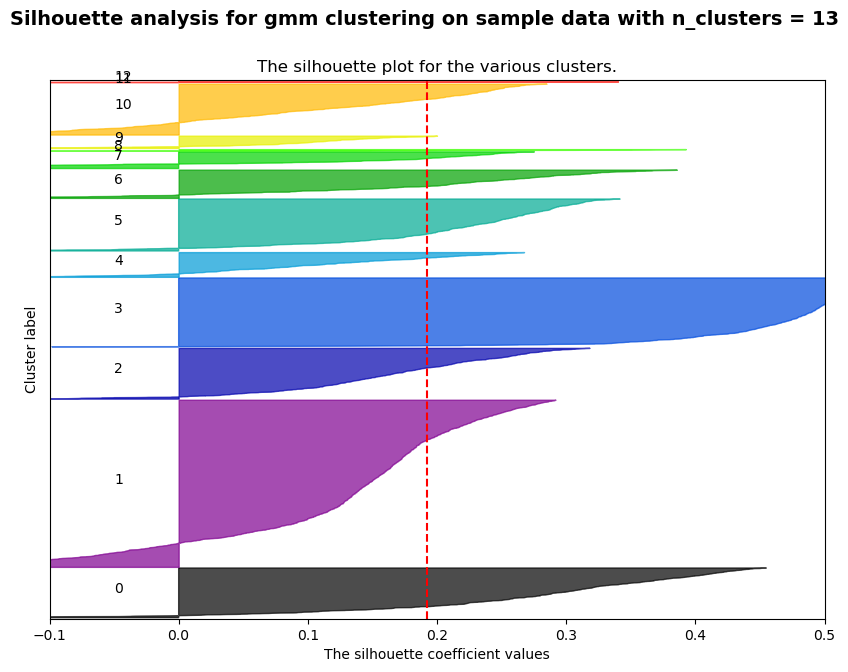

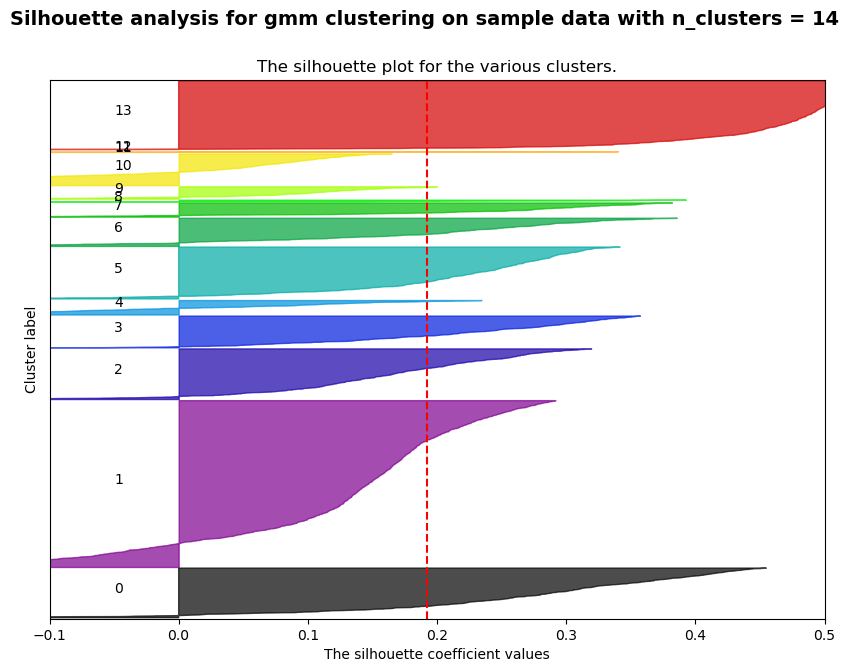

In [912]:
# Experiment 15 gmm - RCA - stroke data
dt = X2_tr_rca[:,0:rca_2]
silplot(dt, 'gmm', 'Stroke Data', exp="15")
X2_tr_exp15 = GM(4, random_state=0).fit_predict(dt)

Using gmm on dataset Stroke Data For n_clusters = 2 The average silhouette_score is : 0.20157157845199902
Using gmm on dataset Stroke Data For n_clusters = 3 The average silhouette_score is : 0.2501501457919523
Using gmm on dataset Stroke Data For n_clusters = 4 The average silhouette_score is : 0.22578103505336178
Using gmm on dataset Stroke Data For n_clusters = 5 The average silhouette_score is : 0.25159464630195205
Using gmm on dataset Stroke Data For n_clusters = 6 The average silhouette_score is : 0.26812906206634024
Using gmm on dataset Stroke Data For n_clusters = 7 The average silhouette_score is : 0.2834476048837261
Using gmm on dataset Stroke Data For n_clusters = 8 The average silhouette_score is : 0.2892347109383017
Using gmm on dataset Stroke Data For n_clusters = 9 The average silhouette_score is : 0.30830374478883565
Using gmm on dataset Stroke Data For n_clusters = 10 The average silhouette_score is : 0.3159481939515049
Using gmm on dataset Stroke Data For n_clusters =

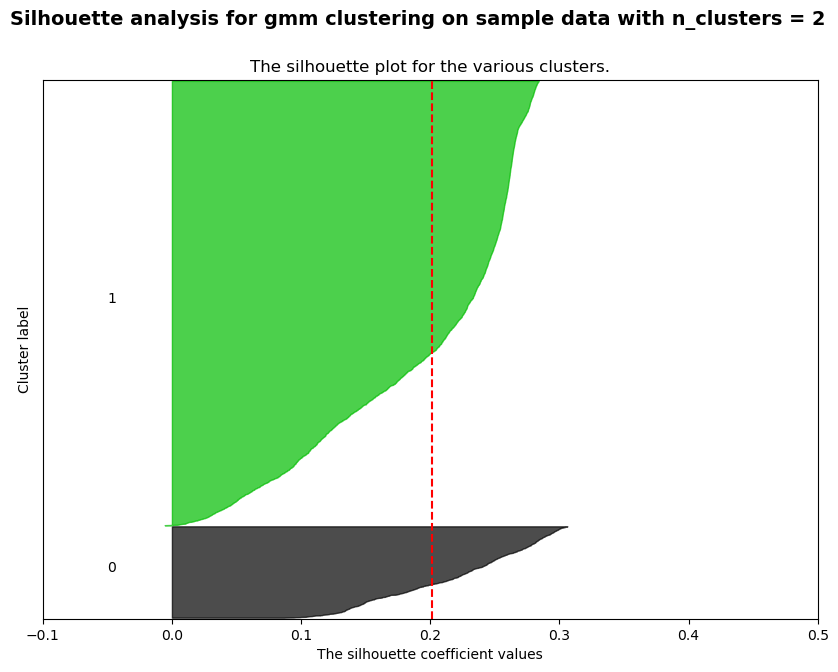

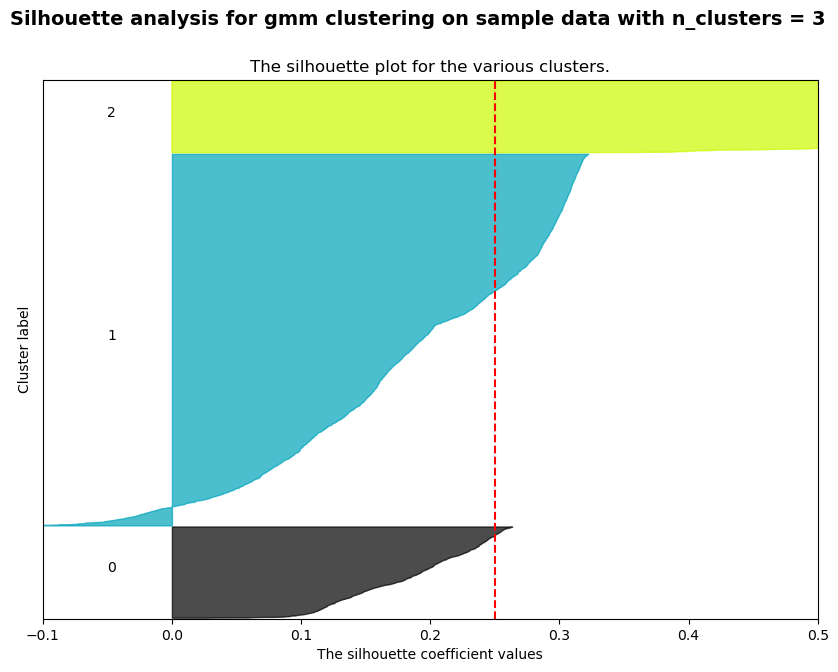

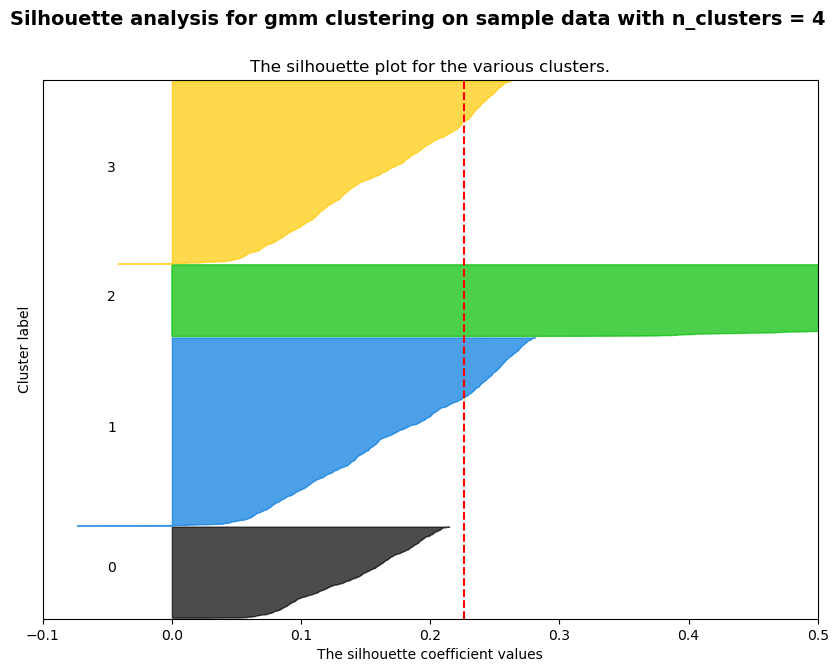

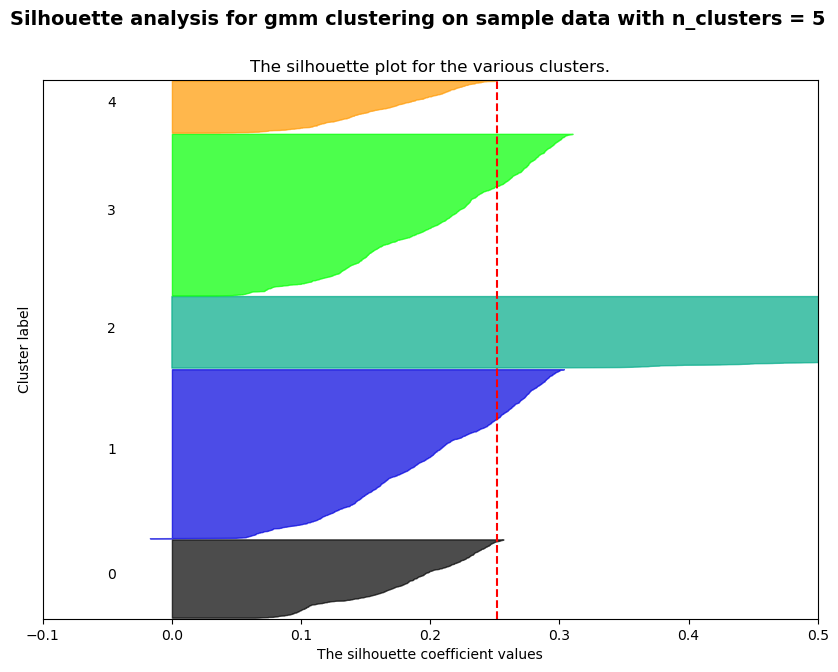

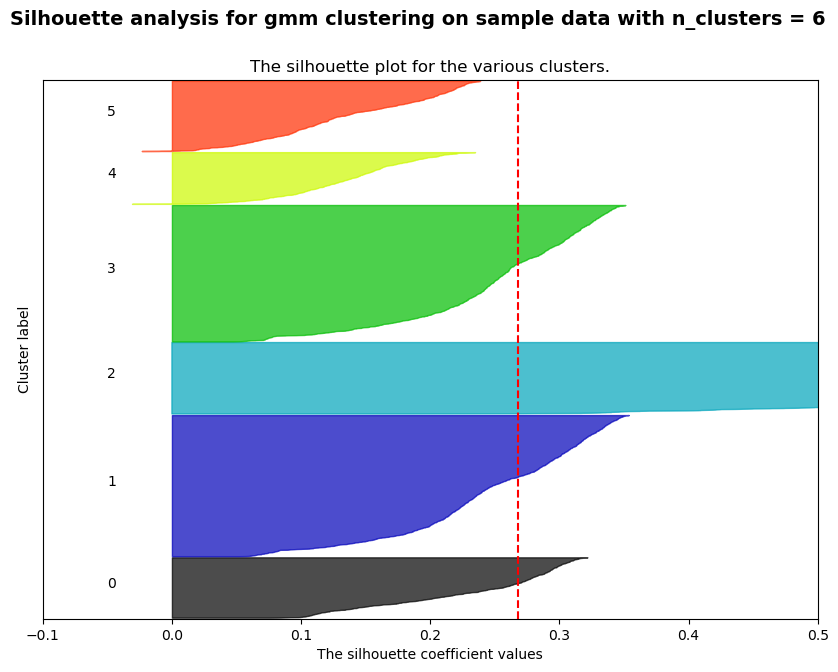

...

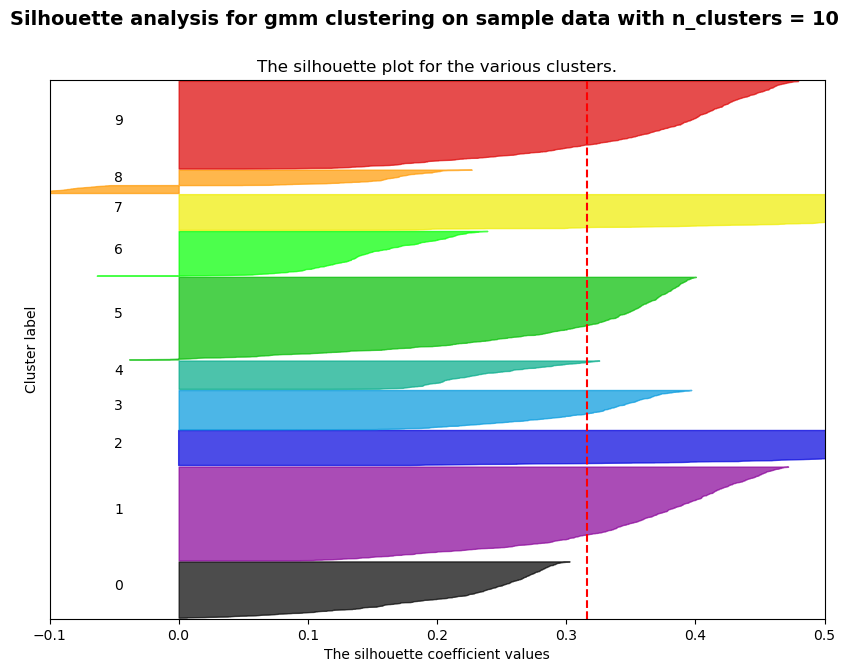

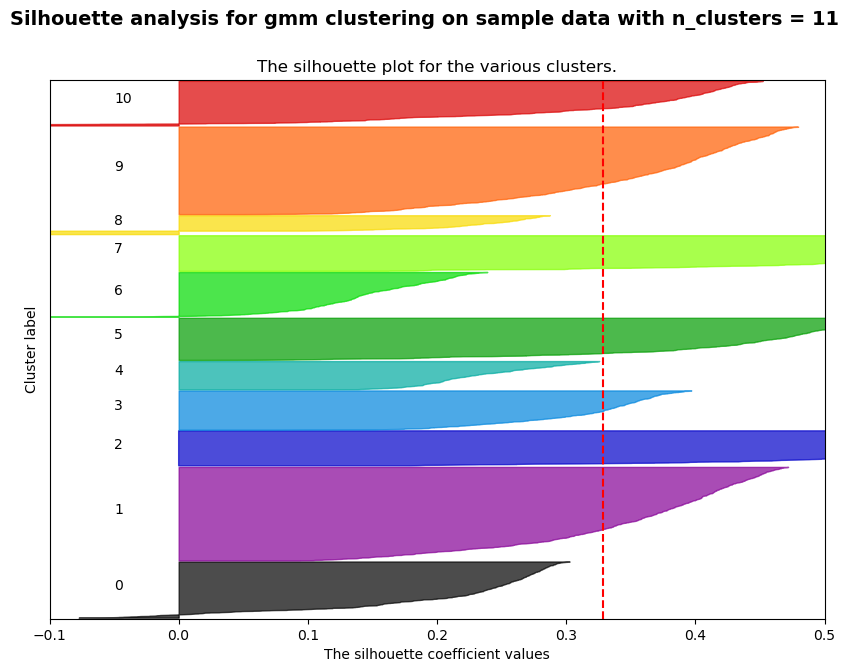

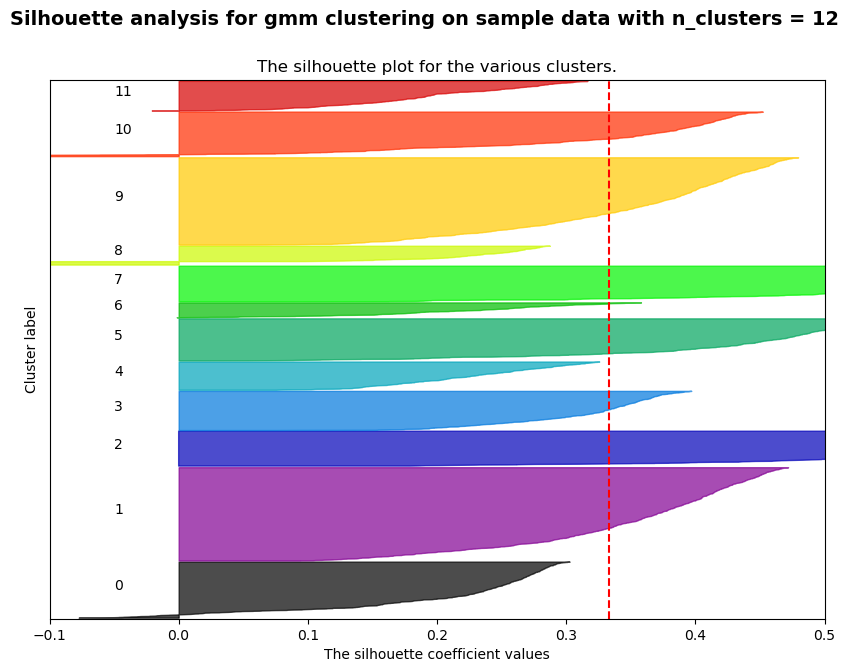

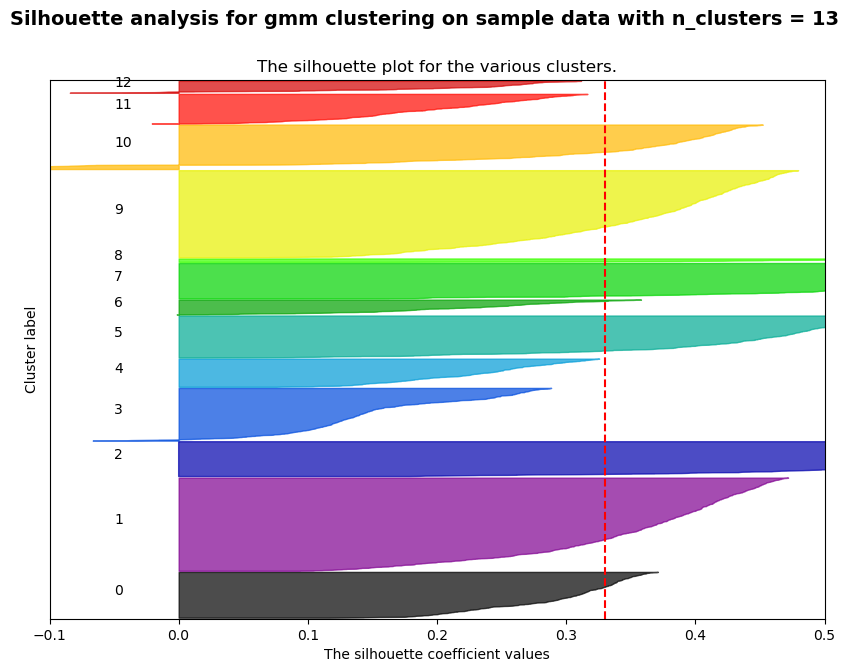

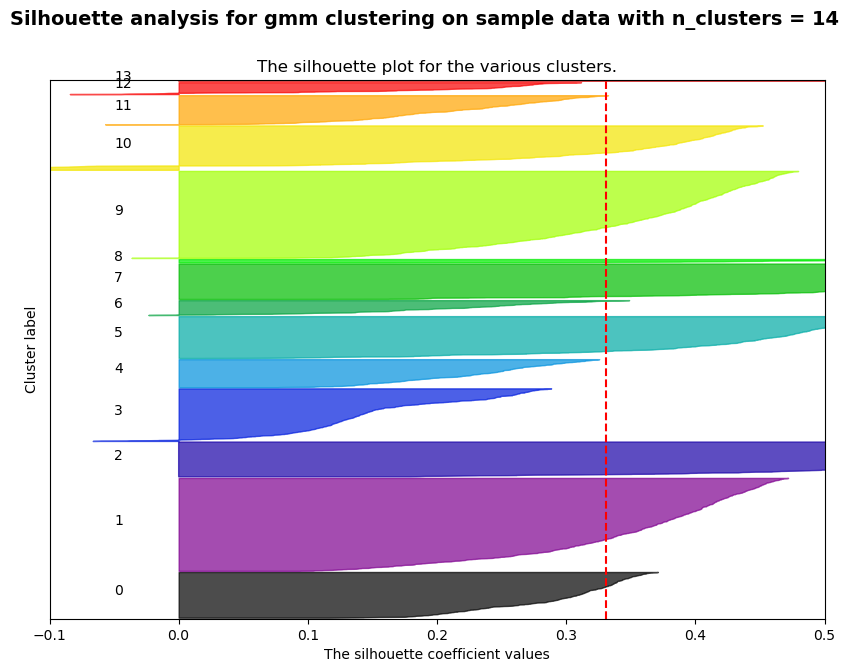

In [913]:
# Experiment 16 gmm - k-best - stroke data
dt = X2_scal[:,feats2]
silplot(dt, 'gmm', 'Stroke Data', exp="16")
X2_tr_exp16 = GM(10, random_state=0).fit_predict(dt)

## Part 4: Use dim reduced data for ANN

In [773]:

from sklearn.neural_network import MLPRegressor
from sklearn.neural_network import MLPClassifier
import time
from sklearn.metrics import mean_squared_error, r2_score, precision_score, accuracy_score, recall_score, roc_auc_score


def train_loop(ann, epochs):
    training_scores = []
    testing_scores = []
    best = -1000
    best_ann = None
    for epoch in range(epochs):
        ann.fit(X_train, y_train)
        test_score = ann.score(X_test, y_test)
        training_scores.append(ann.score(X_train, y_train))
        testing_scores.append(test_score)
        if test_score > best:
            best = test_score
            best_ann = ann
            
    print("Final train/test scores:", training_scores[-1], testing_scores[-1])
    
    return ann, training_scores, testing_scores, best_ann


def plot_learning():
    epoch_list = list(range(epochs))
    fig, ax = plt.subplots()
    ax.set_xlabel("Epochs")
    ax.set_ylabel("R2 Score")
    ax.set_title("Learning Curves for ANN")
    ax.plot(epoch_list, training_scores, label="train")
    ax.plot(epoch_list, testing_scores, label="test")
    plt.ylim((0,1))
    ax.legend()
    return plt

Final train/test scores: 0.8240405693415486 0.7218463595752918


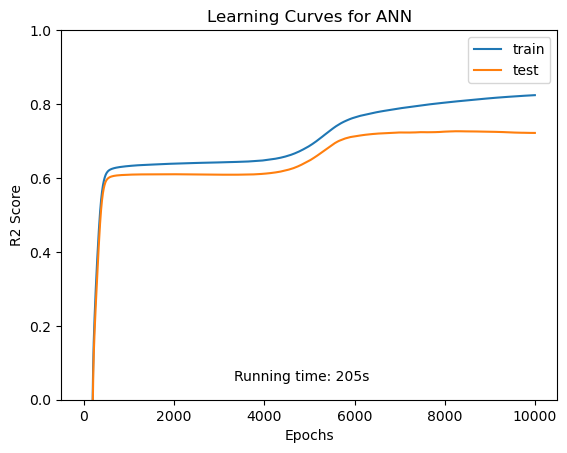

In [760]:
# Fit ANN using original data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X1_scal, y1, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPRegressor(**params)
start_time = time.time()
ann, training_scores, testing_scores, best_ann = train_loop(ann, epochs)
running_time = time.time() - start_time
plt = plot_learning()
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/house_ann_100x2.png', format='png', transparent=True)

Final train/test scores: 0.8095710286390361 0.6775206060408301


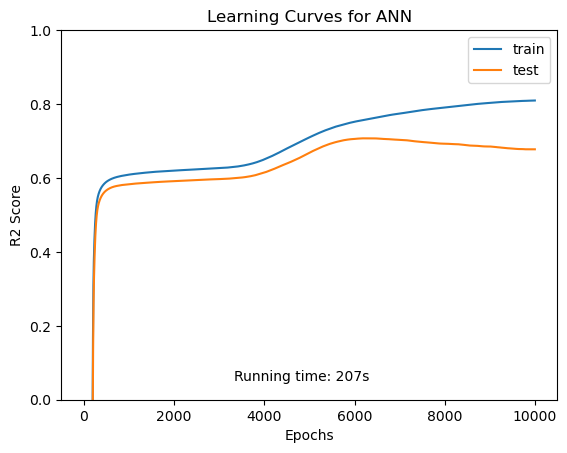

In [761]:
# Fit ANN using PCA data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X1_tr_pca[:,0:pca_1], y1, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPRegressor(**params)
start_time = time.time()
ann, training_scores, testing_scores, best_ann = train_loop(ann, epochs)
running_time = time.time() - start_time
plt = plot_learning()
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/house_ann_pca_100x2.png', format='png', transparent=True)

Final train/test scores: 0.5906441893924133 0.5870086055908993


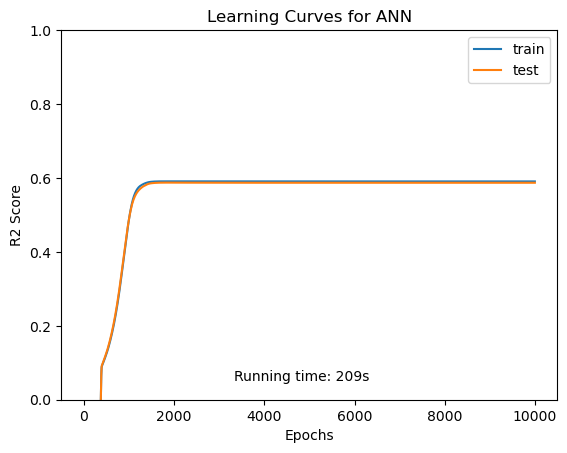

In [762]:
# Fit ANN using ICA data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X1_tr_ica[:,0:ica_1], y1, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPRegressor(**params)
start_time = time.time()
ann, training_scores, testing_scores, best_ann = train_loop(ann, epochs)
running_time = time.time() - start_time
plt = plot_learning()
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/house_ann_ica_100x2.png', format='png', transparent=True)

Final train/test scores: 0.7047522835692528 0.6390664750612669


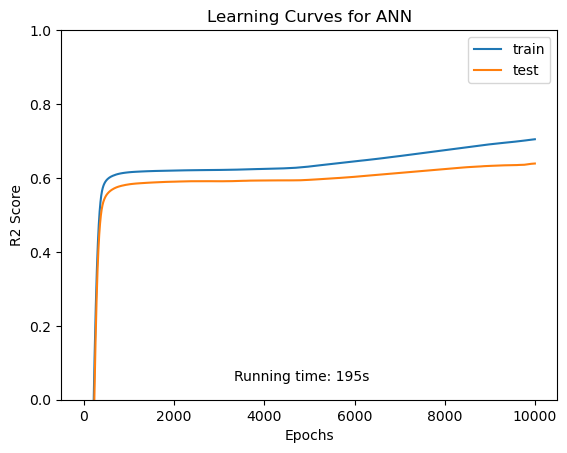

In [763]:
# Fit ANN using RCA data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X1_tr_rca[:,0:rca_1], y1, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPRegressor(**params)
start_time = time.time()
ann, training_scores, testing_scores, best_ann = train_loop(ann, epochs)
running_time = time.time() - start_time
plt = plot_learning()
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/house_ann_rca_100x2.png', format='png', transparent=True)

Final train/test scores: 0.7807813695766708 0.7031001677528119


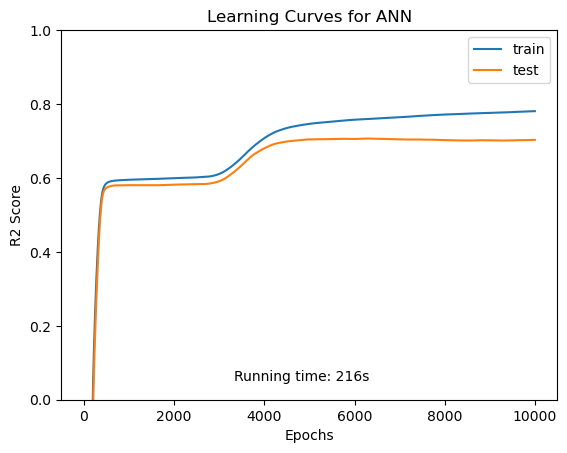

In [764]:
# Fit ANN using kbest data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X1_scal[:,feats1], y1, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPRegressor(**params)
start_time = time.time()
ann, training_scores, testing_scores, best_ann = train_loop(ann, epochs)
running_time = time.time() - start_time
plt = plot_learning()
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/house_ann_kbest_100x2.png', format='png', transparent=True)

370

In [788]:
def train_loop_cl(ann, epochs):
    training_scores = np.empty((epochs, 3))
    testing_scores = np.empty((epochs, 3))
    for epoch in range(epochs):
        ann.fit(X_train, y_train)
        training_scores[epoch,:] = np.array((precision_score(y_train, ann.predict(X_train)),recall_score(y_train, ann.predict(X_train)), roc_auc_score(y_train, ann.predict(X_train))))
        testing_scores[epoch,:] = np.array((precision_score(y_test, ann.predict(X_test)), recall_score(y_test, ann.predict(X_test)), roc_auc_score(y_test, ann.predict(X_test))))
    
    print("Final train/test scores:", training_scores[-1], testing_scores[-1])
    best_epoch = np.argmax(testing_scores[:,2])
    print("Max test score, epoch:", testing_scores[best_epoch,:], best_epoch)
    return ann, training_scores, testing_scores

def plot_learning_cl(val='precision'):
    if val == 'precision':
        ix = 0
    elif val == 'recall':
        ix = 1
    else:
        ix = 2
    epoch_list = list(range(epochs))
    fig, ax = plt.subplots()
    ax.set_xlabel("Epochs")
    ax.set_ylabel(val + " score")
    ax.set_title("Learning Curves for ANN")
    ax.plot(epoch_list, training_scores[:,ix], label="train")
    ax.plot(epoch_list, testing_scores[:,ix], label="test")
    plt.ylim((0,1))
    ax.legend()
    return plt

Final train/test scores: [0.73873874 0.99393939 0.98806853] [0.09655172 0.16666667 0.54247245]
Max test score, epoch: [0.17094017 0.23809524 0.58879185] 2439


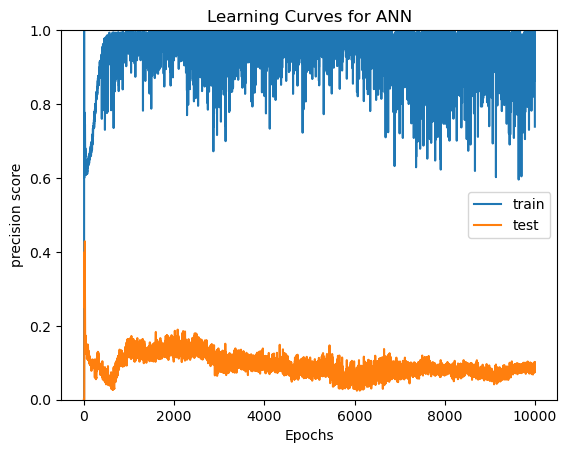

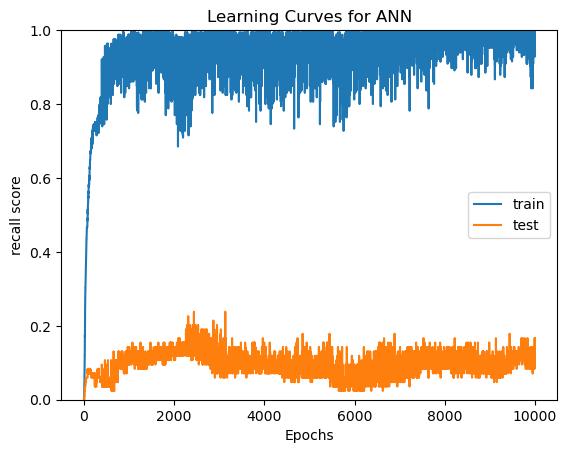

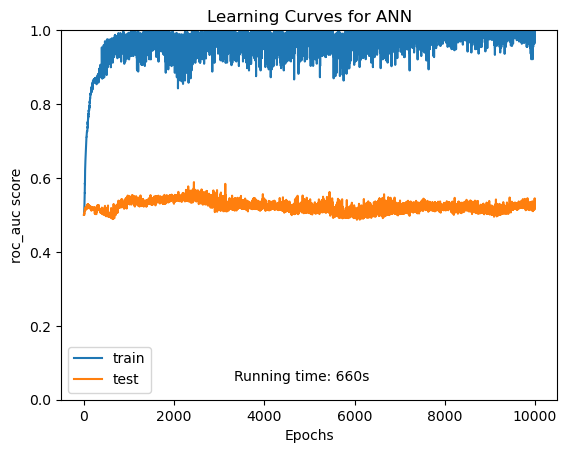

In [852]:
# Fit ANN using original data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X2_scal, y2, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
         }

ann = MLPClassifier(**params)
start_time = time.time()
ann, training_scores, testing_scores = train_loop_cl(ann, epochs)
running_time = time.time() - start_time
plot_learning_cl('precision')
plt.savefig('./paper/figures/stroke_ann_precision.png', format='png', transparent=True)
plot_learning_cl('recall')
plt.savefig('./paper/figures/stroke_ann_recall.png', format='png', transparent=True)
plot_learning_cl('roc_auc')
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/stroke_ann_roc.png', format='png', transparent=True)

Final train/test scores: [0.97385621 0.9030303  0.95090128] [0.09090909 0.07142857 0.51699938]
Max test score, epoch: [0.17117117 0.22619048 0.58439904] 1681


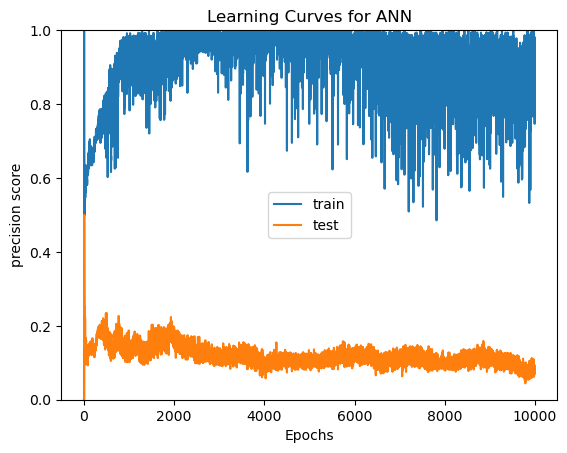

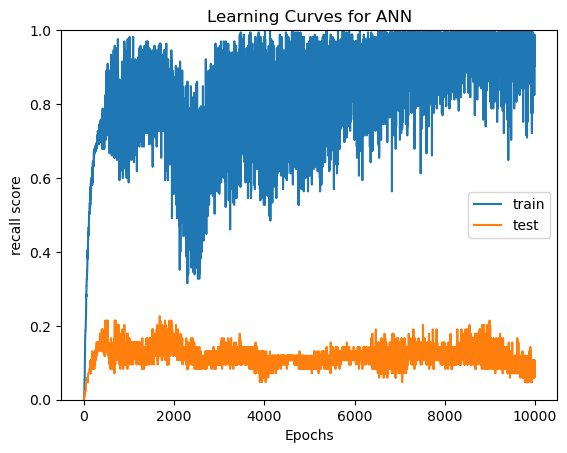

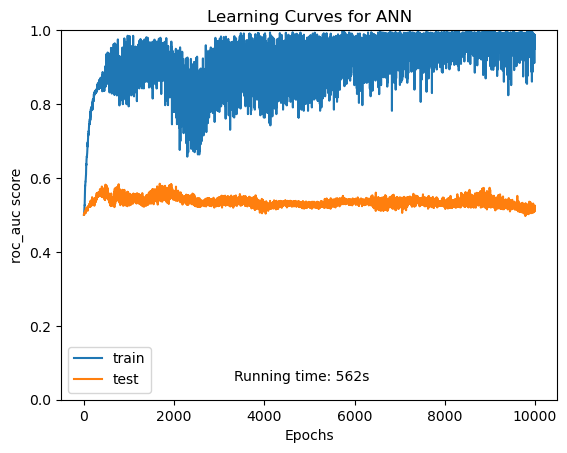

In [853]:
# Fit ANN using PCA data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X2_tr_pca[:,0:pca_2], y2, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
         }

ann = MLPClassifier(**params)
start_time = time.time()
ann, training_scores, testing_scores = train_loop_cl(ann, epochs)
running_time = time.time() - start_time
plot_learning_cl('precision'), plot_learning_cl('recall'), plot_learning_cl('roc_auc')
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/stroke_ann_pca_100x2.png', format='png', transparent=True)

Final train/test scores: [0.55882353 0.23030303 0.61054746] [0.16666667 0.04761905 0.51757122]
Max test score, epoch: [0.15909091 0.08333333 0.53012581] 9946


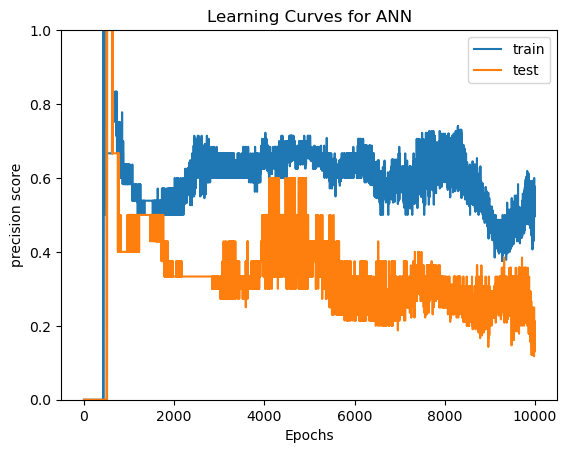

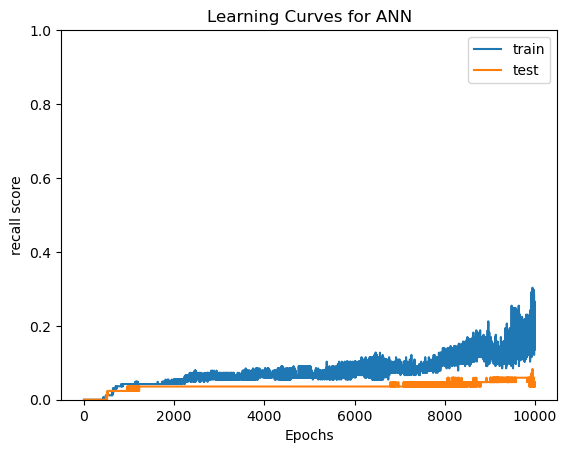

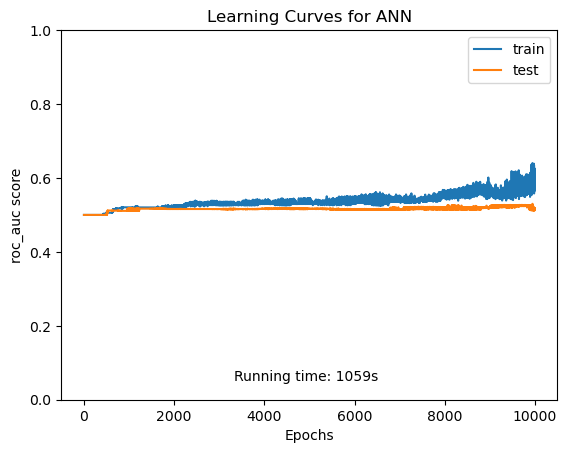

In [854]:
# Fit ANN using ICA data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X2_tr_ica[:,0:ica_2], y2, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
         }

ann = MLPClassifier(**params)
start_time = time.time()
ann, training_scores, testing_scores = train_loop_cl(ann, epochs)
running_time = time.time() - start_time
plot_learning_cl('precision'), plot_learning_cl('recall'), plot_learning_cl('roc_auc')
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/stroke_ann_ica_100x2.png', format='png', transparent=True)

Final train/test scores: [0.98901099 0.54545455 0.7725738 ] [0.0862069  0.05952381 0.5132304 ]
Max test score, epoch: [0.13761468 0.17857143 0.55996569] 5160


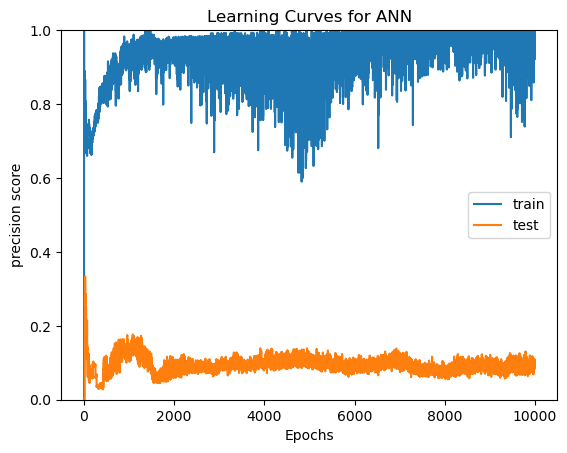

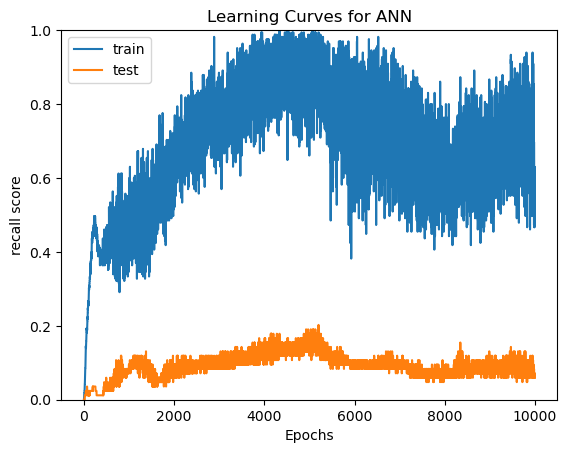

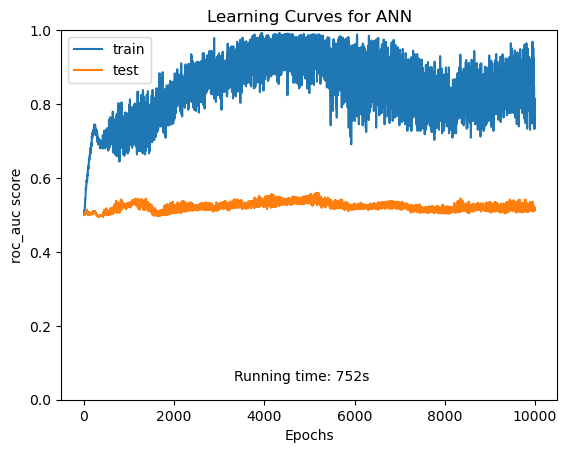

In [855]:
# Fit ANN using RCA data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X2_tr_rca[:,0:rca_2], y2, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
         }

ann = MLPClassifier(**params)
start_time = time.time()
ann, training_scores, testing_scores = train_loop_cl(ann, epochs)
running_time = time.time() - start_time
plot_learning_cl('precision'), plot_learning_cl('recall'), plot_learning_cl('roc_auc')
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/stroke_ann_rca_100x2.png', format='png', transparent=True)

Final train/test scores: [0.84571429 0.8969697  0.9443412 ] [0.10377358 0.13095238 0.53584425]
Max test score, epoch: [0.18032787 0.26190476 0.59976087] 5898


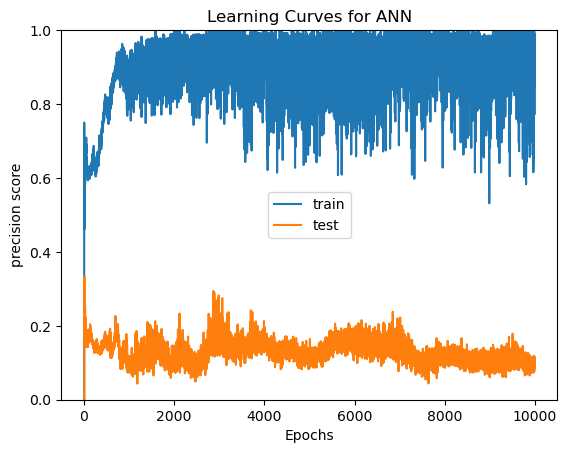

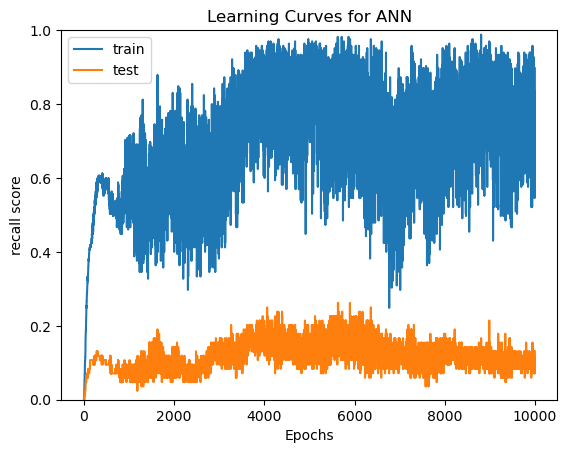

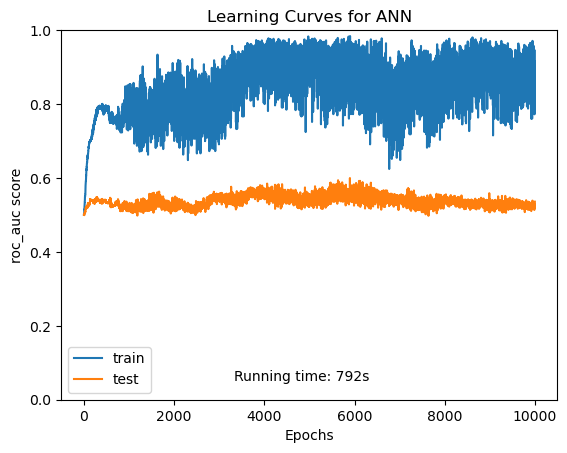

In [856]:
# Fit ANN using kbest data (scaled)
X_train, X_test, y_train, y_test = train_test_split(X2_scal[:,feats2], y2, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
         }

ann = MLPClassifier(**params)
start_time = time.time()
ann, training_scores, testing_scores = train_loop_cl(ann, epochs)
running_time = time.time() - start_time
plot_learning_cl('precision'), plot_learning_cl('recall'), plot_learning_cl('roc_auc')
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/stroke_ann_kbest_100x2.png', format='png', transparent=True)

## Part 5: Use clusters after dim reduction in ANN

Final train/test scores: 0.5360898016865947 0.39819335939663625


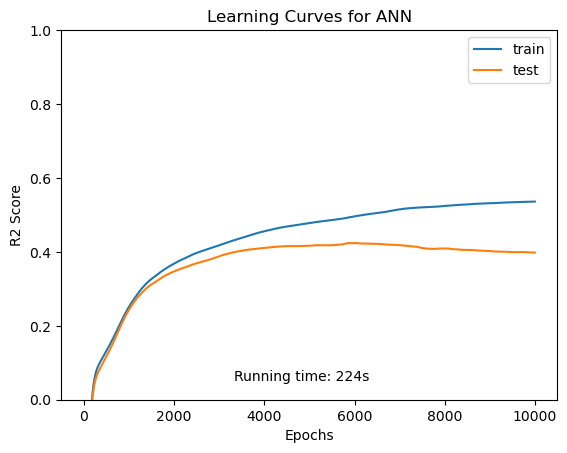

In [857]:
## Use new clusters as dim reduced features
# Fit ANN using PCA data (scaled)
new_X1 = np.array([X1_tr_exp1, X1_tr_exp2, X1_tr_exp3, X1_tr_exp4,X1_tr_exp5, X1_tr_exp6, X1_tr_exp7, X1_tr_exp8]).transpose()
X_train, X_test, y_train, y_test = train_test_split(new_X1, y1, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPRegressor(**params)
start_time = time.time()
ann, training_scores, testing_scores, best_ann = train_loop(ann, epochs)
running_time = time.time() - start_time
plt = plot_learning()
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/house_ann_dimred.png', format='png', transparent=True)

Final train/test scores: [0.  0.  0.5] [0.  0.  0.5]
Max test score, epoch: [0.23076923 0.07142857 0.52947598] 989


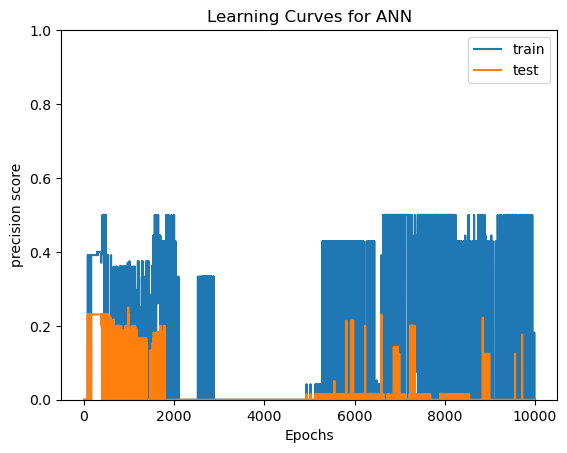

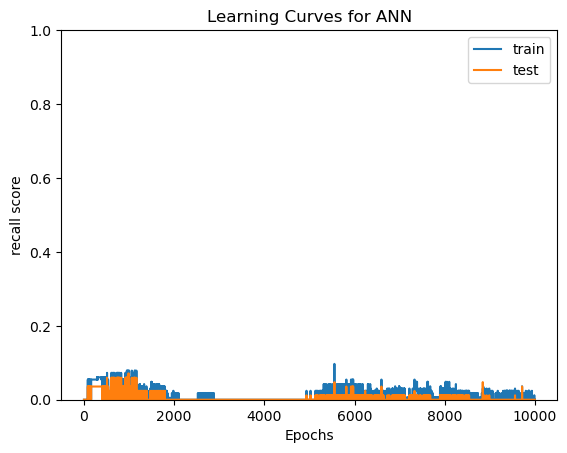

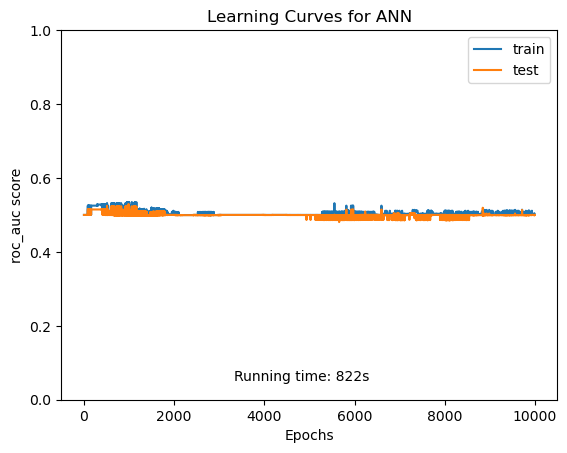

In [858]:
## Use new clusters as dim reduced features
# Fit ANN using PCA data (scaled)
new_X2 = np.array([X2_tr_exp9, X2_tr_exp10, X2_tr_exp11, X2_tr_exp12,X2_tr_exp13, X2_tr_exp14, X2_tr_exp15, X2_tr_exp16]).transpose()
X_train, X_test, y_train, y_test = train_test_split(new_X2, y2, test_size = 0.33, random_state = 2072020)
epochs = 10000
params = {
    'hidden_layer_sizes':(100,100),
    'activation':'relu',
    'learning_rate_init':0.001,
    'random_state':0,
    'max_iter':1,
    'warm_start':True,
    'alpha':0.0001,
         }

ann = MLPClassifier(**params)
start_time = time.time()
ann, training_scores, testing_scores = train_loop_cl(ann, epochs)
running_time = time.time() - start_time
plot_learning_cl('precision')
plt.savefig('./paper/figures/stroke_ann_dimred_precision.png', format='png', transparent=True)
plot_learning_cl('recall')
plt.savefig('./paper/figures/stroke_ann_dimred_recall.png', format='png', transparent=True)
plot_learning_cl('roc_auc')
plt.annotate('Running time: ' + str(int(running_time)) + 's', xy=(epochs/3,0.05))
plt.savefig('./paper/figures/stroke_ann_dimred_roc.png', format='png', transparent=True)